In [ ]:
!pip install torchvision tensorboardx jupyter matplotlib numpy --quiet

     |████████████████████████████████| 120 kB 4.2 MB/s 
     |████████████████████████████████| 1.6 MB 29.3 MB/s 
     |████████████████████████████████| 82 kB 549 kB/s 


In [ ]:
import os
import numpy as np
import errno
import torchvision.utils as vutils
from tensorboardX import SummaryWriter
from IPython import display
from matplotlib import pyplot as plt
import torch

'''
    TensorBoard Data will be stored in './runs' path
'''


class Manager:

    def __init__(self, model_name, data_name):
        self.model_name = model_name
        self.data_name = data_name

        self.comment = '{}_{}'.format(model_name, data_name)
        self.data_subdir = '{}/{}'.format(model_name, data_name)

        # TensorBoard
        self.writer = SummaryWriter(comment=self.comment)

    def log(self, d_error, g_error, epoch, n_batch, num_batches):

        # var_class = torch.autograd.variable.Variable
        if isinstance(d_error, torch.autograd.Variable):
            d_error = d_error.data.cpu().numpy()
        if isinstance(g_error, torch.autograd.Variable):
            g_error = g_error.data.cpu().numpy()

        step = Manager.manager_step(epoch, n_batch, num_batches)
        self.writer.add_scalar(
            '{}/D_error'.format(self.comment), d_error, step)
        self.writer.add_scalar(
            '{}/G_error'.format(self.comment), g_error, step)

    def snapshot(self, images, num_images, epoch, n_batch, num_batches, format='NCHW', normalize=True):
        '''
        input images are expected in format (NCHW)
        '''
        if type(images) == np.ndarray:
            images = torch.from_numpy(images)
        
        if format=='NHWC':
            images = images.transpose(1,3)
        

        step = Manager.manager_step(epoch, n_batch, num_batches)
        img_name = '{}/images{}'.format(self.comment, '')

        # Make horizontal grid from image tensor
        horizontal_grid = vutils.make_grid(
            images, normalize=normalize, scale_each=True)
        # Make vertical grid from image tensor
        nrows = int(np.sqrt(num_images))
        grid = vutils.make_grid(
            images, nrow=nrows, normalize=True, scale_each=True)

        # Add horizontal images to tensorboard
        self.writer.add_image(img_name, horizontal_grid, step)

        # Save plots
        self.save_torch_images(horizontal_grid, grid, epoch, n_batch)

    def save_torch_images(self, horizontal_grid, grid, epoch, n_batch, plot_horizontal=True):
        out_dir = './data/images/{}'.format(self.data_subdir)
        Manager.make_directory(out_dir)

        # Plot and save horizontal
        fig = plt.figure(figsize=(16, 16))
        plt.imshow(np.moveaxis(horizontal_grid.numpy(), 0, -1))
        plt.axis('off')
        if plot_horizontal:
            display.display(plt.gcf())
        self.make_snapshot(fig, epoch, n_batch, 'hori')
        plt.close()

        # Save squared
        fig = plt.figure()
        plt.imshow(np.moveaxis(grid.numpy(), 0, -1))
        plt.axis('off')
        self.make_snapshot(fig, epoch, n_batch)
        plt.close()

    def make_snapshot(self, fig, epoch, n_batch, comment=''):
        out_dir = './data/images/{}'.format(self.data_subdir)
        Manager.make_directory(out_dir)
        fig.savefig('{}/{}_epoch_{}_batch_{}.png'.format(out_dir,
                                                         comment, epoch, n_batch))

    def display_status(self, epoch, num_epochs, n_batch, num_batches, d_error, g_error, d_pred_real, d_pred_fake):
        
        # var_class = torch.autograd.variable.Variable
        if isinstance(d_error, torch.autograd.Variable):
            d_error = d_error.data.cpu().numpy()
        if isinstance(g_error, torch.autograd.Variable):
            g_error = g_error.data.cpu().numpy()
        if isinstance(d_pred_real, torch.autograd.Variable):
            d_pred_real = d_pred_real.data
        if isinstance(d_pred_fake, torch.autograd.Variable):
            d_pred_fake = d_pred_fake.data
        
        
        print('Epoch: [{}/{}], Batch Num: [{}/{}]'.format(
            epoch,num_epochs, n_batch, num_batches)
             )
        print('Discriminator Loss: {:.4f}, Generator Loss: {:.4f}'.format(d_error, g_error))
        print('D(x): {:.4f}, D(G(z)): {:.4f}'.format(d_pred_real.mean(), d_pred_fake.mean()))

    def save_models(self, generator, discriminator, epoch):
        out_dir = './data/models/{}'.format(self.data_subdir)
        Manager.make_directory(out_dir)
        torch.save(generator.state_dict(),
                   '{}/G_epoch_{}'.format(out_dir, epoch))
        torch.save(discriminator.state_dict(),
                   '{}/D_epoch_{}'.format(out_dir, epoch))

    def close(self):
        self.writer.close()

    # Private Functionality

    @staticmethod
    def manager_step(epoch, n_batch, num_batches):
        return epoch * num_batches + n_batch

    @staticmethod
    def make_directory(directory):
        try:
            os.makedirs(directory)
        except OSError as e:
            if e.errno != errno.EEXIST:
                raise

In [ ]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [ ]:
#from utils import Manager

In [ ]:
def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((0.5,), (0.5,))]) #((.5, .5, .5), (.5, .5, .5))
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)
# Load data
data = mnist_data()
# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./dataset/MNIST/raw/train-images-idx3-ubyte.gz to ./dataset/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./dataset/MNIST/raw/train-labels-idx1-ubyte.gz to ./dataset/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to ./dataset/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./dataset/MNIST/raw



In [ ]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
discriminator = DiscriminatorNet()

In [ ]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28) #before 1

In [ ]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

In [ ]:
def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 100))
    return n

In [ ]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

In [ ]:
loss = nn.BCELoss()

In [ ]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [ ]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [ ]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

In [ ]:
num_test_samples = 16
test_noise = noise(num_test_samples)

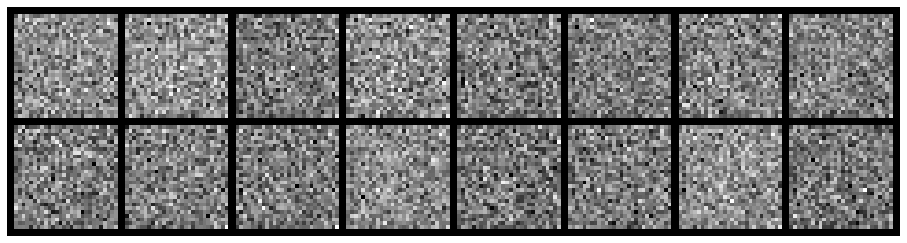

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3657, Generator Loss: 0.6639
D(x): 0.5262, D(G(z)): 0.5148


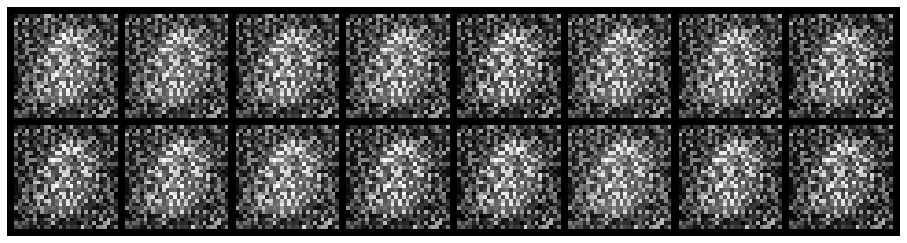

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 2.4095, Generator Loss: 0.3000
D(x): 0.8322, D(G(z)): 0.8805


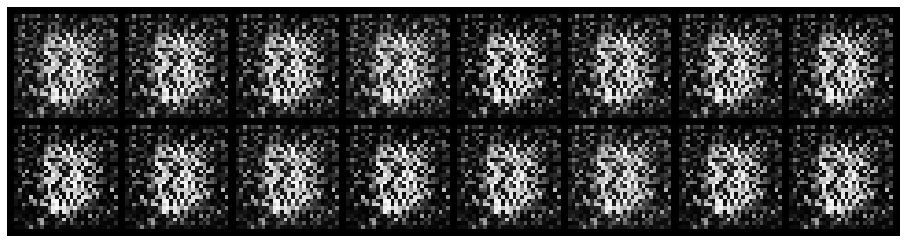

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.4765, Generator Loss: 2.5459
D(x): 0.7817, D(G(z)): 0.1873


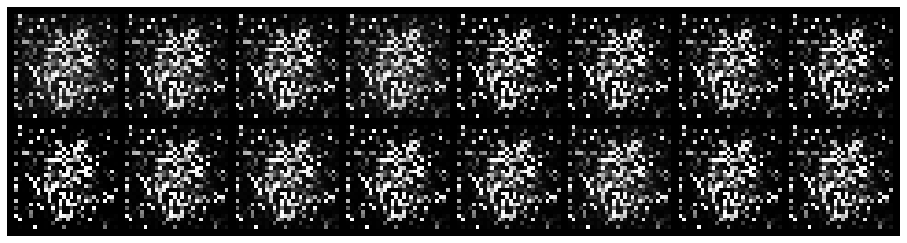

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.5043, Generator Loss: 5.4999
D(x): 0.8667, D(G(z)): 0.1819


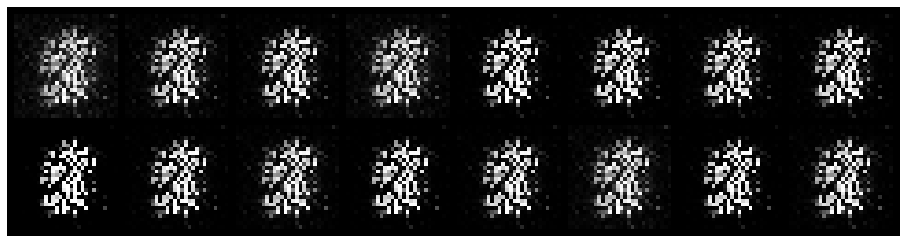

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.3416, Generator Loss: 2.2231
D(x): 0.8337, D(G(z)): 0.1409


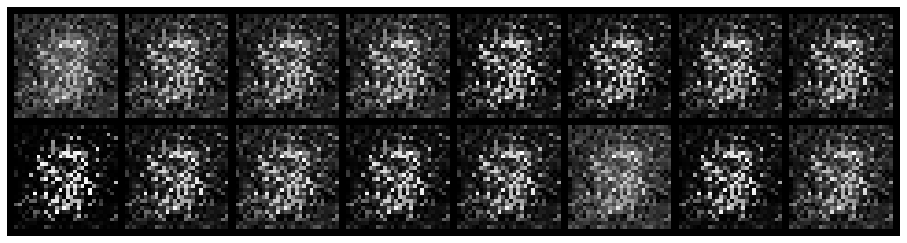

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 2.0136, Generator Loss: 0.4978
D(x): 0.5642, D(G(z)): 0.7212


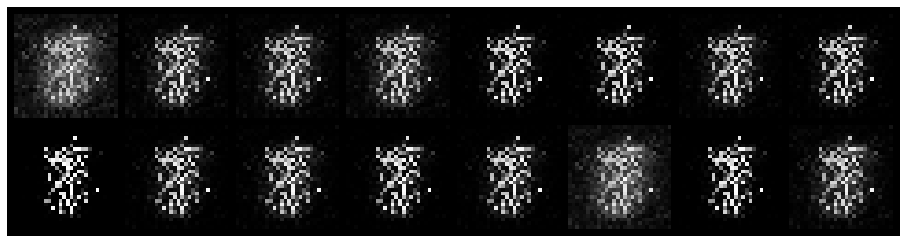

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 1.2806, Generator Loss: 2.0590
D(x): 0.6498, D(G(z)): 0.3960


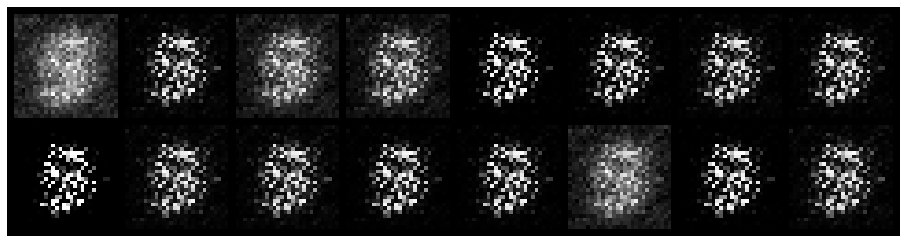

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 1.9061, Generator Loss: 1.6728
D(x): 0.4114, D(G(z)): 0.4265


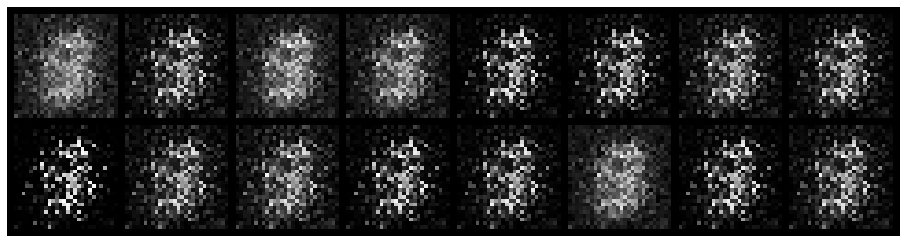

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 1.2546, Generator Loss: 3.1006
D(x): 0.5627, D(G(z)): 0.3332


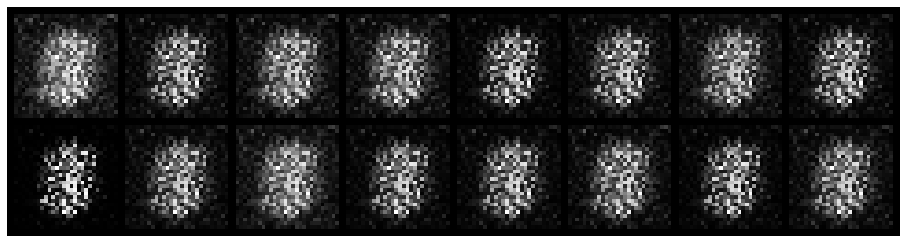

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 1.2967, Generator Loss: 0.8935
D(x): 0.5958, D(G(z)): 0.5065


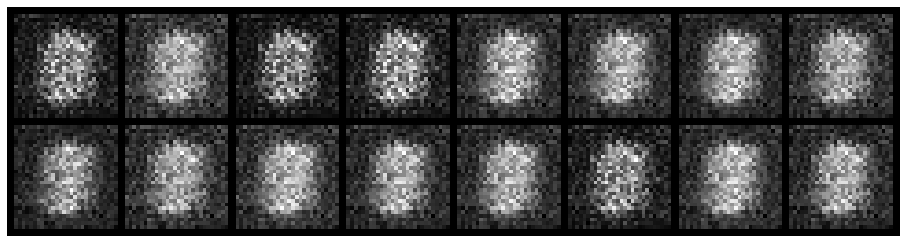

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 1.3458, Generator Loss: 0.6426
D(x): 0.6134, D(G(z)): 0.5588


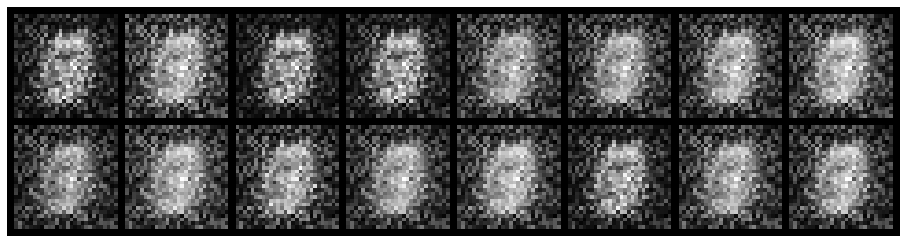

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.2917, Generator Loss: 0.6129
D(x): 0.6124, D(G(z)): 0.5474


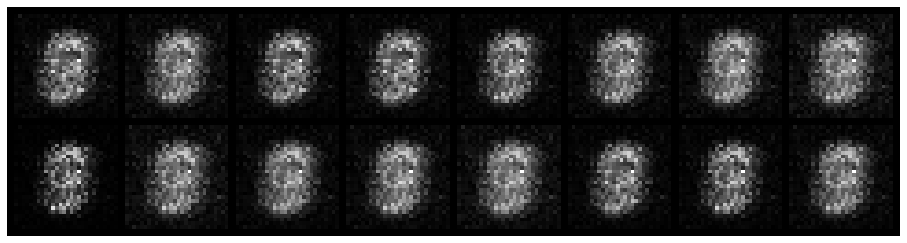

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.5851, Generator Loss: 0.6393
D(x): 0.5405, D(G(z)): 0.5757


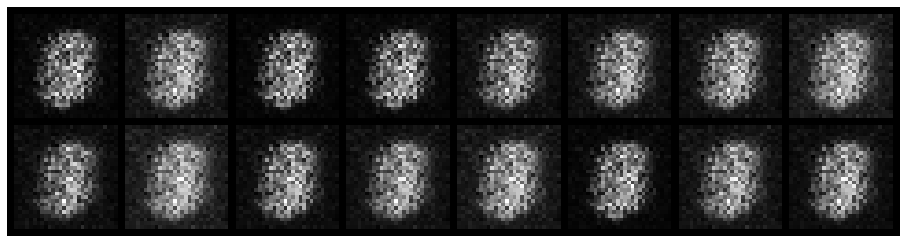

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.1076, Generator Loss: 0.8678
D(x): 0.6253, D(G(z)): 0.4590


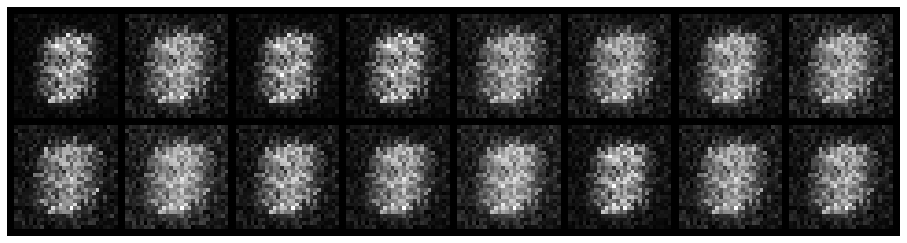

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 1.6737, Generator Loss: 0.7029
D(x): 0.4887, D(G(z)): 0.5623


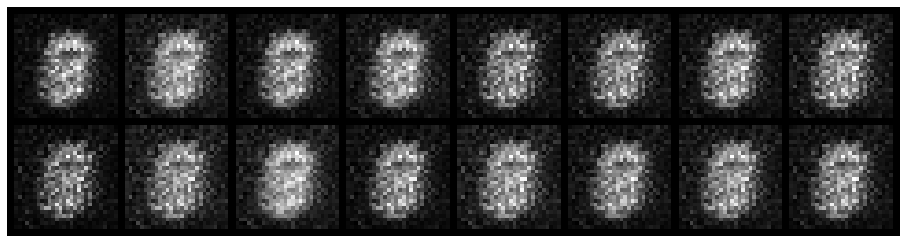

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.7371, Generator Loss: 1.5254
D(x): 0.7585, D(G(z)): 0.3127


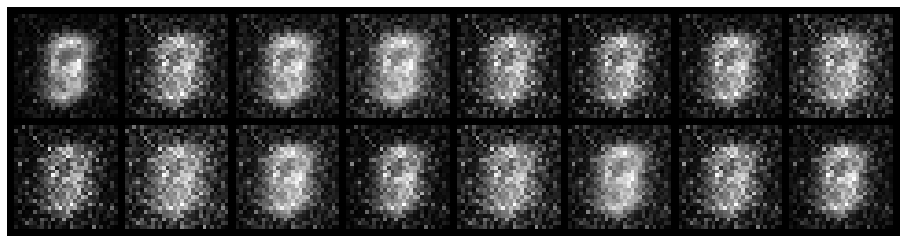

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.6294, Generator Loss: 2.3131
D(x): 0.8010, D(G(z)): 0.2302


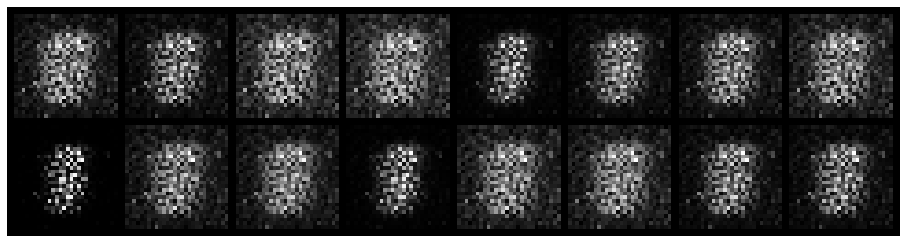

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.6737, Generator Loss: 2.9146
D(x): 0.8108, D(G(z)): 0.2766


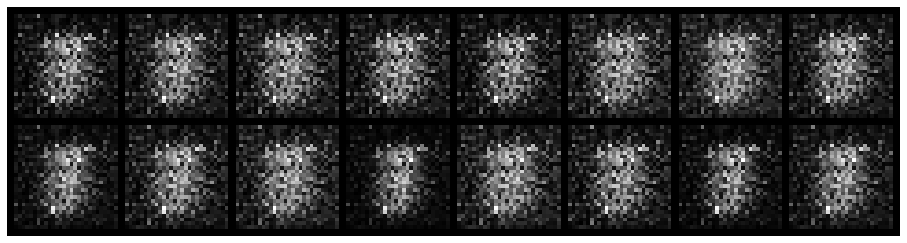

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 1.1264, Generator Loss: 2.0777
D(x): 0.7459, D(G(z)): 0.3105


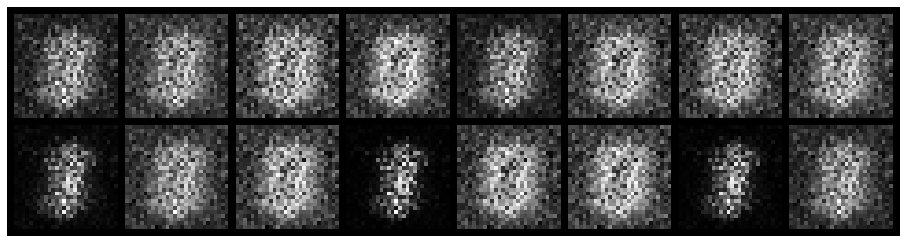

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.4476, Generator Loss: 2.4049
D(x): 0.8564, D(G(z)): 0.1714


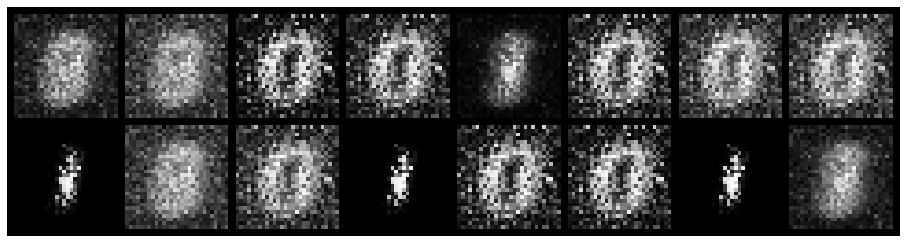

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 1.3297, Generator Loss: 2.2653
D(x): 0.6598, D(G(z)): 0.3224


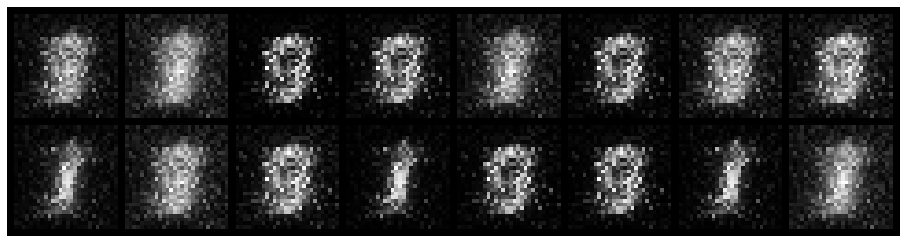

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.5216, Generator Loss: 2.1292
D(x): 0.8473, D(G(z)): 0.1728


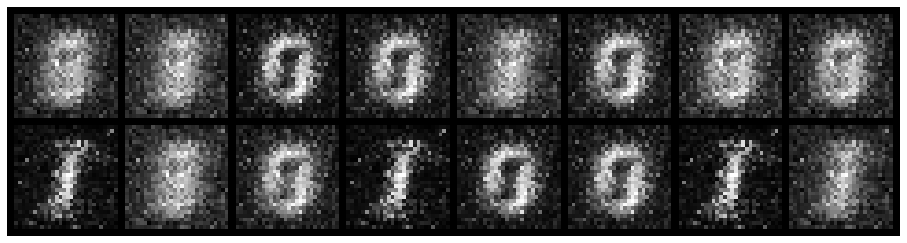

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.4745, Generator Loss: 2.2884
D(x): 0.8553, D(G(z)): 0.1806


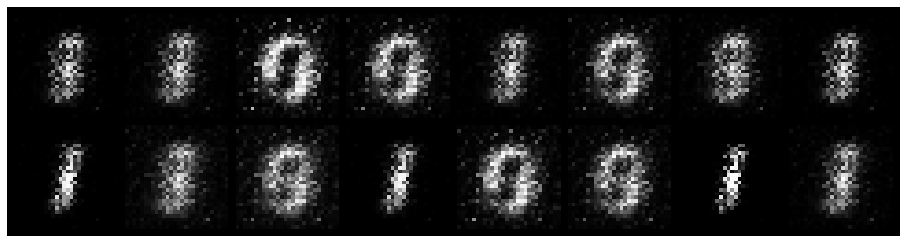

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.6891, Generator Loss: 2.2336
D(x): 0.8061, D(G(z)): 0.1905


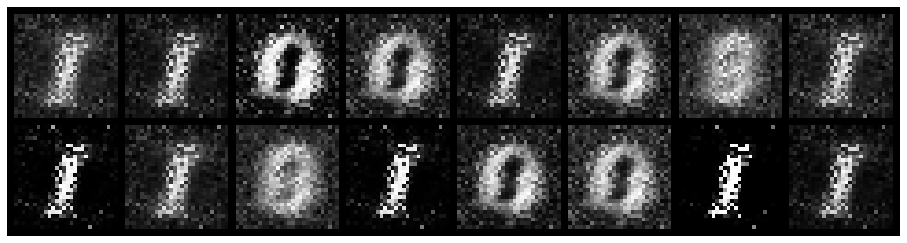

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.4037, Generator Loss: 3.3838
D(x): 0.9076, D(G(z)): 0.1503


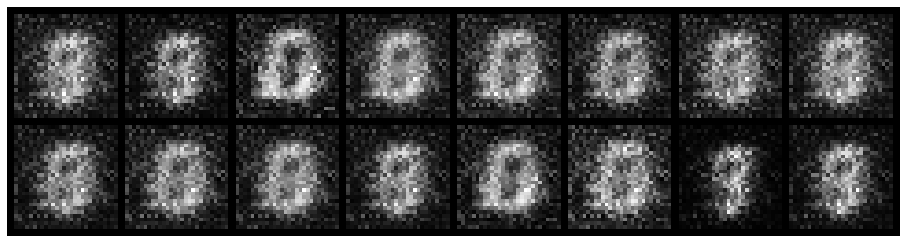

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.5259, Generator Loss: 3.3984
D(x): 0.8701, D(G(z)): 0.1502


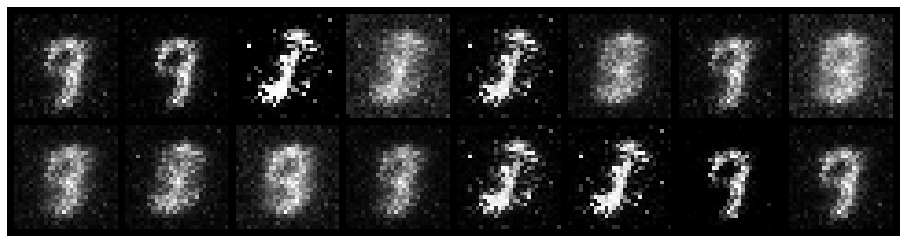

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.6133, Generator Loss: 2.9240
D(x): 0.8871, D(G(z)): 0.2144


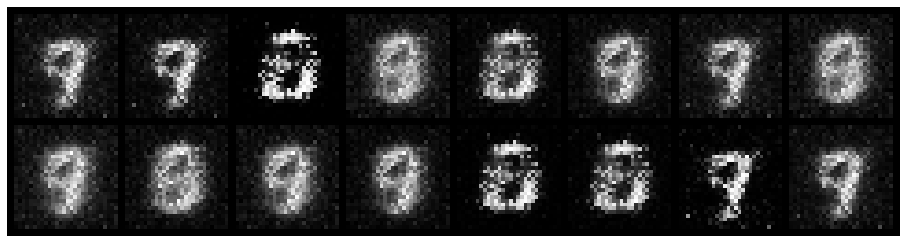

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.7041, Generator Loss: 2.3286
D(x): 0.8309, D(G(z)): 0.2028


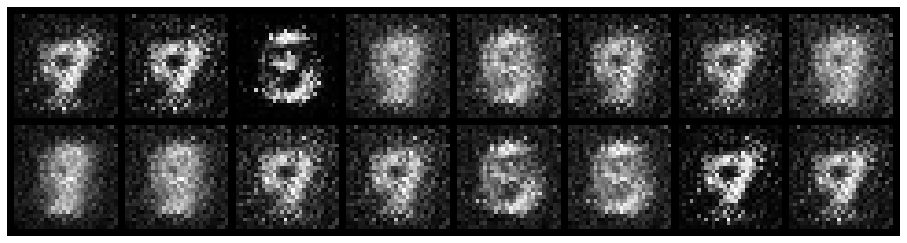

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.8683, Generator Loss: 2.2599
D(x): 0.7345, D(G(z)): 0.2118


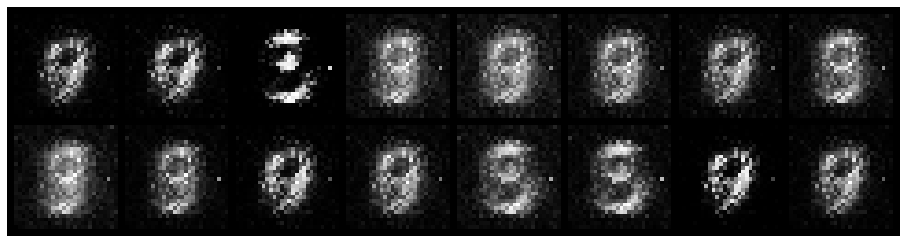

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.8396, Generator Loss: 2.4309
D(x): 0.7945, D(G(z)): 0.2278


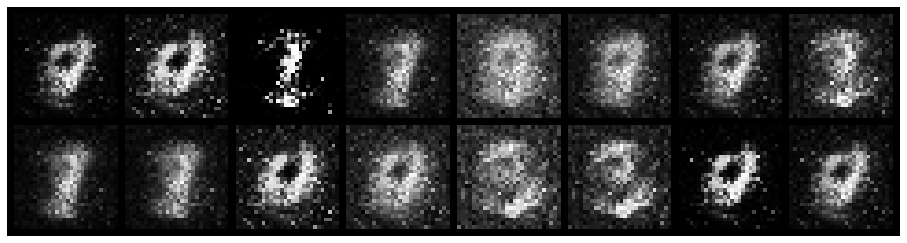

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.2813, Generator Loss: 3.2863
D(x): 0.8915, D(G(z)): 0.0944


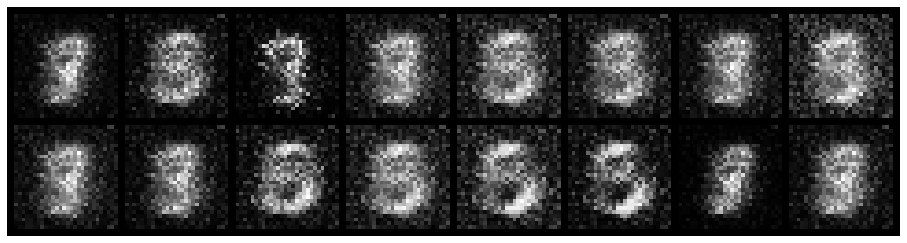

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.4807, Generator Loss: 2.6501
D(x): 0.8306, D(G(z)): 0.1359


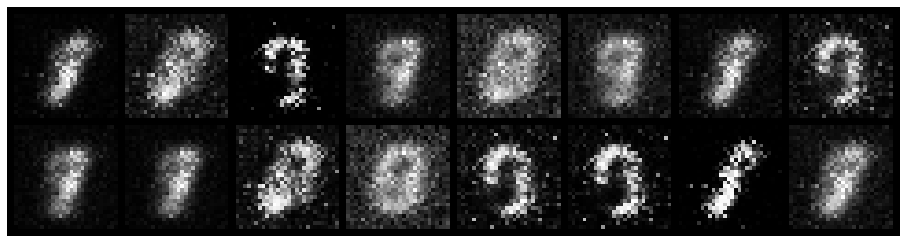

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.5290, Generator Loss: 2.9937
D(x): 0.8361, D(G(z)): 0.2000


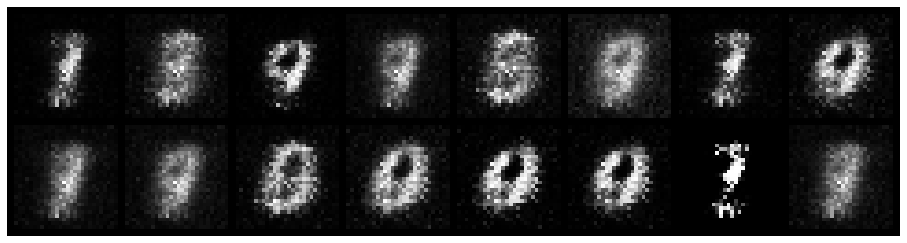

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.5558, Generator Loss: 2.0716
D(x): 0.8842, D(G(z)): 0.2625


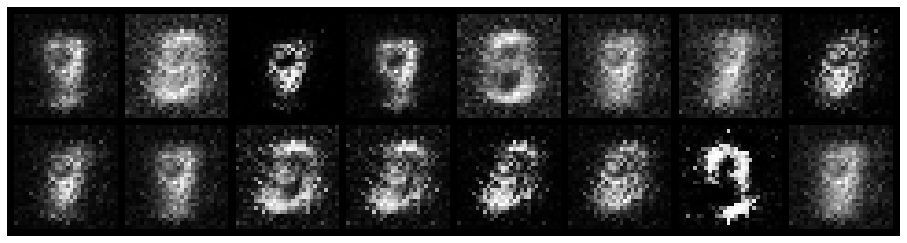

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.4419, Generator Loss: 3.1570
D(x): 0.8278, D(G(z)): 0.0686


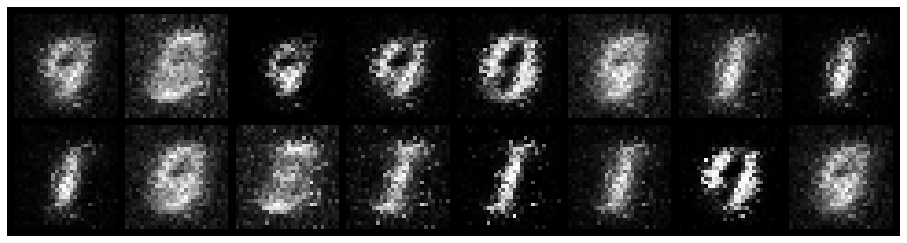

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.3163, Generator Loss: 2.9453
D(x): 0.9044, D(G(z)): 0.1176


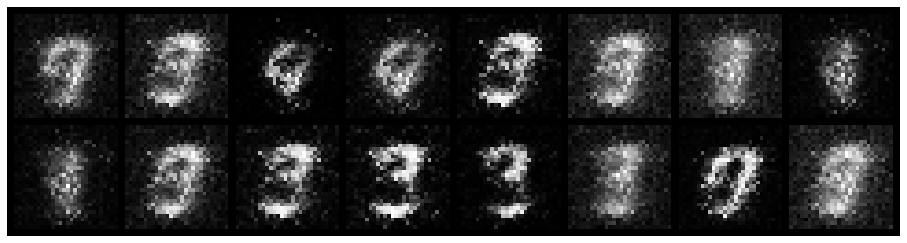

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.5922, Generator Loss: 3.5131
D(x): 0.7882, D(G(z)): 0.0842


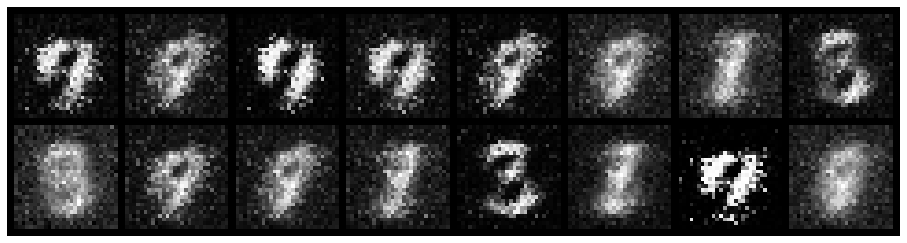

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.4352, Generator Loss: 3.1249
D(x): 0.8891, D(G(z)): 0.1713


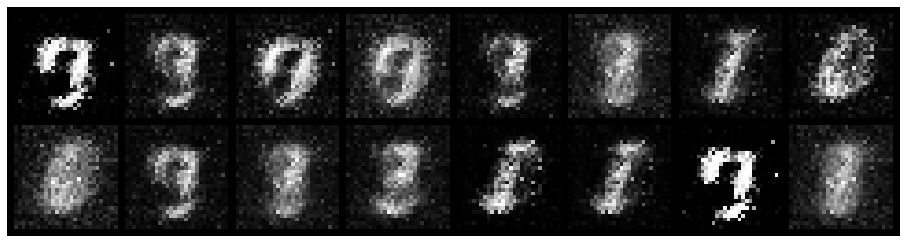

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.4622, Generator Loss: 2.4650
D(x): 0.8795, D(G(z)): 0.1831


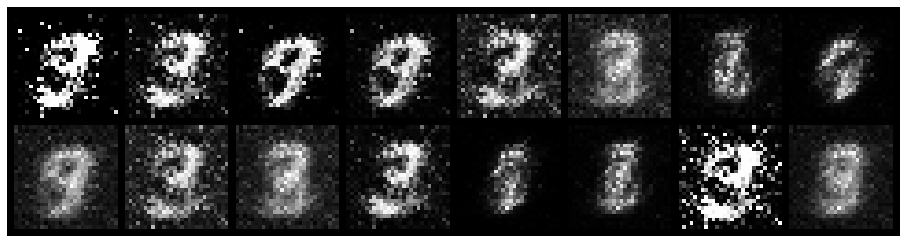

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.5404, Generator Loss: 3.2207
D(x): 0.8283, D(G(z)): 0.1330


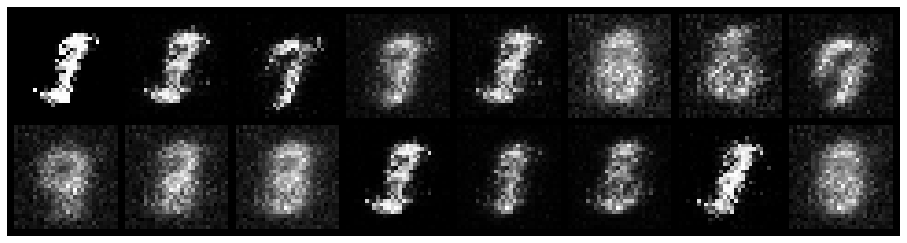

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.3161, Generator Loss: 3.3769
D(x): 0.9220, D(G(z)): 0.1349


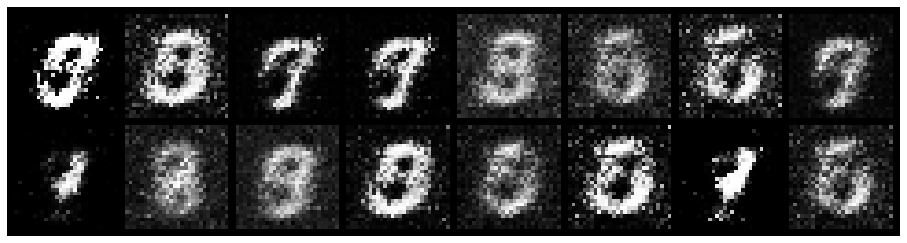

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.4656, Generator Loss: 2.2972
D(x): 0.8894, D(G(z)): 0.2280


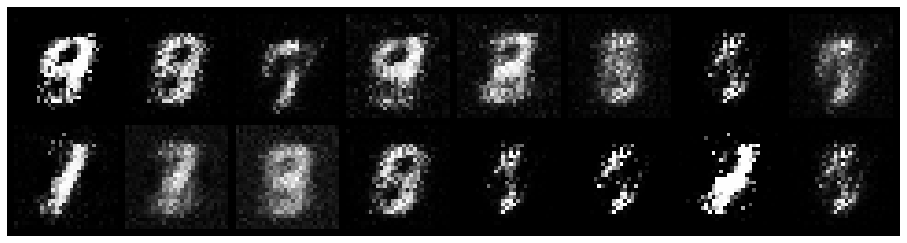

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.2807, Generator Loss: 3.1712
D(x): 0.9191, D(G(z)): 0.1207


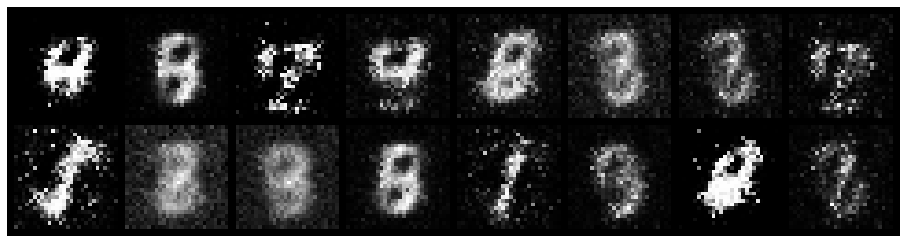

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.5518, Generator Loss: 2.1400
D(x): 0.8667, D(G(z)): 0.2541


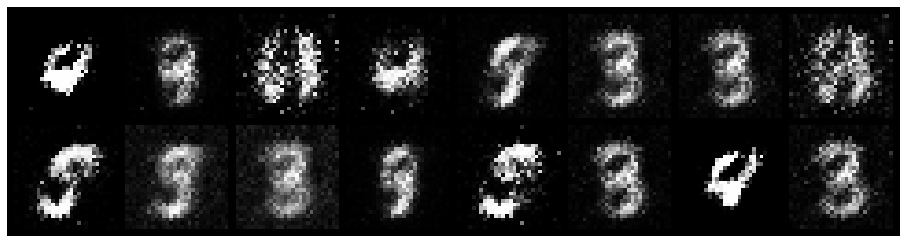

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.5936, Generator Loss: 2.3145
D(x): 0.8624, D(G(z)): 0.2383


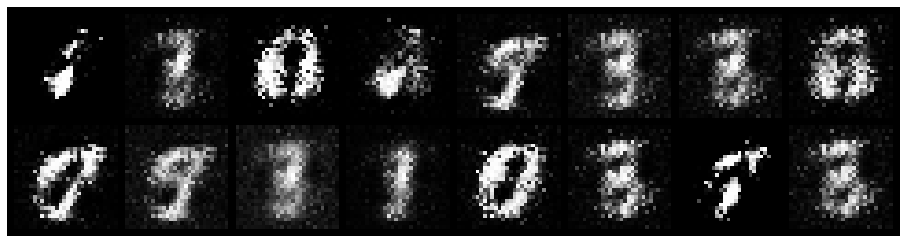

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.8149, Generator Loss: 2.4963
D(x): 0.8798, D(G(z)): 0.3511


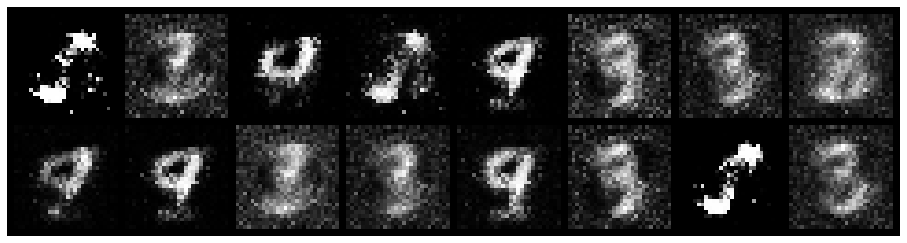

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.7561, Generator Loss: 2.7591
D(x): 0.7638, D(G(z)): 0.1917


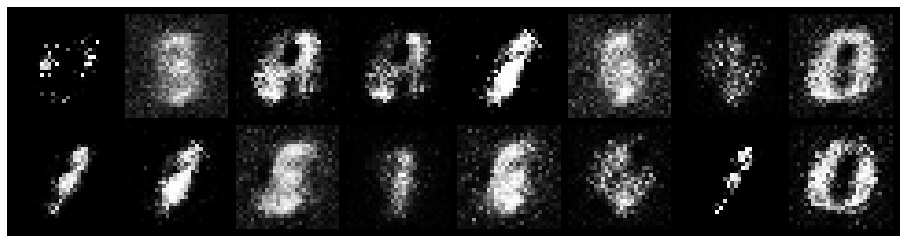

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.5199, Generator Loss: 2.4491
D(x): 0.8154, D(G(z)): 0.1436


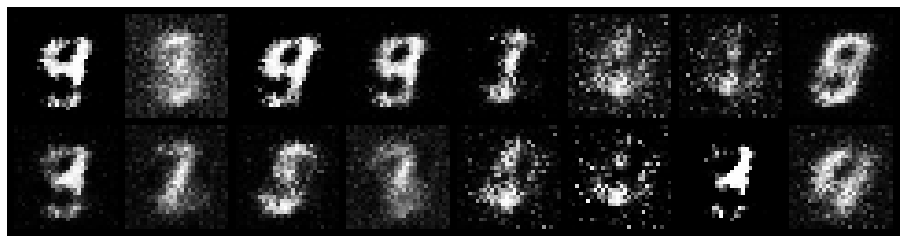

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.9072, Generator Loss: 2.8718
D(x): 0.7264, D(G(z)): 0.2038


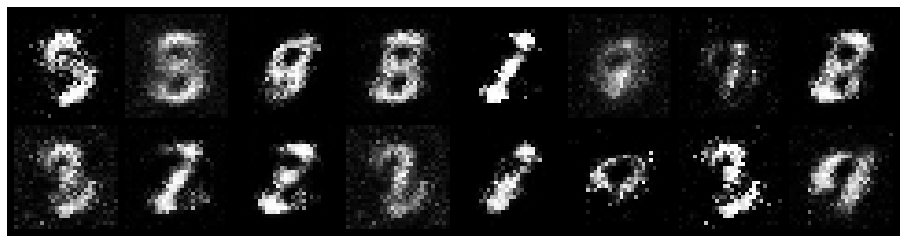

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.6688, Generator Loss: 2.8333
D(x): 0.8147, D(G(z)): 0.1989


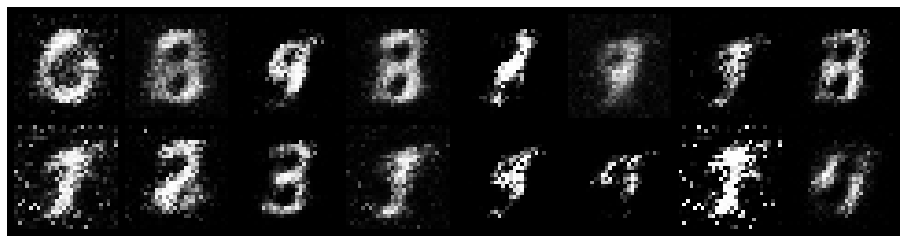

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.7209, Generator Loss: 2.0259
D(x): 0.7910, D(G(z)): 0.2321


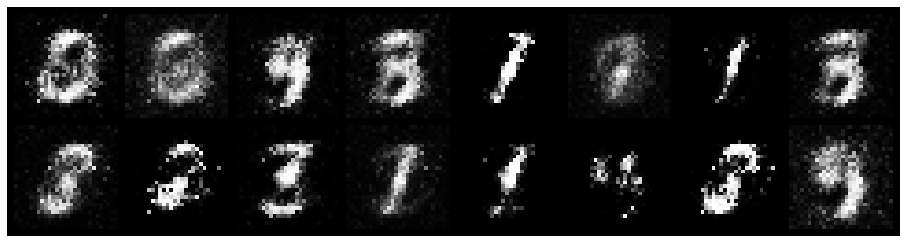

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.6843, Generator Loss: 2.2012
D(x): 0.8265, D(G(z)): 0.2806


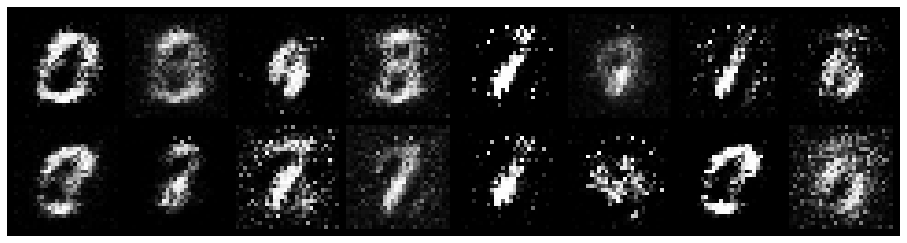

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.7219, Generator Loss: 2.8740
D(x): 0.7637, D(G(z)): 0.1471


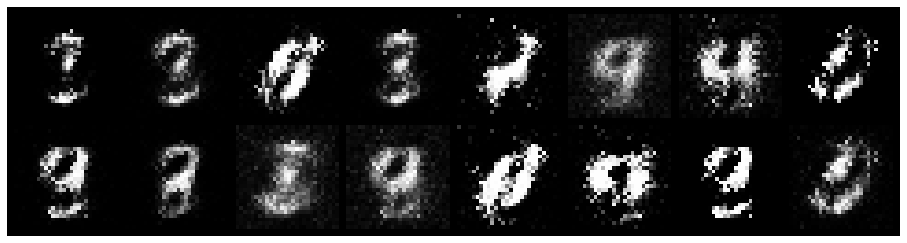

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.4556, Generator Loss: 2.4985
D(x): 0.8523, D(G(z)): 0.1785


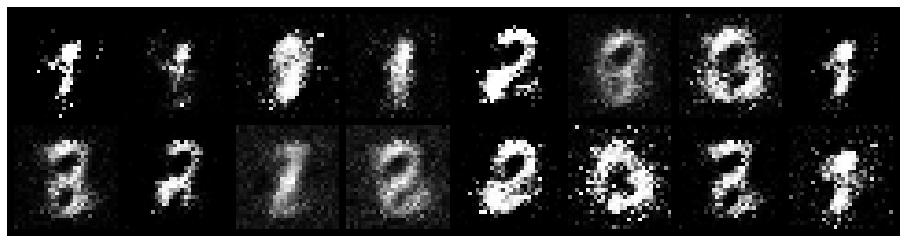

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 1.0457, Generator Loss: 1.2969
D(x): 0.7420, D(G(z)): 0.3787


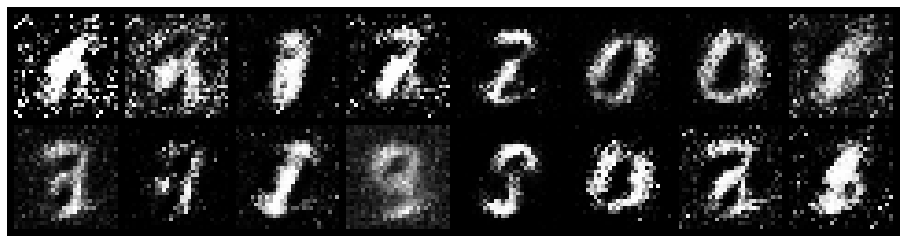

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.5253, Generator Loss: 3.3409
D(x): 0.8199, D(G(z)): 0.1340


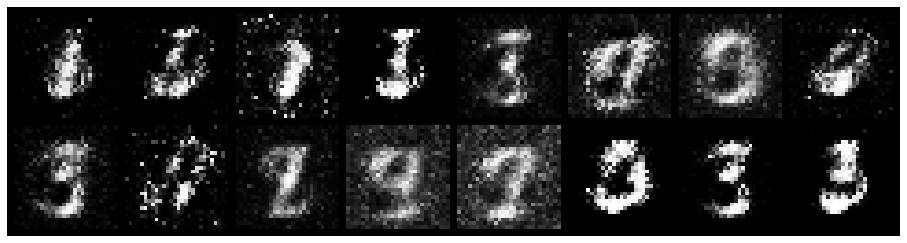

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.5357, Generator Loss: 2.7710
D(x): 0.7844, D(G(z)): 0.1472


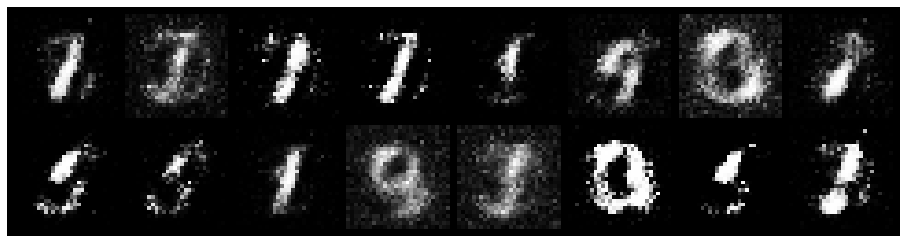

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.7639, Generator Loss: 2.5418
D(x): 0.7842, D(G(z)): 0.2186


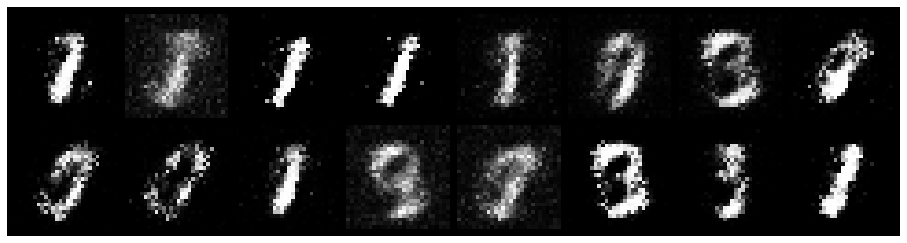

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.8105, Generator Loss: 2.5676
D(x): 0.7145, D(G(z)): 0.1605


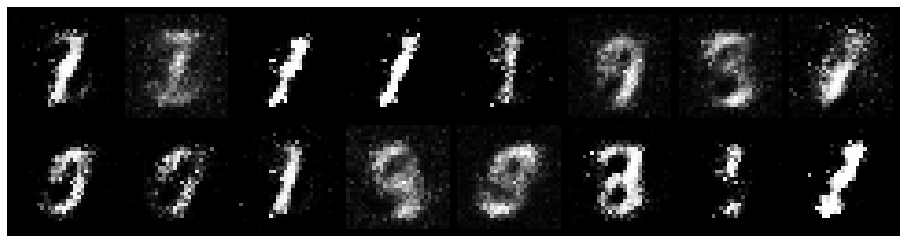

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.7913, Generator Loss: 3.1791
D(x): 0.8518, D(G(z)): 0.2785


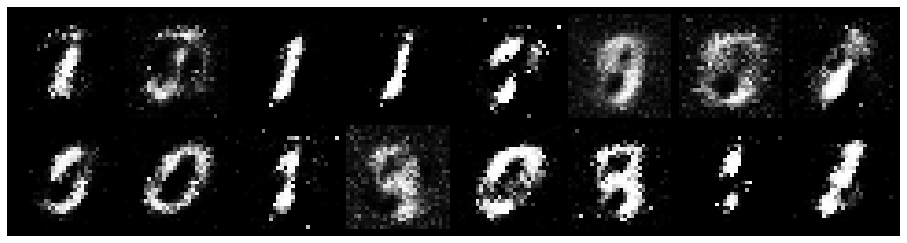

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.6061, Generator Loss: 3.7031
D(x): 0.7804, D(G(z)): 0.1041


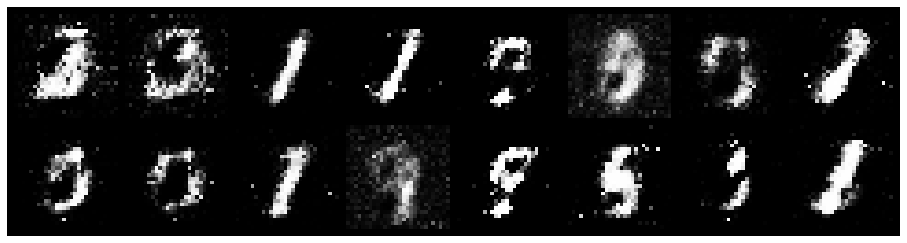

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.6651, Generator Loss: 3.2489
D(x): 0.8059, D(G(z)): 0.1764


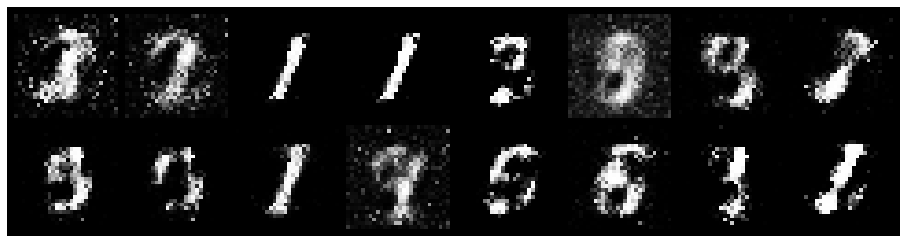

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.4130, Generator Loss: 2.7525
D(x): 0.8492, D(G(z)): 0.1009


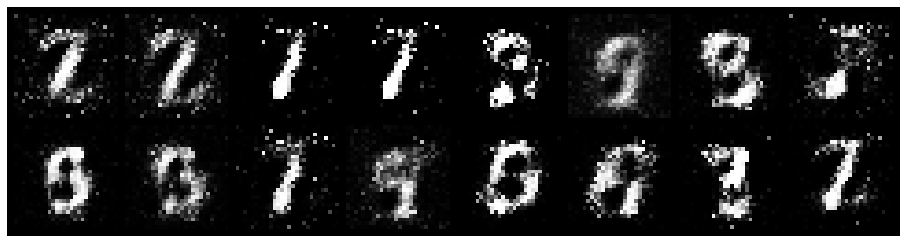

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.3885, Generator Loss: 3.1944
D(x): 0.8406, D(G(z)): 0.1022


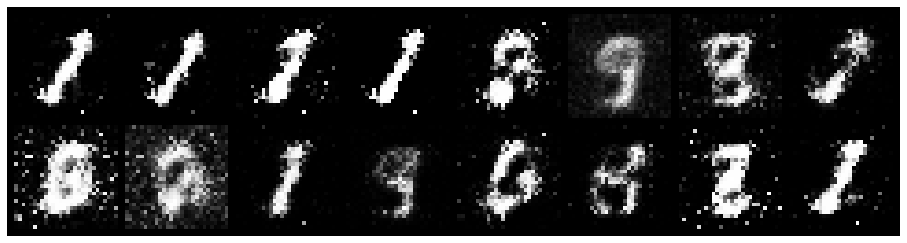

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.6730, Generator Loss: 2.8609
D(x): 0.7796, D(G(z)): 0.1381


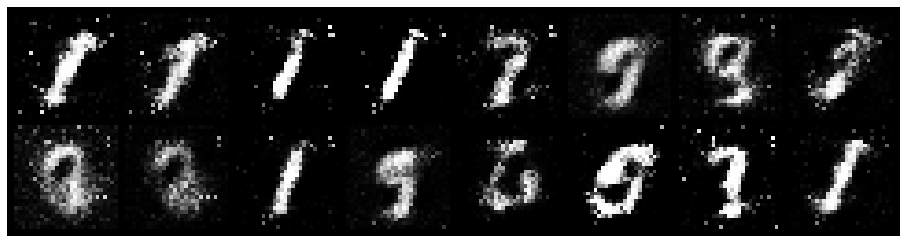

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.4181, Generator Loss: 2.7872
D(x): 0.8579, D(G(z)): 0.1231


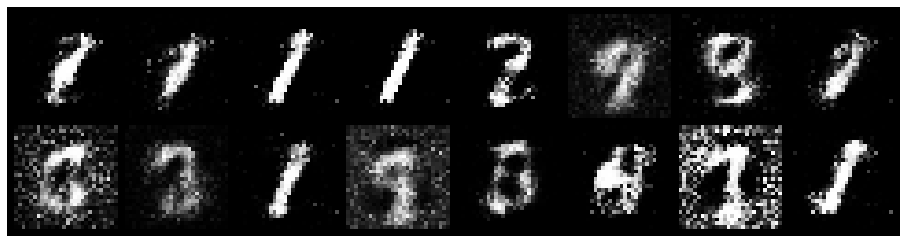

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.5225, Generator Loss: 3.1759
D(x): 0.8359, D(G(z)): 0.1680


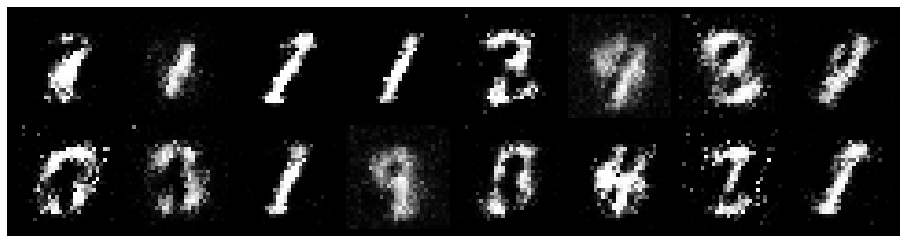

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.5285, Generator Loss: 2.7199
D(x): 0.8077, D(G(z)): 0.1562


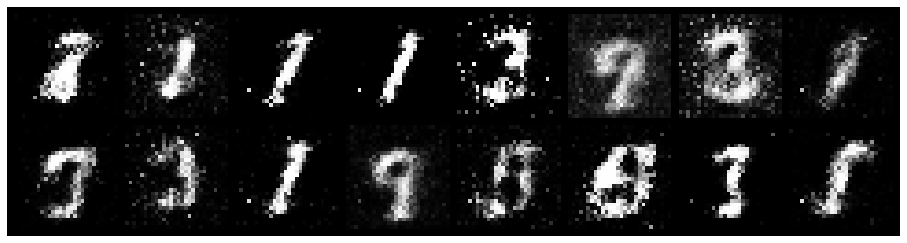

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.9497, Generator Loss: 2.4671
D(x): 0.6534, D(G(z)): 0.1749


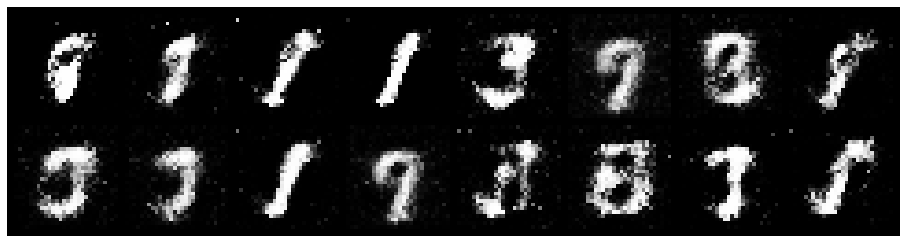

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.6972, Generator Loss: 2.8288
D(x): 0.7106, D(G(z)): 0.1028


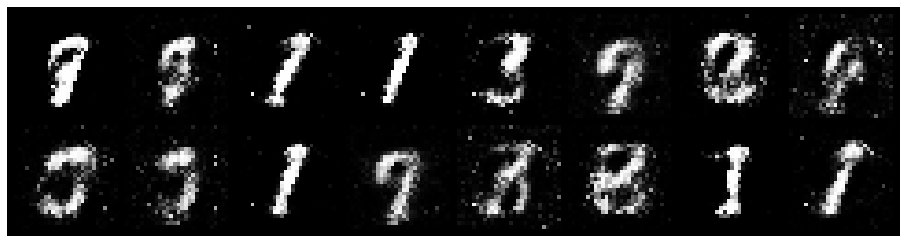

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.4326, Generator Loss: 2.6496
D(x): 0.9017, D(G(z)): 0.2092


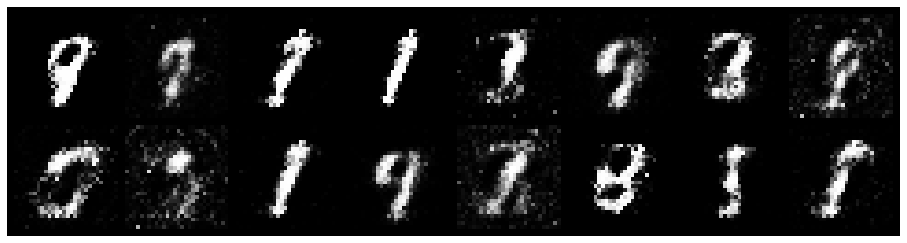

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.7274, Generator Loss: 2.2334
D(x): 0.7111, D(G(z)): 0.1577


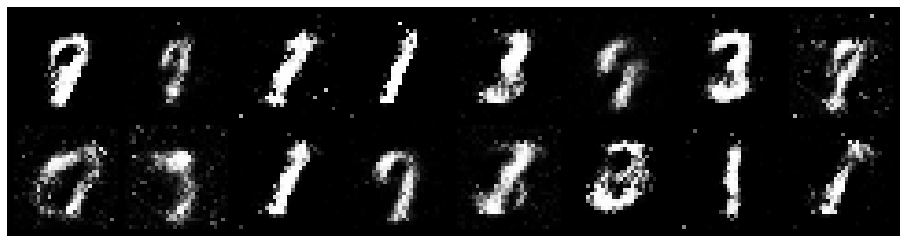

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.9718, Generator Loss: 2.1172
D(x): 0.6730, D(G(z)): 0.1753


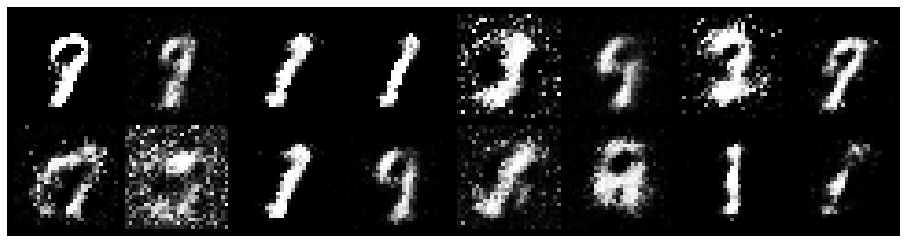

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.8556, Generator Loss: 1.5000
D(x): 0.7563, D(G(z)): 0.2676


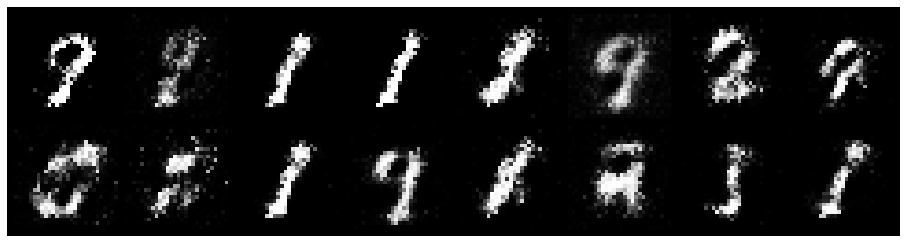

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.8065, Generator Loss: 2.0121
D(x): 0.7408, D(G(z)): 0.2473


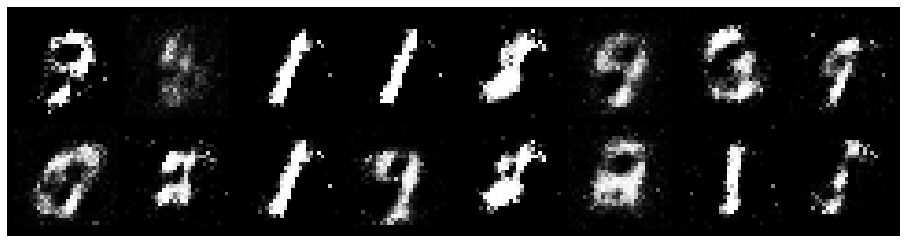

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.5891, Generator Loss: 2.5427
D(x): 0.7841, D(G(z)): 0.1529


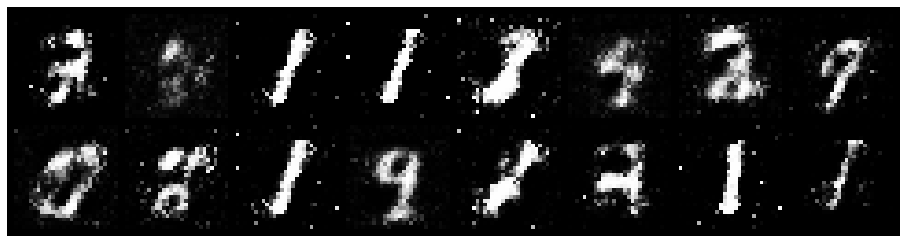

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.4278, Generator Loss: 2.4972
D(x): 0.8905, D(G(z)): 0.1930


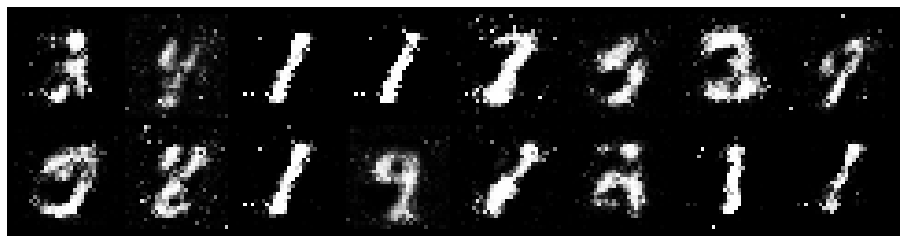

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.5866, Generator Loss: 1.7569
D(x): 0.8580, D(G(z)): 0.2658


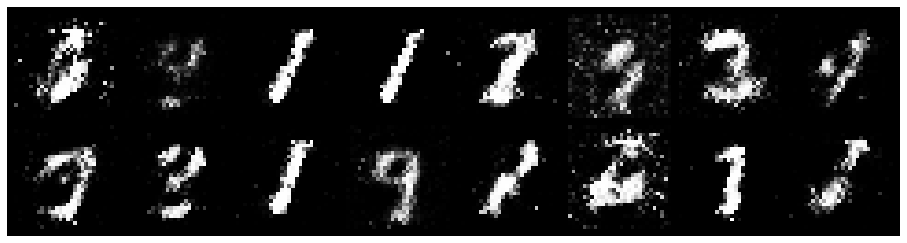

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.5904, Generator Loss: 1.7800
D(x): 0.8265, D(G(z)): 0.2542


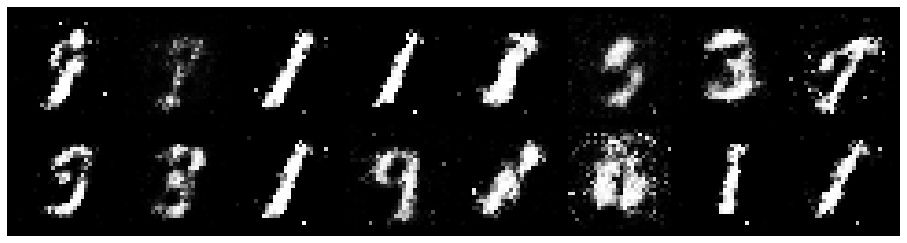

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.5609, Generator Loss: 2.6549
D(x): 0.7986, D(G(z)): 0.1646


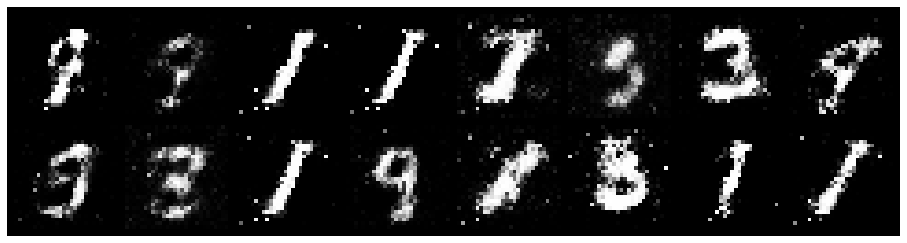

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.6884, Generator Loss: 1.4109
D(x): 0.7501, D(G(z)): 0.2175


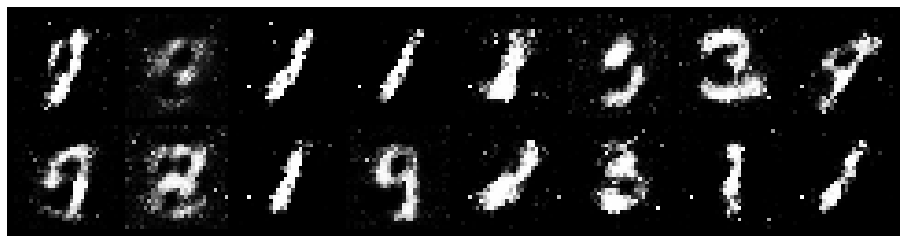

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.9336, Generator Loss: 1.9369
D(x): 0.6656, D(G(z)): 0.2051


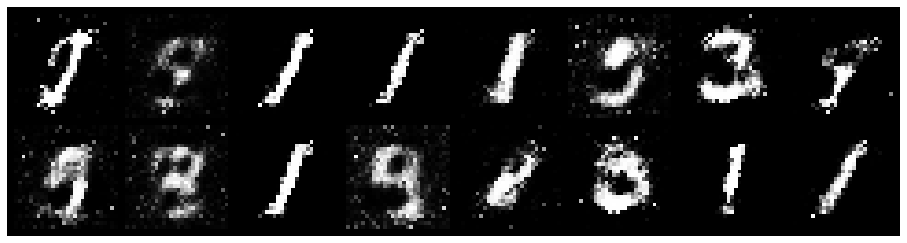

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.6890, Generator Loss: 2.5199
D(x): 0.8045, D(G(z)): 0.2347


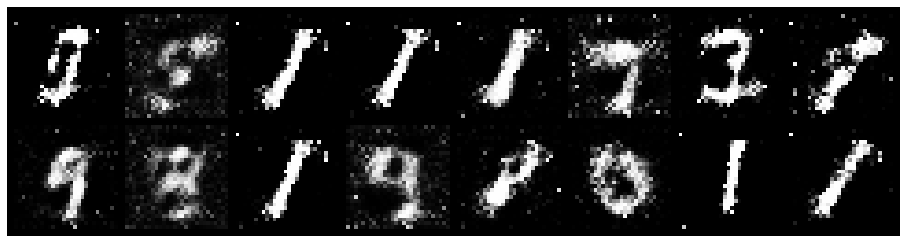

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.8069, Generator Loss: 2.1396
D(x): 0.7231, D(G(z)): 0.2364


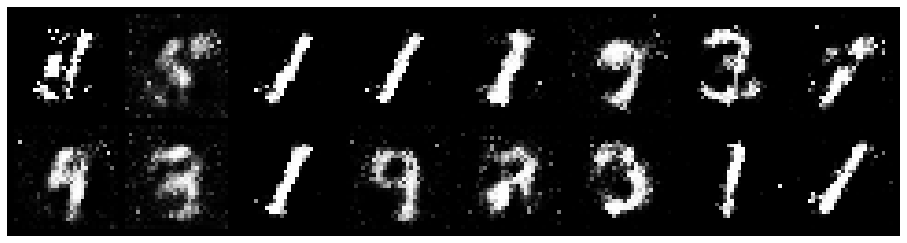

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.4716, Generator Loss: 2.0923
D(x): 0.8295, D(G(z)): 0.1680


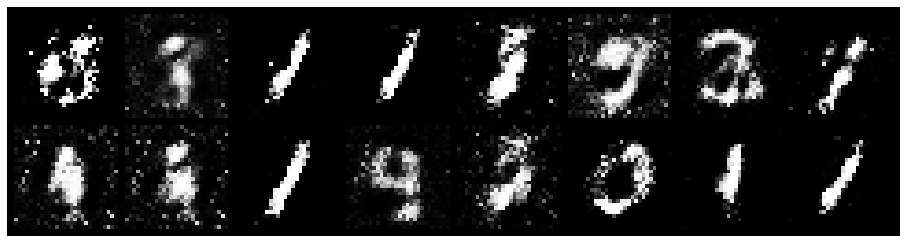

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.8998, Generator Loss: 1.5595
D(x): 0.7338, D(G(z)): 0.3007


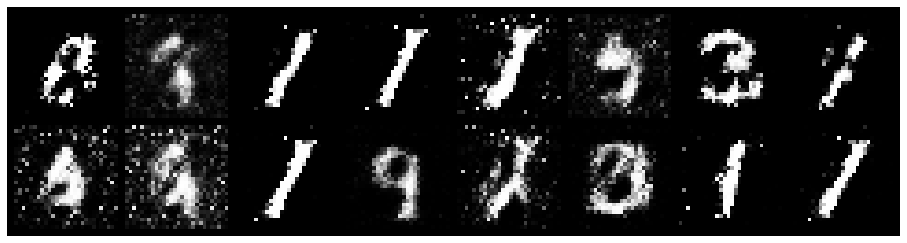

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.7924, Generator Loss: 2.1412
D(x): 0.7134, D(G(z)): 0.2053


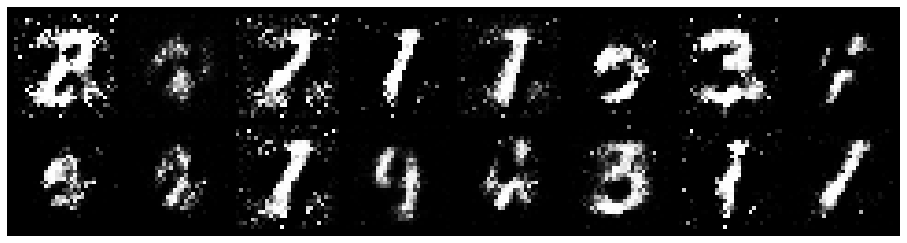

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.8781, Generator Loss: 1.6137
D(x): 0.7084, D(G(z)): 0.2675


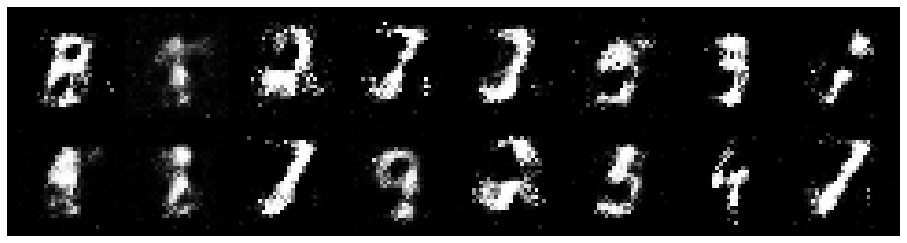

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.9004, Generator Loss: 1.5369
D(x): 0.7091, D(G(z)): 0.2878


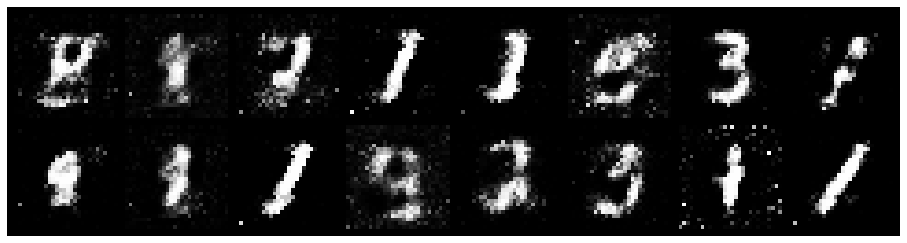

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.6889, Generator Loss: 1.9438
D(x): 0.7814, D(G(z)): 0.2281


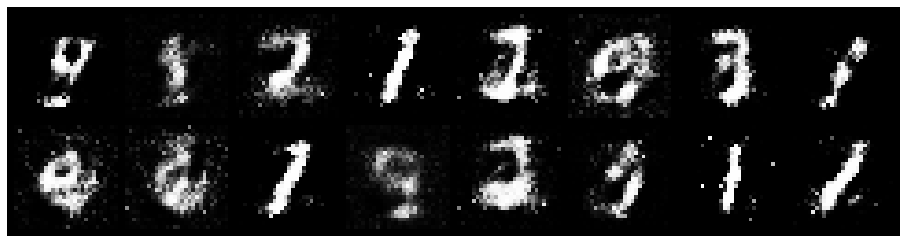

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.7129, Generator Loss: 1.7491
D(x): 0.7186, D(G(z)): 0.1690


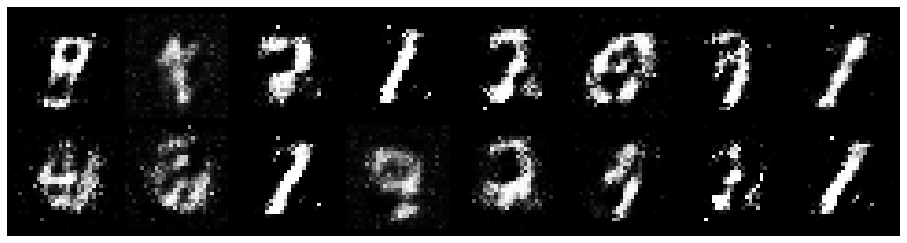

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 1.0113, Generator Loss: 1.4221
D(x): 0.7996, D(G(z)): 0.3829


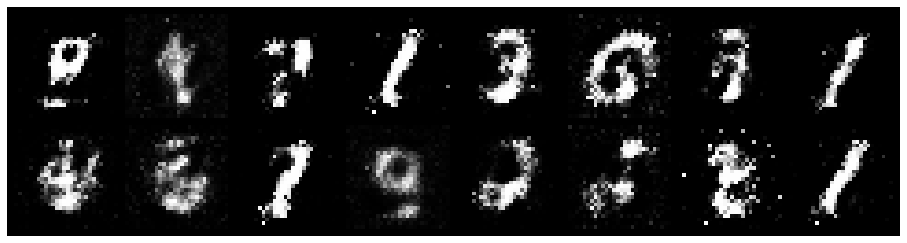

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.7928, Generator Loss: 2.2437
D(x): 0.7228, D(G(z)): 0.2326


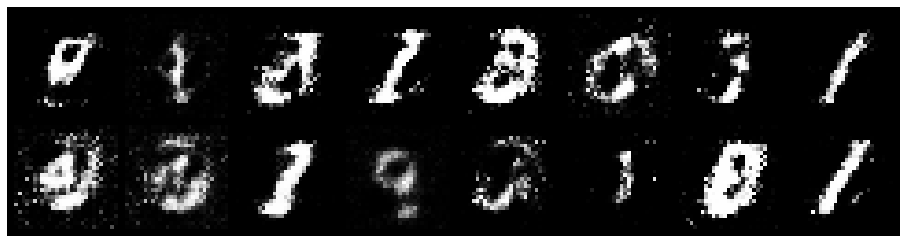

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.6993, Generator Loss: 2.5574
D(x): 0.7725, D(G(z)): 0.1804


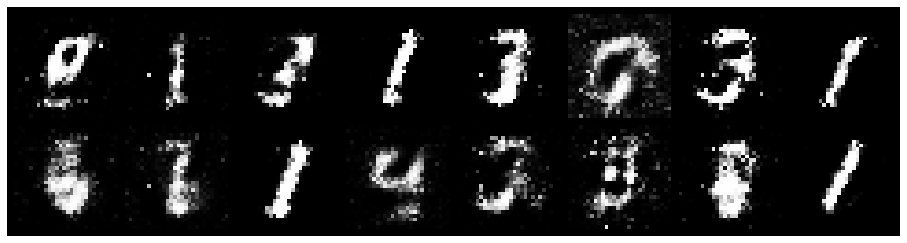

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.7255, Generator Loss: 2.3263
D(x): 0.7351, D(G(z)): 0.2051


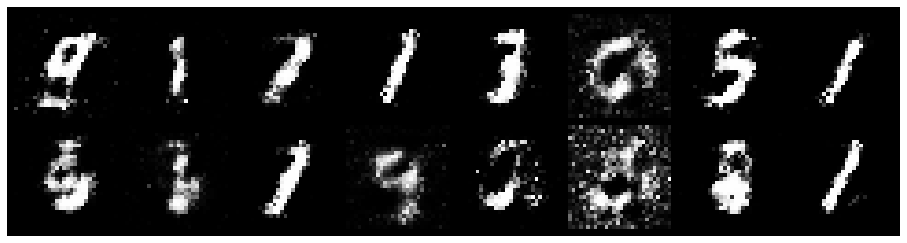

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.7759, Generator Loss: 2.1891
D(x): 0.7353, D(G(z)): 0.2099


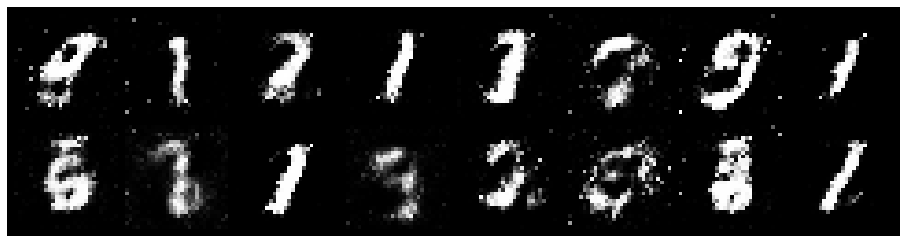

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.6673, Generator Loss: 1.9215
D(x): 0.7561, D(G(z)): 0.1938


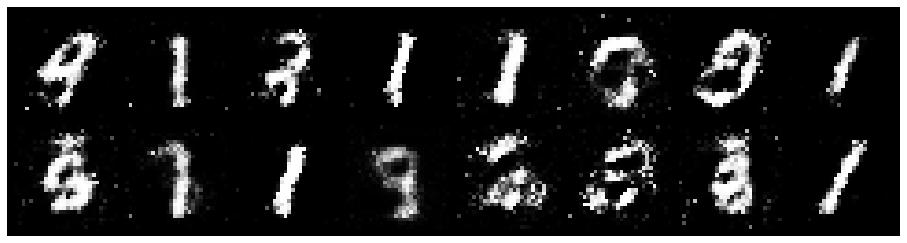

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.8384, Generator Loss: 1.5008
D(x): 0.6830, D(G(z)): 0.2082


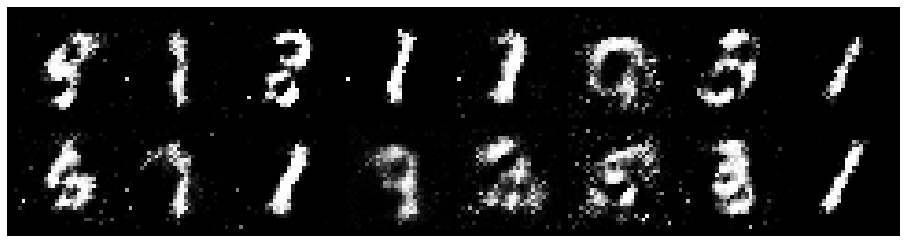

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.8815, Generator Loss: 1.4956
D(x): 0.7255, D(G(z)): 0.3064


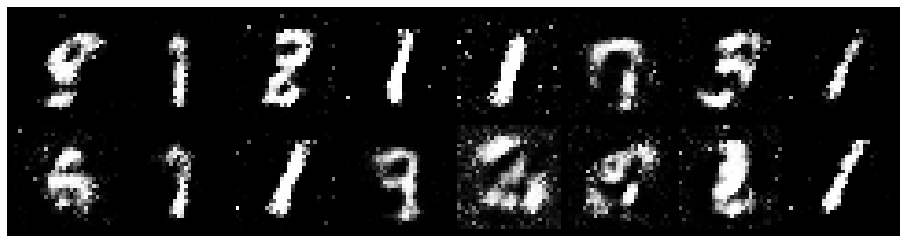

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.8079, Generator Loss: 2.0127
D(x): 0.7704, D(G(z)): 0.2754


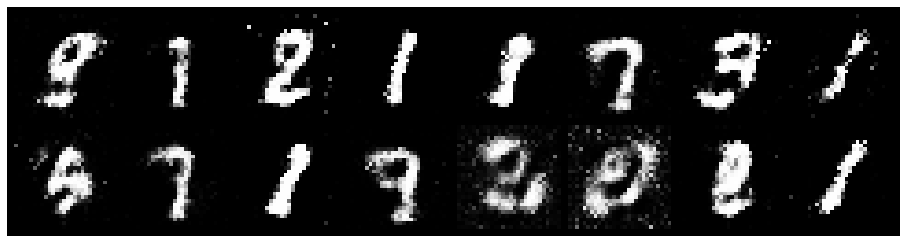

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.9457, Generator Loss: 2.3016
D(x): 0.6969, D(G(z)): 0.2418


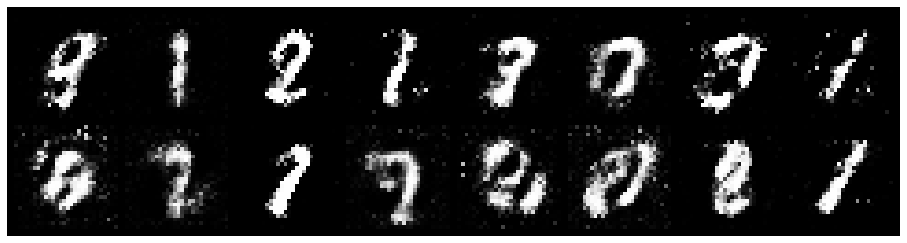

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 1.1106, Generator Loss: 1.8178
D(x): 0.6970, D(G(z)): 0.3361


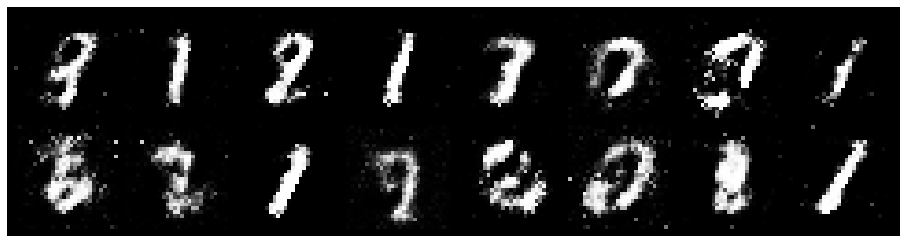

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.8912, Generator Loss: 1.7891
D(x): 0.6373, D(G(z)): 0.1715


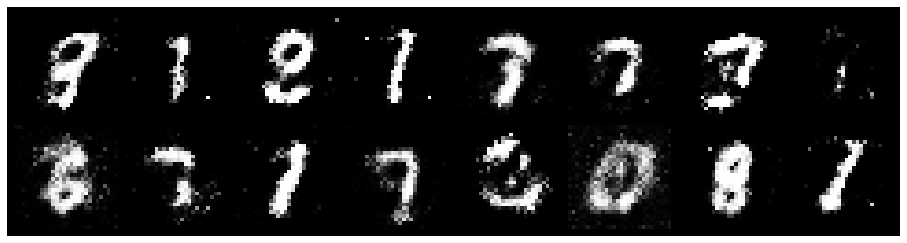

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.7654, Generator Loss: 2.2279
D(x): 0.7859, D(G(z)): 0.2858


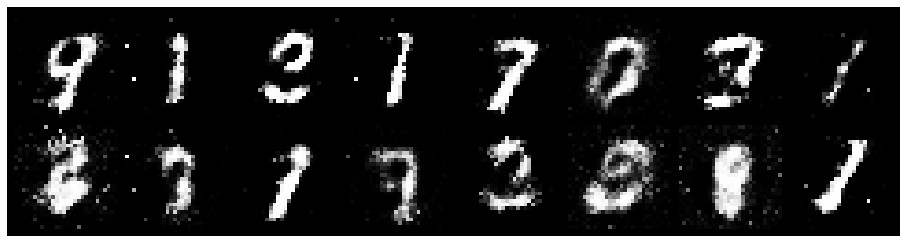

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 1.0353, Generator Loss: 1.6299
D(x): 0.5896, D(G(z)): 0.2308


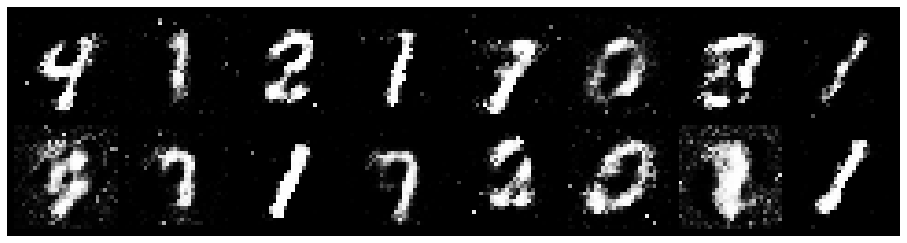

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 1.0369, Generator Loss: 1.3649
D(x): 0.7565, D(G(z)): 0.4264


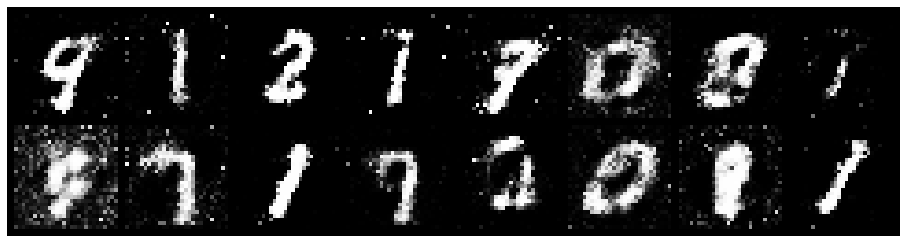

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 1.0222, Generator Loss: 1.0738
D(x): 0.7260, D(G(z)): 0.4026


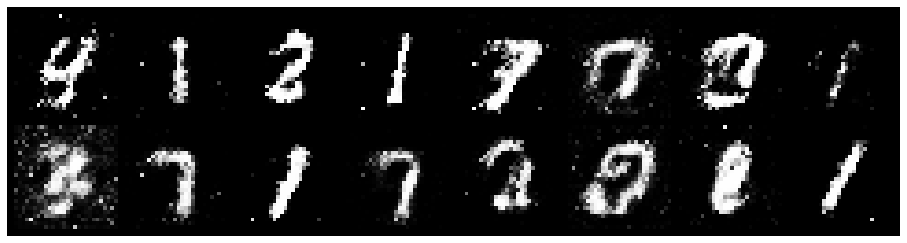

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.7431, Generator Loss: 1.6090
D(x): 0.7453, D(G(z)): 0.2274


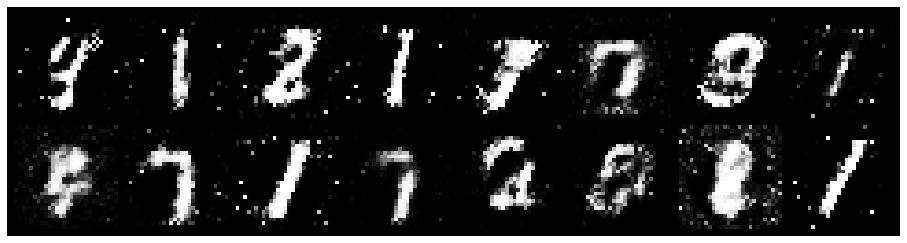

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.9857, Generator Loss: 1.4478
D(x): 0.6849, D(G(z)): 0.3018


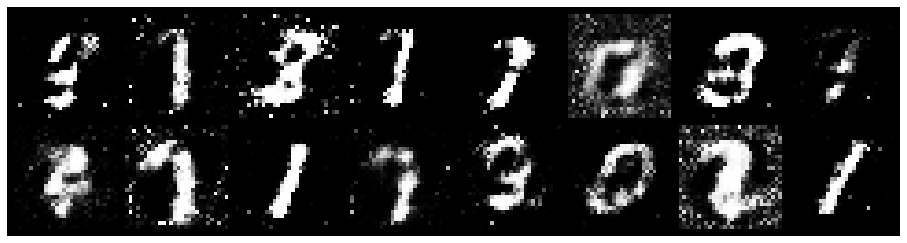

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.9744, Generator Loss: 1.5994
D(x): 0.6886, D(G(z)): 0.2557


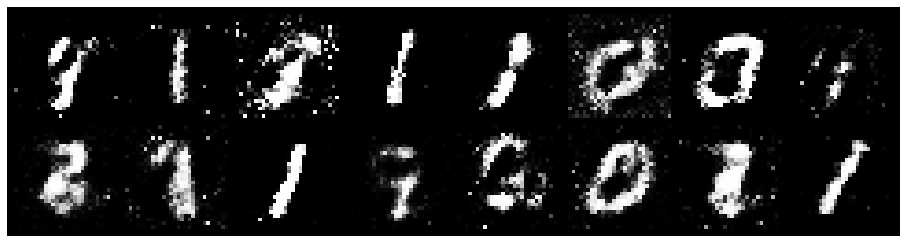

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.7647, Generator Loss: 1.5086
D(x): 0.7733, D(G(z)): 0.2902


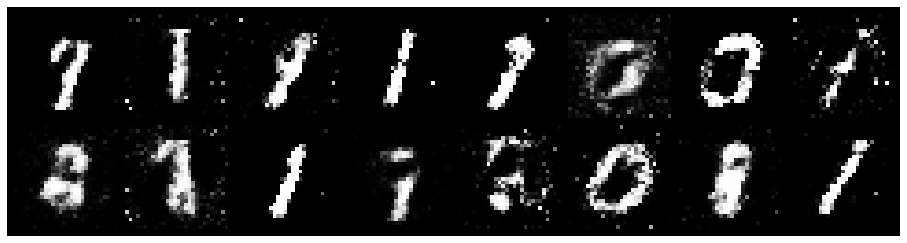

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.8884, Generator Loss: 1.3637
D(x): 0.7108, D(G(z)): 0.3093


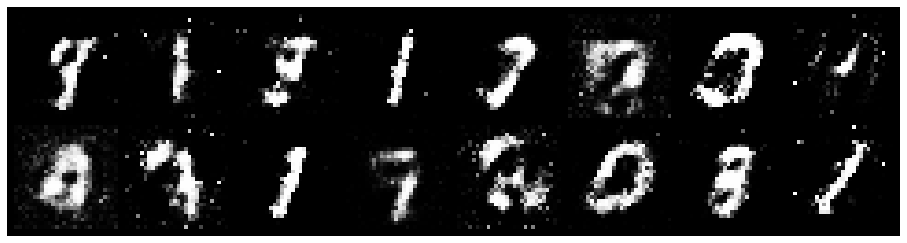

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.9285, Generator Loss: 1.9557
D(x): 0.7067, D(G(z)): 0.3232


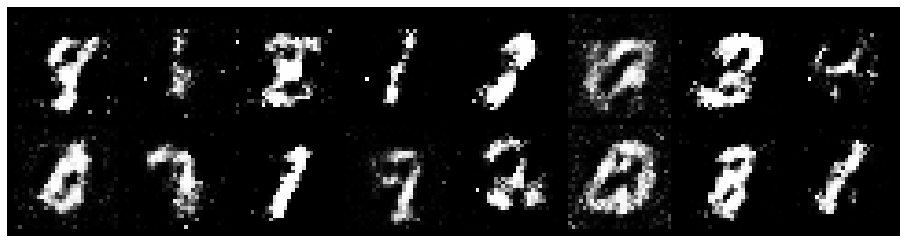

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.9004, Generator Loss: 1.5987
D(x): 0.6686, D(G(z)): 0.2866


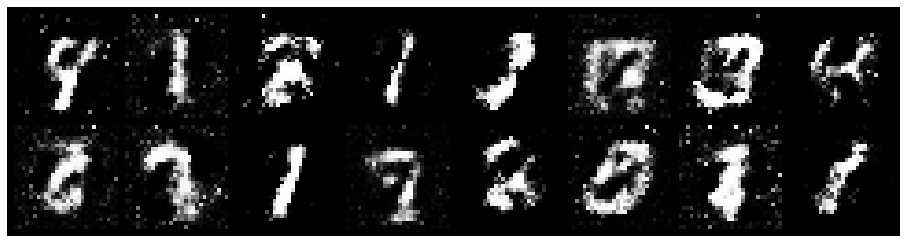

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.8706, Generator Loss: 1.6953
D(x): 0.6942, D(G(z)): 0.2725


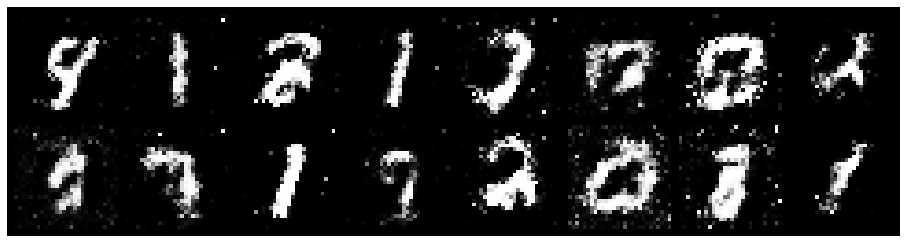

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.8332, Generator Loss: 2.2791
D(x): 0.7216, D(G(z)): 0.2354


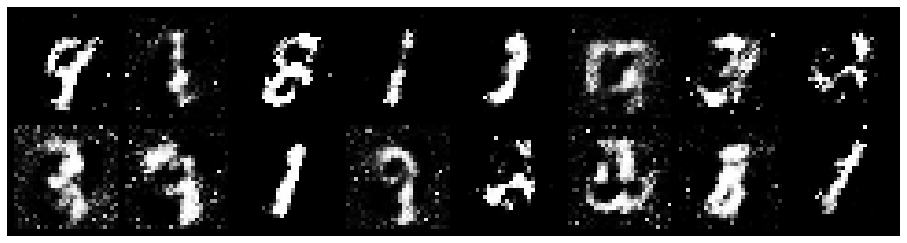

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.8063, Generator Loss: 1.7802
D(x): 0.7698, D(G(z)): 0.2906


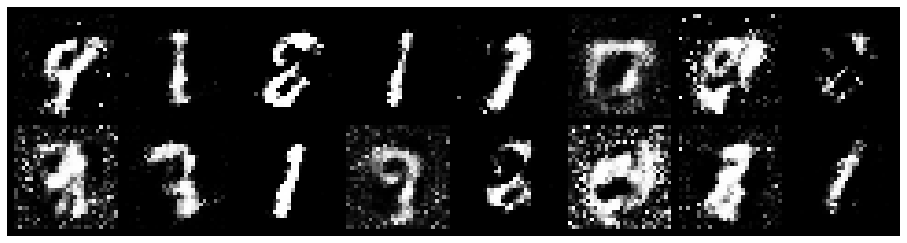

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.9530, Generator Loss: 2.1729
D(x): 0.7450, D(G(z)): 0.3227


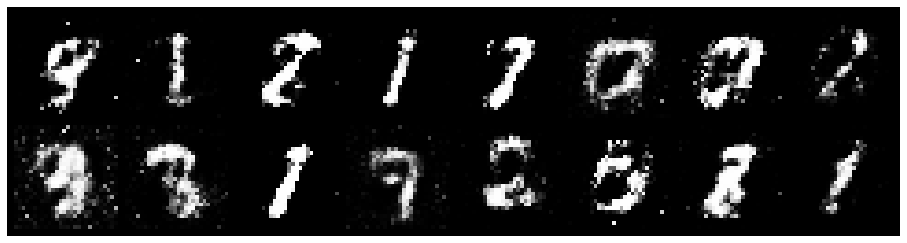

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.9730, Generator Loss: 1.9083
D(x): 0.6553, D(G(z)): 0.2417


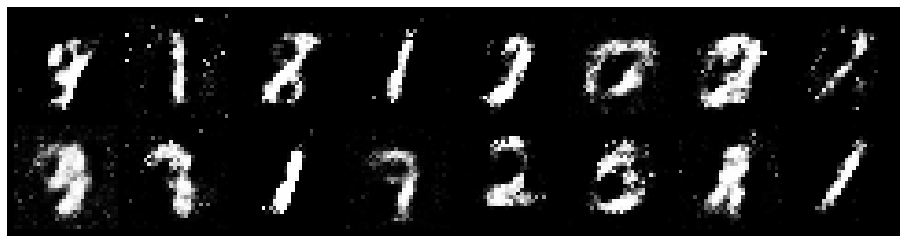

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 0.8629, Generator Loss: 1.7584
D(x): 0.7503, D(G(z)): 0.2762


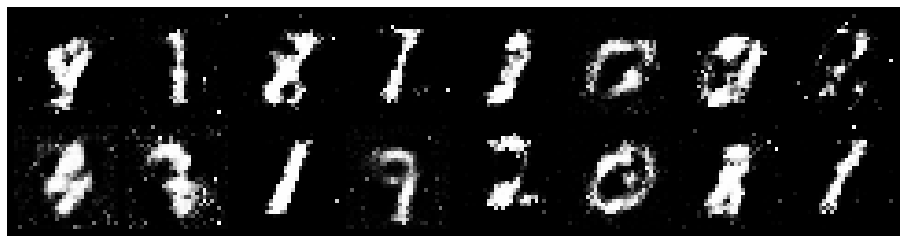

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 1.1432, Generator Loss: 1.7516
D(x): 0.7121, D(G(z)): 0.3407


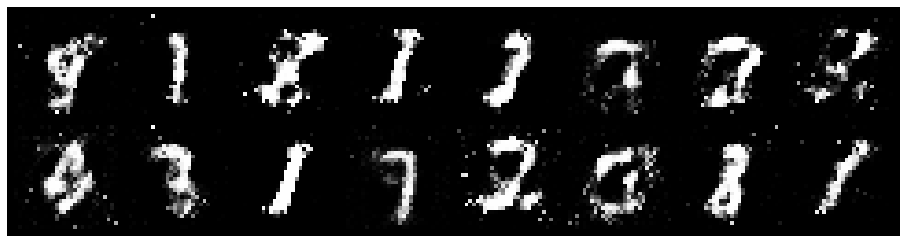

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.8364, Generator Loss: 1.6255
D(x): 0.6643, D(G(z)): 0.2320


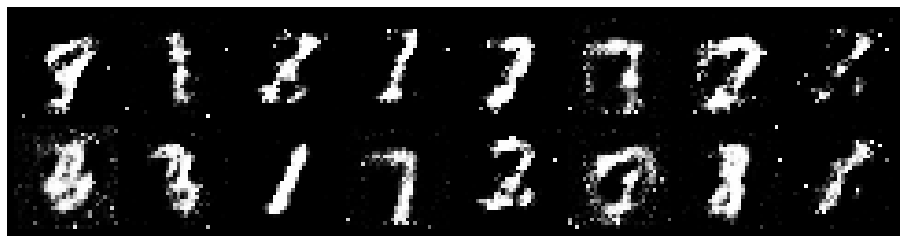

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.8576, Generator Loss: 1.7496
D(x): 0.7023, D(G(z)): 0.2694


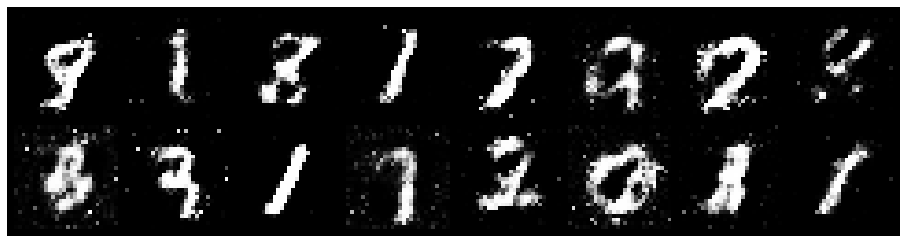

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.8596, Generator Loss: 1.8243
D(x): 0.7286, D(G(z)): 0.3103


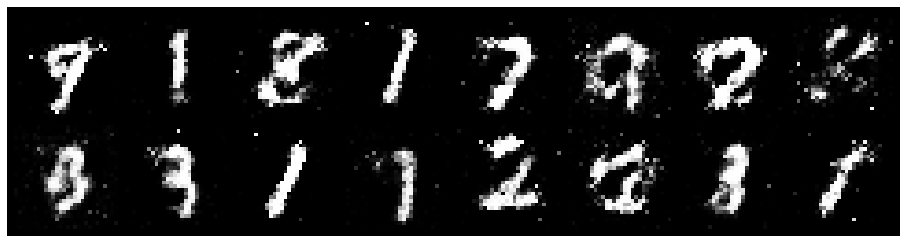

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.9218, Generator Loss: 1.2655
D(x): 0.7273, D(G(z)): 0.3781


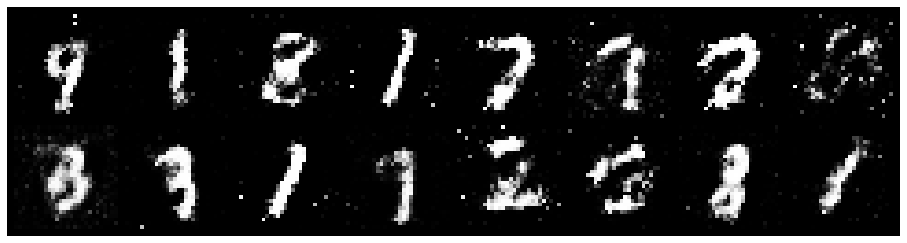

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.7103, Generator Loss: 1.8552
D(x): 0.7535, D(G(z)): 0.2515


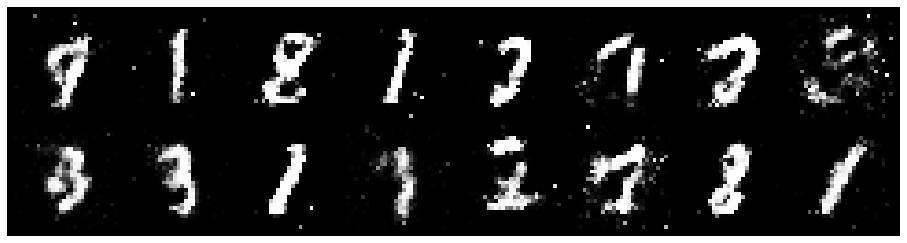

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.8592, Generator Loss: 1.6594
D(x): 0.7268, D(G(z)): 0.2794


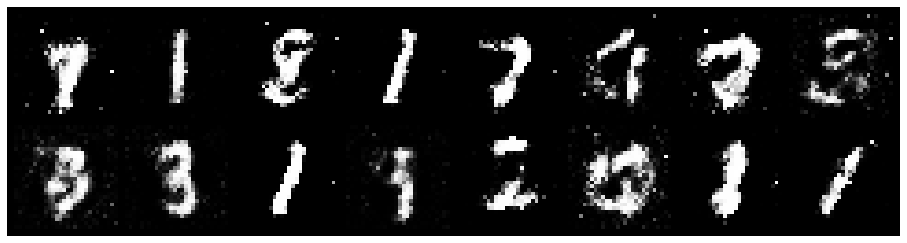

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.8317, Generator Loss: 1.5339
D(x): 0.7567, D(G(z)): 0.2858


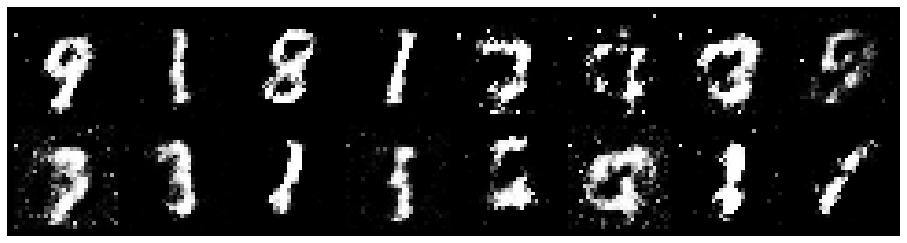

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.8105, Generator Loss: 1.4461
D(x): 0.7150, D(G(z)): 0.2866


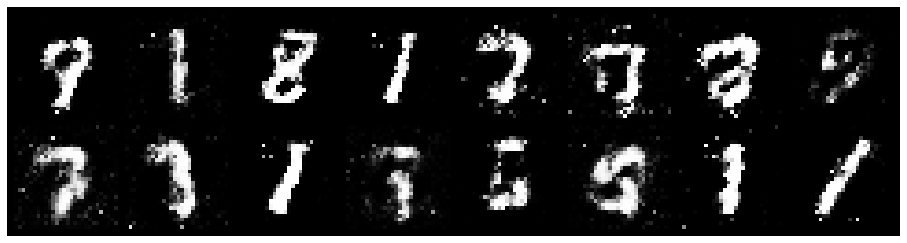

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.9692, Generator Loss: 1.4557
D(x): 0.7270, D(G(z)): 0.3399


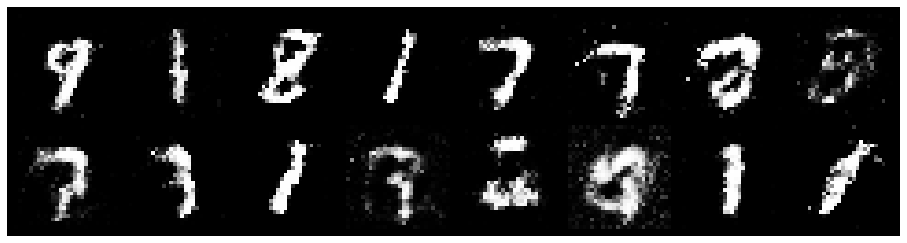

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.8808, Generator Loss: 1.3014
D(x): 0.7404, D(G(z)): 0.2908


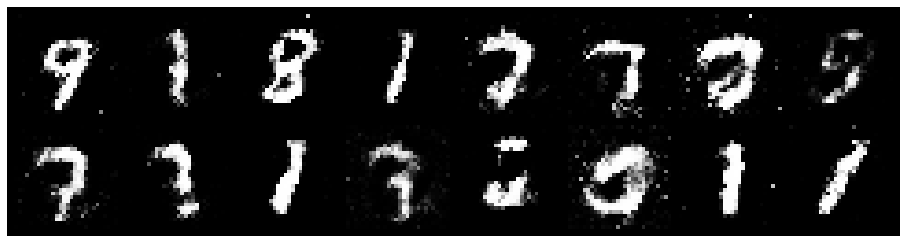

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 1.0305, Generator Loss: 1.8982
D(x): 0.6383, D(G(z)): 0.2166


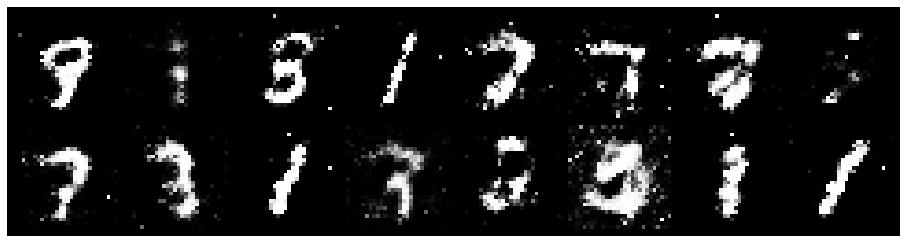

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.7619, Generator Loss: 1.6910
D(x): 0.7737, D(G(z)): 0.2930


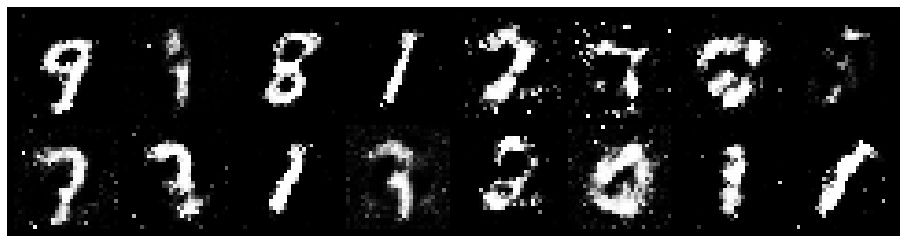

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.7932, Generator Loss: 2.2565
D(x): 0.6581, D(G(z)): 0.1732


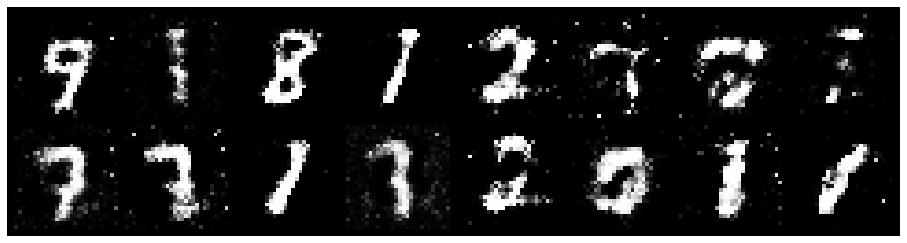

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.9701, Generator Loss: 1.4964
D(x): 0.7307, D(G(z)): 0.3371


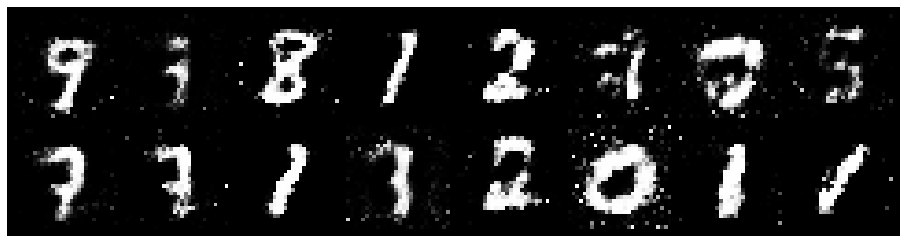

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.7923, Generator Loss: 1.9318
D(x): 0.6680, D(G(z)): 0.1811


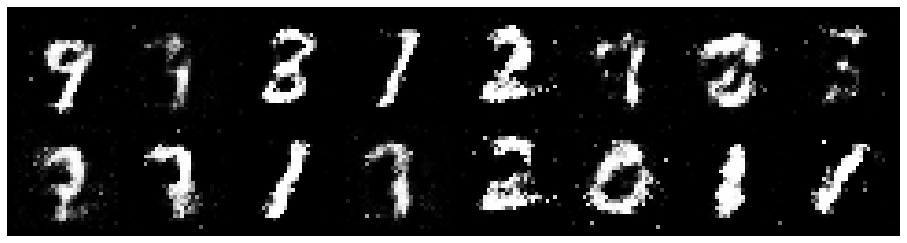

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.9012, Generator Loss: 1.7048
D(x): 0.7018, D(G(z)): 0.2695


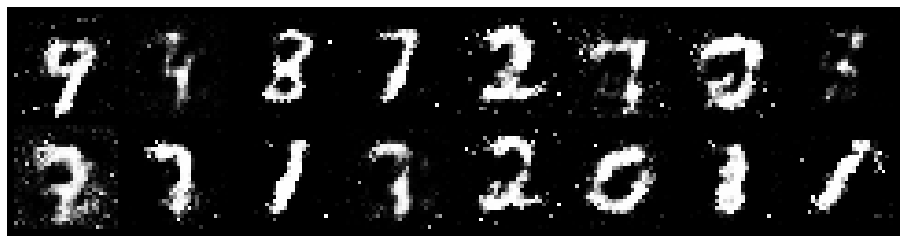

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 1.1010, Generator Loss: 1.3081
D(x): 0.6891, D(G(z)): 0.3650


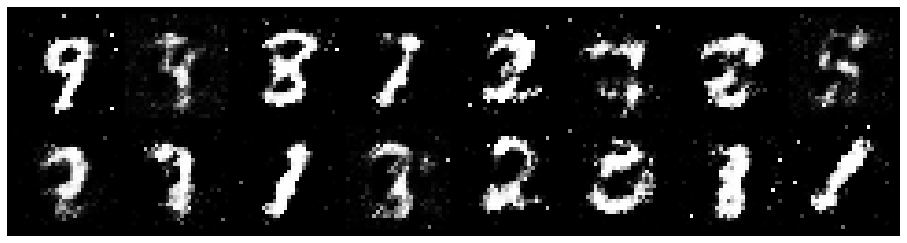

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 1.0193, Generator Loss: 1.4774
D(x): 0.6270, D(G(z)): 0.2804


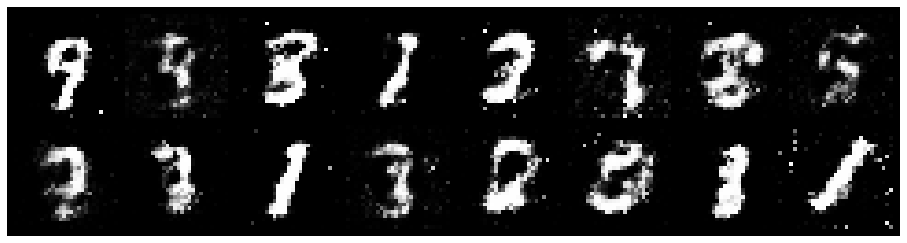

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.6526, Generator Loss: 2.3935
D(x): 0.7647, D(G(z)): 0.2239


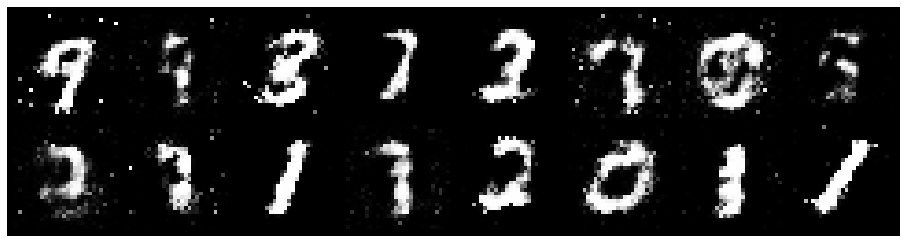

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 1.2302, Generator Loss: 1.7209
D(x): 0.6254, D(G(z)): 0.3518


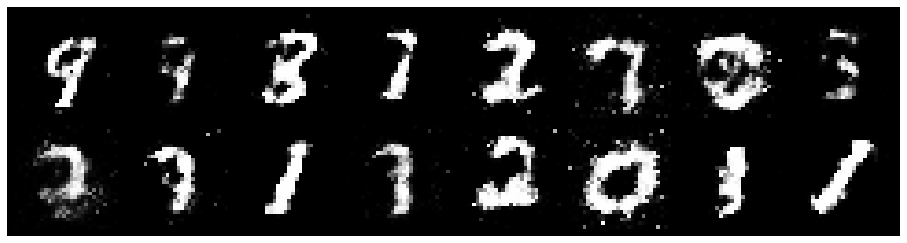

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.9300, Generator Loss: 1.5976
D(x): 0.7354, D(G(z)): 0.2980


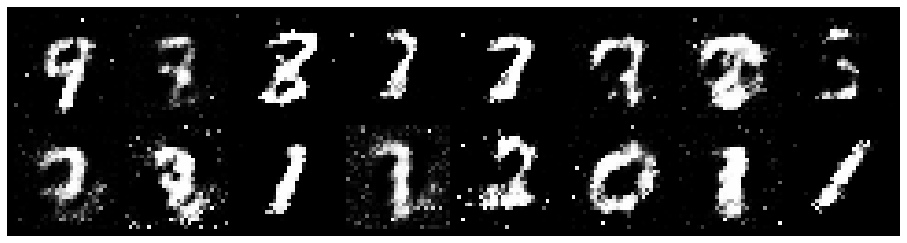

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.8800, Generator Loss: 1.7690
D(x): 0.6317, D(G(z)): 0.1946


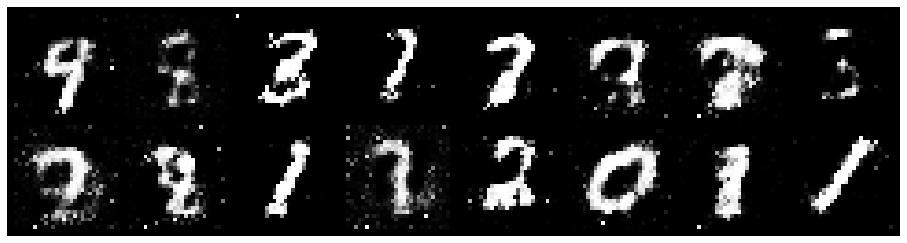

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.8390, Generator Loss: 2.1314
D(x): 0.6944, D(G(z)): 0.2296


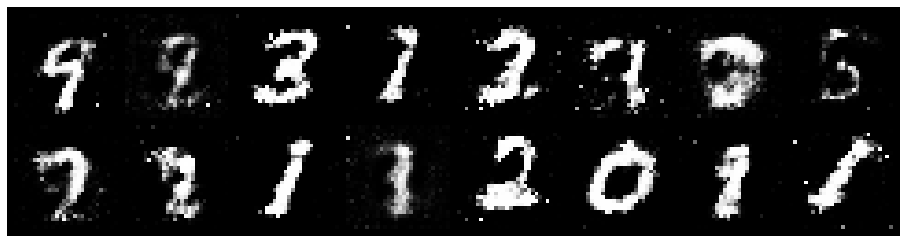

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.9421, Generator Loss: 1.6592
D(x): 0.6807, D(G(z)): 0.2951


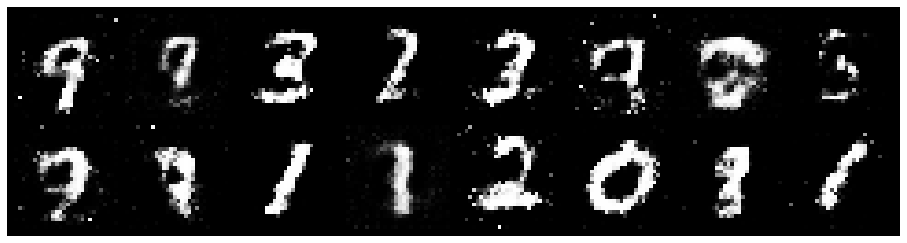

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 1.1214, Generator Loss: 1.5389
D(x): 0.7066, D(G(z)): 0.3890


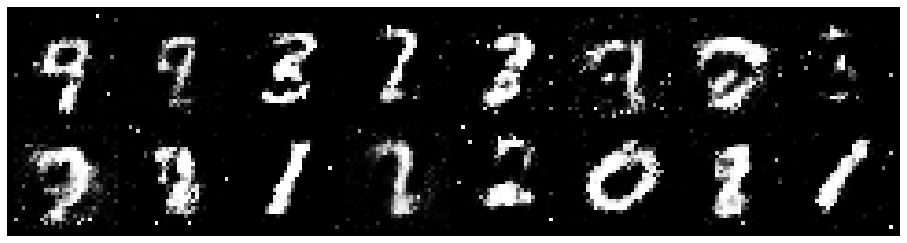

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 1.1078, Generator Loss: 1.4845
D(x): 0.6999, D(G(z)): 0.3797


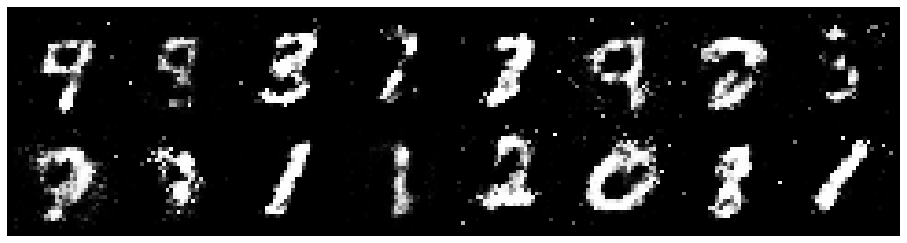

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 0.9770, Generator Loss: 1.6445
D(x): 0.7106, D(G(z)): 0.3427


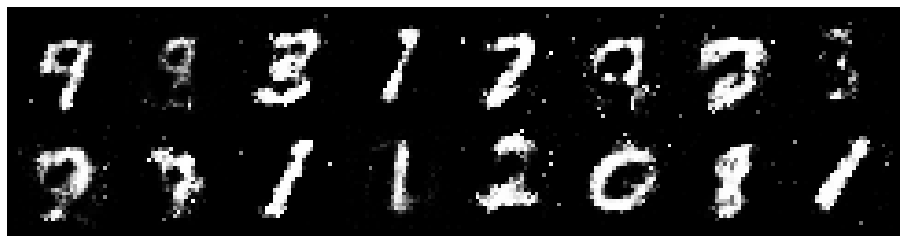

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.7237, Generator Loss: 1.3999
D(x): 0.7942, D(G(z)): 0.2784


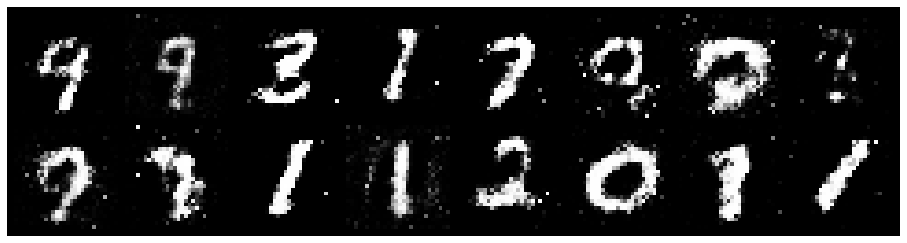

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 0.9873, Generator Loss: 1.5371
D(x): 0.6650, D(G(z)): 0.3027


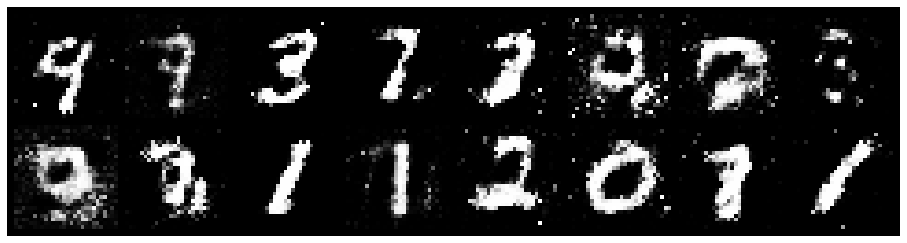

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9868, Generator Loss: 1.4457
D(x): 0.6883, D(G(z)): 0.3184


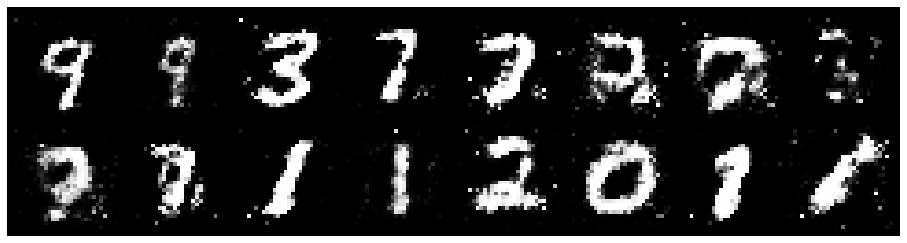

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 1.0558, Generator Loss: 1.3809
D(x): 0.6476, D(G(z)): 0.2981


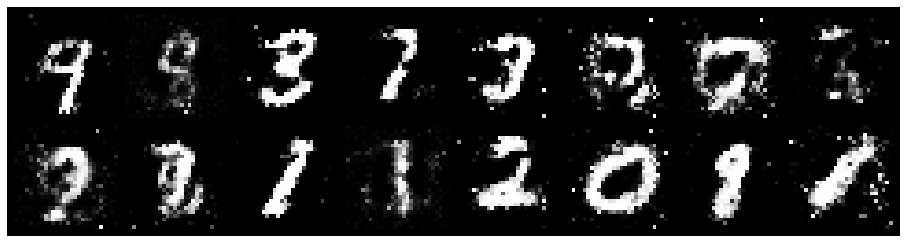

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.9063, Generator Loss: 1.5033
D(x): 0.6933, D(G(z)): 0.2979


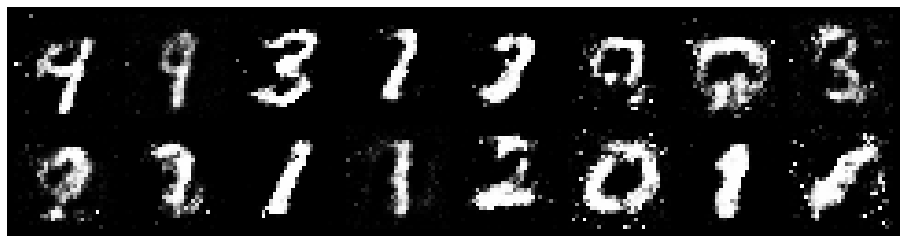

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.0068, Generator Loss: 1.2976
D(x): 0.7060, D(G(z)): 0.3791


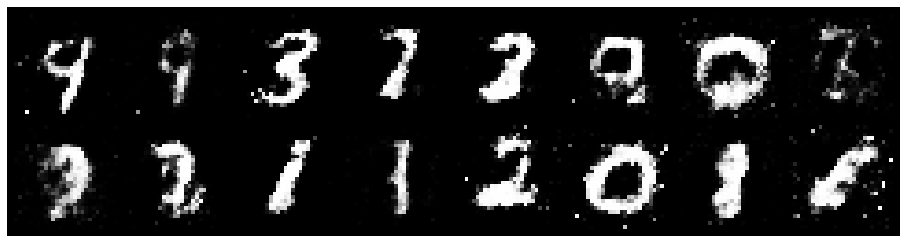

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.8286, Generator Loss: 1.2690
D(x): 0.7502, D(G(z)): 0.3290


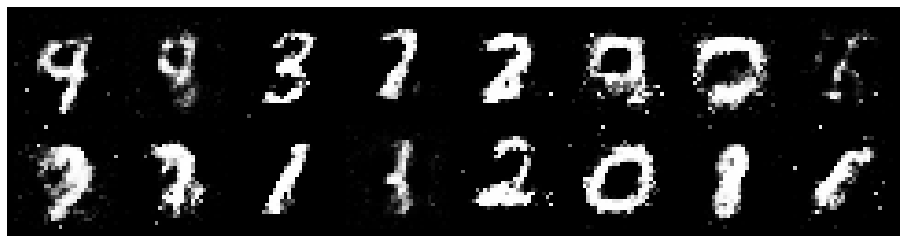

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9946, Generator Loss: 1.2133
D(x): 0.6656, D(G(z)): 0.3389


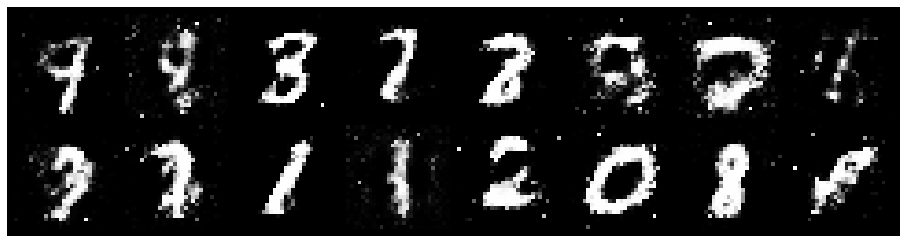

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 1.0750, Generator Loss: 1.2292
D(x): 0.5952, D(G(z)): 0.3249


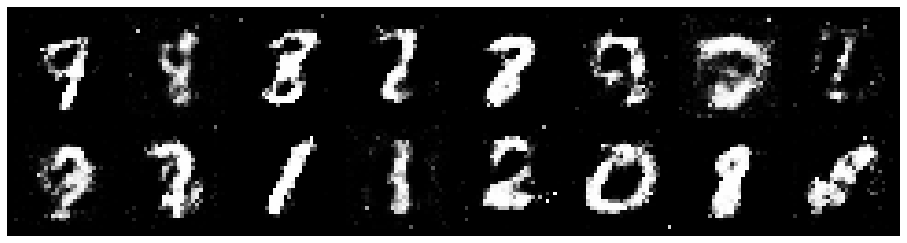

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.9788, Generator Loss: 1.4162
D(x): 0.7138, D(G(z)): 0.3234


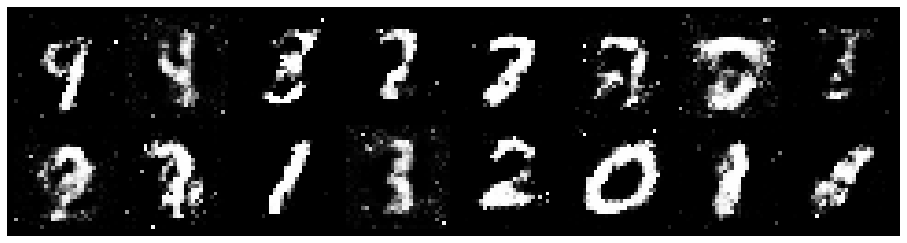

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.9679, Generator Loss: 1.6032
D(x): 0.6450, D(G(z)): 0.3051


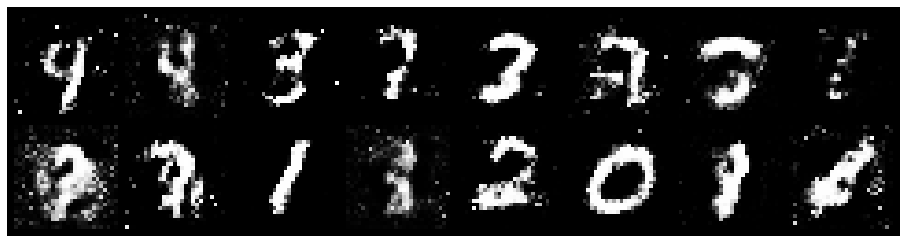

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 0.9994, Generator Loss: 1.4915
D(x): 0.6837, D(G(z)): 0.3649


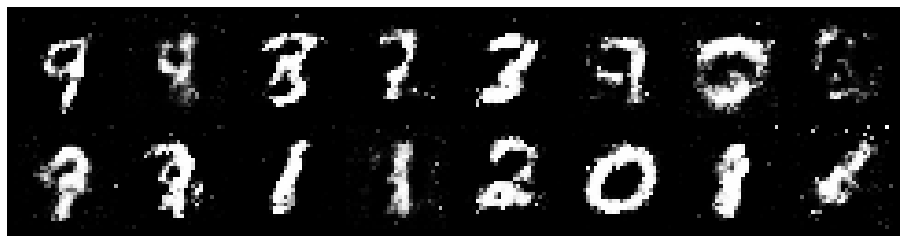

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.9136, Generator Loss: 1.3081
D(x): 0.6613, D(G(z)): 0.2974


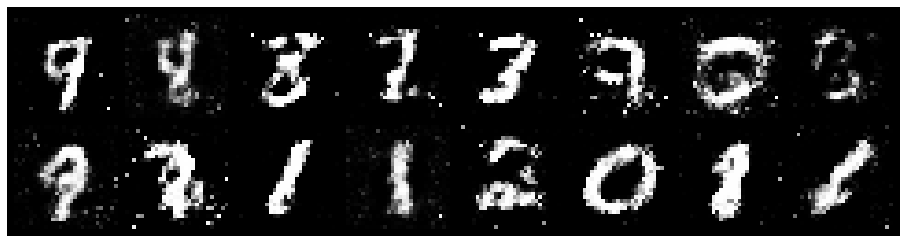

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 0.8046, Generator Loss: 1.5304
D(x): 0.7304, D(G(z)): 0.2974


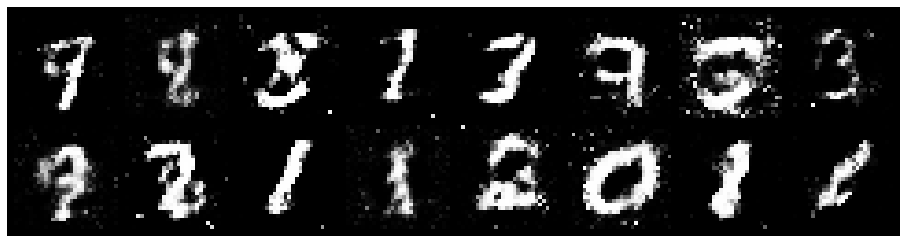

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.9756, Generator Loss: 1.4966
D(x): 0.6685, D(G(z)): 0.2999


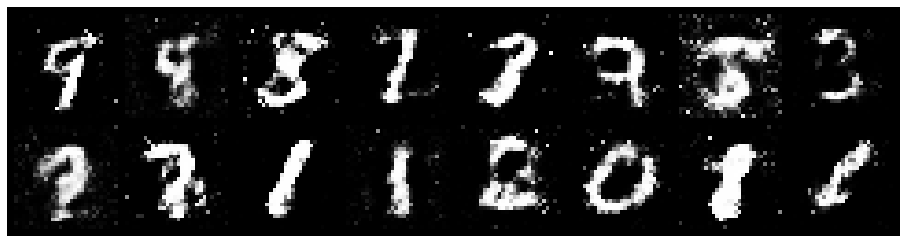

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 0.9213, Generator Loss: 1.3816
D(x): 0.6807, D(G(z)): 0.2837


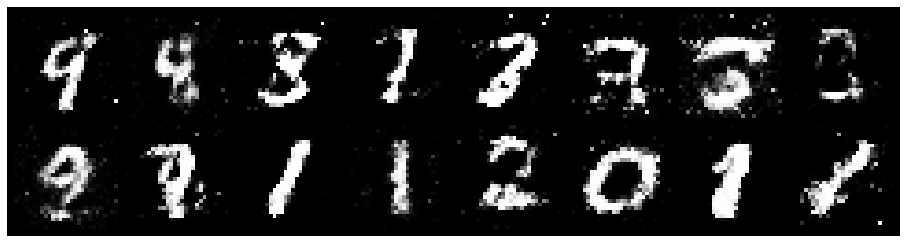

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 1.2228, Generator Loss: 1.1682
D(x): 0.5935, D(G(z)): 0.3914


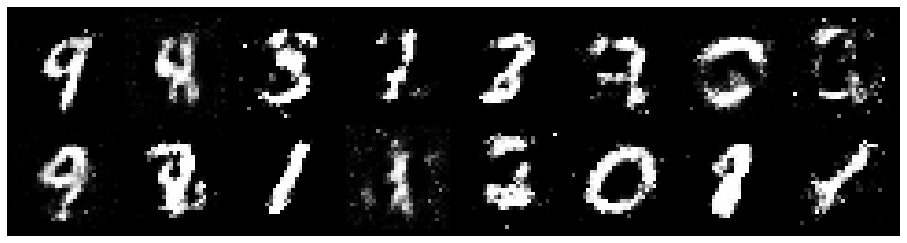

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.9766, Generator Loss: 1.2249
D(x): 0.6478, D(G(z)): 0.3174


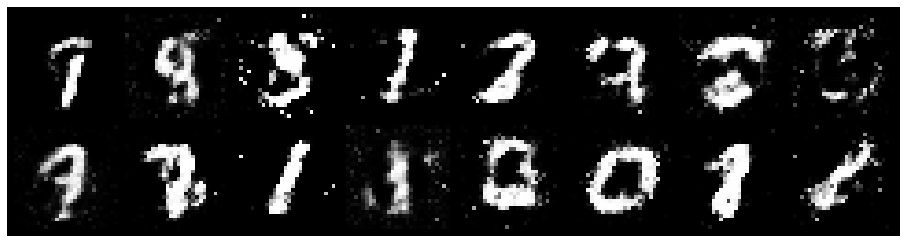

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.0579, Generator Loss: 1.3172
D(x): 0.6042, D(G(z)): 0.2928


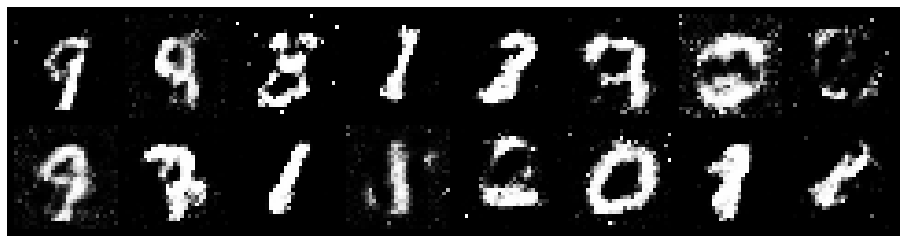

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.0305, Generator Loss: 1.3125
D(x): 0.5973, D(G(z)): 0.2783


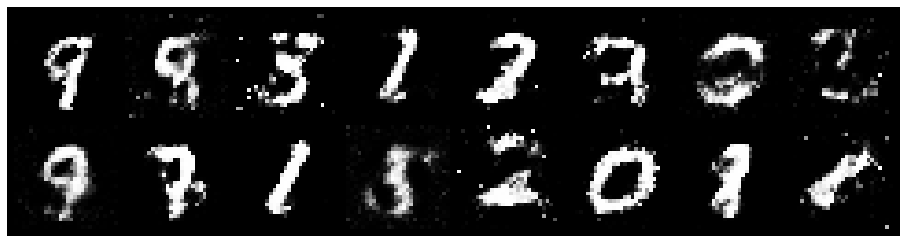

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 0.9905, Generator Loss: 1.4510
D(x): 0.6467, D(G(z)): 0.2974


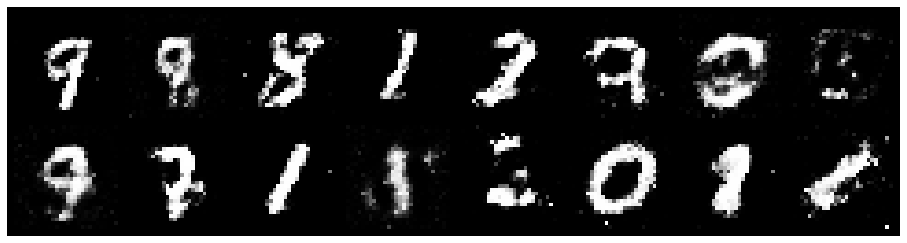

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 0.9515, Generator Loss: 1.4755
D(x): 0.6712, D(G(z)): 0.3252


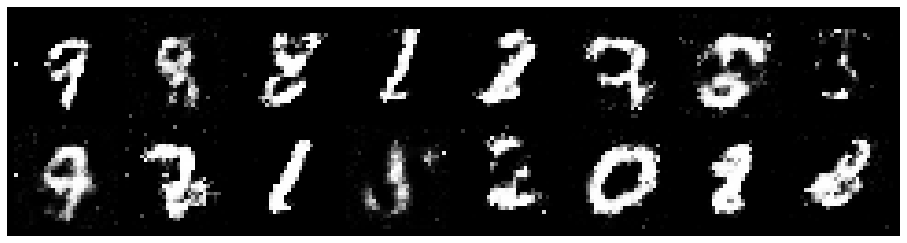

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.9730, Generator Loss: 1.2093
D(x): 0.6785, D(G(z)): 0.3263


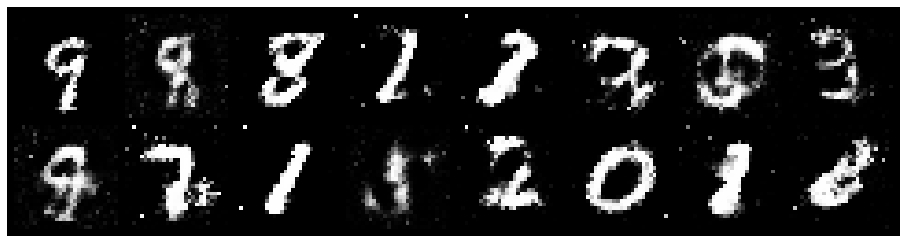

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.0909, Generator Loss: 1.3860
D(x): 0.6163, D(G(z)): 0.3357


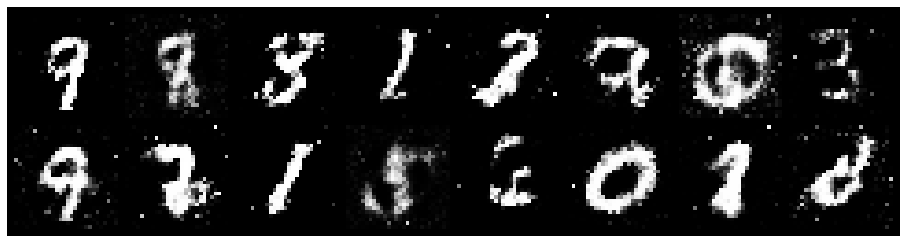

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.0038, Generator Loss: 1.3021
D(x): 0.6033, D(G(z)): 0.2967


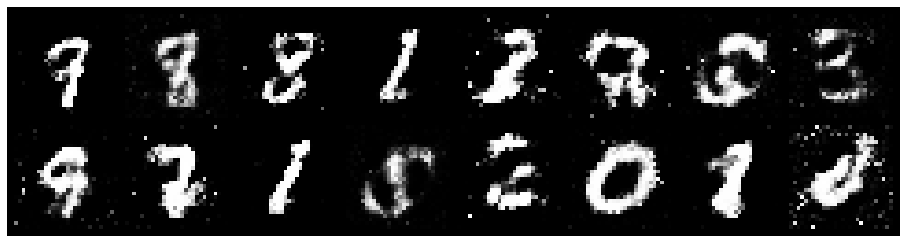

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.8363, Generator Loss: 1.3127
D(x): 0.6979, D(G(z)): 0.2692


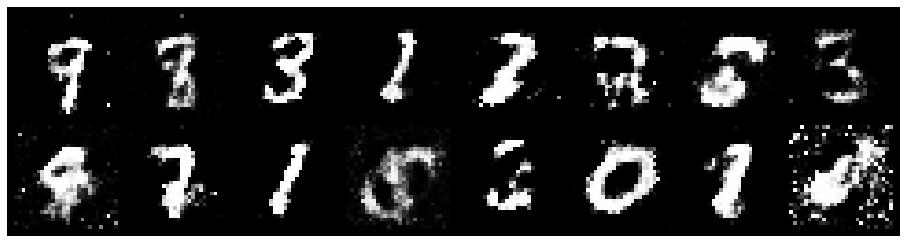

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.9868, Generator Loss: 1.4411
D(x): 0.6461, D(G(z)): 0.2970


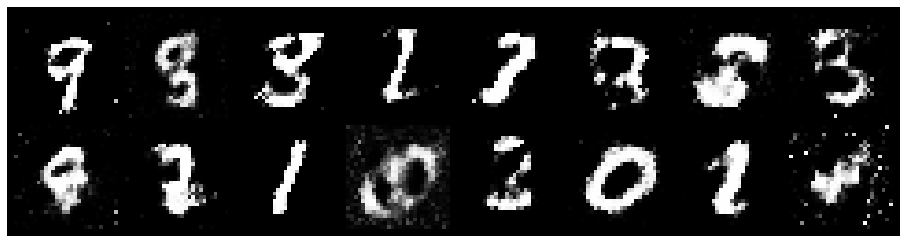

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 0.9563, Generator Loss: 1.5371
D(x): 0.6478, D(G(z)): 0.2922


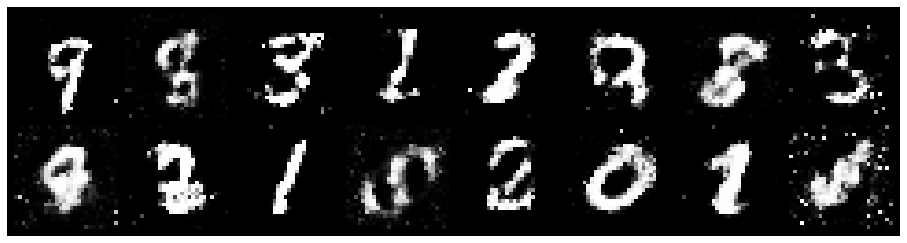

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 1.1043, Generator Loss: 1.4179
D(x): 0.7029, D(G(z)): 0.3872


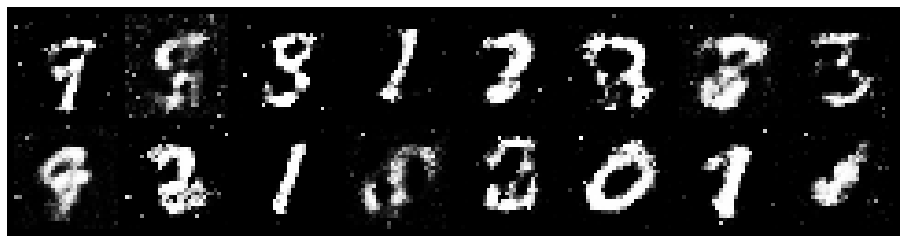

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.0826, Generator Loss: 1.2843
D(x): 0.6156, D(G(z)): 0.3311


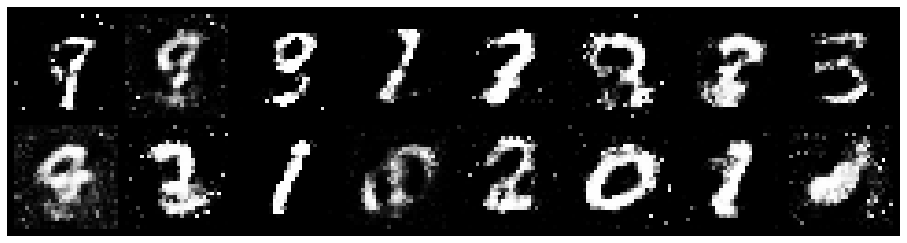

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.1392, Generator Loss: 1.2928
D(x): 0.6149, D(G(z)): 0.3639


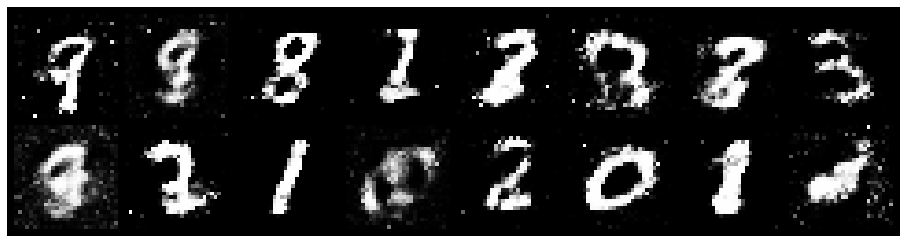

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 1.0916, Generator Loss: 1.3655
D(x): 0.6450, D(G(z)): 0.3759


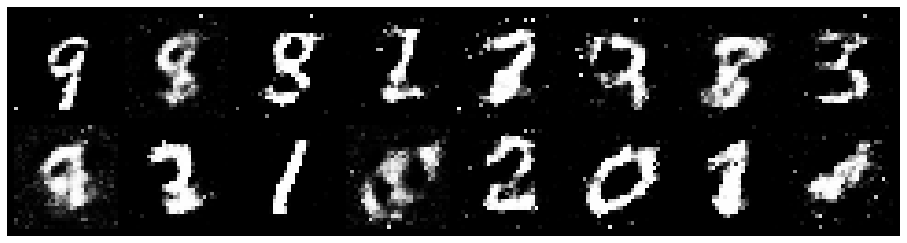

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 0.8170, Generator Loss: 1.5826
D(x): 0.7443, D(G(z)): 0.3213


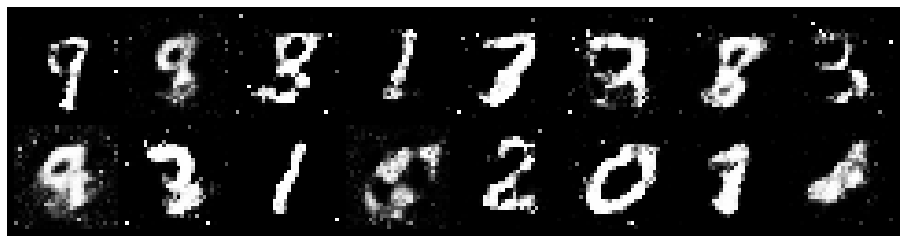

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 0.9129, Generator Loss: 1.3652
D(x): 0.6820, D(G(z)): 0.3031


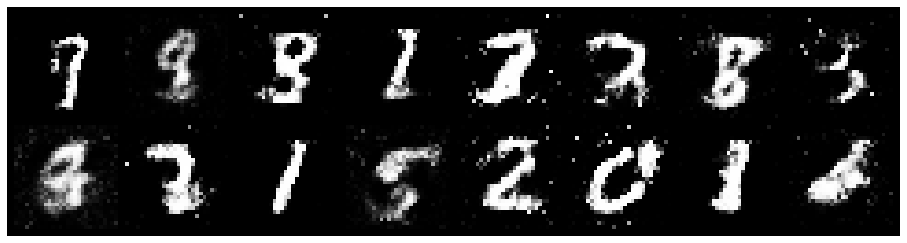

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 0.9553, Generator Loss: 1.1275
D(x): 0.6738, D(G(z)): 0.3137


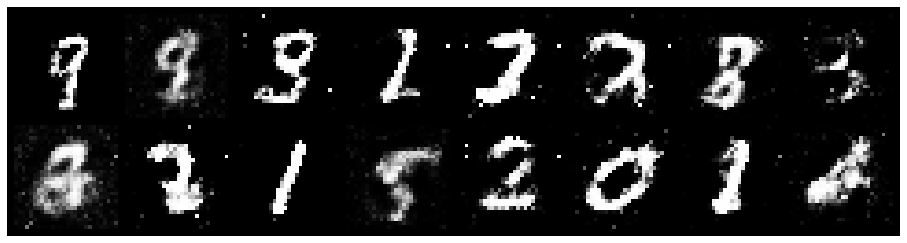

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 1.1376, Generator Loss: 1.6348
D(x): 0.6322, D(G(z)): 0.3467


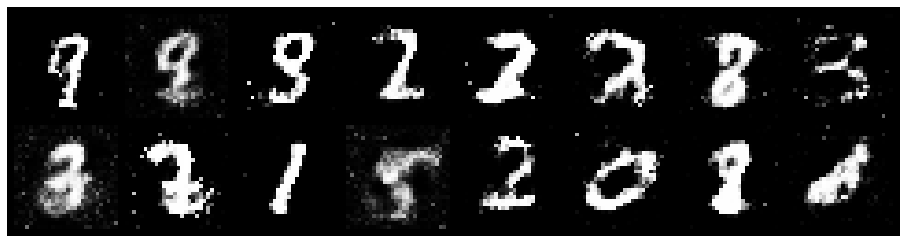

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.9928, Generator Loss: 1.3552
D(x): 0.6609, D(G(z)): 0.3359


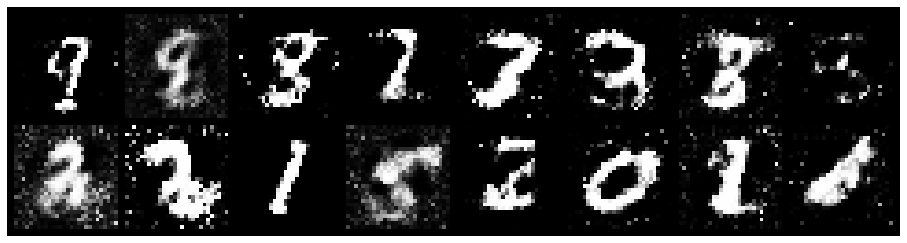

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 1.0777, Generator Loss: 1.1181
D(x): 0.6462, D(G(z)): 0.3365


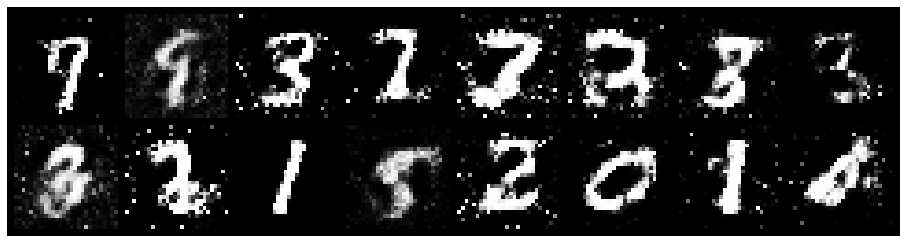

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.0991, Generator Loss: 1.3521
D(x): 0.6679, D(G(z)): 0.3714


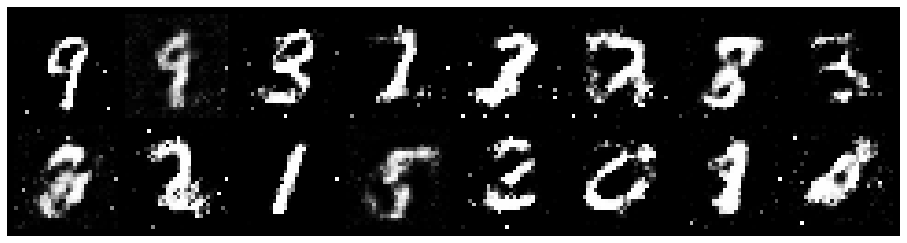

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 0.9491, Generator Loss: 1.5557
D(x): 0.6981, D(G(z)): 0.3358


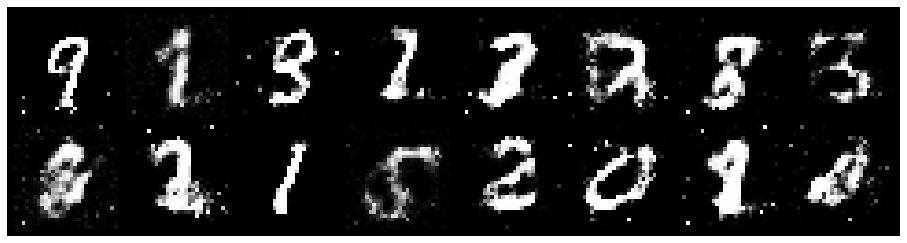

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 0.9895, Generator Loss: 1.3336
D(x): 0.6977, D(G(z)): 0.3733


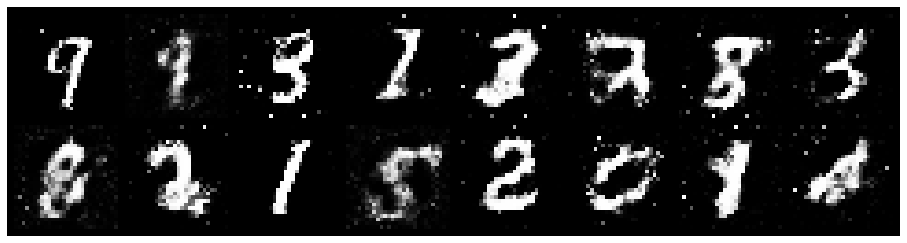

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 1.1453, Generator Loss: 1.2781
D(x): 0.6561, D(G(z)): 0.4080


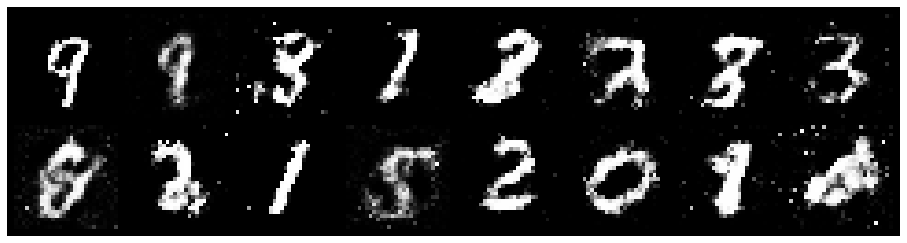

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.8791, Generator Loss: 1.2589
D(x): 0.6951, D(G(z)): 0.3289


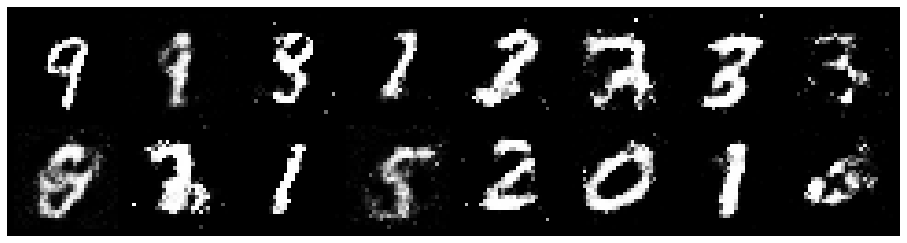

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.0016, Generator Loss: 1.3731
D(x): 0.6899, D(G(z)): 0.3321


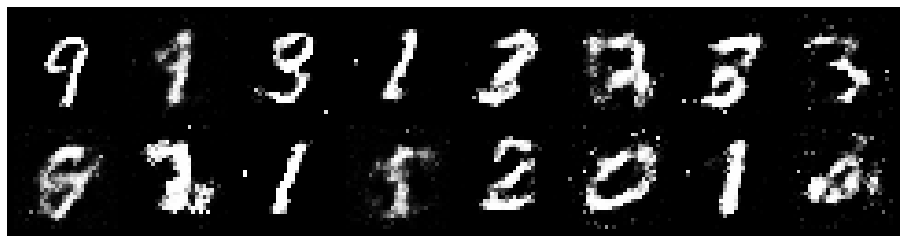

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 1.1049, Generator Loss: 1.6918
D(x): 0.5390, D(G(z)): 0.2417


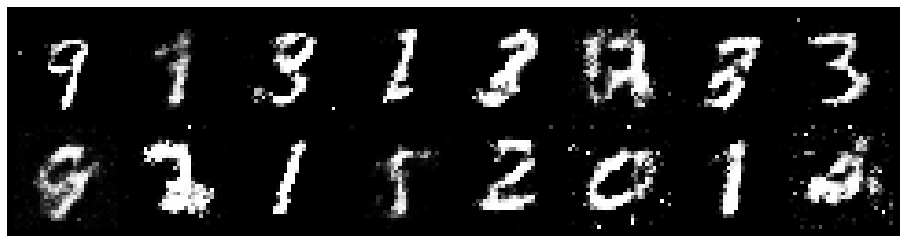

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.8890, Generator Loss: 1.5797
D(x): 0.7197, D(G(z)): 0.3372


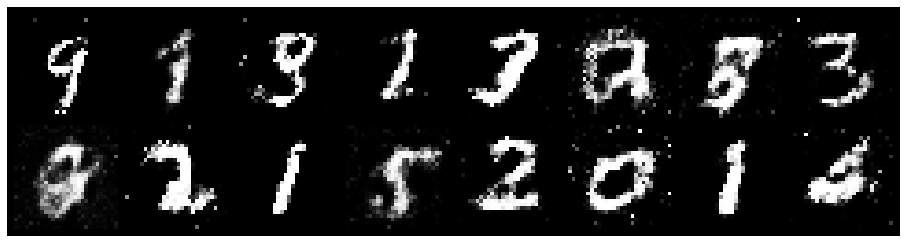

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 1.0153, Generator Loss: 1.3258
D(x): 0.6483, D(G(z)): 0.3567


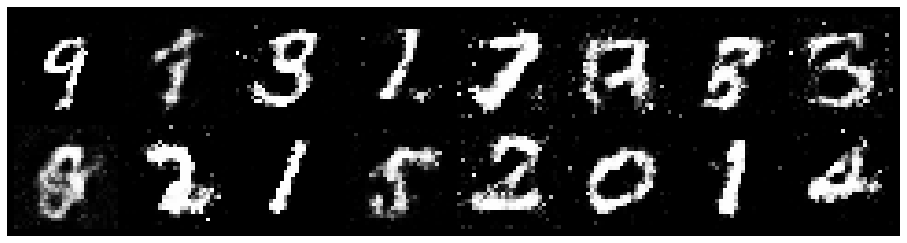

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 1.0295, Generator Loss: 1.4451
D(x): 0.6556, D(G(z)): 0.3219


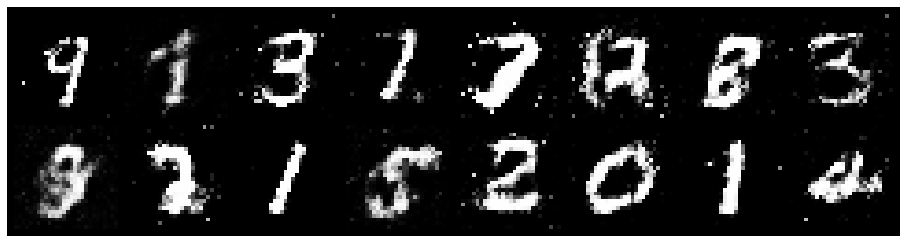

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.0532, Generator Loss: 1.0861
D(x): 0.6159, D(G(z)): 0.3576


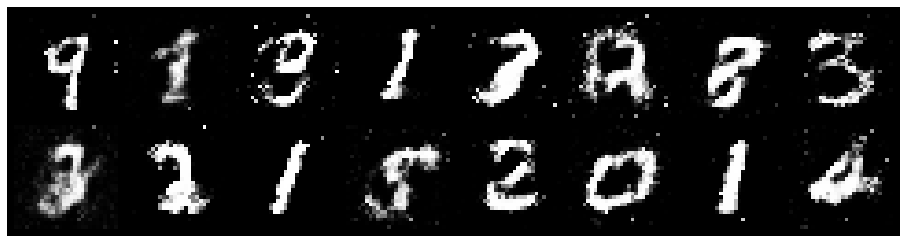

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 0.8971, Generator Loss: 1.5150
D(x): 0.6444, D(G(z)): 0.2976


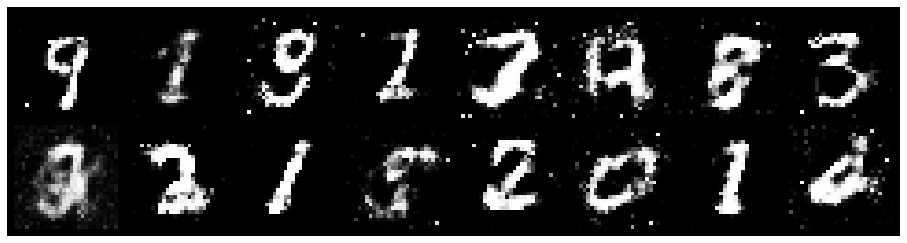

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 0.9856, Generator Loss: 1.4881
D(x): 0.6372, D(G(z)): 0.3273


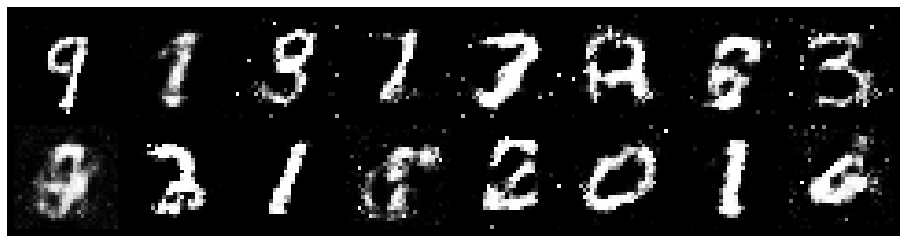

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.0114, Generator Loss: 1.0067
D(x): 0.6304, D(G(z)): 0.3174


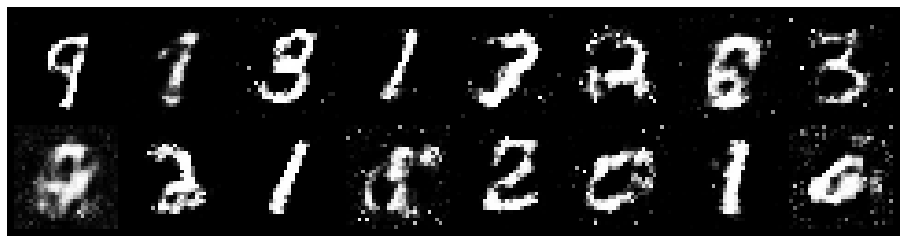

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.1443, Generator Loss: 1.2289
D(x): 0.5962, D(G(z)): 0.3768


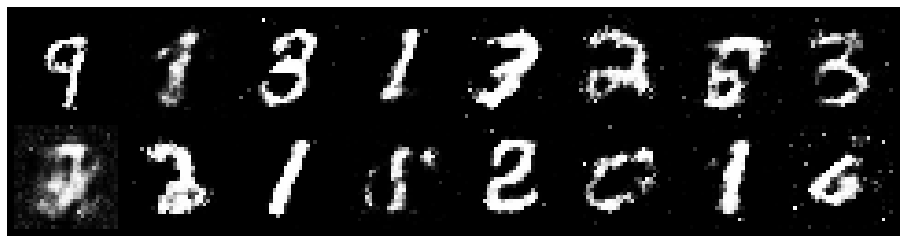

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.1806, Generator Loss: 1.3254
D(x): 0.6129, D(G(z)): 0.3833


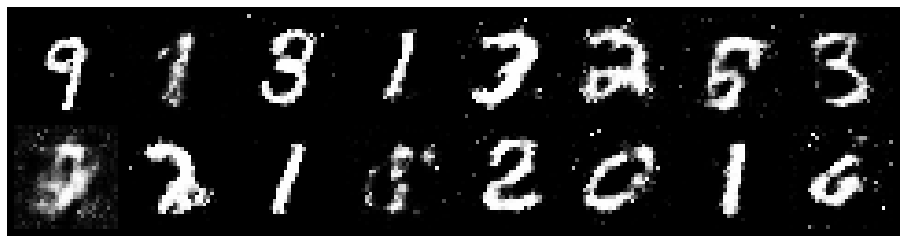

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.1020, Generator Loss: 1.1660
D(x): 0.6042, D(G(z)): 0.3523


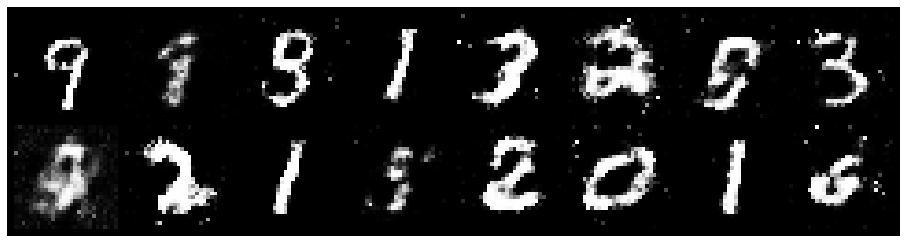

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 1.0158, Generator Loss: 1.0867
D(x): 0.6584, D(G(z)): 0.3764


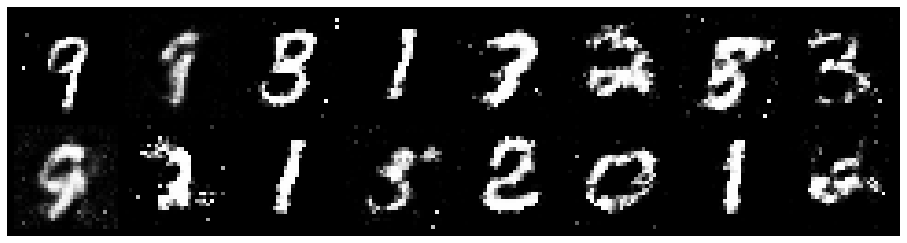

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.1402, Generator Loss: 1.1336
D(x): 0.6187, D(G(z)): 0.3869


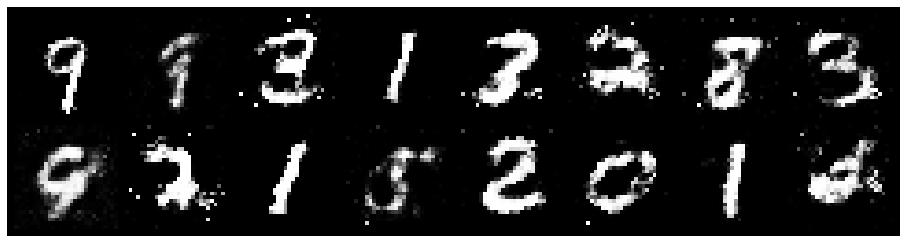

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.1501, Generator Loss: 0.9926
D(x): 0.6233, D(G(z)): 0.4304


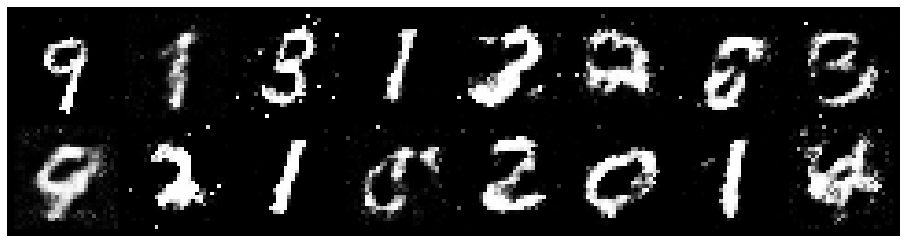

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.0238, Generator Loss: 1.2262
D(x): 0.6591, D(G(z)): 0.3732


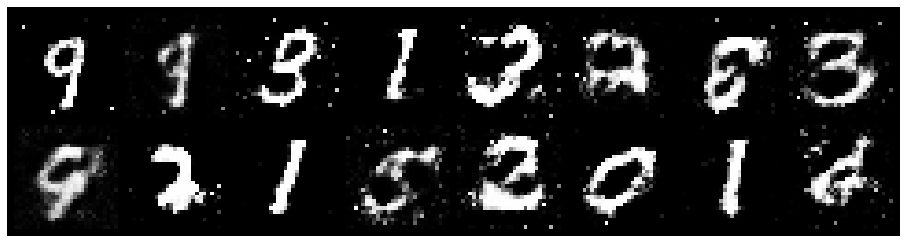

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.2232, Generator Loss: 1.2614
D(x): 0.6649, D(G(z)): 0.4373


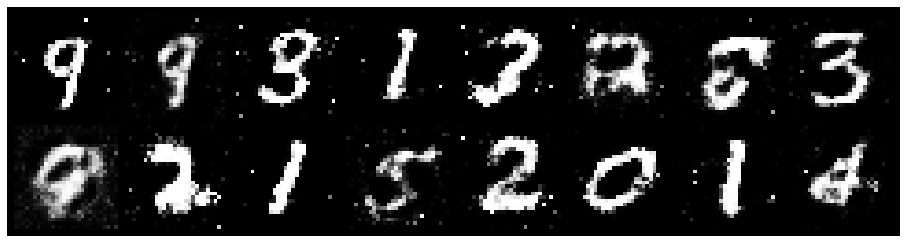

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 1.3297, Generator Loss: 1.1702
D(x): 0.6024, D(G(z)): 0.4107


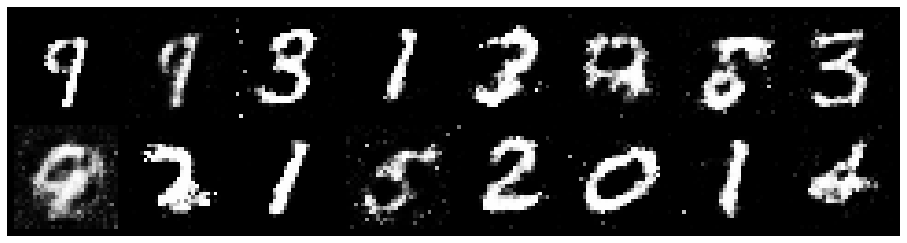

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.2102, Generator Loss: 1.2108
D(x): 0.5342, D(G(z)): 0.2978


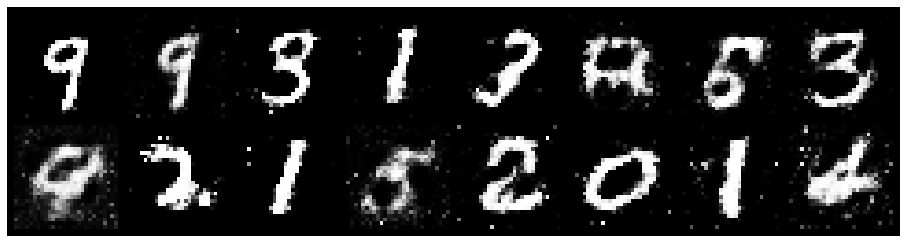

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 1.0752, Generator Loss: 1.5132
D(x): 0.6634, D(G(z)): 0.3743


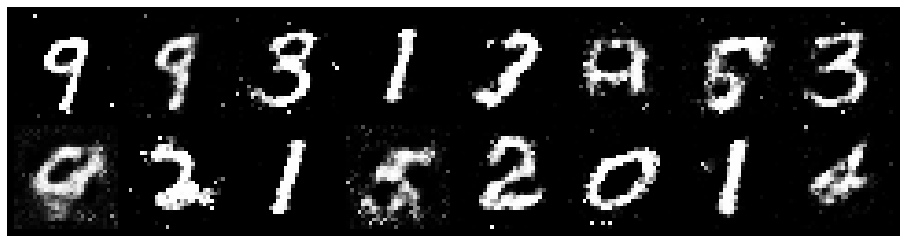

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 0.9949, Generator Loss: 1.1368
D(x): 0.6576, D(G(z)): 0.3793


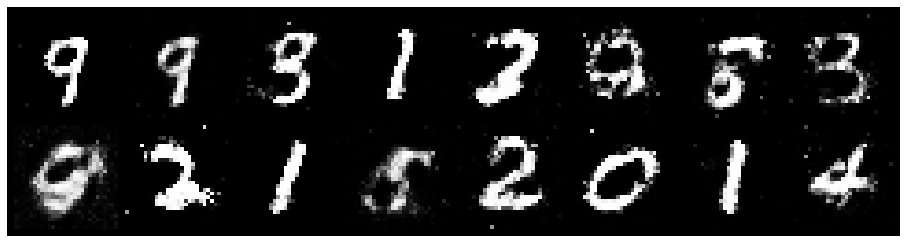

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0117, Generator Loss: 1.3375
D(x): 0.6235, D(G(z)): 0.3363


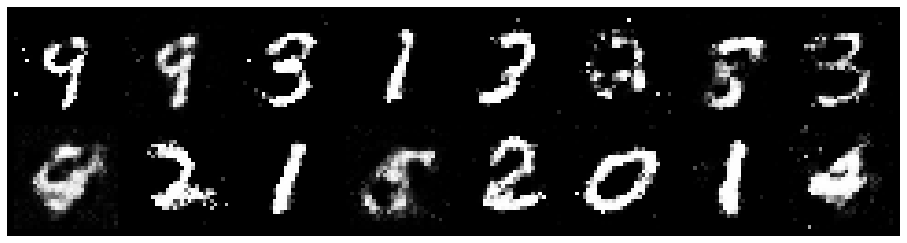

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.0703, Generator Loss: 1.0571
D(x): 0.6412, D(G(z)): 0.3740


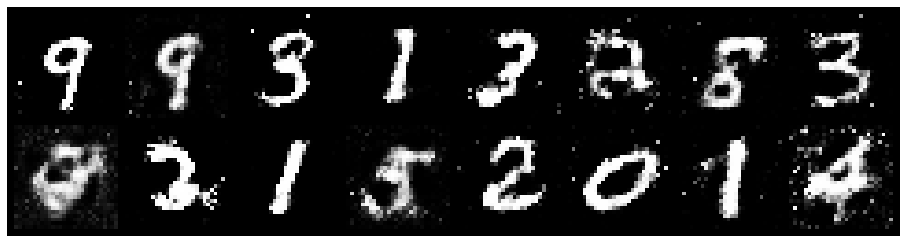

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 0.9886, Generator Loss: 1.2308
D(x): 0.6846, D(G(z)): 0.3696


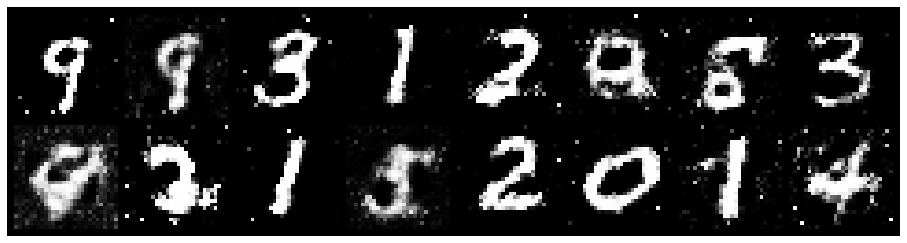

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 1.2005, Generator Loss: 0.9737
D(x): 0.6354, D(G(z)): 0.4249


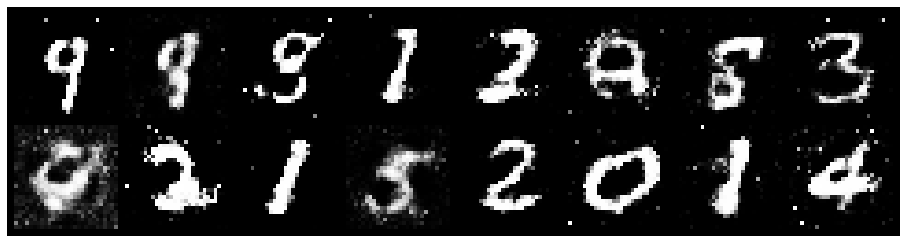

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.2011, Generator Loss: 0.9592
D(x): 0.5965, D(G(z)): 0.4033


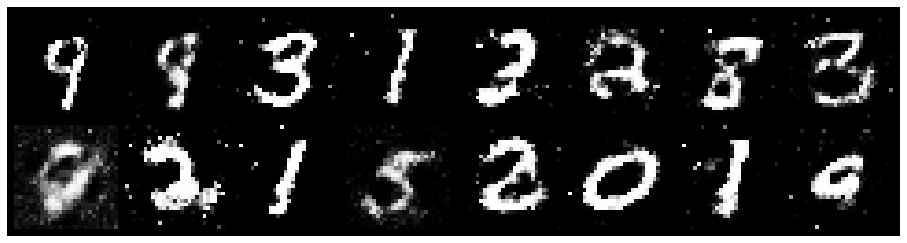

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.0745, Generator Loss: 1.2575
D(x): 0.5943, D(G(z)): 0.3376


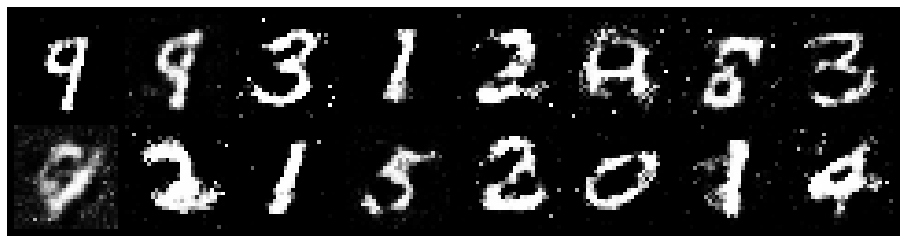

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0130, Generator Loss: 1.3345
D(x): 0.6553, D(G(z)): 0.3211


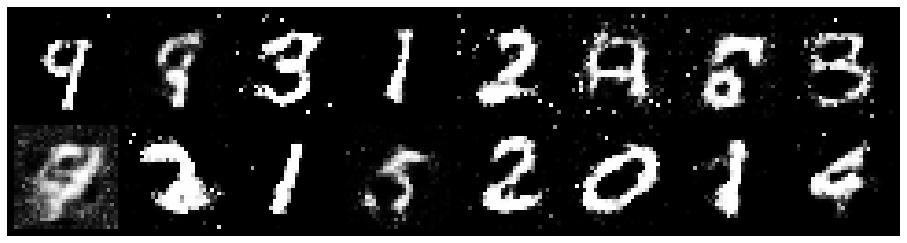

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.0382, Generator Loss: 1.2805
D(x): 0.7056, D(G(z)): 0.4063


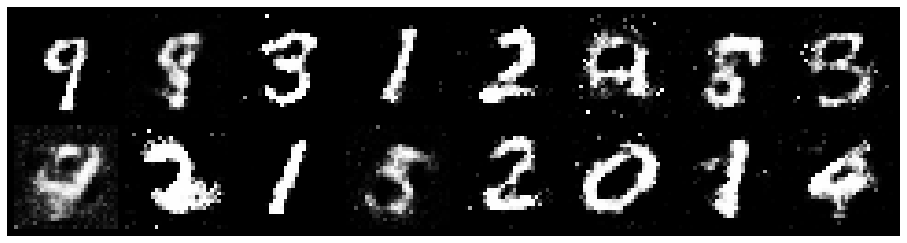

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.0693, Generator Loss: 1.0421
D(x): 0.6628, D(G(z)): 0.3784


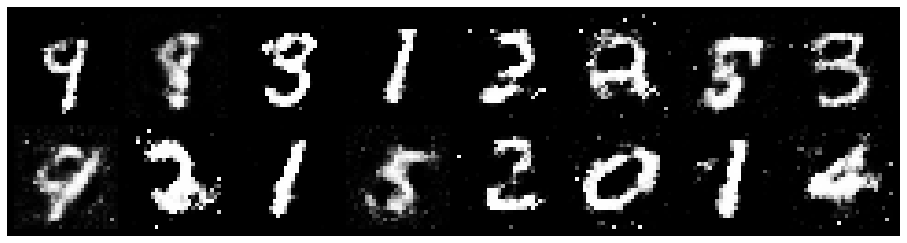

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.0844, Generator Loss: 1.2428
D(x): 0.5905, D(G(z)): 0.3124


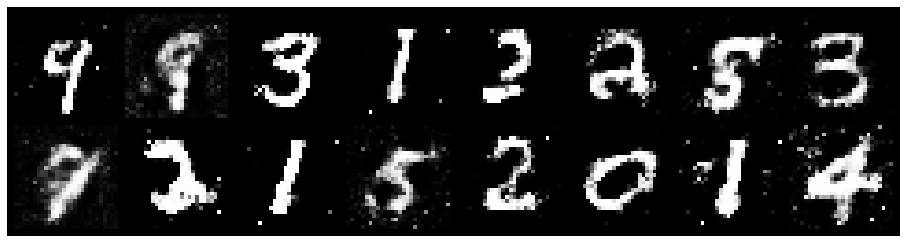

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.2185, Generator Loss: 1.3158
D(x): 0.6253, D(G(z)): 0.3845


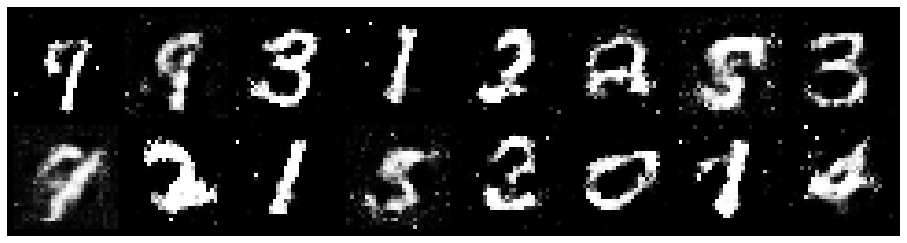

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 0.8819, Generator Loss: 1.5104
D(x): 0.7646, D(G(z)): 0.3664


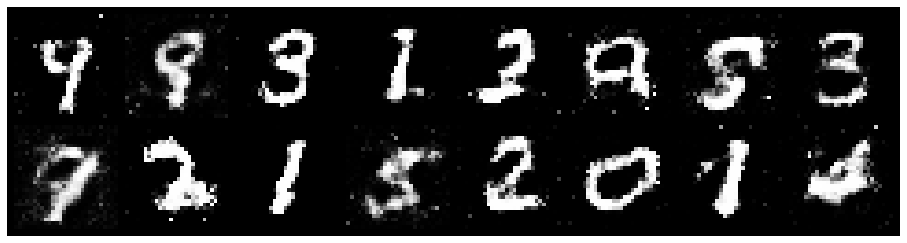

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.0959, Generator Loss: 1.1257
D(x): 0.5991, D(G(z)): 0.3520


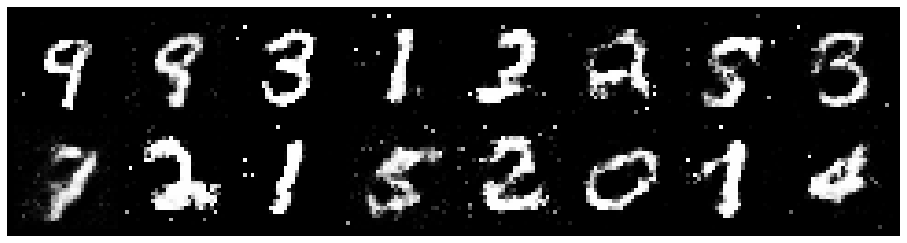

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 0.9955, Generator Loss: 1.3163
D(x): 0.6460, D(G(z)): 0.3475


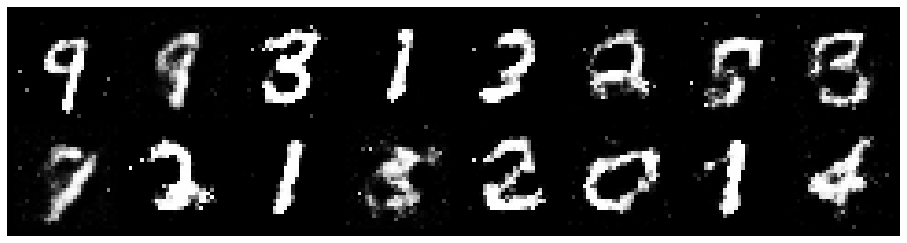

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.0235, Generator Loss: 1.3680
D(x): 0.5756, D(G(z)): 0.2811


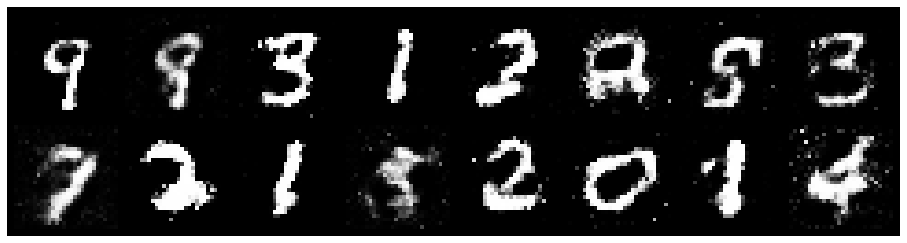

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 0.9342, Generator Loss: 1.6514
D(x): 0.6710, D(G(z)): 0.2949


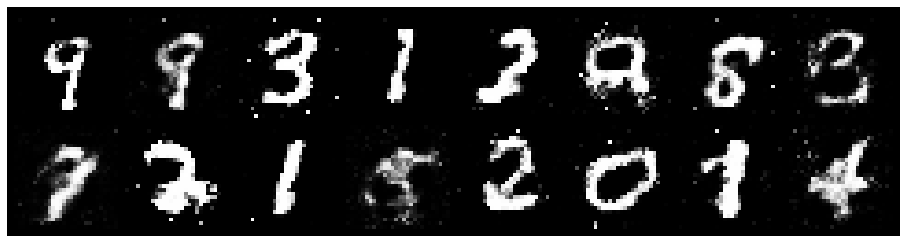

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.0897, Generator Loss: 1.1231
D(x): 0.6584, D(G(z)): 0.4106


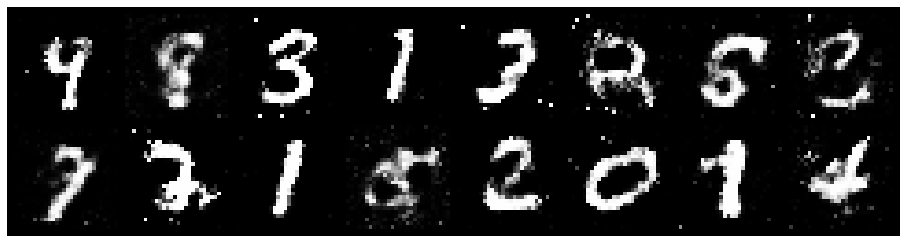

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0599, Generator Loss: 1.3097
D(x): 0.6183, D(G(z)): 0.3384


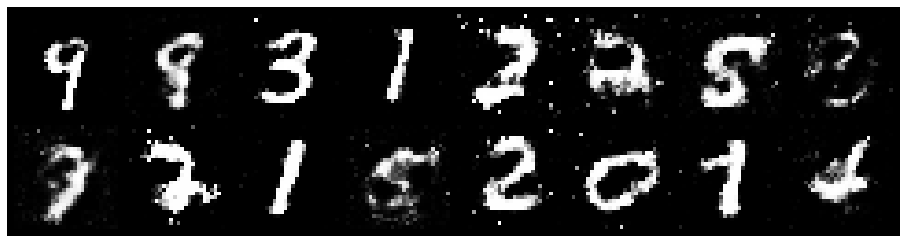

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.0871, Generator Loss: 1.1894
D(x): 0.6971, D(G(z)): 0.3886


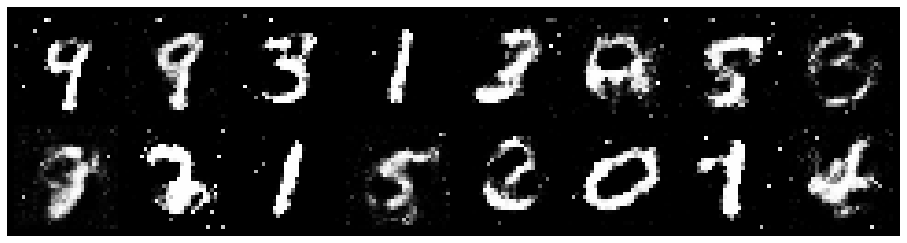

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.1435, Generator Loss: 1.1771
D(x): 0.6097, D(G(z)): 0.3720


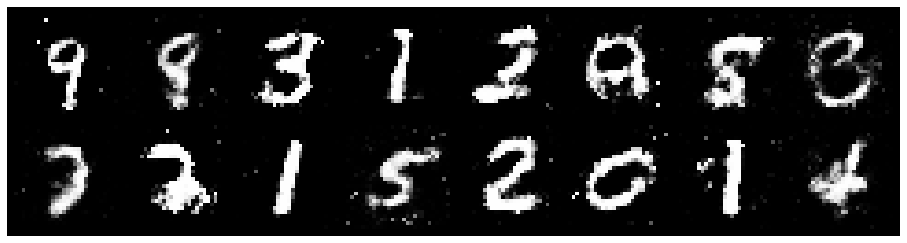

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.1015, Generator Loss: 1.3279
D(x): 0.5408, D(G(z)): 0.2951


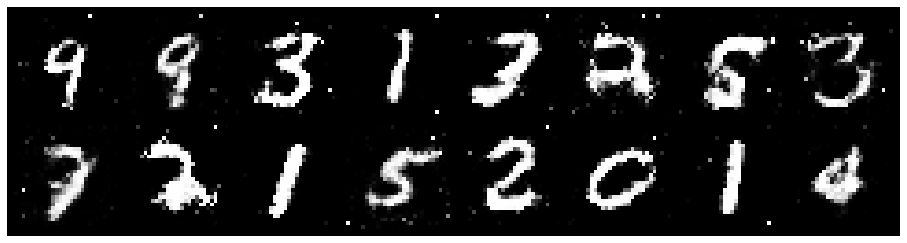

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.1318, Generator Loss: 1.1056
D(x): 0.5599, D(G(z)): 0.3499


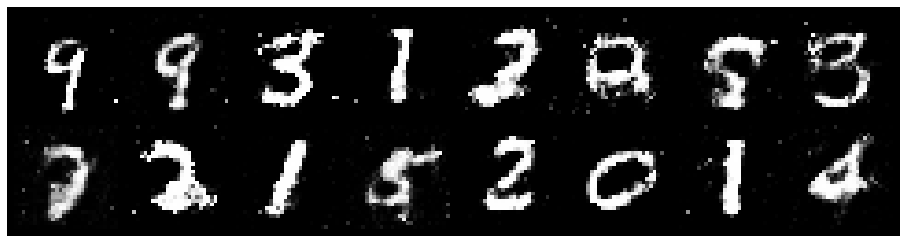

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.0349, Generator Loss: 1.2038
D(x): 0.6301, D(G(z)): 0.3273


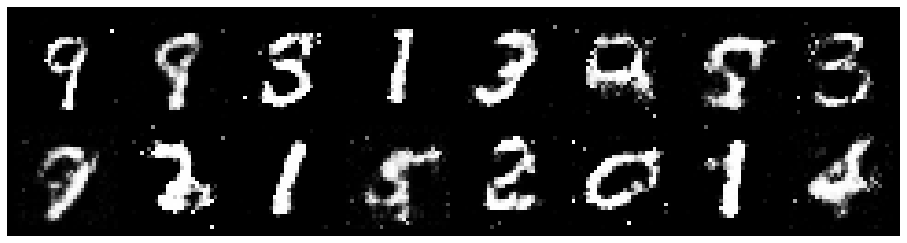

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 0.9004, Generator Loss: 1.5328
D(x): 0.7085, D(G(z)): 0.3396


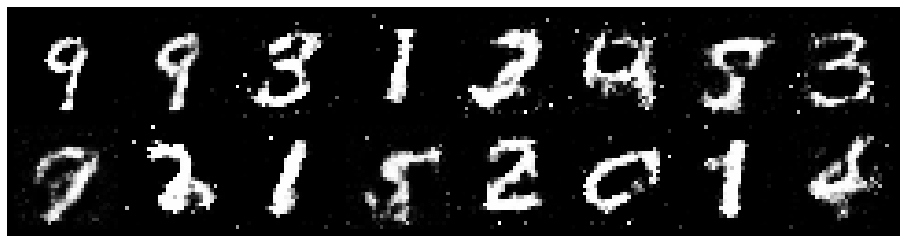

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 0.9798, Generator Loss: 1.1719
D(x): 0.6143, D(G(z)): 0.3027


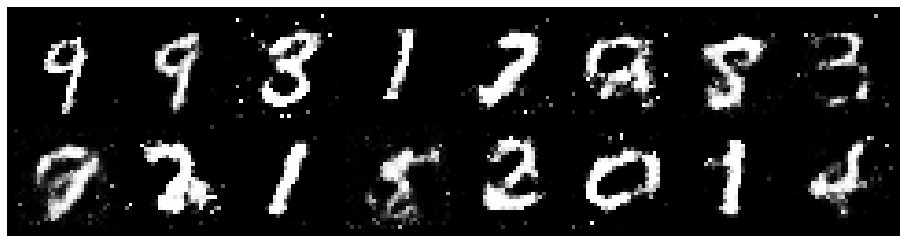

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 0.9793, Generator Loss: 1.1241
D(x): 0.6541, D(G(z)): 0.3391


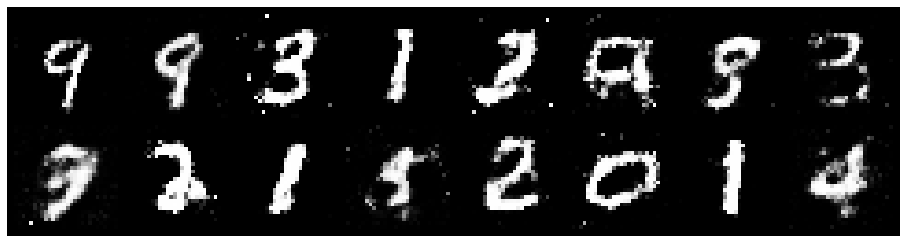

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.0594, Generator Loss: 1.3533
D(x): 0.5910, D(G(z)): 0.3017


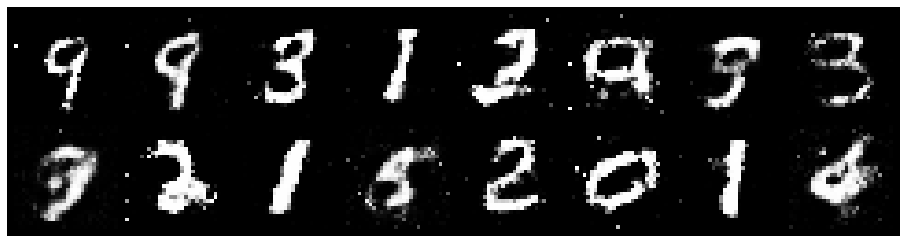

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.1955, Generator Loss: 1.1347
D(x): 0.5784, D(G(z)): 0.3954


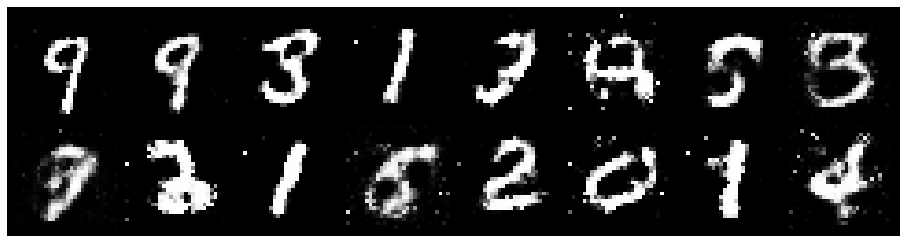

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 0.9095, Generator Loss: 1.2949
D(x): 0.6796, D(G(z)): 0.3180


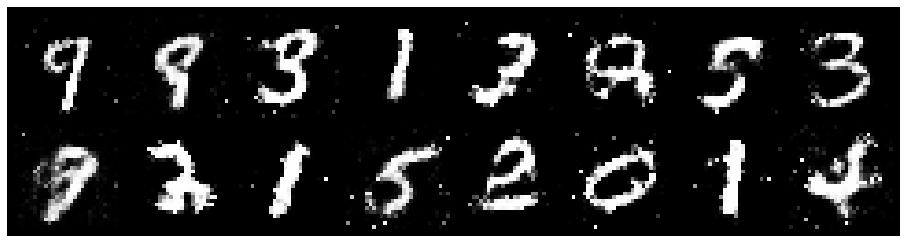

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.0144, Generator Loss: 1.2314
D(x): 0.6845, D(G(z)): 0.3731


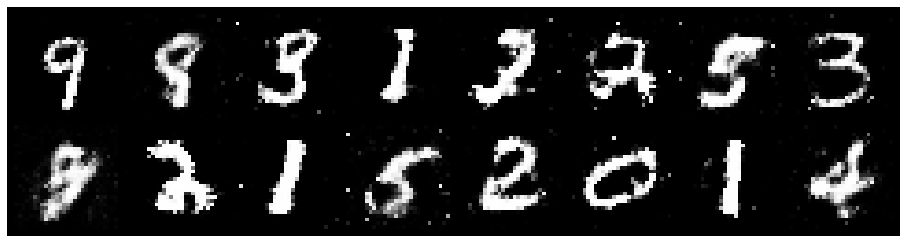

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.0135, Generator Loss: 1.3955
D(x): 0.6567, D(G(z)): 0.3442


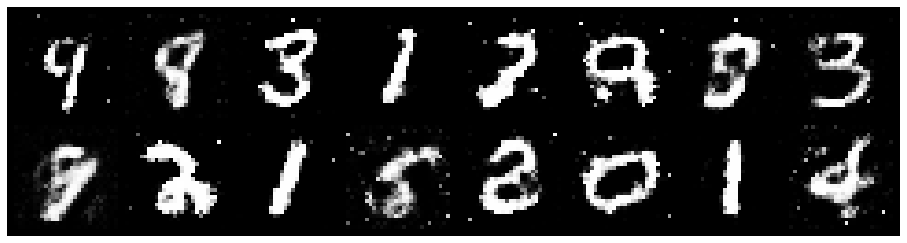

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.0779, Generator Loss: 1.2095
D(x): 0.6215, D(G(z)): 0.3754


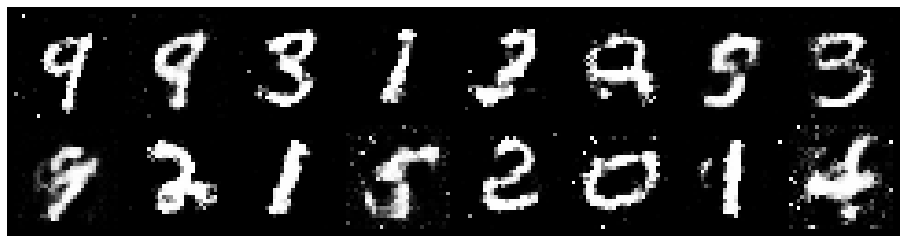

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.0580, Generator Loss: 1.1111
D(x): 0.7191, D(G(z)): 0.4191


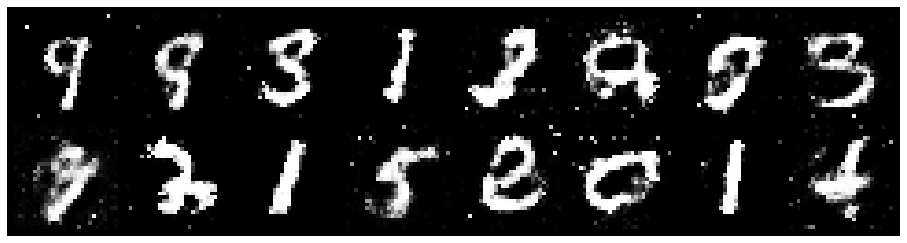

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.0812, Generator Loss: 1.1945
D(x): 0.6209, D(G(z)): 0.3522


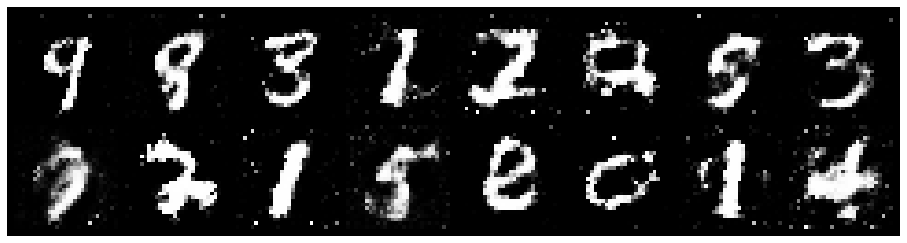

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 0.9930, Generator Loss: 1.4305
D(x): 0.6186, D(G(z)): 0.3135


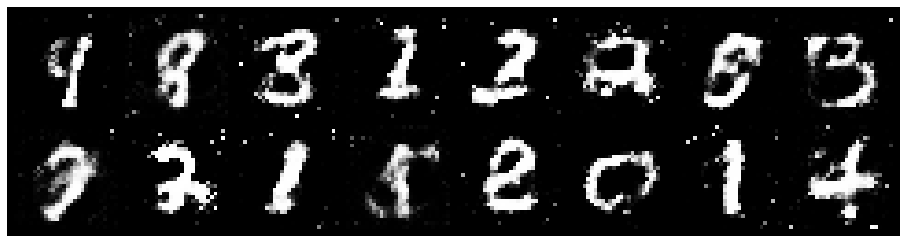

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.0496, Generator Loss: 1.1946
D(x): 0.6495, D(G(z)): 0.3837


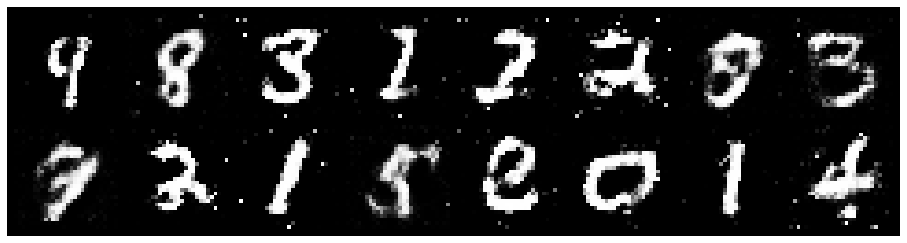

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.1671, Generator Loss: 1.4417
D(x): 0.5887, D(G(z)): 0.3645


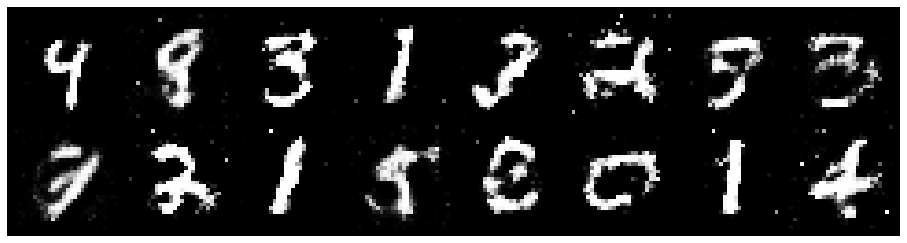

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.2118, Generator Loss: 1.1078
D(x): 0.6218, D(G(z)): 0.4187


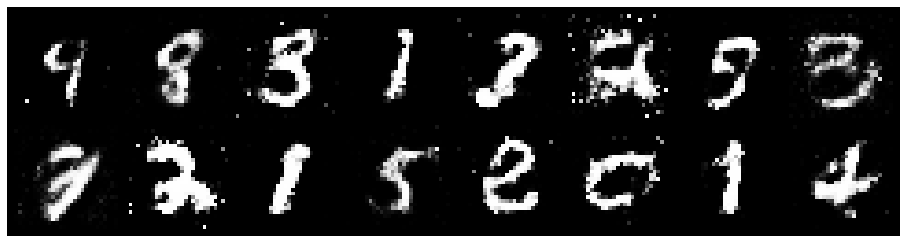

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.0439, Generator Loss: 1.0171
D(x): 0.6633, D(G(z)): 0.4095


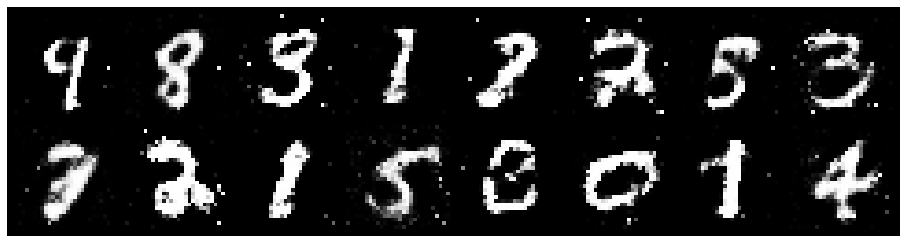

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.1499, Generator Loss: 1.2198
D(x): 0.5748, D(G(z)): 0.3655


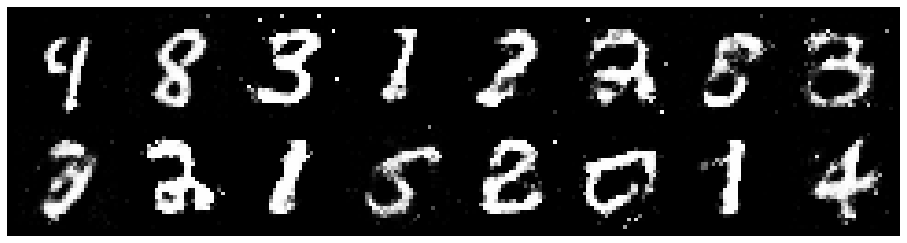

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.0611, Generator Loss: 1.3739
D(x): 0.6054, D(G(z)): 0.3265


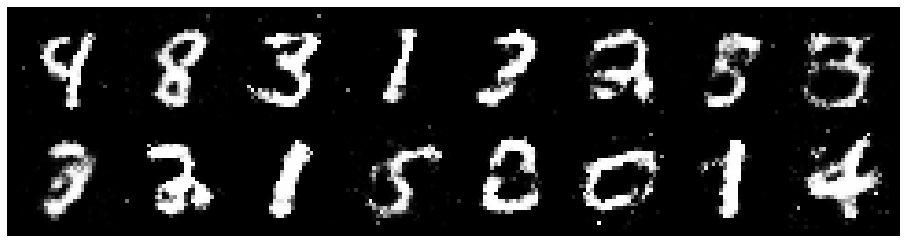

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.1391, Generator Loss: 0.9716
D(x): 0.6353, D(G(z)): 0.4227


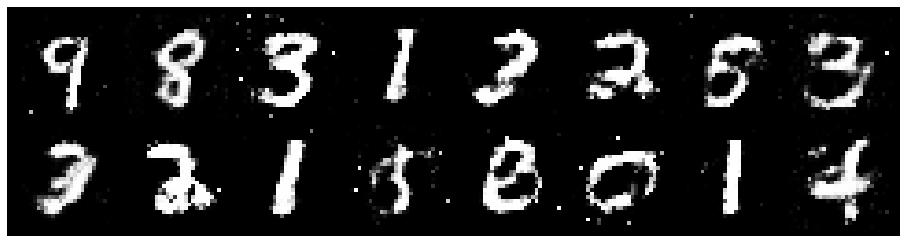

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.1129, Generator Loss: 1.0503
D(x): 0.5829, D(G(z)): 0.3548


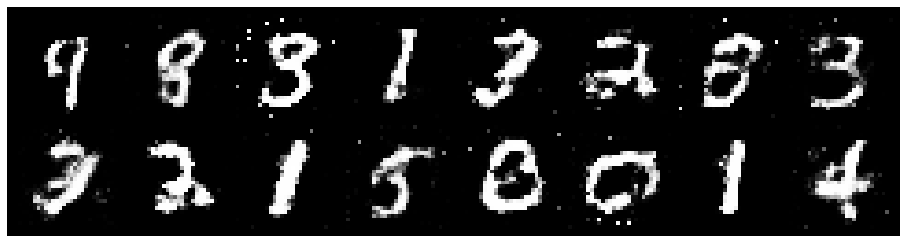

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.3724, Generator Loss: 1.1974
D(x): 0.5802, D(G(z)): 0.4527


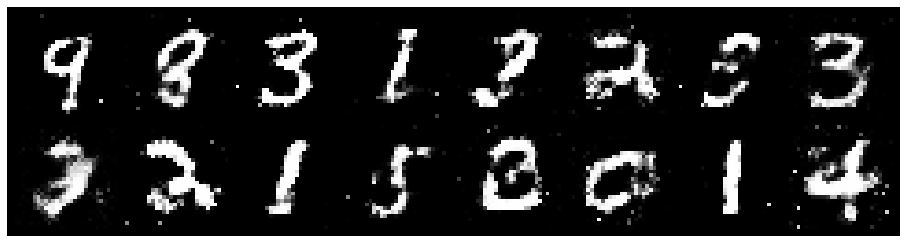

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.2648, Generator Loss: 1.0863
D(x): 0.6498, D(G(z)): 0.4718


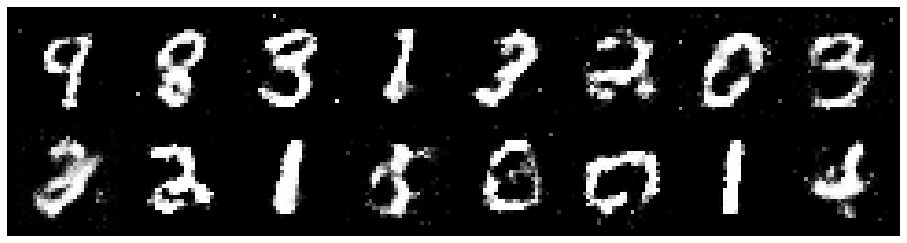

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.2285, Generator Loss: 0.9673
D(x): 0.5759, D(G(z)): 0.4162


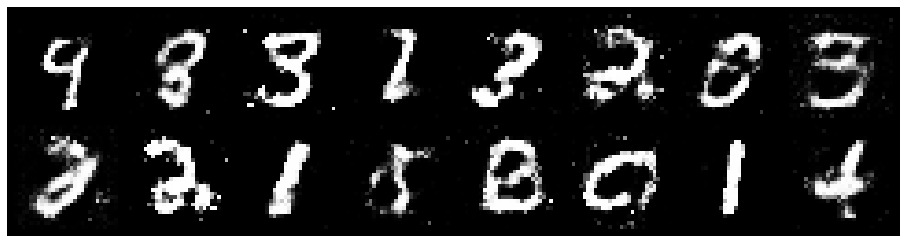

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.1290, Generator Loss: 1.0347
D(x): 0.6252, D(G(z)): 0.3975


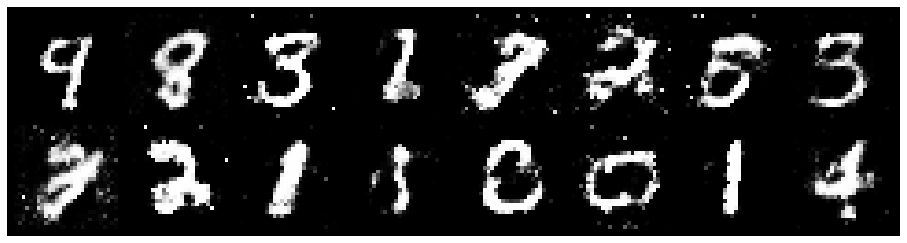

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.2218, Generator Loss: 1.1268
D(x): 0.5622, D(G(z)): 0.3773


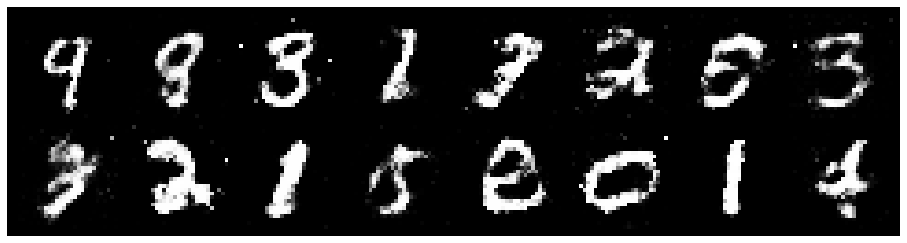

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.2021, Generator Loss: 1.3439
D(x): 0.6217, D(G(z)): 0.4143


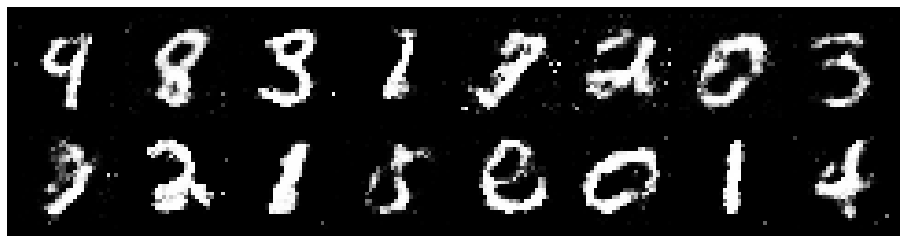

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.1928, Generator Loss: 1.1510
D(x): 0.5527, D(G(z)): 0.3566


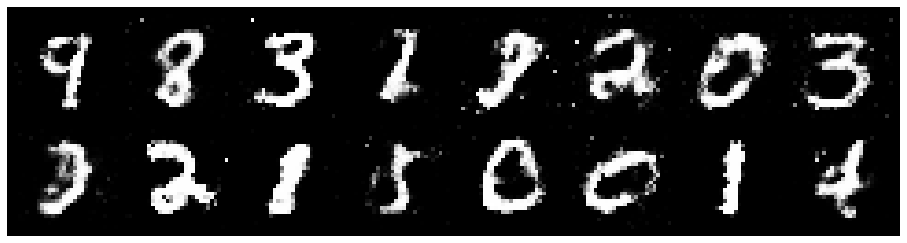

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.1618, Generator Loss: 1.0769
D(x): 0.6035, D(G(z)): 0.3990


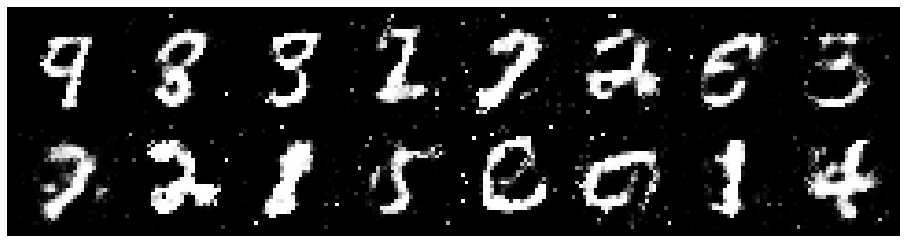

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.0306, Generator Loss: 1.1118
D(x): 0.6214, D(G(z)): 0.3565


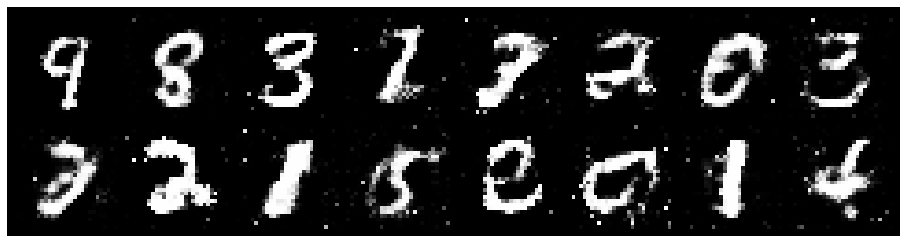

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0775, Generator Loss: 1.2435
D(x): 0.5693, D(G(z)): 0.3304


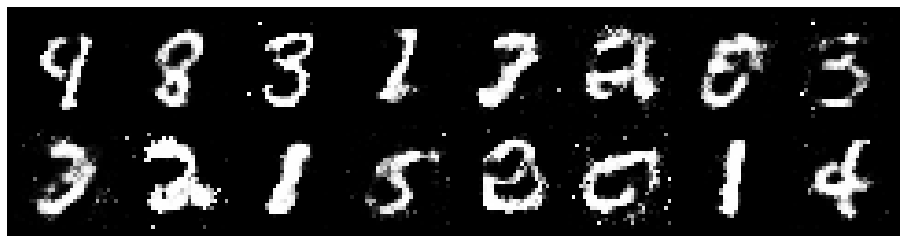

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.0584, Generator Loss: 1.0642
D(x): 0.6650, D(G(z)): 0.3944


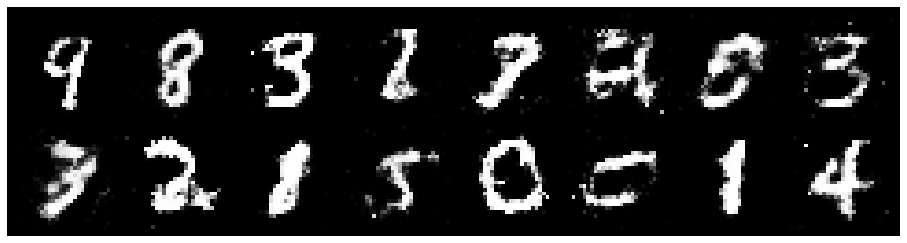

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.0546, Generator Loss: 0.9408
D(x): 0.6633, D(G(z)): 0.4086


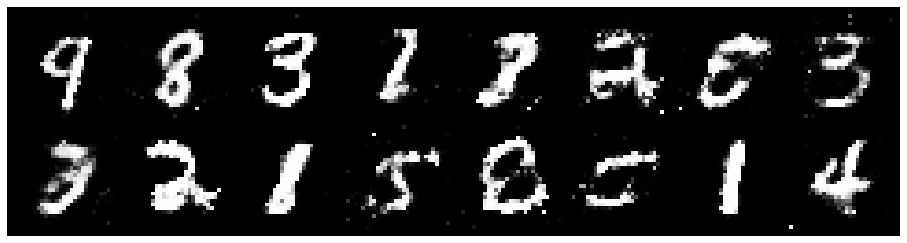

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.0289, Generator Loss: 0.9628
D(x): 0.6820, D(G(z)): 0.4134


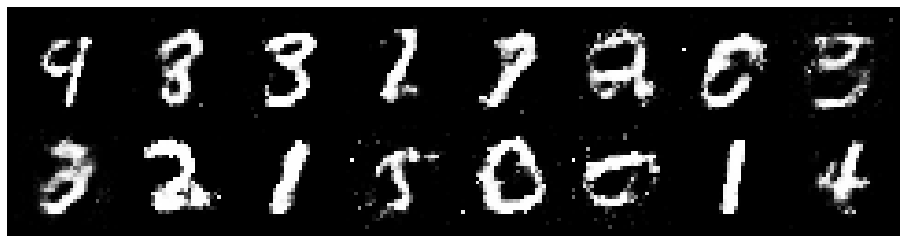

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.1119, Generator Loss: 1.1706
D(x): 0.5866, D(G(z)): 0.3548


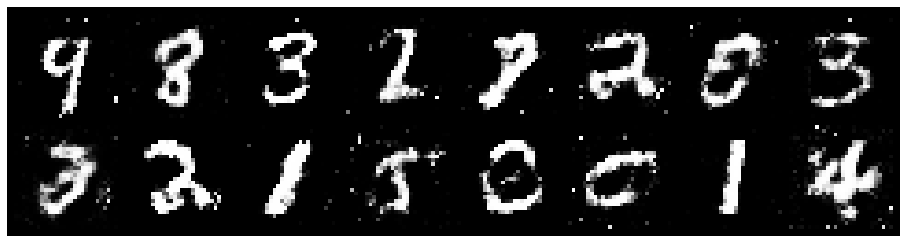

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.2335, Generator Loss: 0.9710
D(x): 0.5462, D(G(z)): 0.4085


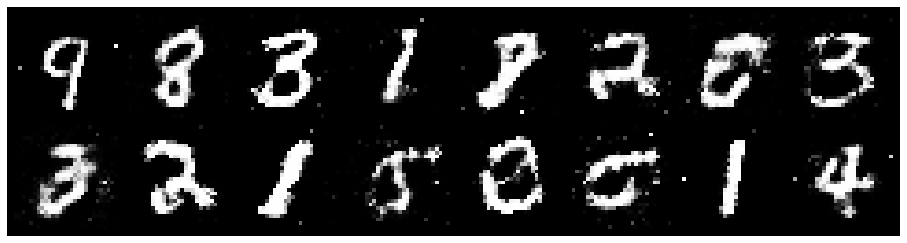

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.2172, Generator Loss: 0.9811
D(x): 0.6026, D(G(z)): 0.4269


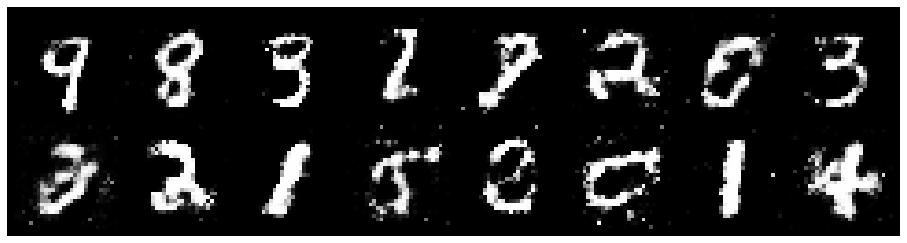

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.1693, Generator Loss: 0.8488
D(x): 0.6013, D(G(z)): 0.3880


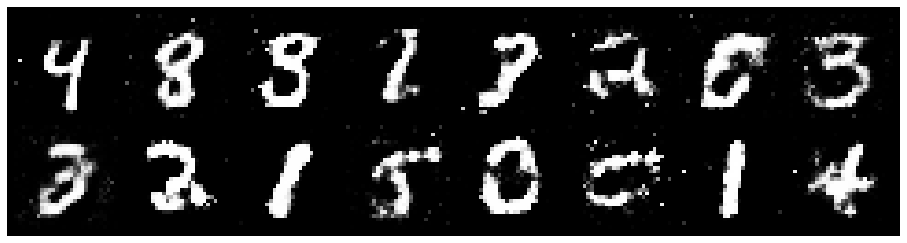

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.1298, Generator Loss: 1.1998
D(x): 0.6296, D(G(z)): 0.3905


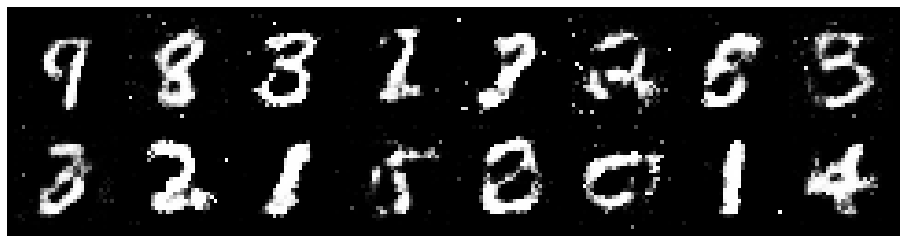

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.1558, Generator Loss: 1.1102
D(x): 0.6300, D(G(z)): 0.4040


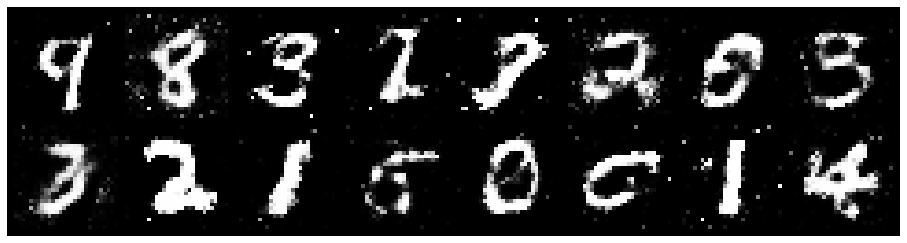

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.0233, Generator Loss: 1.1406
D(x): 0.6344, D(G(z)): 0.3627


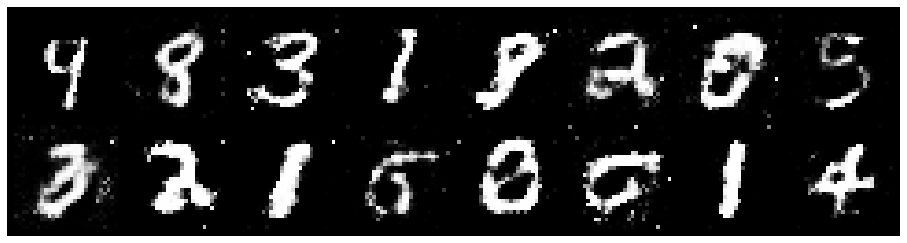

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.0514, Generator Loss: 1.1632
D(x): 0.6707, D(G(z)): 0.3924


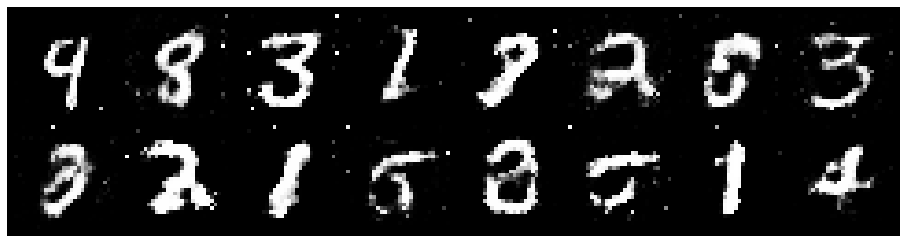

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.0692, Generator Loss: 1.1370
D(x): 0.6575, D(G(z)): 0.4032


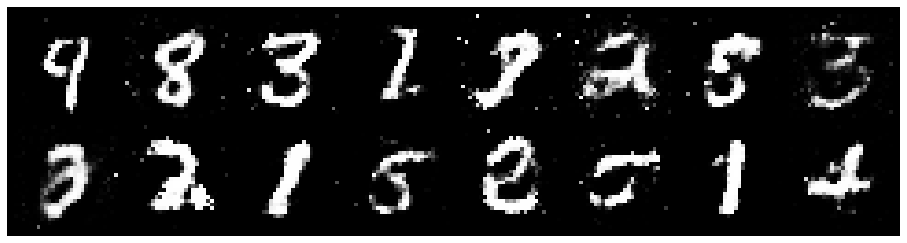

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.0232, Generator Loss: 1.0702
D(x): 0.6176, D(G(z)): 0.3315


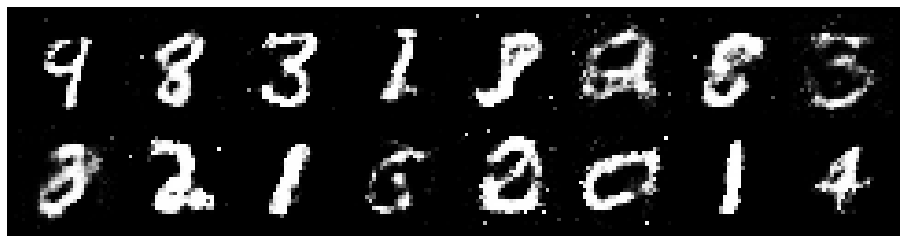

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.1660, Generator Loss: 0.9575
D(x): 0.5850, D(G(z)): 0.3887


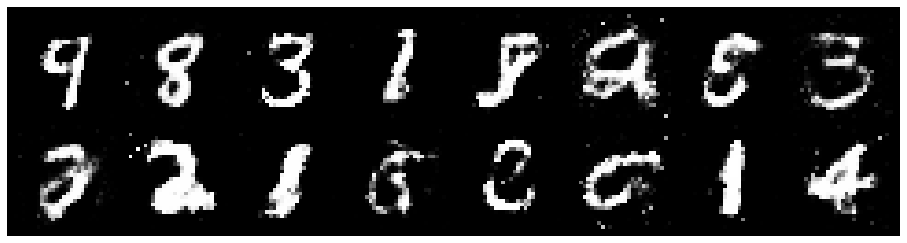

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.1347, Generator Loss: 1.0436
D(x): 0.6134, D(G(z)): 0.3996


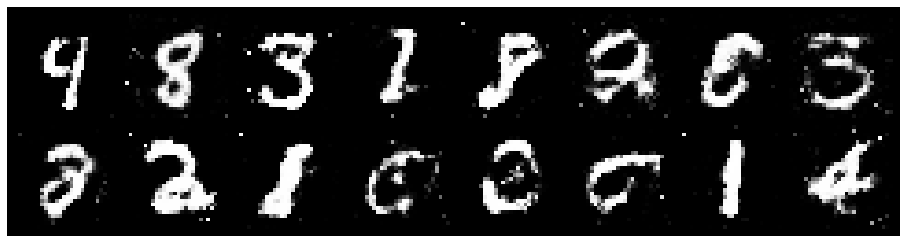

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.3251, Generator Loss: 1.0990
D(x): 0.5574, D(G(z)): 0.4457


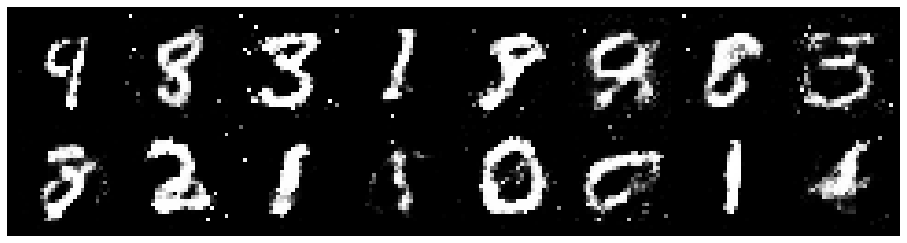

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.2204, Generator Loss: 0.9111
D(x): 0.6254, D(G(z)): 0.4442


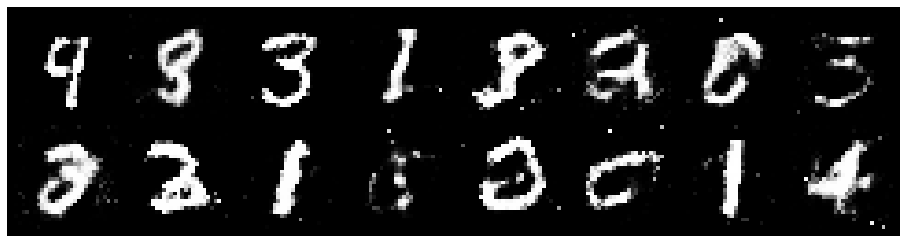

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.1999, Generator Loss: 1.2057
D(x): 0.5631, D(G(z)): 0.3647


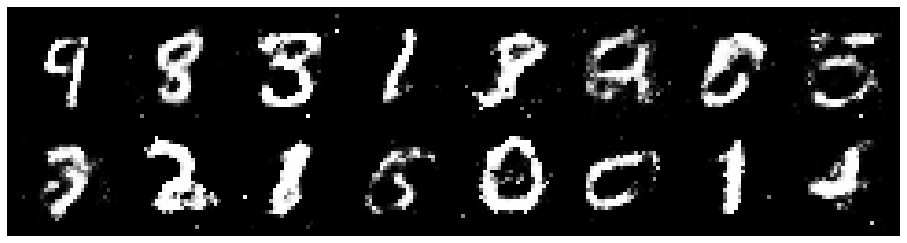

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.1060, Generator Loss: 1.1704
D(x): 0.5505, D(G(z)): 0.3181


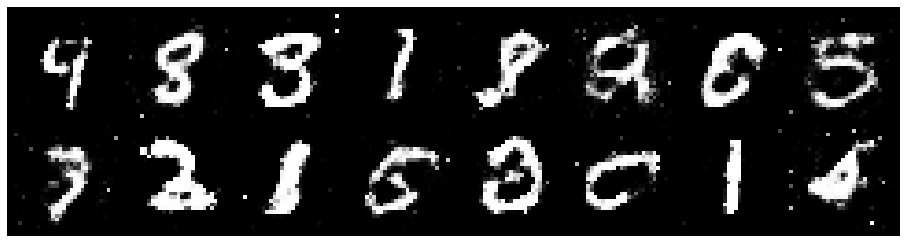

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.1250, Generator Loss: 0.9691
D(x): 0.5867, D(G(z)): 0.4008


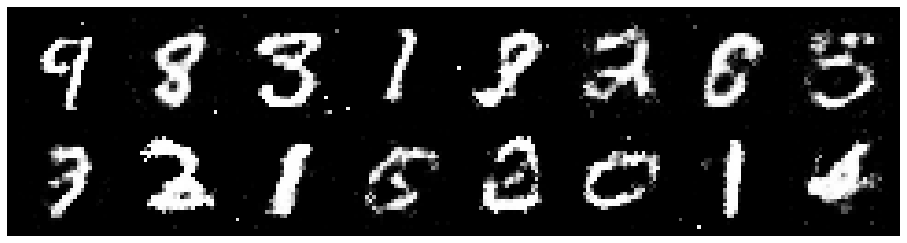

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.1343, Generator Loss: 1.2166
D(x): 0.6283, D(G(z)): 0.4090


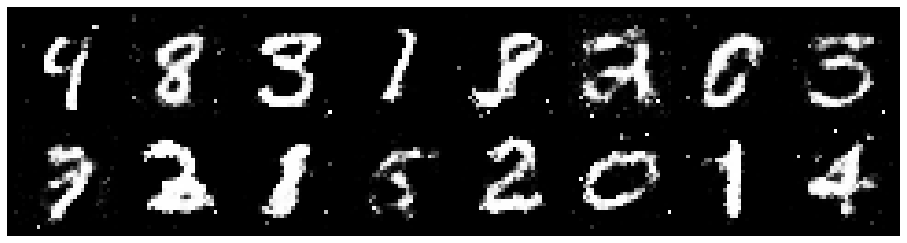

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.1305, Generator Loss: 1.2420
D(x): 0.6000, D(G(z)): 0.3647


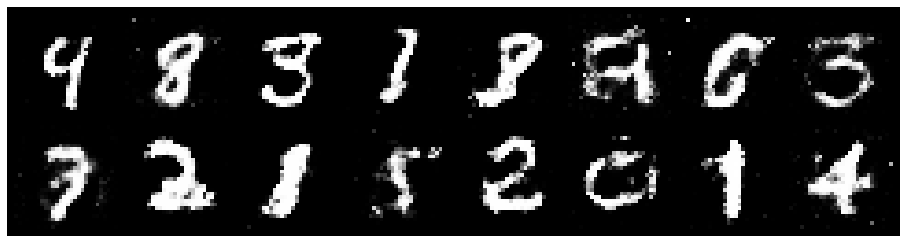

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.1922, Generator Loss: 1.0112
D(x): 0.6063, D(G(z)): 0.4284


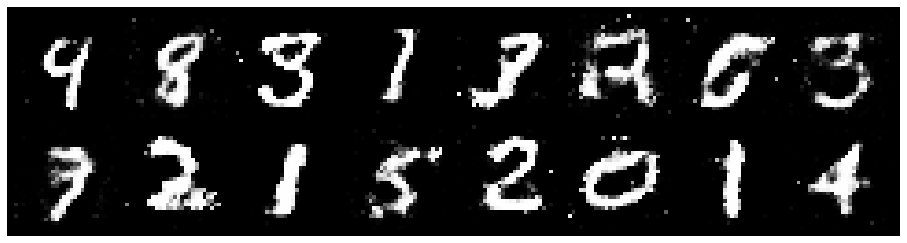

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.2074, Generator Loss: 1.4764
D(x): 0.5617, D(G(z)): 0.3604


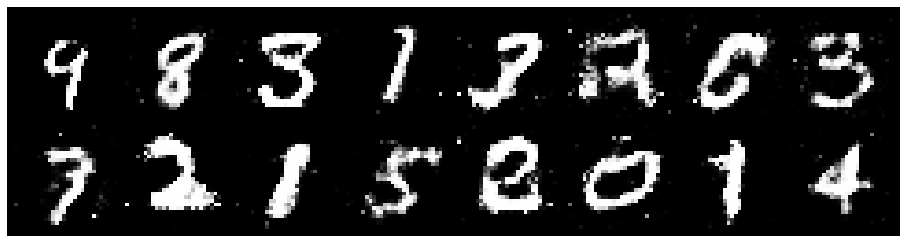

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.0594, Generator Loss: 1.1611
D(x): 0.6076, D(G(z)): 0.3620


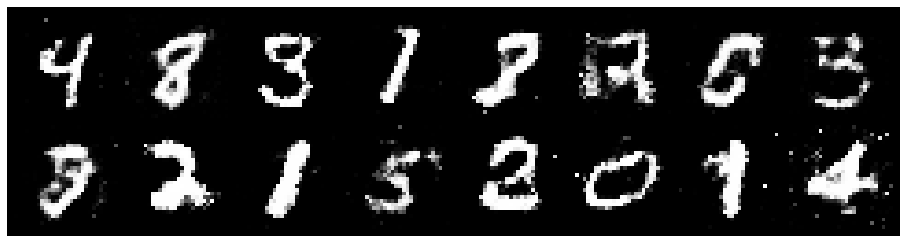

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.0882, Generator Loss: 1.0978
D(x): 0.6168, D(G(z)): 0.3781


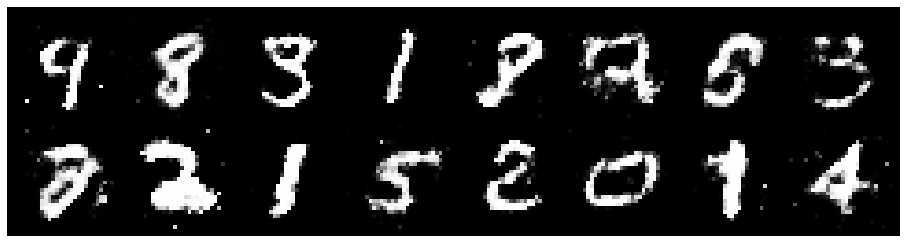

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.2164, Generator Loss: 0.9810
D(x): 0.5825, D(G(z)): 0.4208


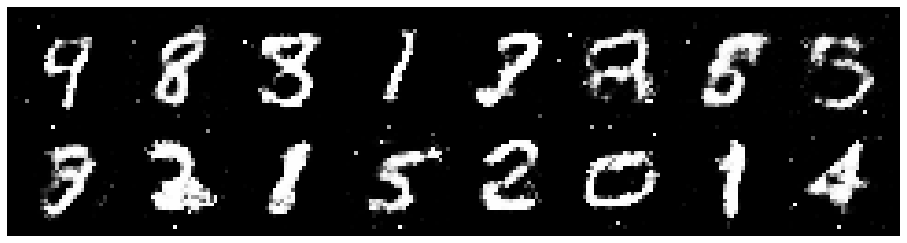

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.1786, Generator Loss: 0.8677
D(x): 0.6145, D(G(z)): 0.4354


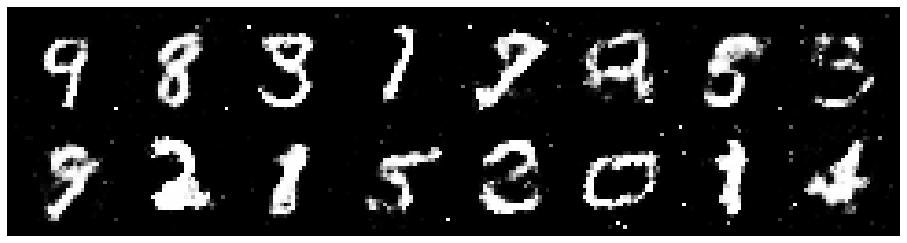

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.2644, Generator Loss: 1.2218
D(x): 0.6019, D(G(z)): 0.4224


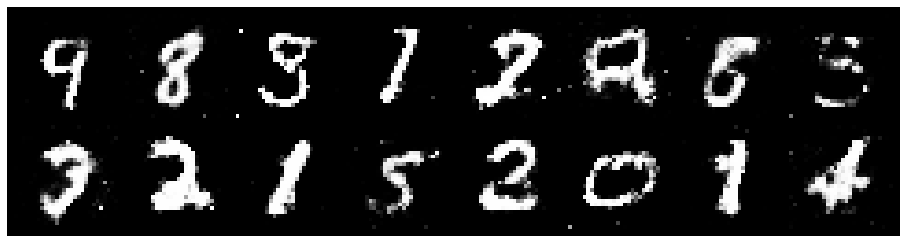

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.1743, Generator Loss: 1.0239
D(x): 0.6124, D(G(z)): 0.4099


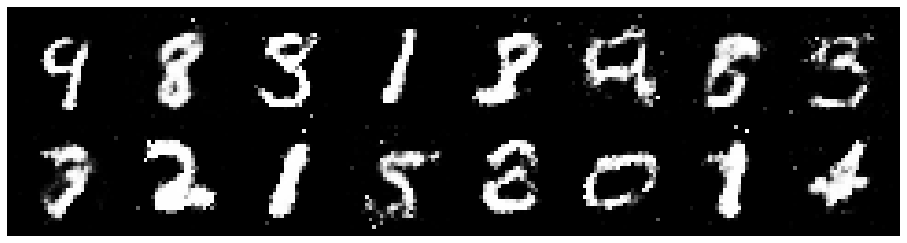

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.2102, Generator Loss: 1.1745
D(x): 0.5671, D(G(z)): 0.3901


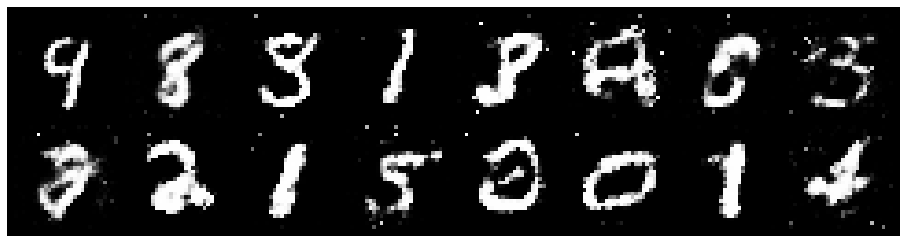

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 0.9864, Generator Loss: 1.0381
D(x): 0.6511, D(G(z)): 0.3512


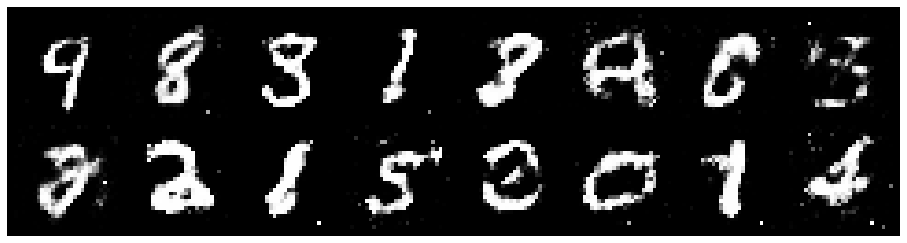

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.0587, Generator Loss: 1.2990
D(x): 0.5906, D(G(z)): 0.3221


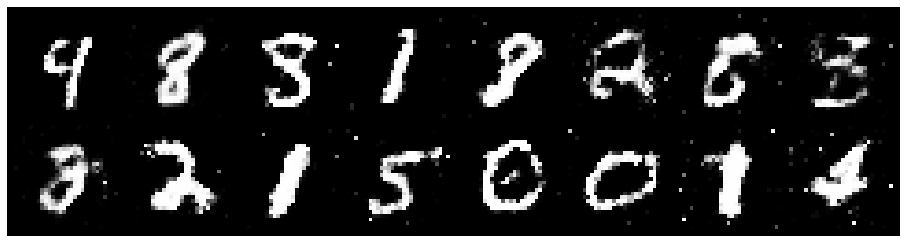

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.1989, Generator Loss: 1.1510
D(x): 0.6118, D(G(z)): 0.4301


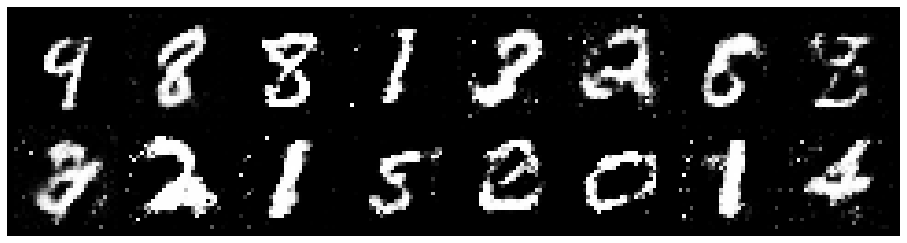

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.0554, Generator Loss: 1.1054
D(x): 0.6458, D(G(z)): 0.3669


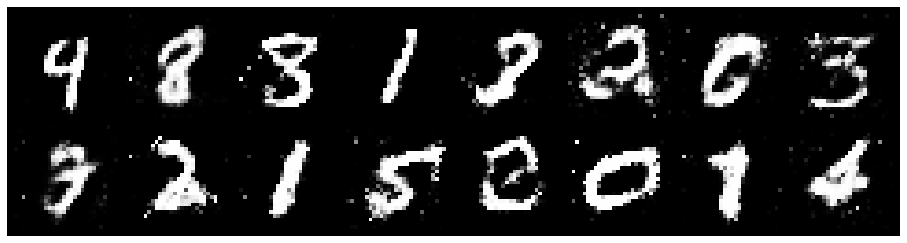

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.2482, Generator Loss: 1.0185
D(x): 0.6192, D(G(z)): 0.4655


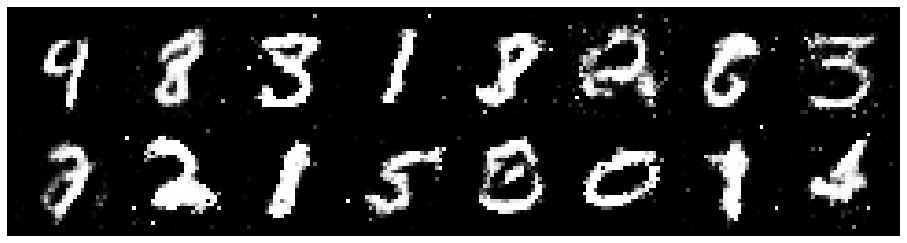

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.0223, Generator Loss: 0.9844
D(x): 0.6736, D(G(z)): 0.4108


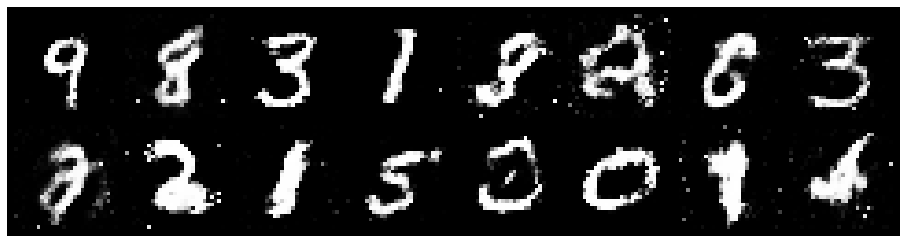

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.1244, Generator Loss: 1.1196
D(x): 0.5978, D(G(z)): 0.3770


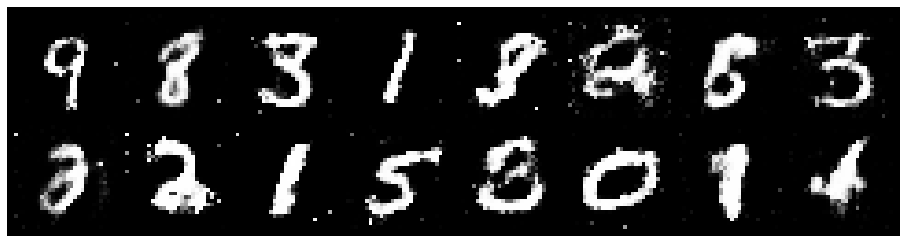

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.2328, Generator Loss: 1.0038
D(x): 0.5933, D(G(z)): 0.4249


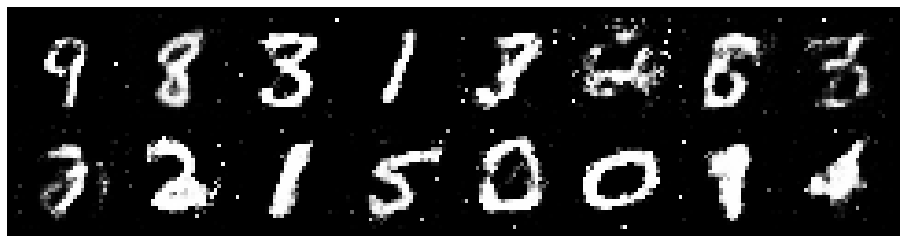

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.2347, Generator Loss: 1.0849
D(x): 0.5454, D(G(z)): 0.3830


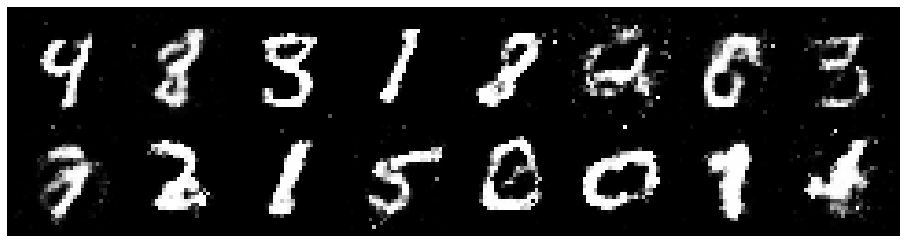

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.2741, Generator Loss: 1.0207
D(x): 0.5598, D(G(z)): 0.3880


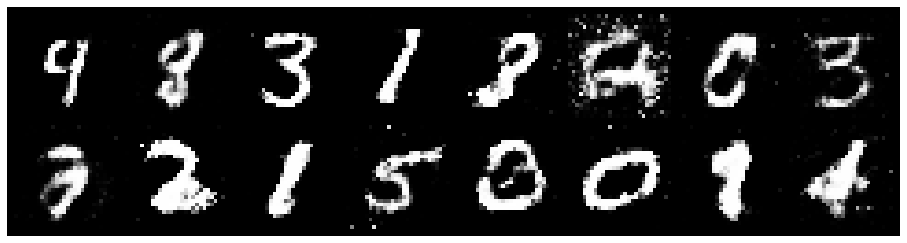

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1436, Generator Loss: 1.0035
D(x): 0.6166, D(G(z)): 0.4020


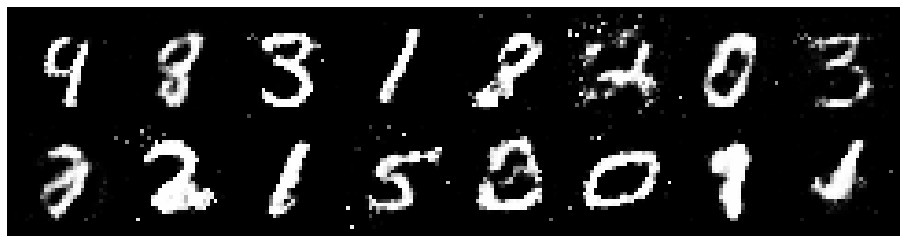

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.1686, Generator Loss: 1.3225
D(x): 0.5570, D(G(z)): 0.3575


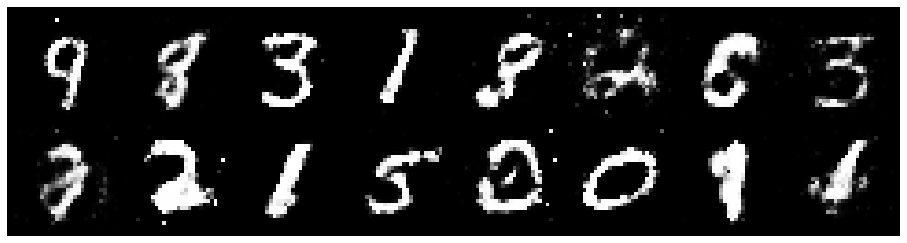

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.1337, Generator Loss: 1.3287
D(x): 0.5777, D(G(z)): 0.3412


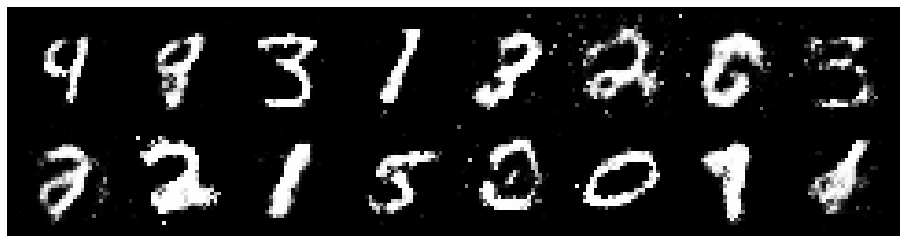

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1075, Generator Loss: 0.9902
D(x): 0.6025, D(G(z)): 0.3946


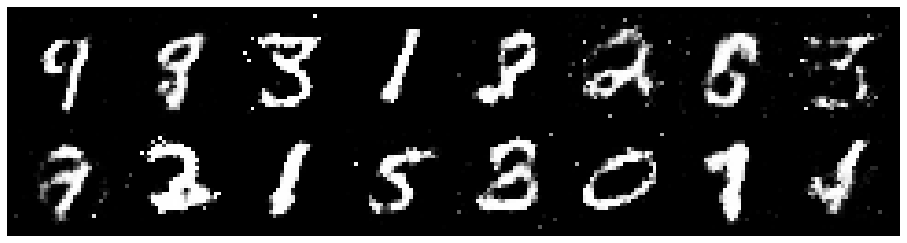

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.2835, Generator Loss: 0.8725
D(x): 0.5732, D(G(z)): 0.4701


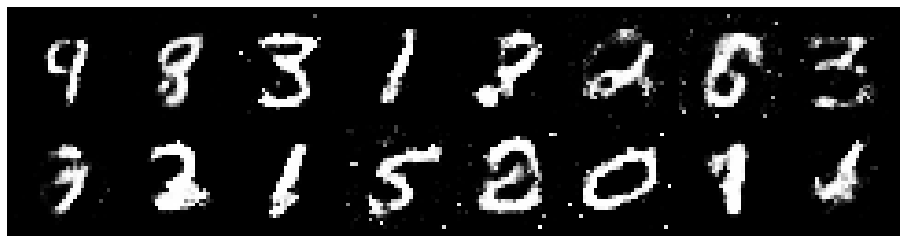

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.1827, Generator Loss: 1.0986
D(x): 0.5726, D(G(z)): 0.3939


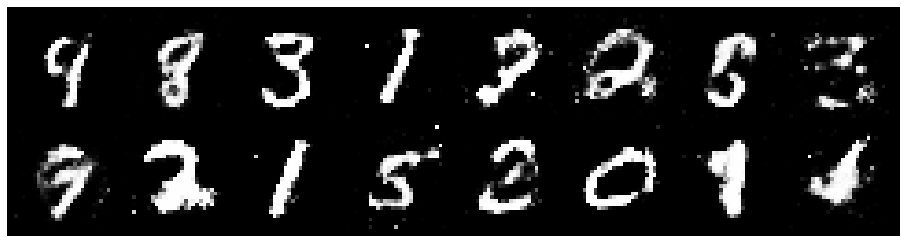

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.1969, Generator Loss: 0.9077
D(x): 0.5442, D(G(z)): 0.3918


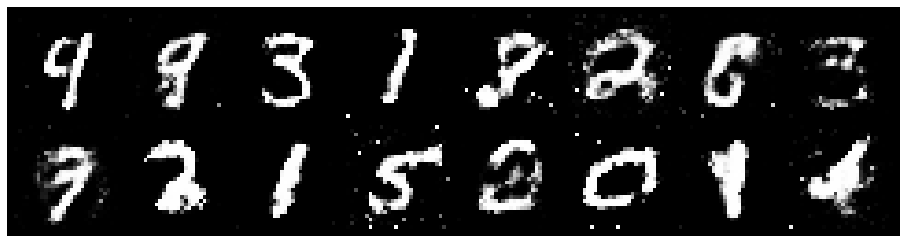

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.0394, Generator Loss: 1.0049
D(x): 0.6305, D(G(z)): 0.3657


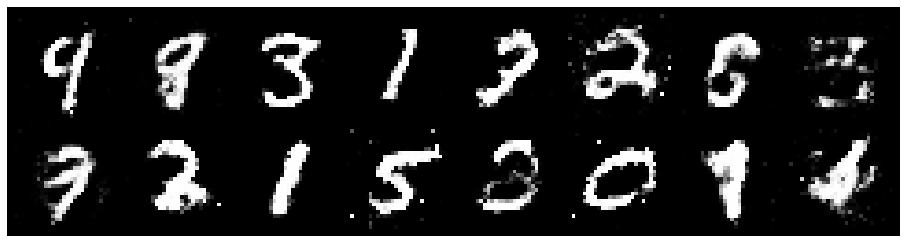

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.3007, Generator Loss: 0.9629
D(x): 0.5264, D(G(z)): 0.4164


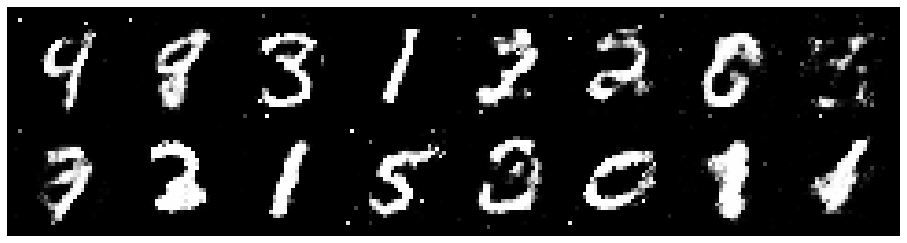

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1845, Generator Loss: 0.9138
D(x): 0.5587, D(G(z)): 0.3955


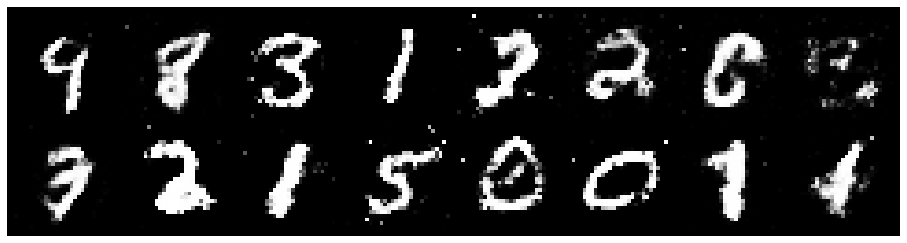

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 0.9697, Generator Loss: 1.3158
D(x): 0.6265, D(G(z)): 0.3217


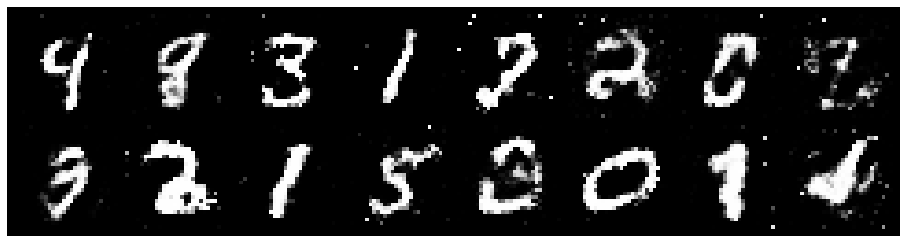

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.2343, Generator Loss: 0.9087
D(x): 0.5587, D(G(z)): 0.4074


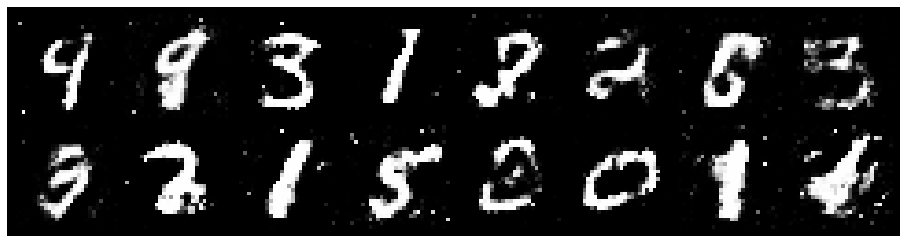

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.1373, Generator Loss: 0.9940
D(x): 0.6217, D(G(z)): 0.4308


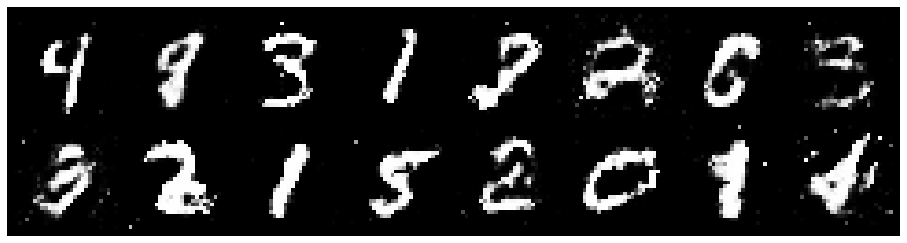

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.0985, Generator Loss: 1.2568
D(x): 0.5840, D(G(z)): 0.3456


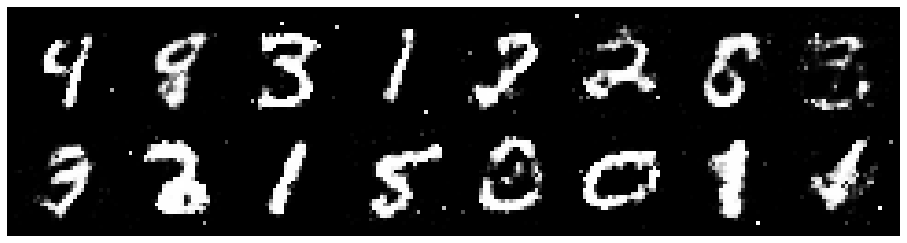

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.0425, Generator Loss: 1.3403
D(x): 0.6283, D(G(z)): 0.3374


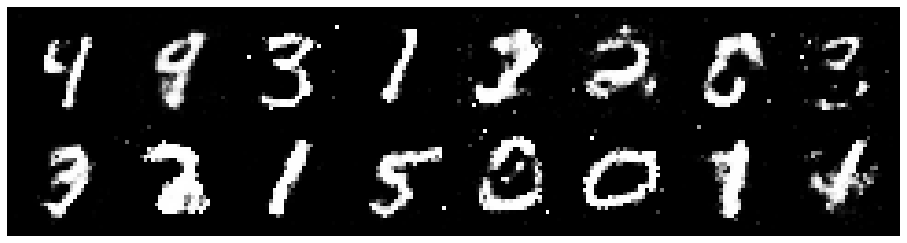

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.0913, Generator Loss: 1.3049
D(x): 0.6076, D(G(z)): 0.3601


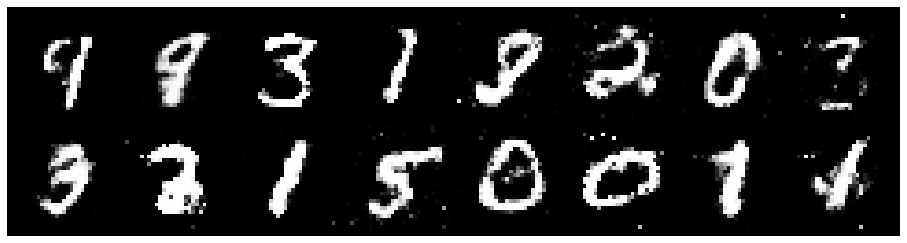

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.2292, Generator Loss: 1.0084
D(x): 0.5838, D(G(z)): 0.4112


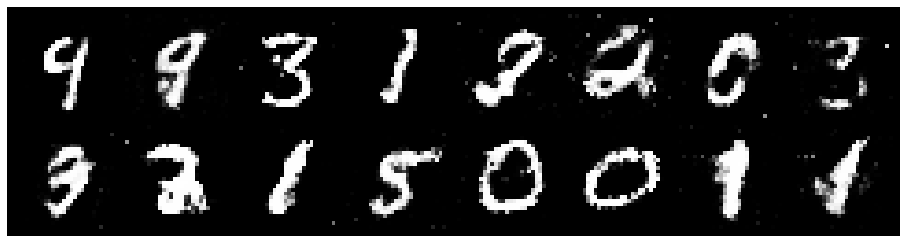

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1181, Generator Loss: 1.0548
D(x): 0.5991, D(G(z)): 0.3839


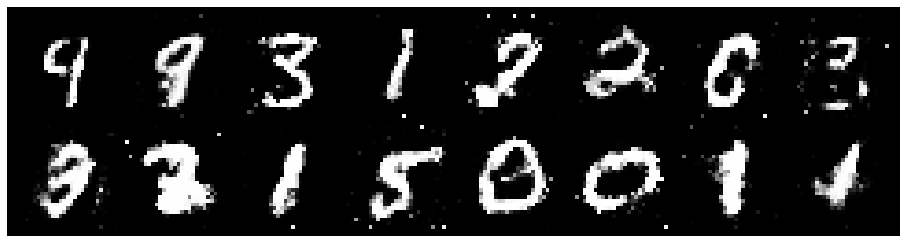

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.1266, Generator Loss: 1.0164
D(x): 0.5708, D(G(z)): 0.3741


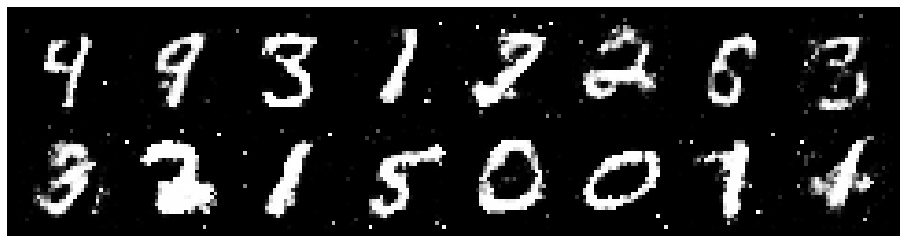

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.1438, Generator Loss: 1.0175
D(x): 0.5646, D(G(z)): 0.3467


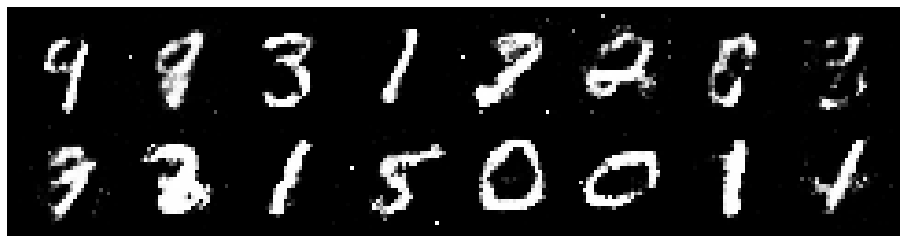

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.2454, Generator Loss: 0.9735
D(x): 0.5669, D(G(z)): 0.4253


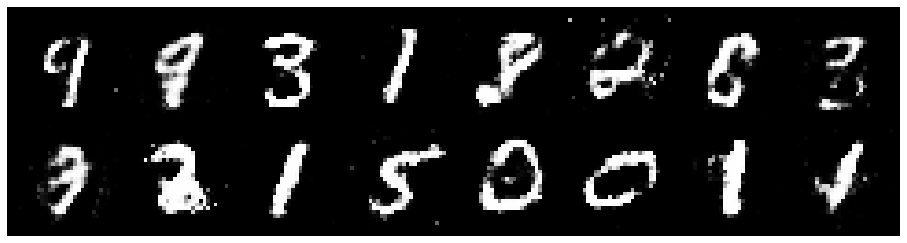

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2548, Generator Loss: 0.8642
D(x): 0.5945, D(G(z)): 0.4636


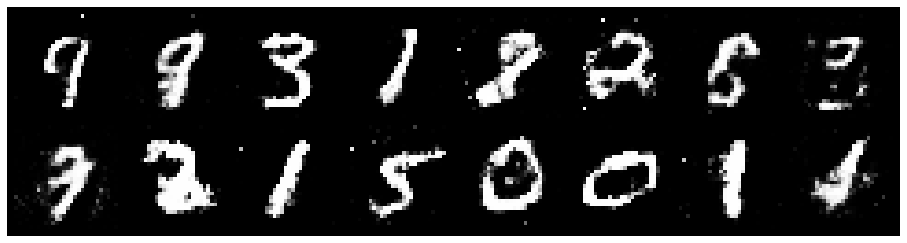

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.2691, Generator Loss: 0.9763
D(x): 0.5873, D(G(z)): 0.4627


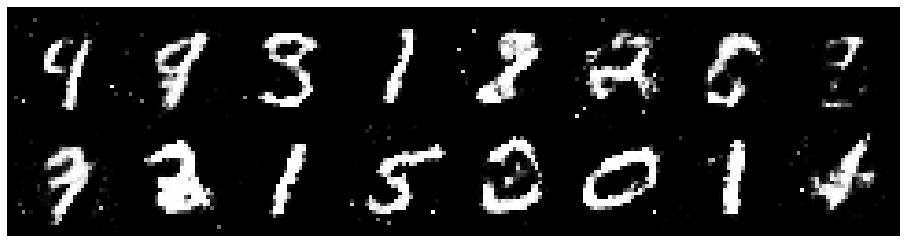

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.1413, Generator Loss: 1.1015
D(x): 0.5722, D(G(z)): 0.3778


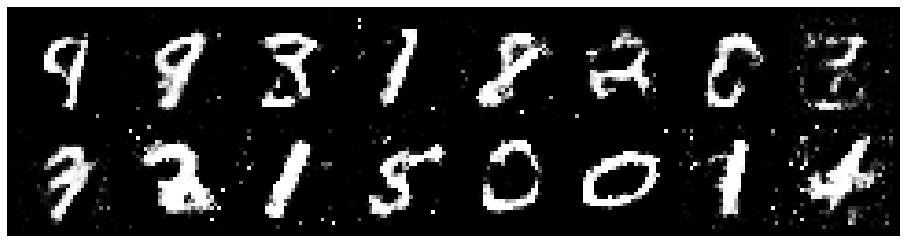

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.2585, Generator Loss: 0.8939
D(x): 0.6165, D(G(z)): 0.4602


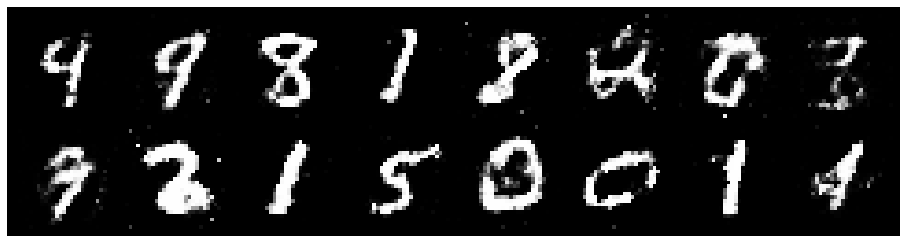

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.1797, Generator Loss: 1.0854
D(x): 0.5441, D(G(z)): 0.3646


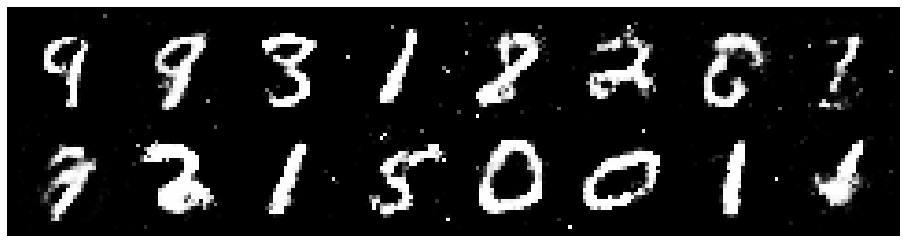

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.0756, Generator Loss: 1.1959
D(x): 0.5866, D(G(z)): 0.3465


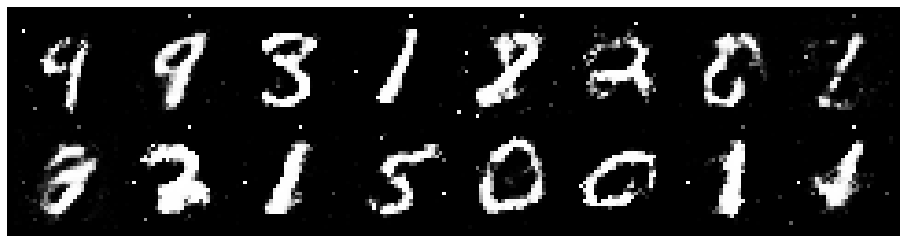

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.0684, Generator Loss: 1.1797
D(x): 0.6048, D(G(z)): 0.3315


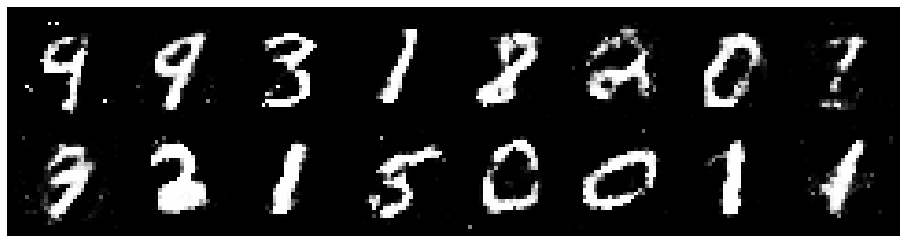

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.1878, Generator Loss: 1.1351
D(x): 0.5858, D(G(z)): 0.3908


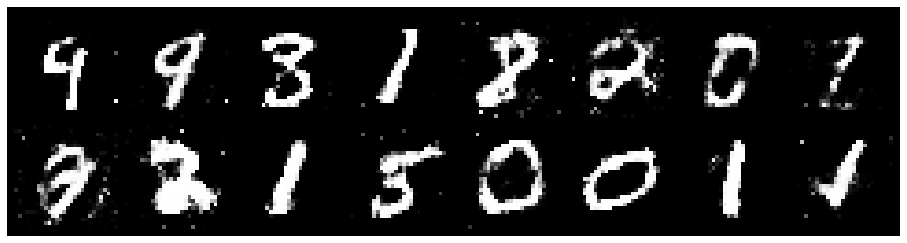

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.1507, Generator Loss: 0.9204
D(x): 0.6375, D(G(z)): 0.4284


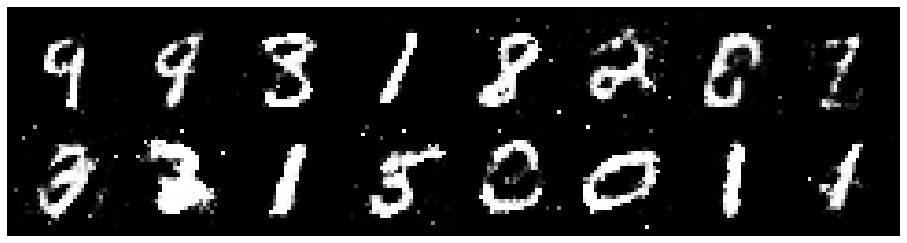

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.1064, Generator Loss: 1.0722
D(x): 0.5829, D(G(z)): 0.3785


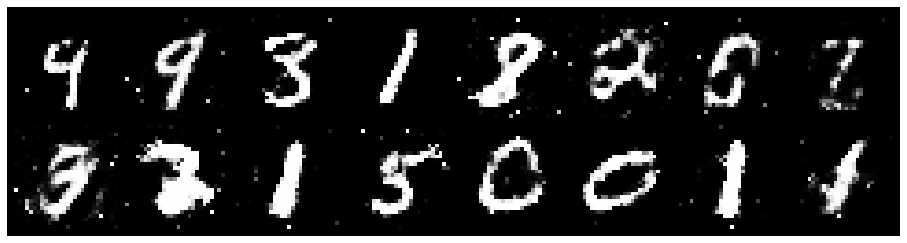

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.1067, Generator Loss: 1.1770
D(x): 0.5848, D(G(z)): 0.3591


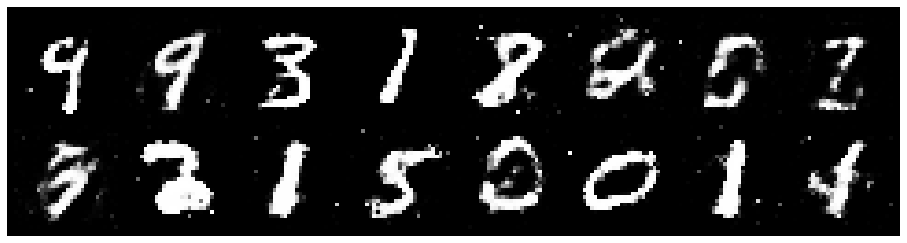

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.1019, Generator Loss: 0.8833
D(x): 0.5993, D(G(z)): 0.3996


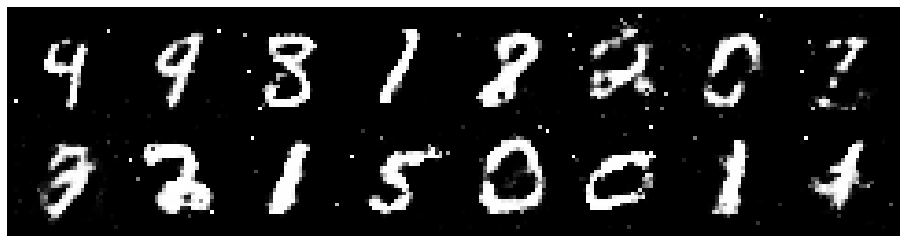

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 0.9850, Generator Loss: 1.1026
D(x): 0.6948, D(G(z)): 0.3896


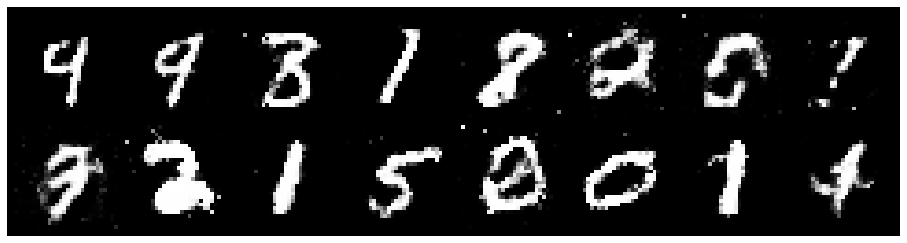

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.1723, Generator Loss: 1.0777
D(x): 0.6079, D(G(z)): 0.4164


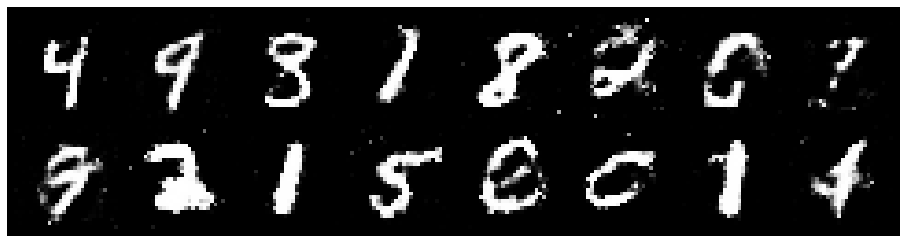

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 0.9985, Generator Loss: 0.9988
D(x): 0.6761, D(G(z)): 0.4034


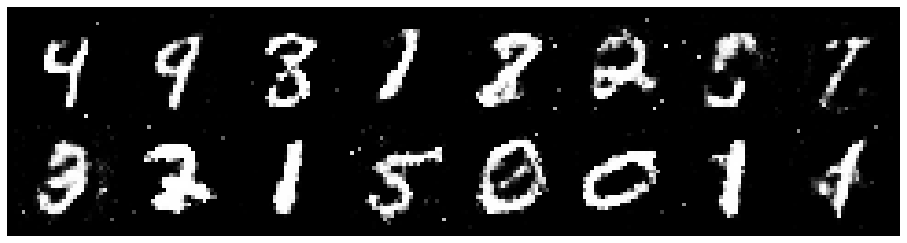

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.0522, Generator Loss: 1.0315
D(x): 0.6855, D(G(z)): 0.4245


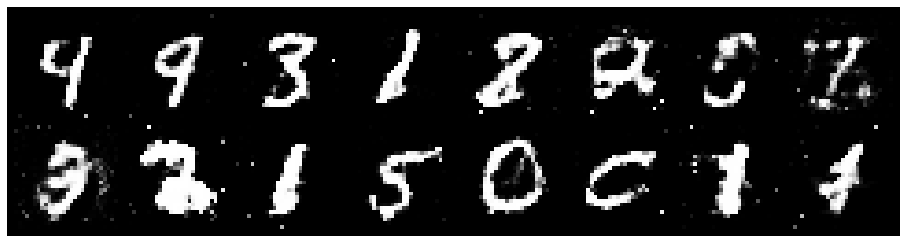

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.3439, Generator Loss: 0.9178
D(x): 0.5482, D(G(z)): 0.4632


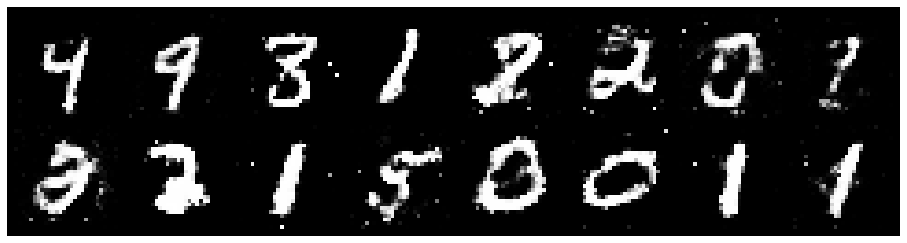

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1726, Generator Loss: 1.1670
D(x): 0.5701, D(G(z)): 0.3766


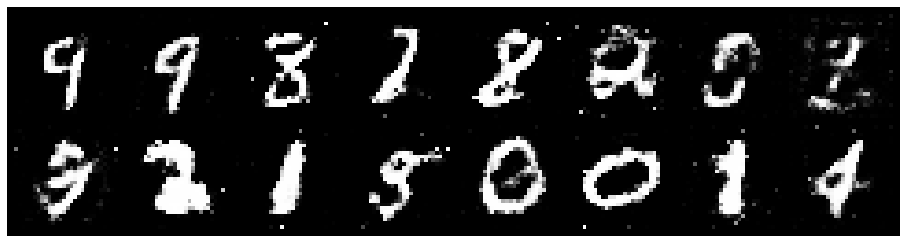

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.0911, Generator Loss: 1.1273
D(x): 0.6240, D(G(z)): 0.3917


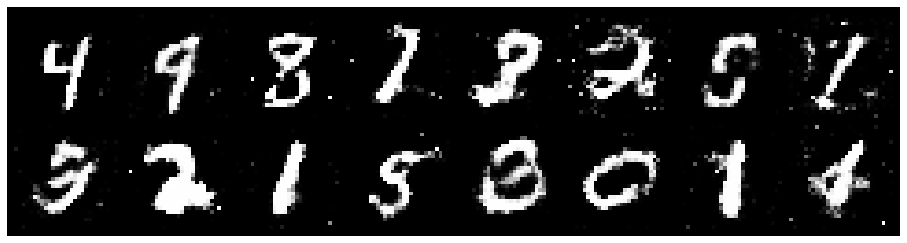

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.1747, Generator Loss: 0.9926
D(x): 0.6192, D(G(z)): 0.4394


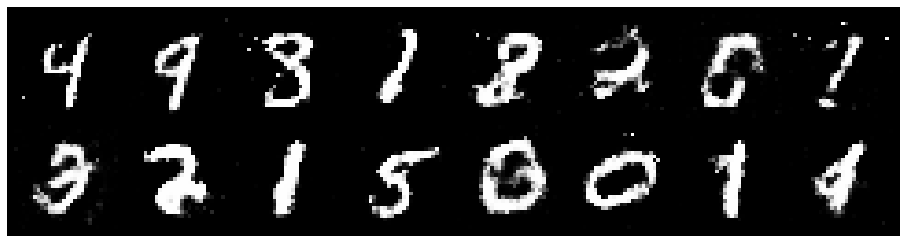

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.1431, Generator Loss: 1.0746
D(x): 0.6120, D(G(z)): 0.4212


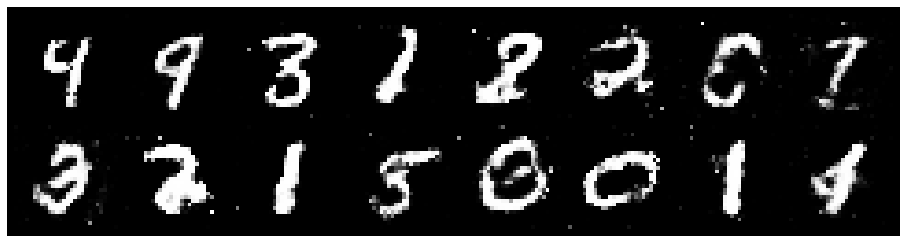

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.0725, Generator Loss: 0.9679
D(x): 0.6524, D(G(z)): 0.4290


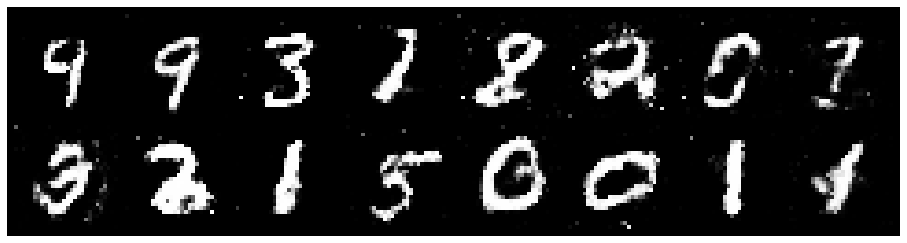

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.1647, Generator Loss: 1.0958
D(x): 0.5620, D(G(z)): 0.3677


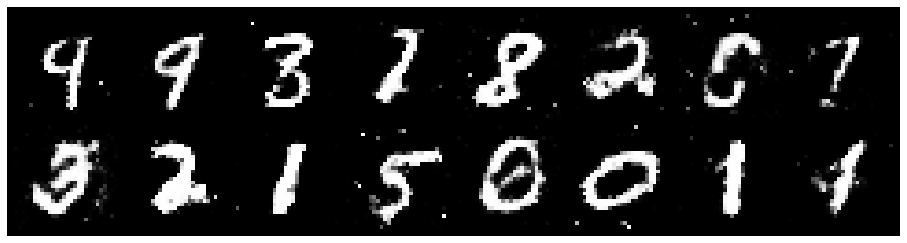

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.0482, Generator Loss: 1.1540
D(x): 0.6191, D(G(z)): 0.3576


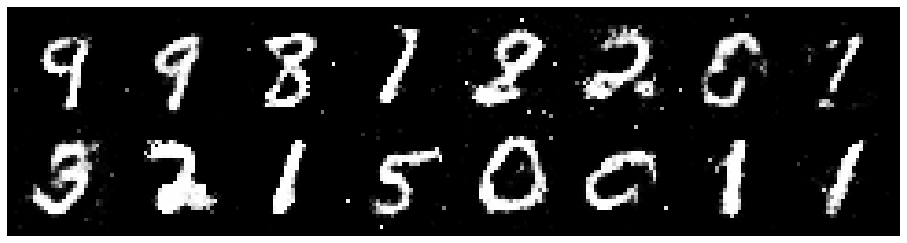

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.2123, Generator Loss: 1.3680
D(x): 0.6590, D(G(z)): 0.4336


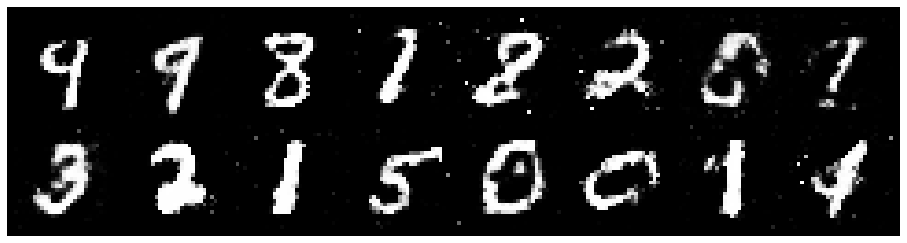

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.0611, Generator Loss: 1.2369
D(x): 0.6601, D(G(z)): 0.3865


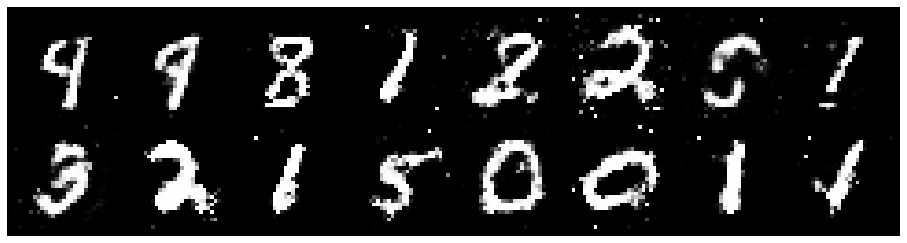

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.2120, Generator Loss: 1.0826
D(x): 0.5753, D(G(z)): 0.3957


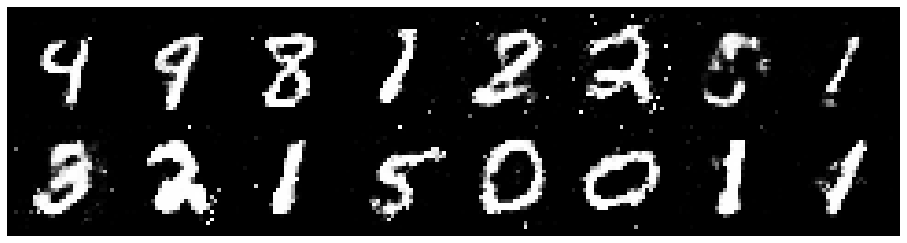

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.1570, Generator Loss: 0.9906
D(x): 0.6031, D(G(z)): 0.4263


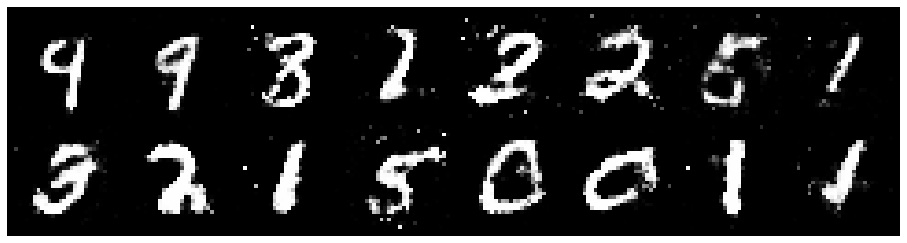

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.2083, Generator Loss: 1.0768
D(x): 0.5576, D(G(z)): 0.3698


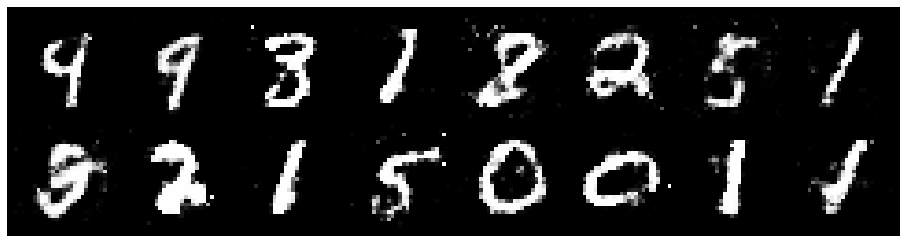

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.2599, Generator Loss: 1.0671
D(x): 0.5700, D(G(z)): 0.4065


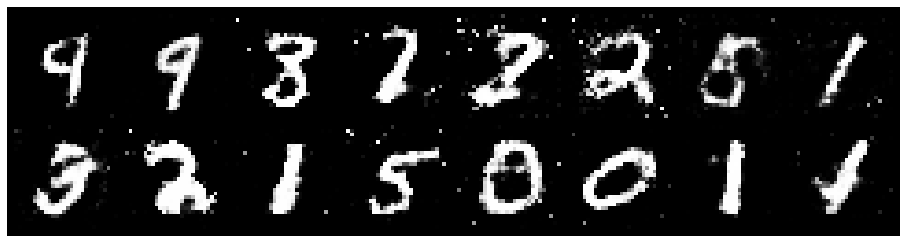

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.1656, Generator Loss: 1.2744
D(x): 0.5769, D(G(z)): 0.3586


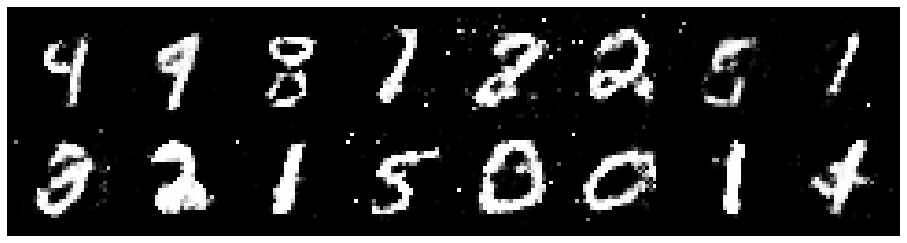

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.0791, Generator Loss: 1.1274
D(x): 0.5966, D(G(z)): 0.3342


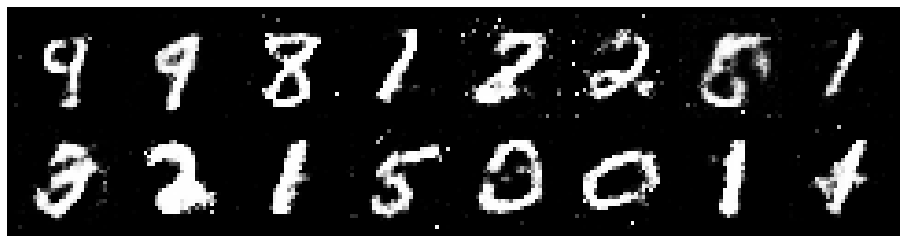

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.1323, Generator Loss: 1.0562
D(x): 0.6092, D(G(z)): 0.4082


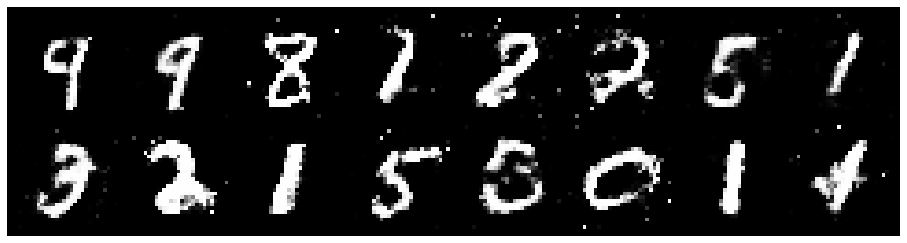

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.1450, Generator Loss: 1.0594
D(x): 0.6192, D(G(z)): 0.4293


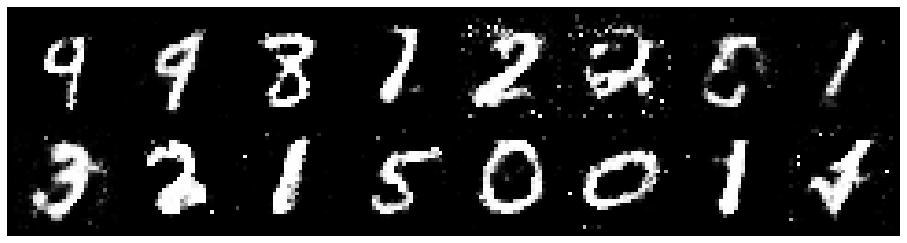

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2723, Generator Loss: 0.8653
D(x): 0.5920, D(G(z)): 0.4551


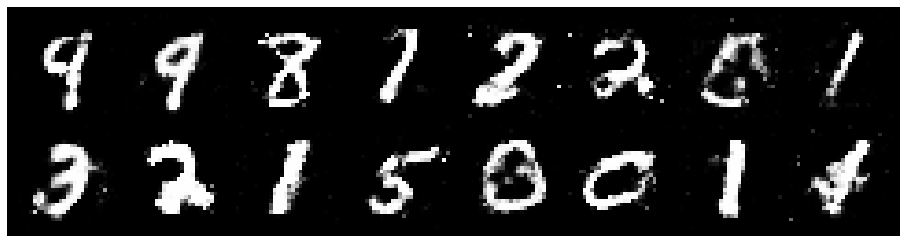

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.2832, Generator Loss: 1.0456
D(x): 0.5332, D(G(z)): 0.4085


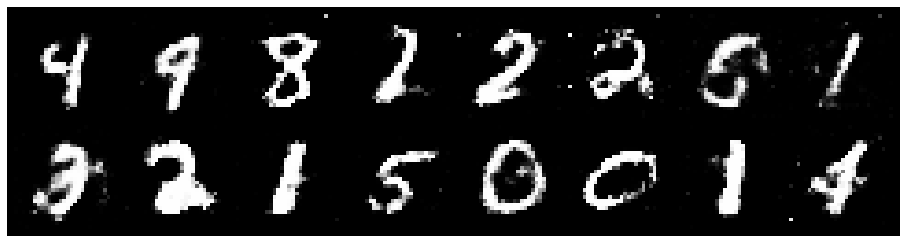

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.1882, Generator Loss: 1.1204
D(x): 0.6030, D(G(z)): 0.4017


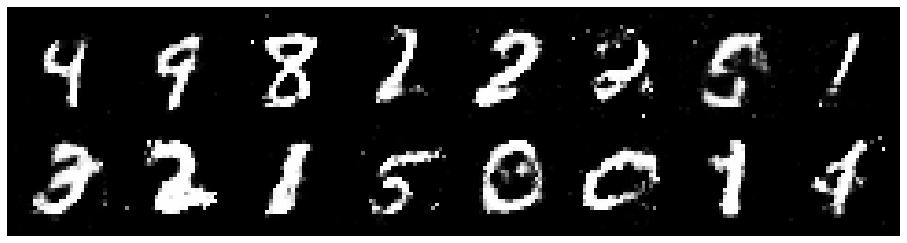

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.2225, Generator Loss: 1.1372
D(x): 0.5589, D(G(z)): 0.4223


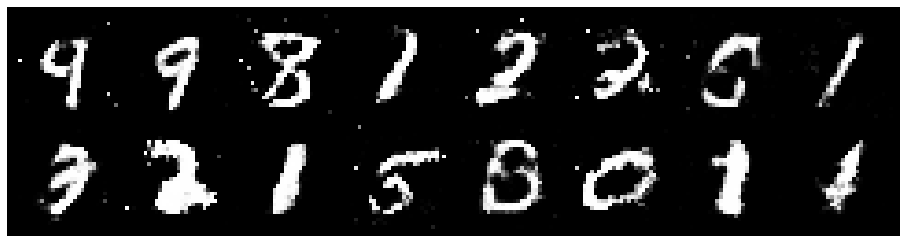

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.2016, Generator Loss: 0.9320
D(x): 0.5828, D(G(z)): 0.4152


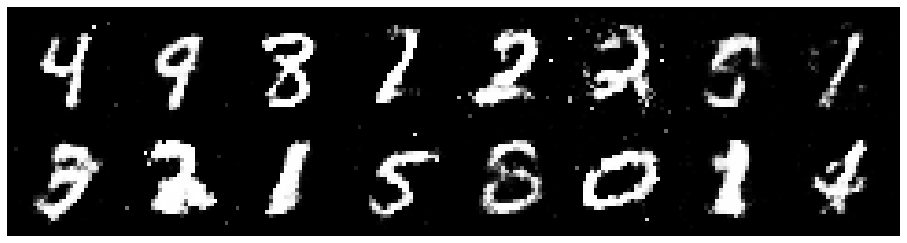

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.3438, Generator Loss: 0.8633
D(x): 0.5641, D(G(z)): 0.4627


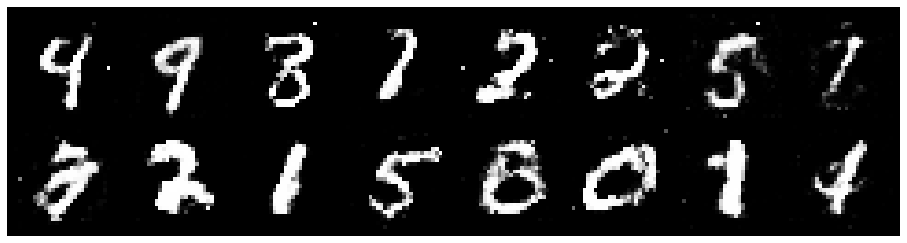

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.2406, Generator Loss: 0.9653
D(x): 0.5758, D(G(z)): 0.4338


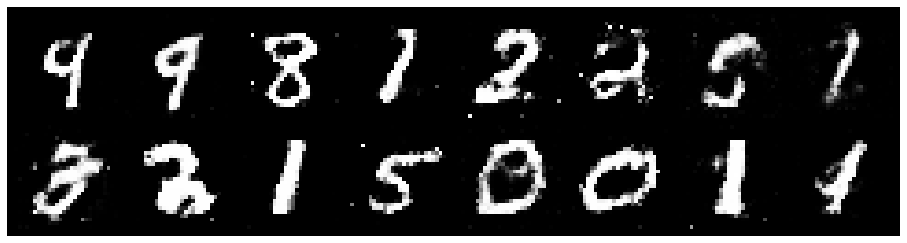

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.1662, Generator Loss: 0.9861
D(x): 0.6046, D(G(z)): 0.4289


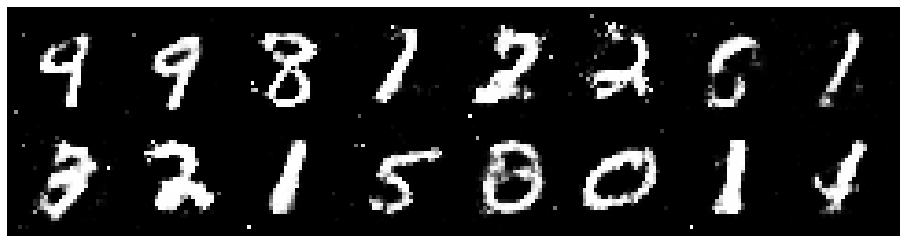

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.2141, Generator Loss: 0.8853
D(x): 0.5657, D(G(z)): 0.4099


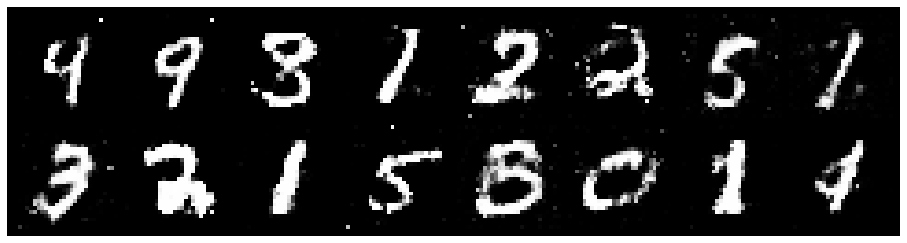

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.0902, Generator Loss: 1.0123
D(x): 0.5993, D(G(z)): 0.3865


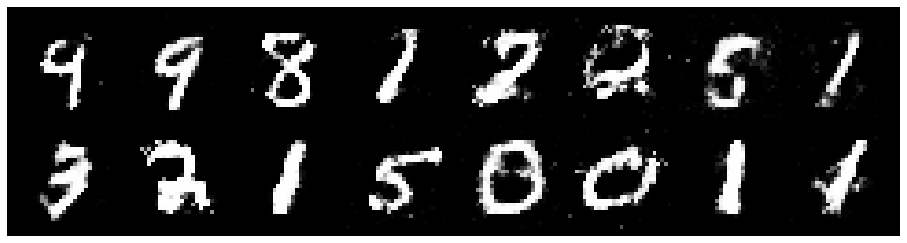

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.2171, Generator Loss: 0.8909
D(x): 0.6500, D(G(z)): 0.4648


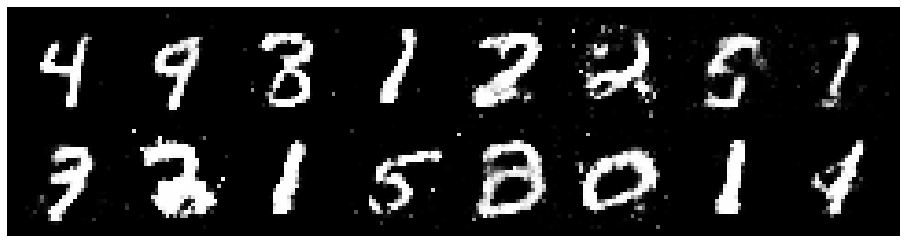

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.2191, Generator Loss: 0.8925
D(x): 0.6304, D(G(z)): 0.4654


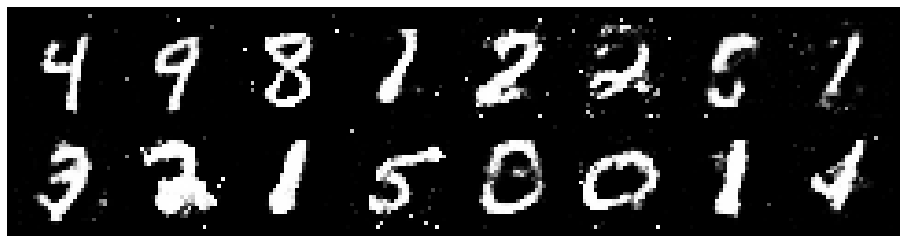

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.2223, Generator Loss: 0.9041
D(x): 0.5298, D(G(z)): 0.3645


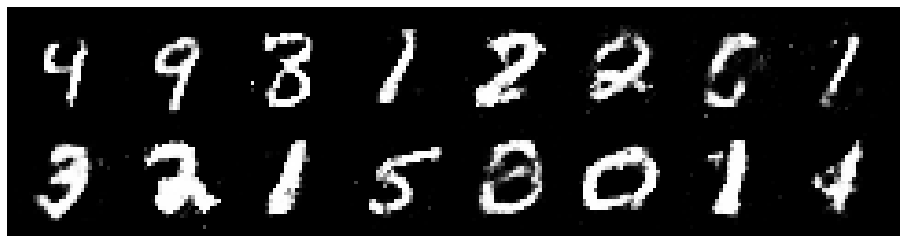

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.2577, Generator Loss: 1.1842
D(x): 0.5131, D(G(z)): 0.3396


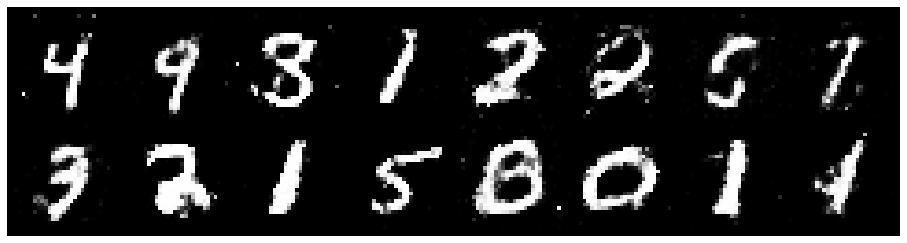

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.2590, Generator Loss: 1.2123
D(x): 0.5880, D(G(z)): 0.3930


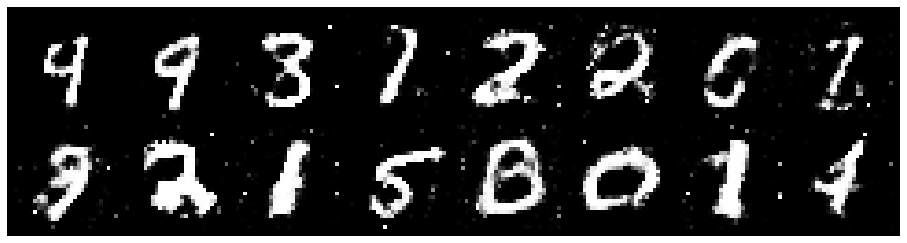

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.0990, Generator Loss: 1.1306
D(x): 0.6219, D(G(z)): 0.3964


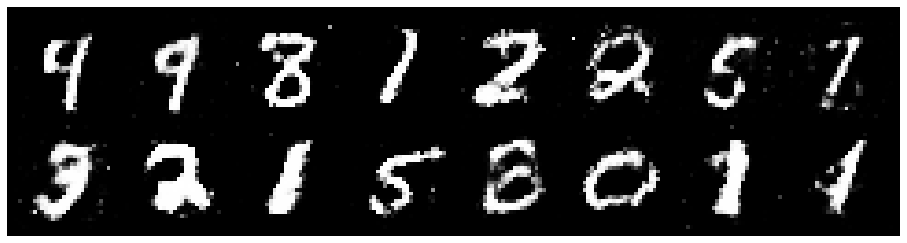

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.1583, Generator Loss: 1.1069
D(x): 0.6289, D(G(z)): 0.4174


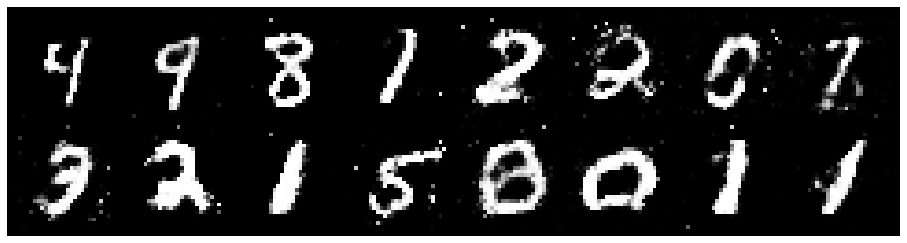

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.1772, Generator Loss: 0.9024
D(x): 0.5829, D(G(z)): 0.4228


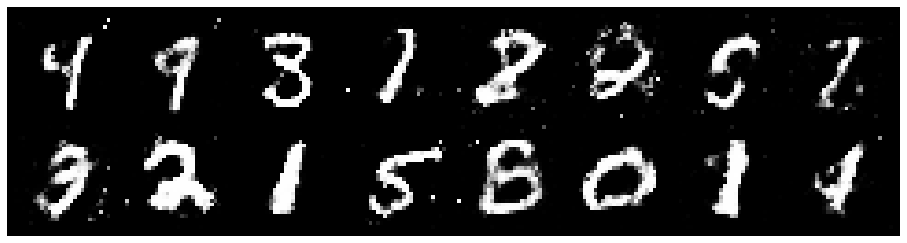

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.1649, Generator Loss: 1.0439
D(x): 0.5655, D(G(z)): 0.3962


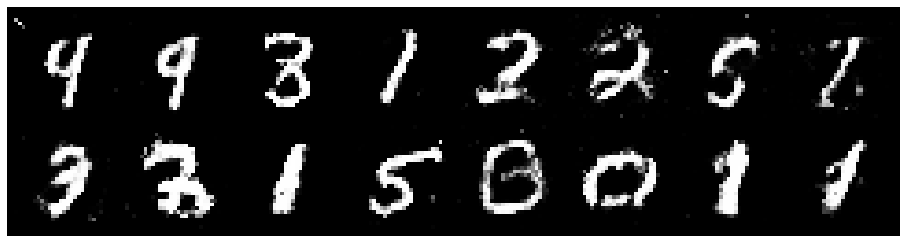

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.1373, Generator Loss: 1.0910
D(x): 0.6199, D(G(z)): 0.4234


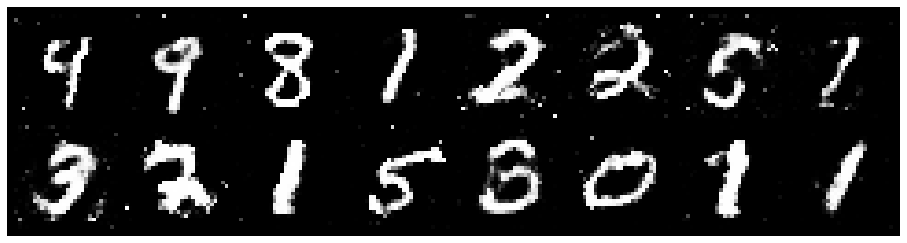

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.2115, Generator Loss: 0.9281
D(x): 0.5459, D(G(z)): 0.3911


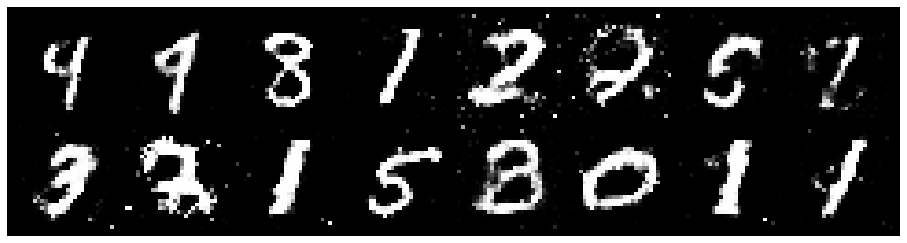

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.1794, Generator Loss: 0.8815
D(x): 0.6053, D(G(z)): 0.4358


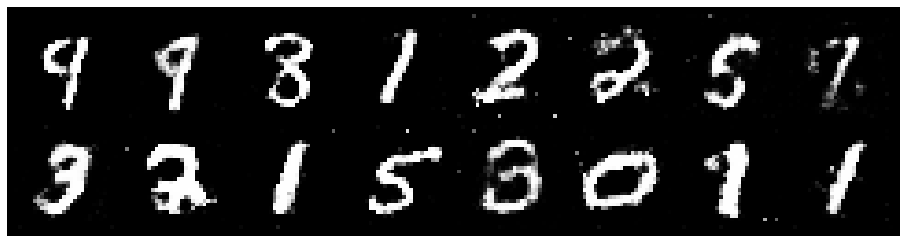

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.1329, Generator Loss: 0.9563
D(x): 0.6553, D(G(z)): 0.4447


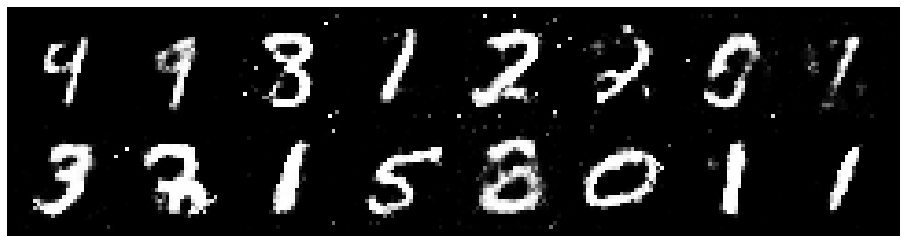

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.2415, Generator Loss: 0.8749
D(x): 0.6007, D(G(z)): 0.4610


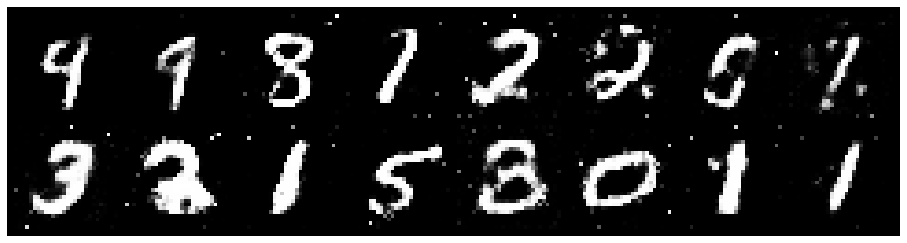

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.1941, Generator Loss: 1.0259
D(x): 0.6037, D(G(z)): 0.4295


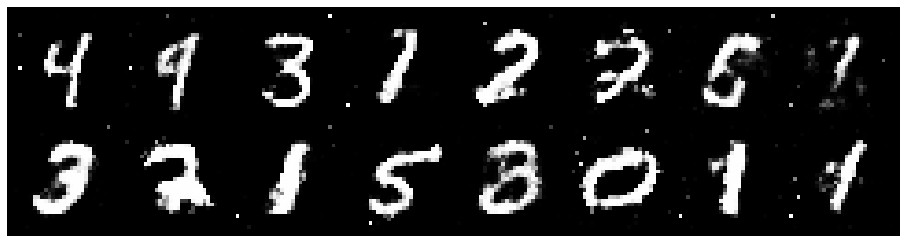

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.1318, Generator Loss: 1.2159
D(x): 0.5804, D(G(z)): 0.3577


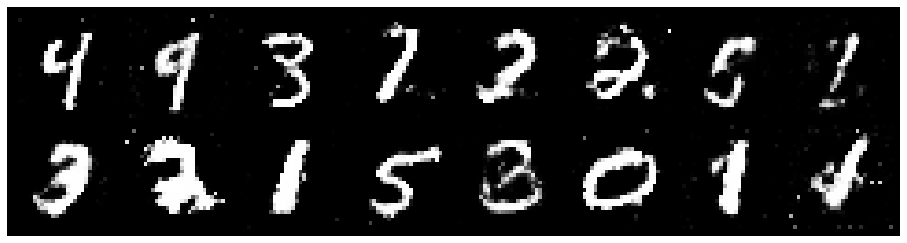

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.2251, Generator Loss: 0.8356
D(x): 0.6089, D(G(z)): 0.4497


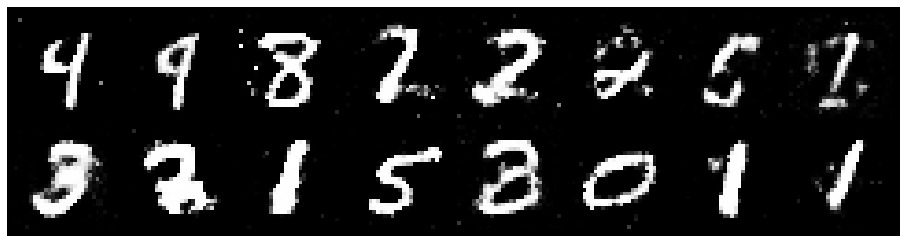

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.2502, Generator Loss: 0.9408
D(x): 0.6236, D(G(z)): 0.4526


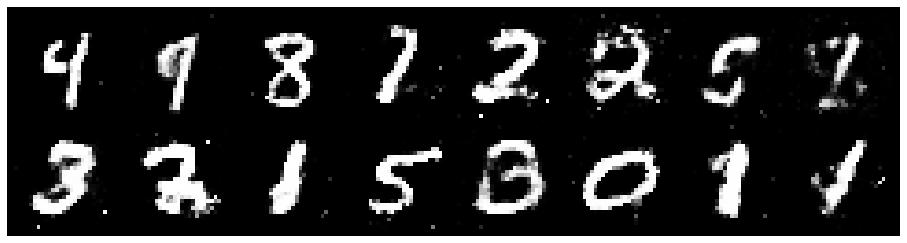

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.5444, Generator Loss: 0.8251
D(x): 0.4711, D(G(z)): 0.4722


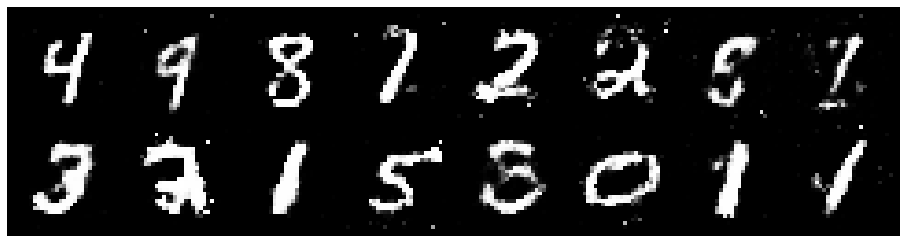

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.3619, Generator Loss: 0.9535
D(x): 0.5124, D(G(z)): 0.4220


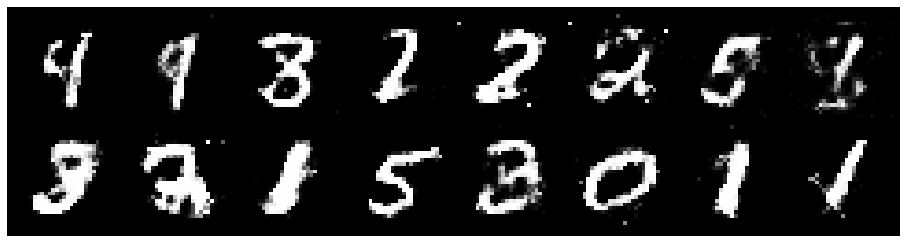

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.2308, Generator Loss: 0.7941
D(x): 0.5765, D(G(z)): 0.4518


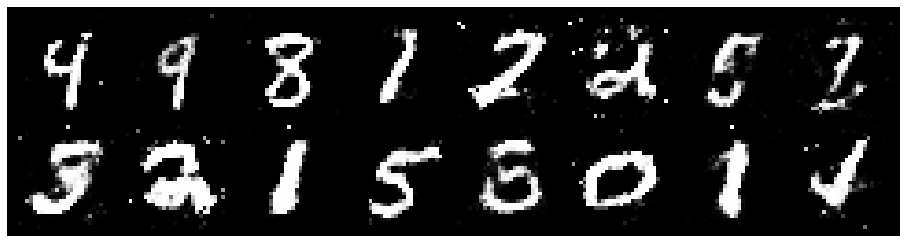

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.2968, Generator Loss: 0.9334
D(x): 0.5563, D(G(z)): 0.4359


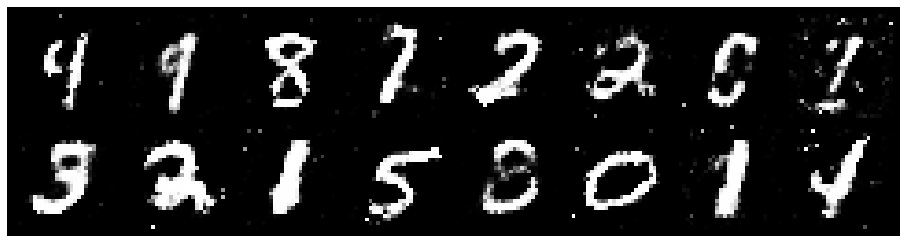

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.2321, Generator Loss: 1.0080
D(x): 0.5476, D(G(z)): 0.3935


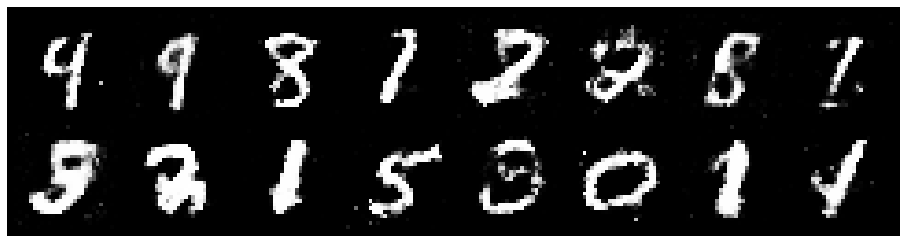

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.3394, Generator Loss: 1.0134
D(x): 0.5602, D(G(z)): 0.4401


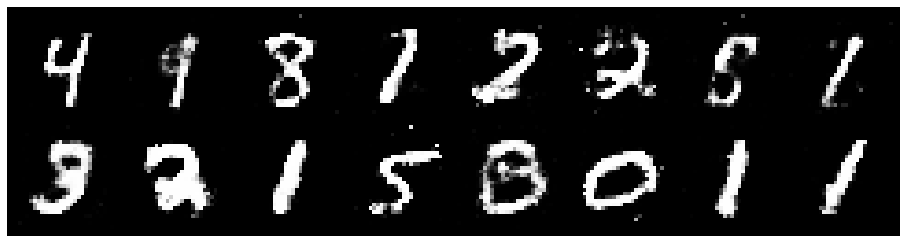

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.2536, Generator Loss: 1.1346
D(x): 0.5872, D(G(z)): 0.4082


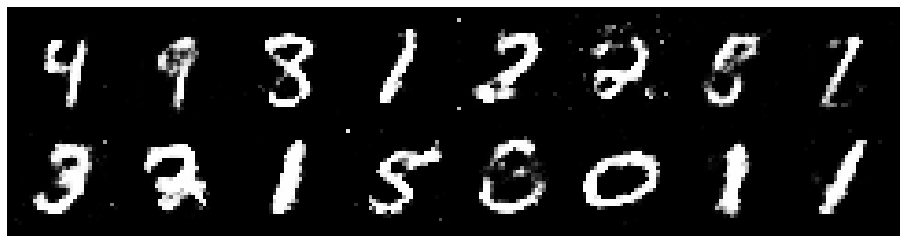

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.2146, Generator Loss: 0.9469
D(x): 0.5902, D(G(z)): 0.4303


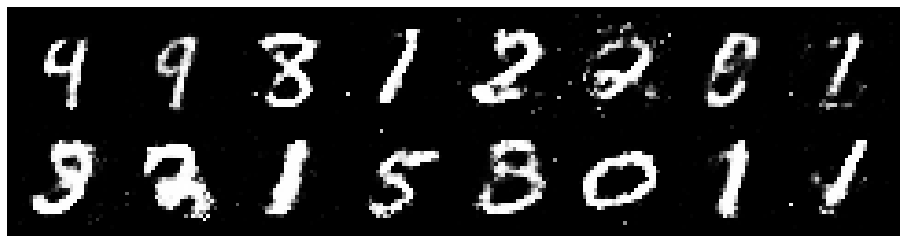

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.2316, Generator Loss: 1.0596
D(x): 0.5773, D(G(z)): 0.4113


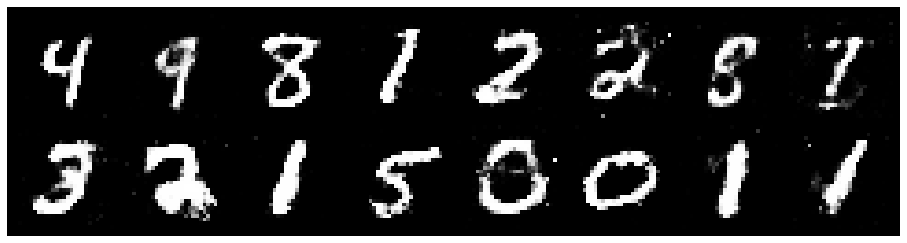

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.0586, Generator Loss: 1.1453
D(x): 0.6262, D(G(z)): 0.3738


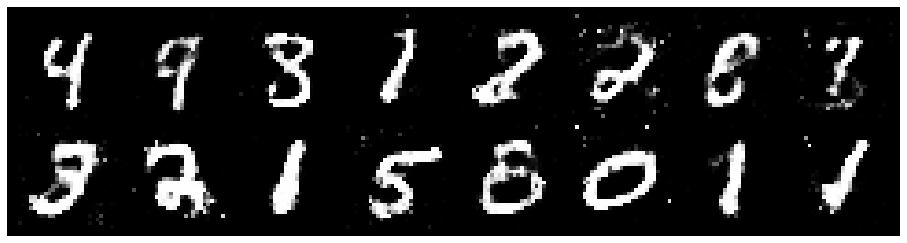

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.1290, Generator Loss: 1.0082
D(x): 0.6192, D(G(z)): 0.4202


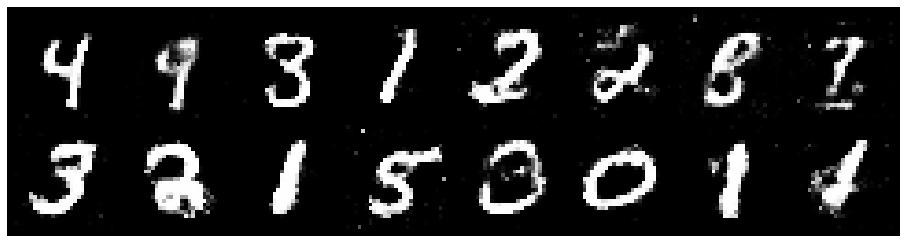

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.1615, Generator Loss: 0.9702
D(x): 0.6399, D(G(z)): 0.4496


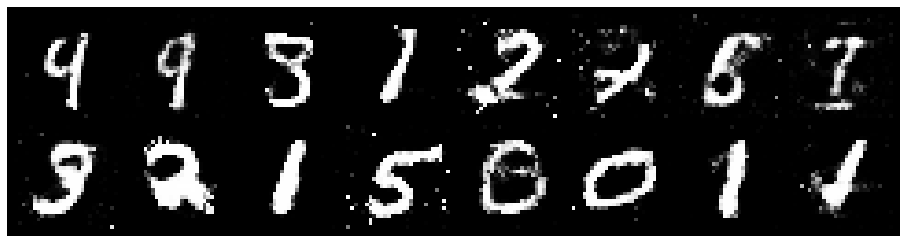

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.2394, Generator Loss: 0.9696
D(x): 0.5988, D(G(z)): 0.4469


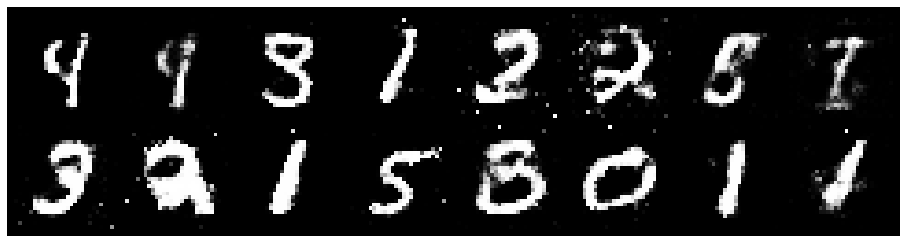

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.1886, Generator Loss: 1.1234
D(x): 0.5458, D(G(z)): 0.3641


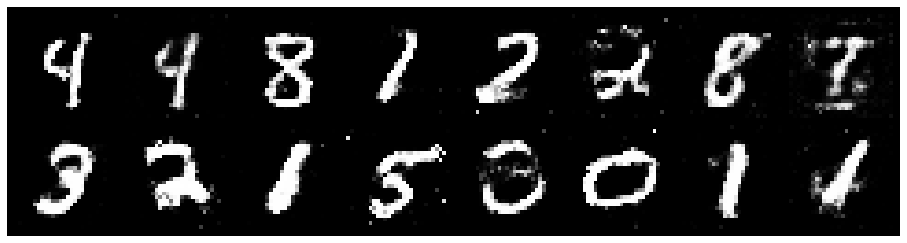

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.0957, Generator Loss: 0.9833
D(x): 0.5862, D(G(z)): 0.3832


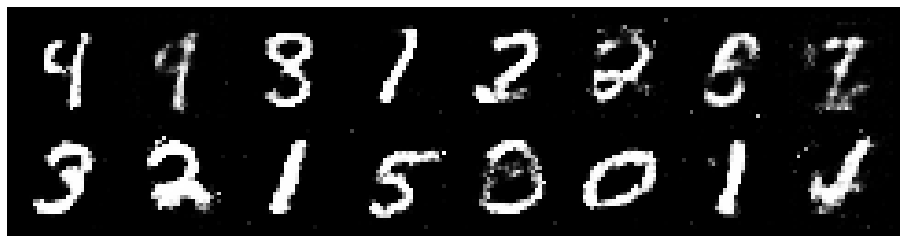

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.2380, Generator Loss: 0.9476
D(x): 0.5772, D(G(z)): 0.4435


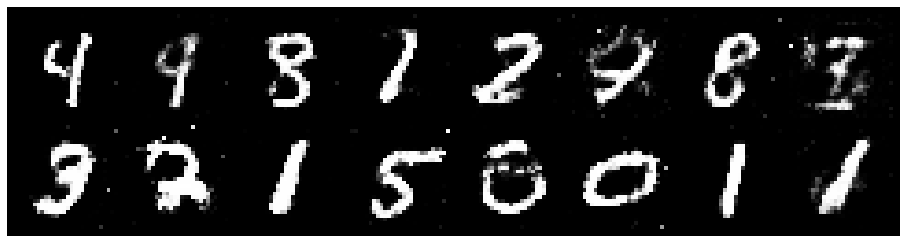

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.2165, Generator Loss: 0.9938
D(x): 0.5700, D(G(z)): 0.4009


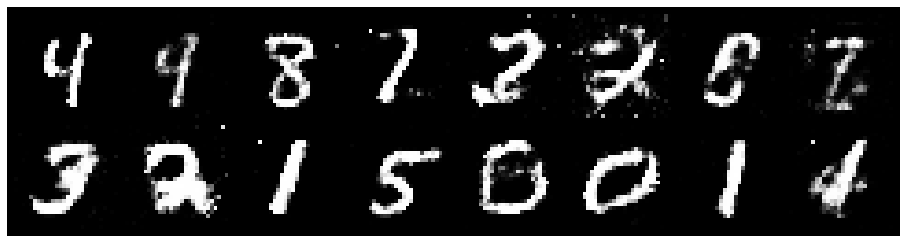

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.2403, Generator Loss: 1.0039
D(x): 0.5396, D(G(z)): 0.4045


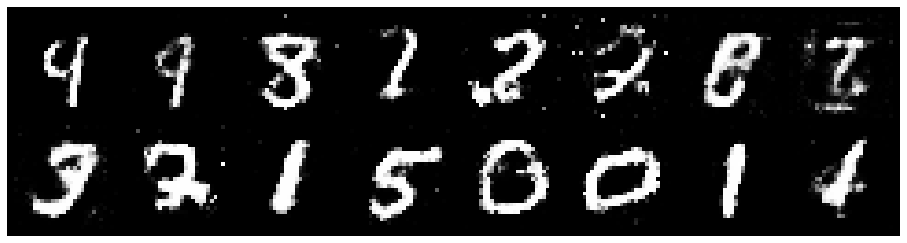

Epoch: [67/200], Batch Num: [500/600]
Discriminator Loss: 1.2280, Generator Loss: 0.8588
D(x): 0.5487, D(G(z)): 0.4114


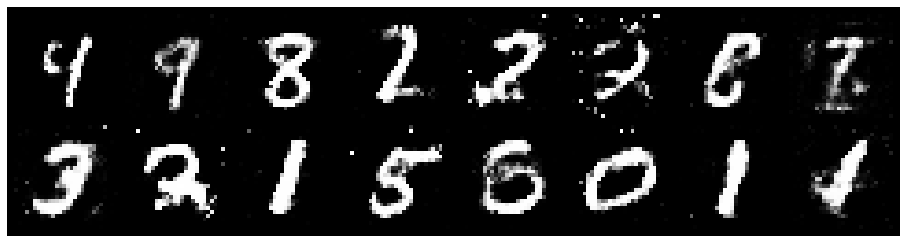

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.1644, Generator Loss: 0.8508
D(x): 0.6249, D(G(z)): 0.4488


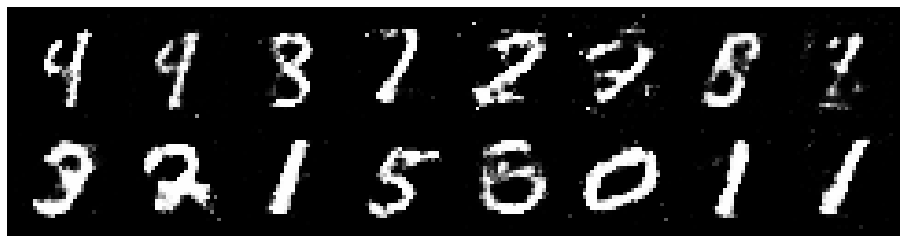

Epoch: [68/200], Batch Num: [100/600]
Discriminator Loss: 1.4659, Generator Loss: 0.8688
D(x): 0.5009, D(G(z)): 0.4751


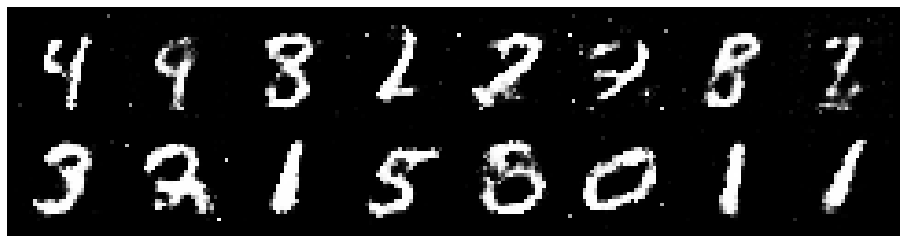

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.3302, Generator Loss: 1.2765
D(x): 0.5691, D(G(z)): 0.4126


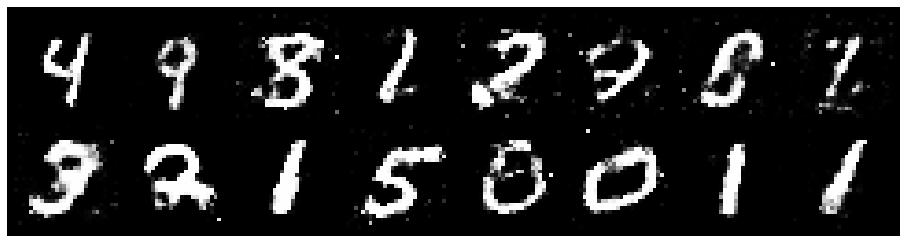

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.2521, Generator Loss: 0.9640
D(x): 0.5813, D(G(z)): 0.4319


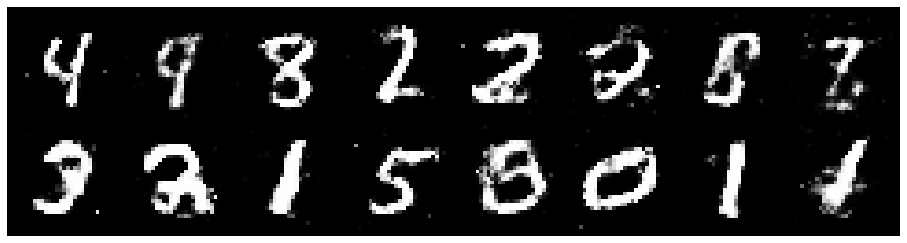

Epoch: [68/200], Batch Num: [400/600]
Discriminator Loss: 1.2184, Generator Loss: 1.0153
D(x): 0.5771, D(G(z)): 0.4228


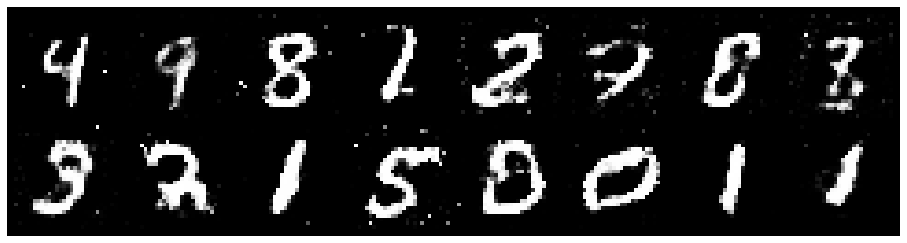

Epoch: [68/200], Batch Num: [500/600]
Discriminator Loss: 1.2378, Generator Loss: 1.0543
D(x): 0.6310, D(G(z)): 0.4607


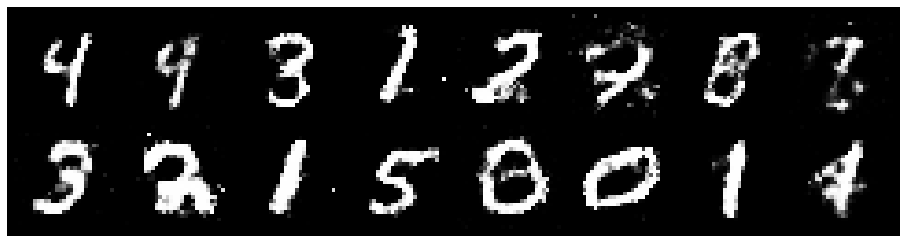

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.2199, Generator Loss: 1.0297
D(x): 0.6155, D(G(z)): 0.4455


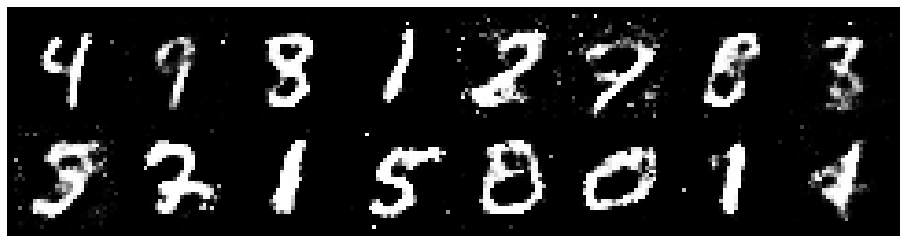

Epoch: [69/200], Batch Num: [100/600]
Discriminator Loss: 1.2399, Generator Loss: 0.9156
D(x): 0.5381, D(G(z)): 0.3926


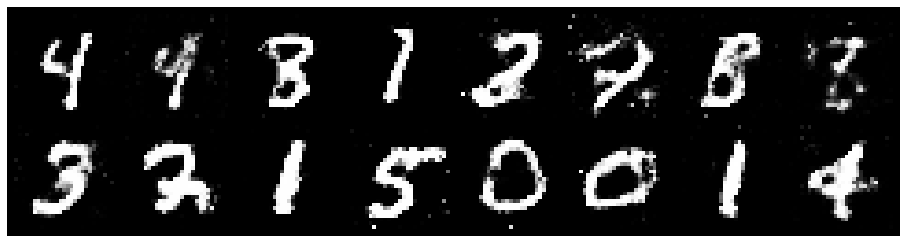

Epoch: [69/200], Batch Num: [200/600]
Discriminator Loss: 1.1436, Generator Loss: 1.0603
D(x): 0.5913, D(G(z)): 0.4011


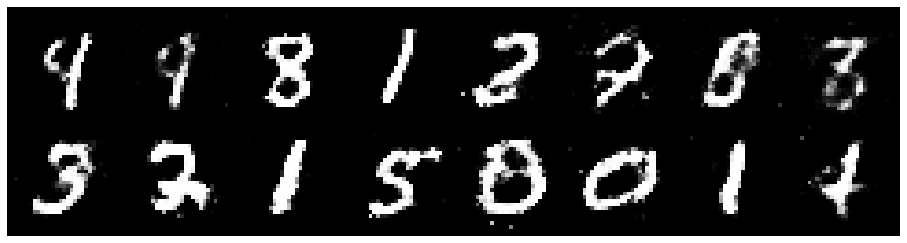

Epoch: [69/200], Batch Num: [300/600]
Discriminator Loss: 1.1092, Generator Loss: 1.0478
D(x): 0.5857, D(G(z)): 0.3641


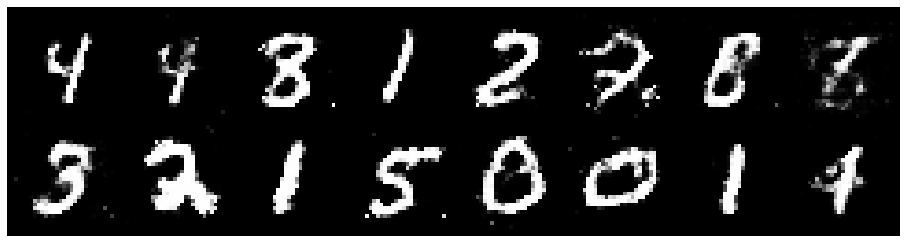

Epoch: [69/200], Batch Num: [400/600]
Discriminator Loss: 1.1778, Generator Loss: 0.9836
D(x): 0.5645, D(G(z)): 0.3957


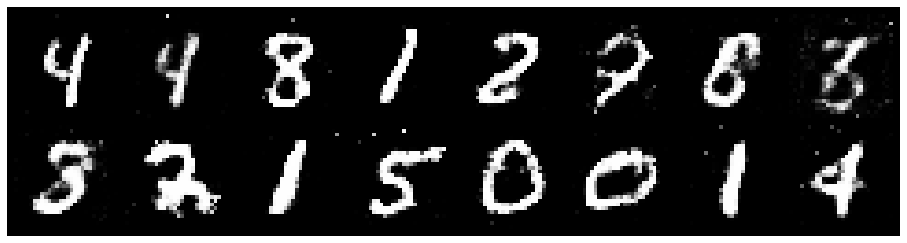

Epoch: [69/200], Batch Num: [500/600]
Discriminator Loss: 1.2569, Generator Loss: 1.0829
D(x): 0.5519, D(G(z)): 0.3912


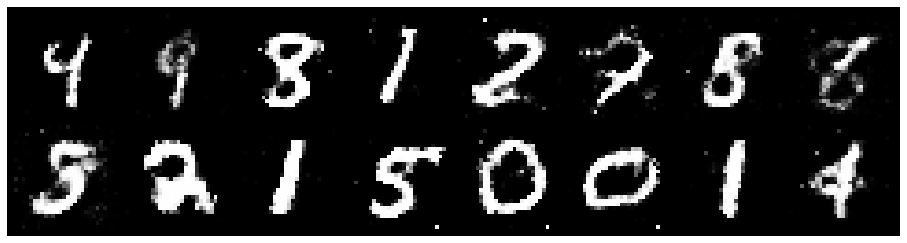

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.3105, Generator Loss: 0.8563
D(x): 0.5476, D(G(z)): 0.4449


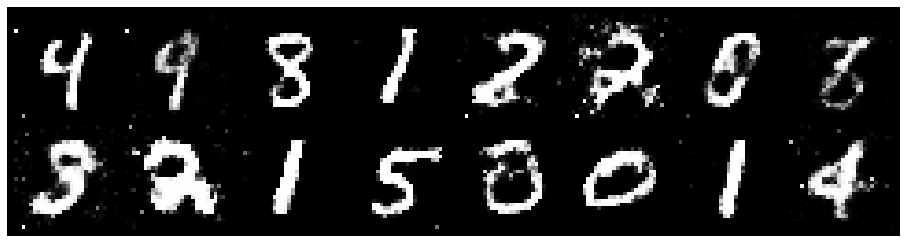

Epoch: [70/200], Batch Num: [100/600]
Discriminator Loss: 1.1803, Generator Loss: 0.9004
D(x): 0.6040, D(G(z)): 0.4260


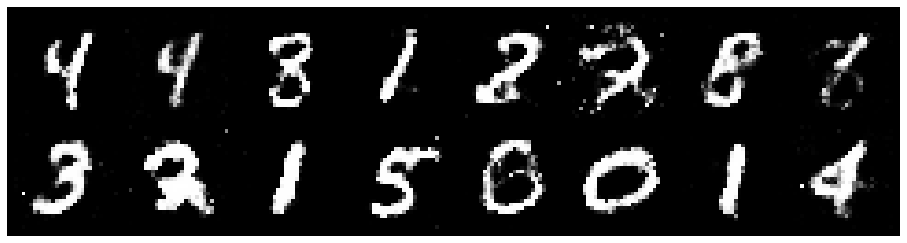

Epoch: [70/200], Batch Num: [200/600]
Discriminator Loss: 1.2636, Generator Loss: 0.9331
D(x): 0.5440, D(G(z)): 0.4313


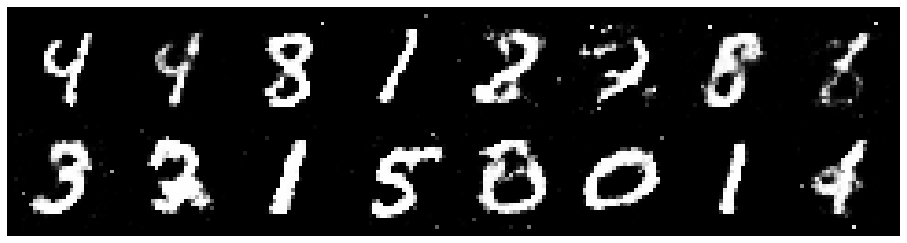

Epoch: [70/200], Batch Num: [300/600]
Discriminator Loss: 1.1844, Generator Loss: 0.9713
D(x): 0.5927, D(G(z)): 0.4211


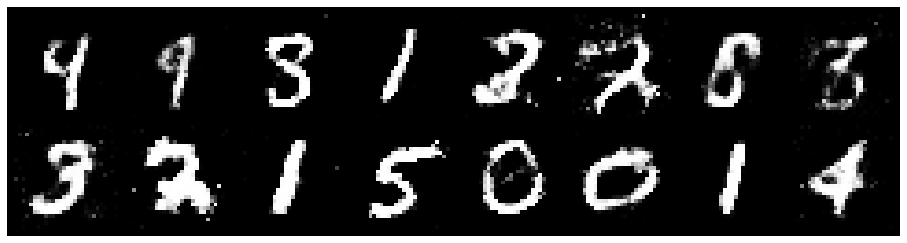

Epoch: [70/200], Batch Num: [400/600]
Discriminator Loss: 1.2562, Generator Loss: 0.9280
D(x): 0.6082, D(G(z)): 0.4597


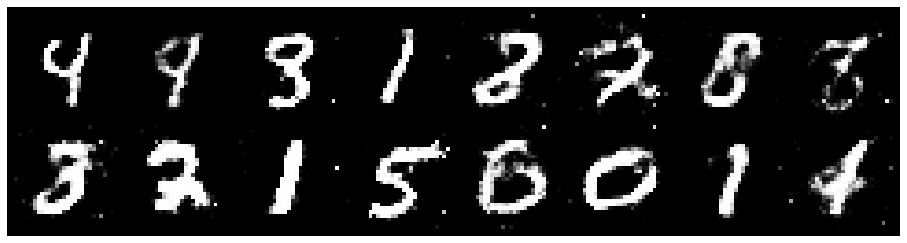

Epoch: [70/200], Batch Num: [500/600]
Discriminator Loss: 1.2835, Generator Loss: 0.9792
D(x): 0.5491, D(G(z)): 0.4297


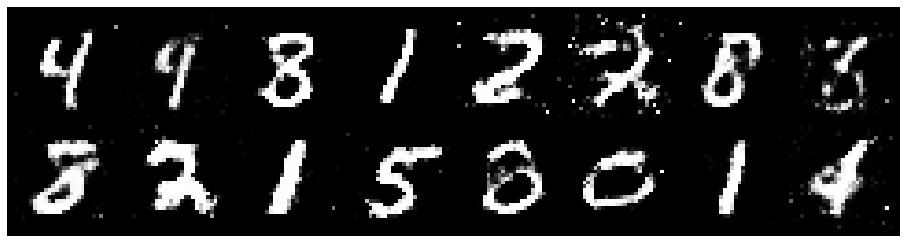

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.1667, Generator Loss: 0.9130
D(x): 0.6396, D(G(z)): 0.4577


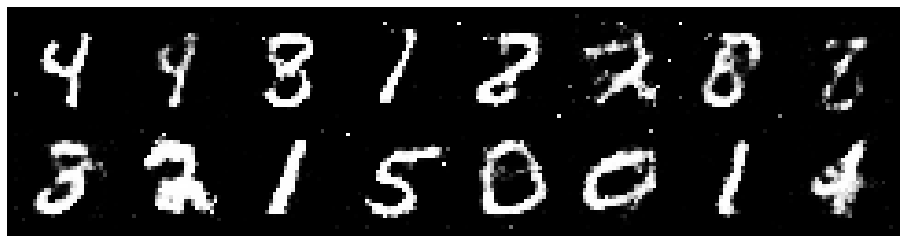

Epoch: [71/200], Batch Num: [100/600]
Discriminator Loss: 1.2117, Generator Loss: 0.9053
D(x): 0.5727, D(G(z)): 0.4259


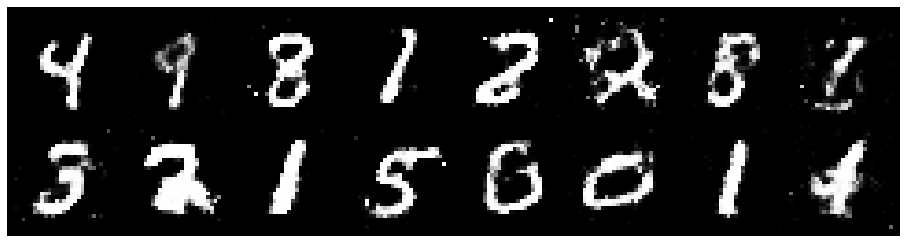

Epoch: [71/200], Batch Num: [200/600]
Discriminator Loss: 1.2903, Generator Loss: 0.8940
D(x): 0.5703, D(G(z)): 0.4436


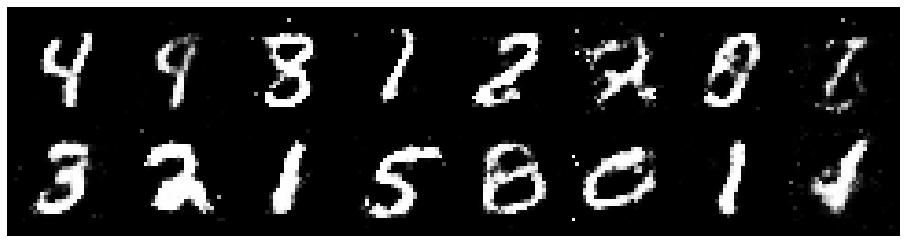

Epoch: [71/200], Batch Num: [300/600]
Discriminator Loss: 1.2940, Generator Loss: 0.8680
D(x): 0.5830, D(G(z)): 0.4620


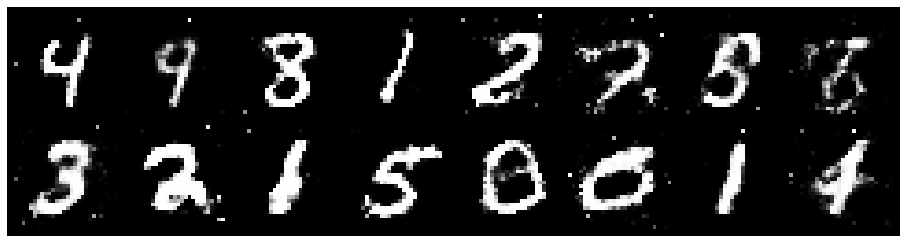

Epoch: [71/200], Batch Num: [400/600]
Discriminator Loss: 1.2690, Generator Loss: 0.8440
D(x): 0.5769, D(G(z)): 0.4384


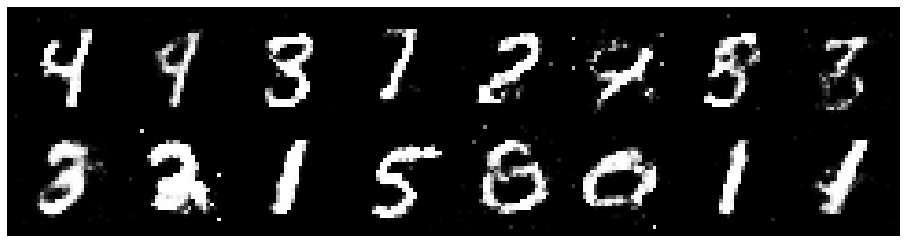

Epoch: [71/200], Batch Num: [500/600]
Discriminator Loss: 1.2590, Generator Loss: 0.8485
D(x): 0.5518, D(G(z)): 0.4292


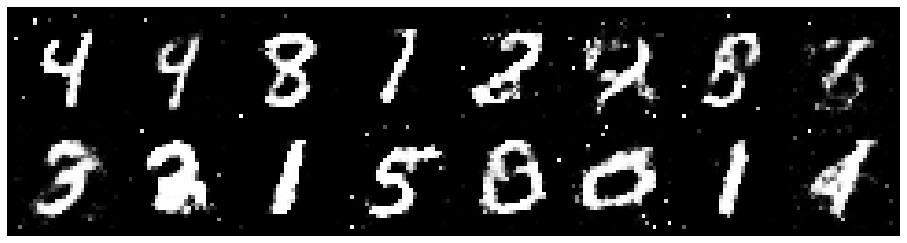

Epoch: [72/200], Batch Num: [0/600]
Discriminator Loss: 1.2123, Generator Loss: 0.9693
D(x): 0.5844, D(G(z)): 0.4185


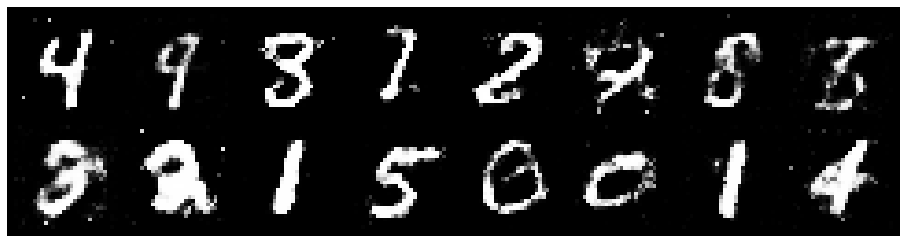

Epoch: [72/200], Batch Num: [100/600]
Discriminator Loss: 1.2032, Generator Loss: 0.9062
D(x): 0.5881, D(G(z)): 0.4382


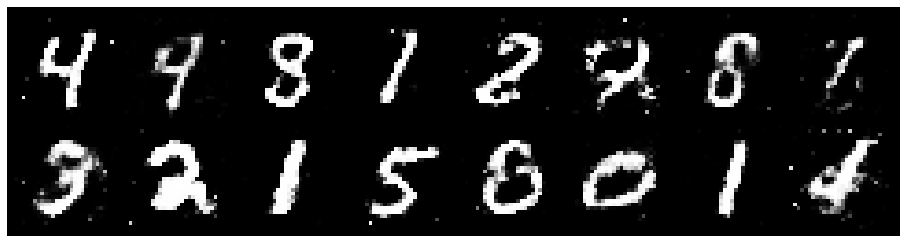

Epoch: [72/200], Batch Num: [200/600]
Discriminator Loss: 1.2594, Generator Loss: 0.9296
D(x): 0.4939, D(G(z)): 0.3855


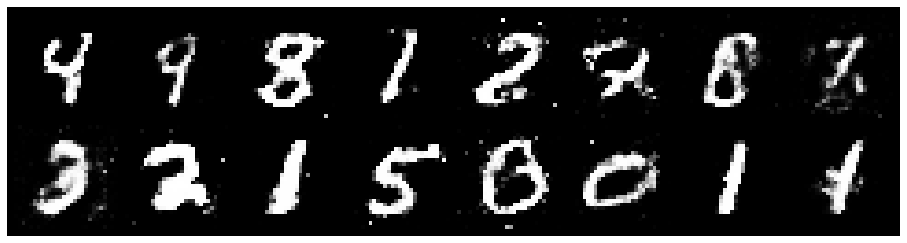

Epoch: [72/200], Batch Num: [300/600]
Discriminator Loss: 1.1328, Generator Loss: 0.8846
D(x): 0.6262, D(G(z)): 0.4503


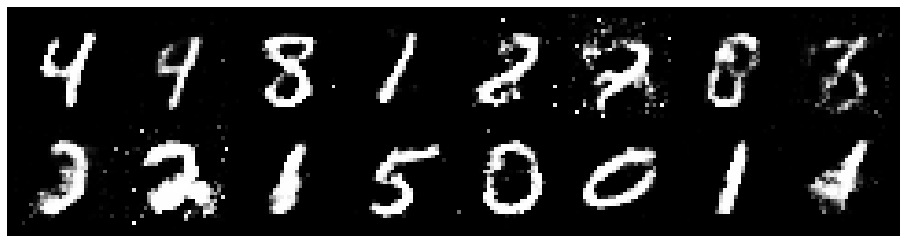

Epoch: [72/200], Batch Num: [400/600]
Discriminator Loss: 1.2657, Generator Loss: 0.8310
D(x): 0.5482, D(G(z)): 0.4445


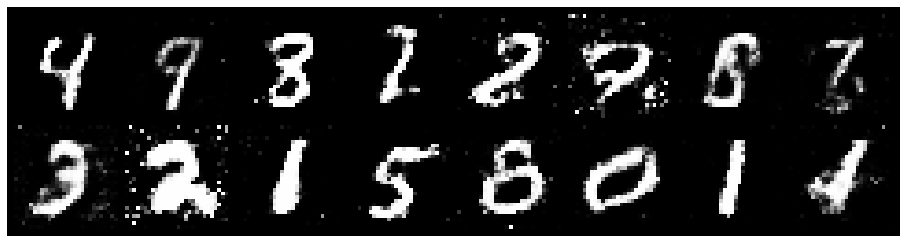

Epoch: [72/200], Batch Num: [500/600]
Discriminator Loss: 1.2070, Generator Loss: 0.8265
D(x): 0.6097, D(G(z)): 0.4610


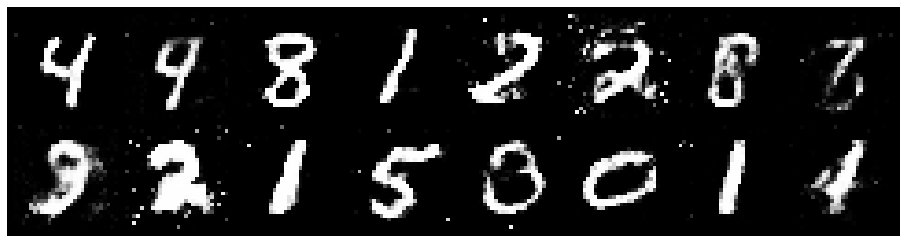

Epoch: [73/200], Batch Num: [0/600]
Discriminator Loss: 1.2300, Generator Loss: 1.0063
D(x): 0.5676, D(G(z)): 0.4330


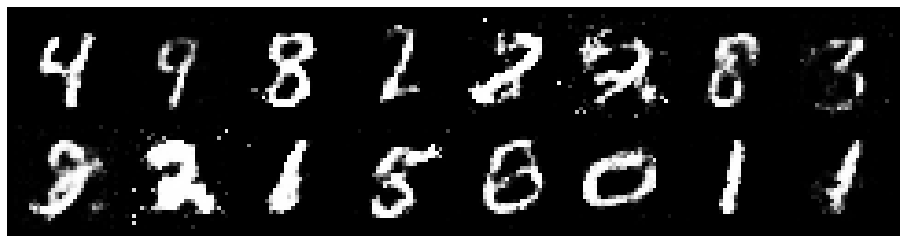

Epoch: [73/200], Batch Num: [100/600]
Discriminator Loss: 1.2544, Generator Loss: 0.9875
D(x): 0.5591, D(G(z)): 0.4407


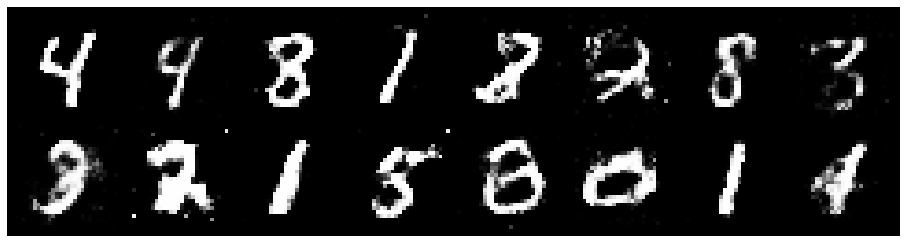

Epoch: [73/200], Batch Num: [200/600]
Discriminator Loss: 1.2394, Generator Loss: 0.9194
D(x): 0.5312, D(G(z)): 0.4012


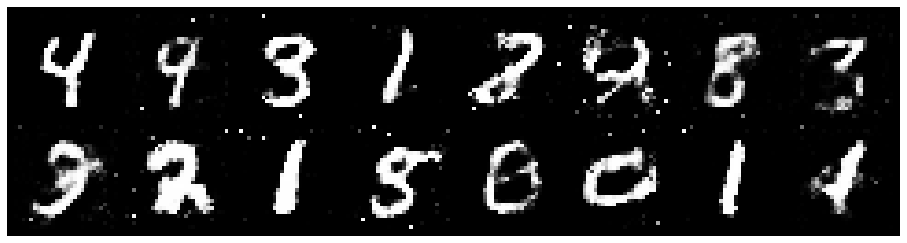

Epoch: [73/200], Batch Num: [300/600]
Discriminator Loss: 1.3755, Generator Loss: 0.8875
D(x): 0.5623, D(G(z)): 0.4980


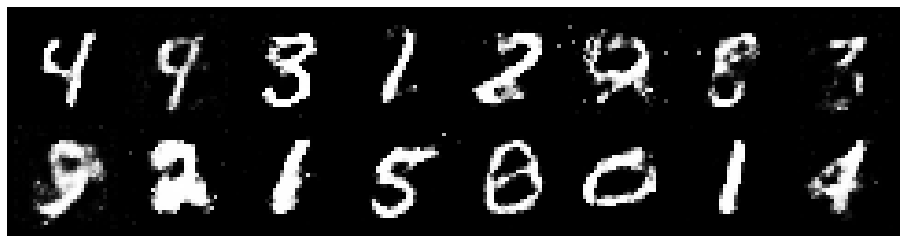

Epoch: [73/200], Batch Num: [400/600]
Discriminator Loss: 1.1746, Generator Loss: 0.8580
D(x): 0.5854, D(G(z)): 0.4295


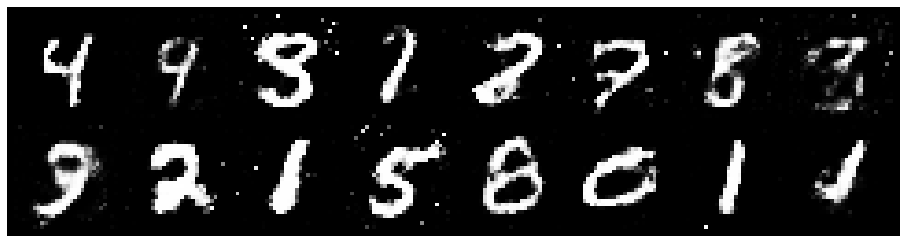

Epoch: [73/200], Batch Num: [500/600]
Discriminator Loss: 1.1146, Generator Loss: 1.0210
D(x): 0.6259, D(G(z)): 0.4120


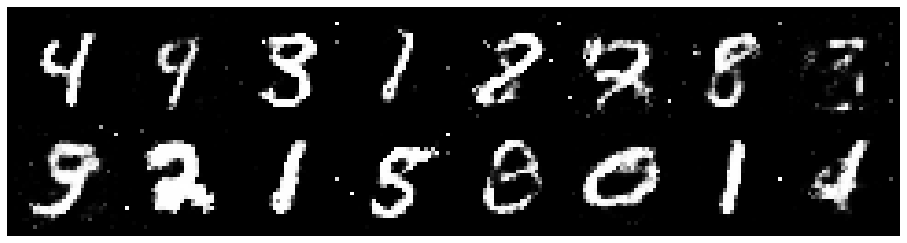

Epoch: [74/200], Batch Num: [0/600]
Discriminator Loss: 1.2710, Generator Loss: 0.8842
D(x): 0.5961, D(G(z)): 0.4740


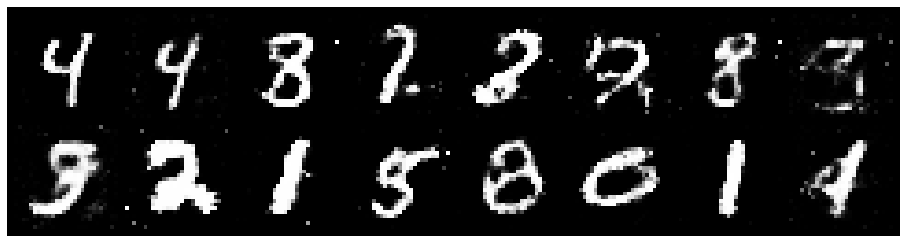

Epoch: [74/200], Batch Num: [100/600]
Discriminator Loss: 1.2064, Generator Loss: 0.8220
D(x): 0.6111, D(G(z)): 0.4499


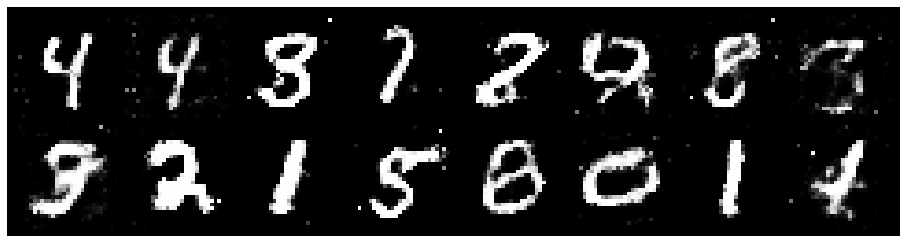

Epoch: [74/200], Batch Num: [200/600]
Discriminator Loss: 1.4366, Generator Loss: 0.8723
D(x): 0.5325, D(G(z)): 0.4926


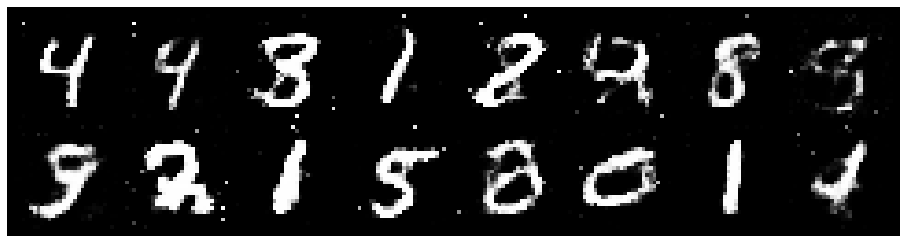

Epoch: [74/200], Batch Num: [300/600]
Discriminator Loss: 1.1158, Generator Loss: 0.9857
D(x): 0.6134, D(G(z)): 0.3718


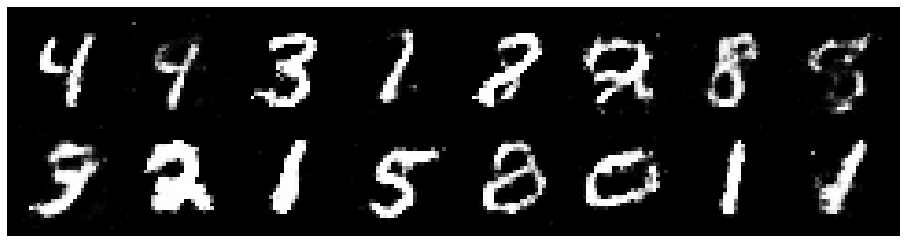

Epoch: [74/200], Batch Num: [400/600]
Discriminator Loss: 1.4186, Generator Loss: 1.0233
D(x): 0.5405, D(G(z)): 0.4473


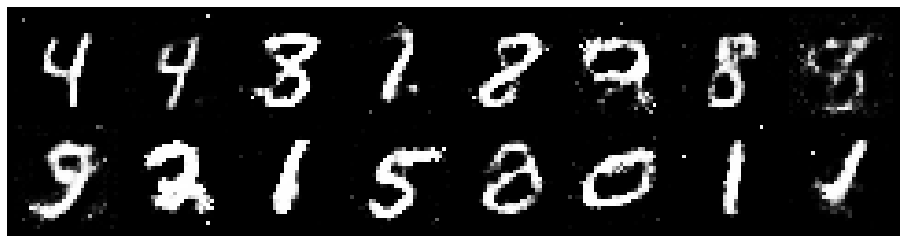

Epoch: [74/200], Batch Num: [500/600]
Discriminator Loss: 1.1182, Generator Loss: 0.9771
D(x): 0.6189, D(G(z)): 0.4032


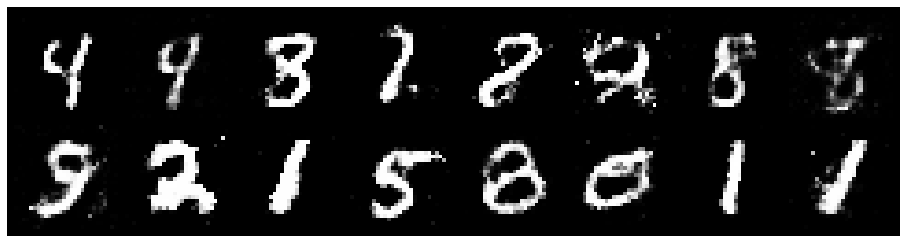

Epoch: [75/200], Batch Num: [0/600]
Discriminator Loss: 1.1342, Generator Loss: 1.0203
D(x): 0.6189, D(G(z)): 0.4032


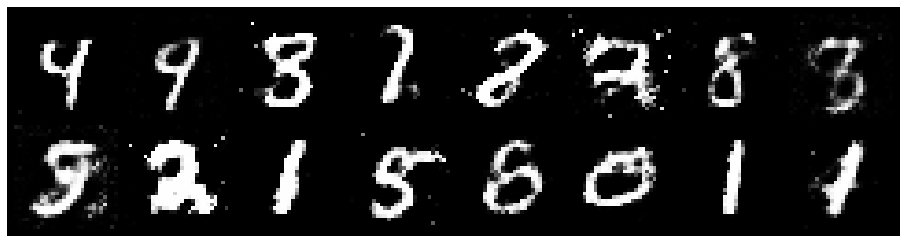

Epoch: [75/200], Batch Num: [100/600]
Discriminator Loss: 1.1531, Generator Loss: 0.9086
D(x): 0.6153, D(G(z)): 0.4383


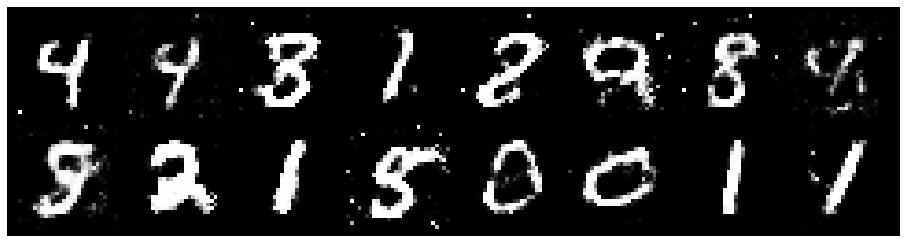

Epoch: [75/200], Batch Num: [200/600]
Discriminator Loss: 1.2228, Generator Loss: 1.0608
D(x): 0.5934, D(G(z)): 0.4313


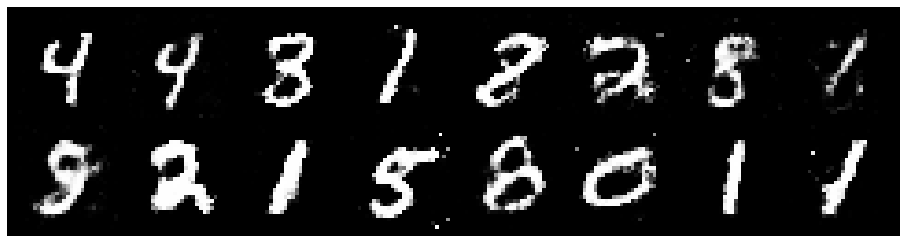

Epoch: [75/200], Batch Num: [300/600]
Discriminator Loss: 1.2316, Generator Loss: 0.9943
D(x): 0.5580, D(G(z)): 0.4286


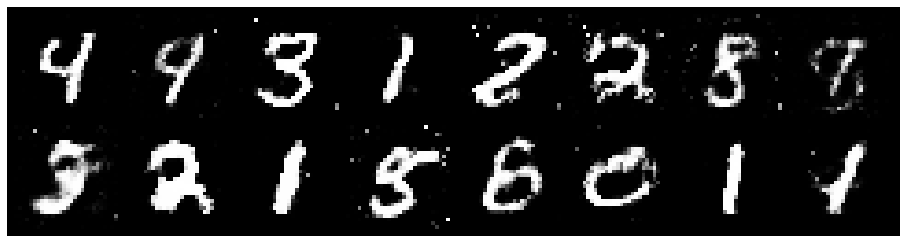

Epoch: [75/200], Batch Num: [400/600]
Discriminator Loss: 1.2462, Generator Loss: 0.8979
D(x): 0.5896, D(G(z)): 0.4550


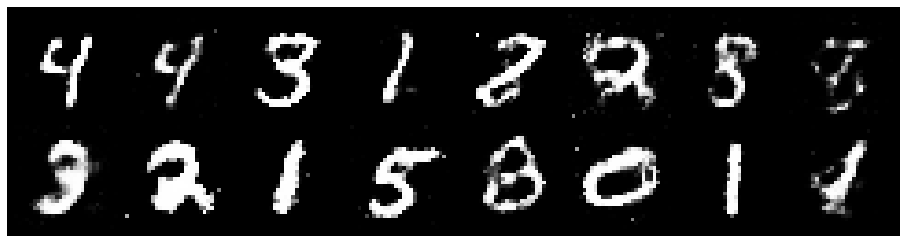

Epoch: [75/200], Batch Num: [500/600]
Discriminator Loss: 1.1745, Generator Loss: 0.9105
D(x): 0.5827, D(G(z)): 0.4324


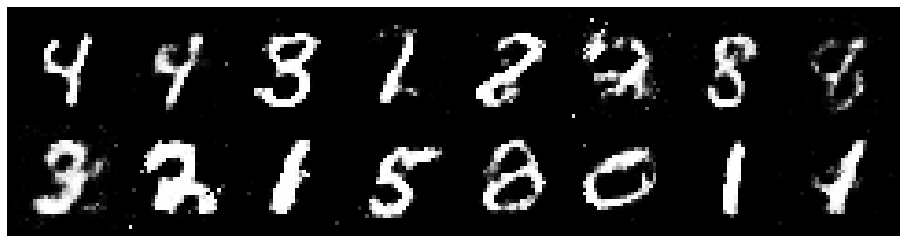

Epoch: [76/200], Batch Num: [0/600]
Discriminator Loss: 1.2170, Generator Loss: 0.9081
D(x): 0.5629, D(G(z)): 0.4281


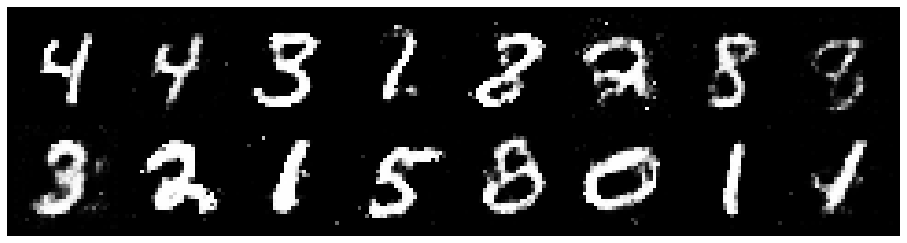

Epoch: [76/200], Batch Num: [100/600]
Discriminator Loss: 1.3082, Generator Loss: 0.9010
D(x): 0.6271, D(G(z)): 0.5067


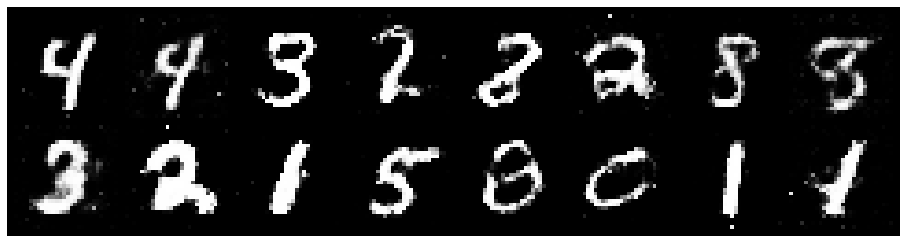

Epoch: [76/200], Batch Num: [200/600]
Discriminator Loss: 1.1677, Generator Loss: 1.0875
D(x): 0.5884, D(G(z)): 0.4121


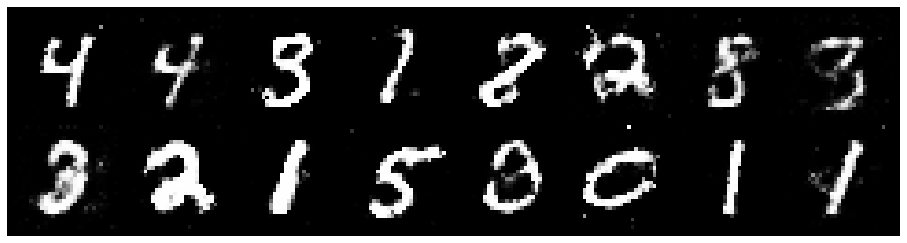

Epoch: [76/200], Batch Num: [300/600]
Discriminator Loss: 1.2904, Generator Loss: 0.9523
D(x): 0.5865, D(G(z)): 0.4673


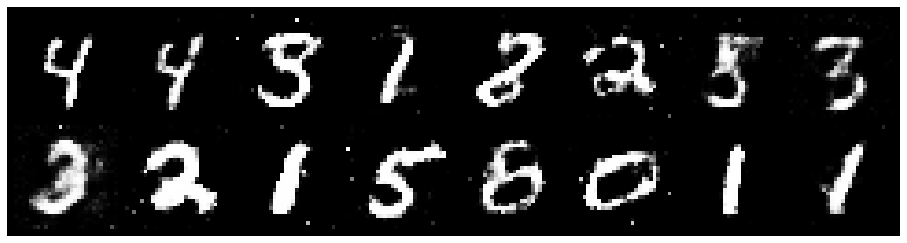

Epoch: [76/200], Batch Num: [400/600]
Discriminator Loss: 1.2386, Generator Loss: 1.1170
D(x): 0.5880, D(G(z)): 0.4382


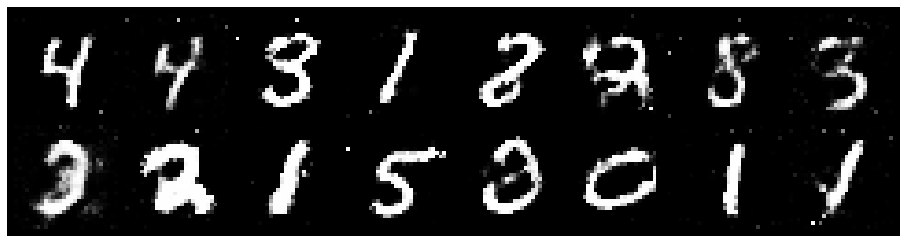

Epoch: [76/200], Batch Num: [500/600]
Discriminator Loss: 1.0838, Generator Loss: 1.0983
D(x): 0.6172, D(G(z)): 0.3820


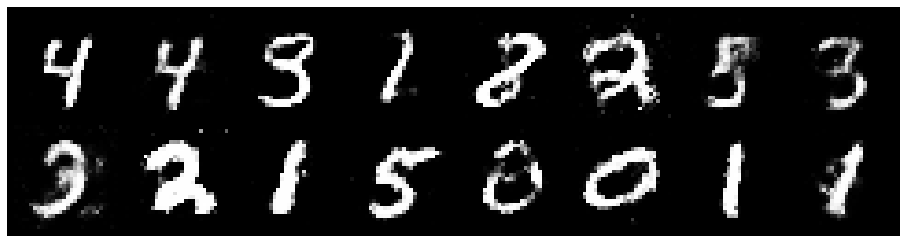

Epoch: [77/200], Batch Num: [0/600]
Discriminator Loss: 1.1449, Generator Loss: 0.9687
D(x): 0.5962, D(G(z)): 0.4077


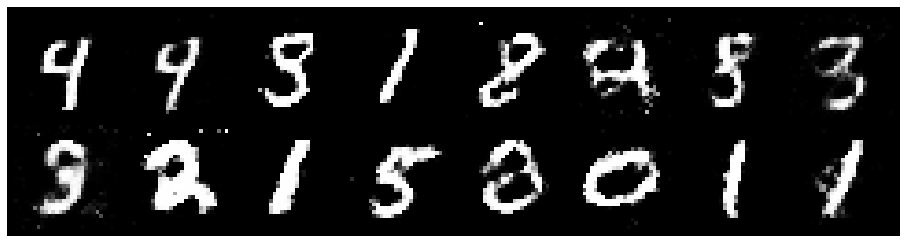

Epoch: [77/200], Batch Num: [100/600]
Discriminator Loss: 1.1483, Generator Loss: 1.0983
D(x): 0.5993, D(G(z)): 0.3836


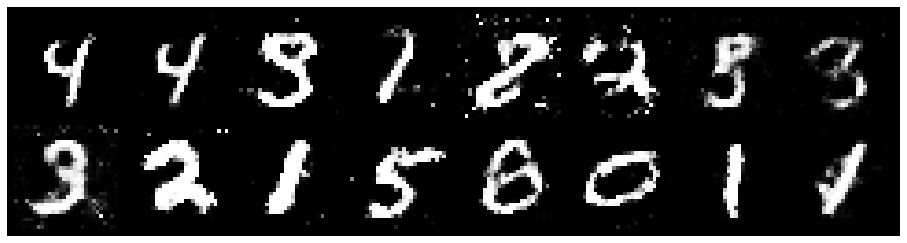

Epoch: [77/200], Batch Num: [200/600]
Discriminator Loss: 1.2456, Generator Loss: 0.9323
D(x): 0.5859, D(G(z)): 0.4418


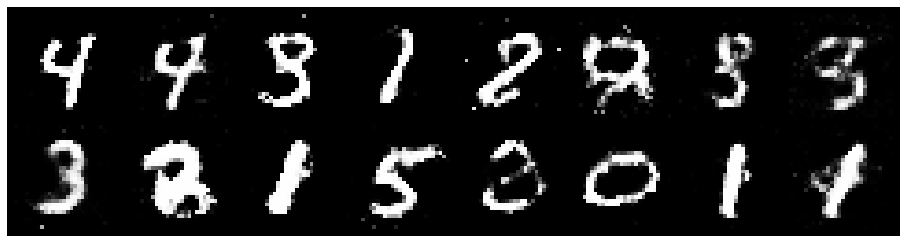

Epoch: [77/200], Batch Num: [300/600]
Discriminator Loss: 1.1377, Generator Loss: 0.9797
D(x): 0.6056, D(G(z)): 0.4057


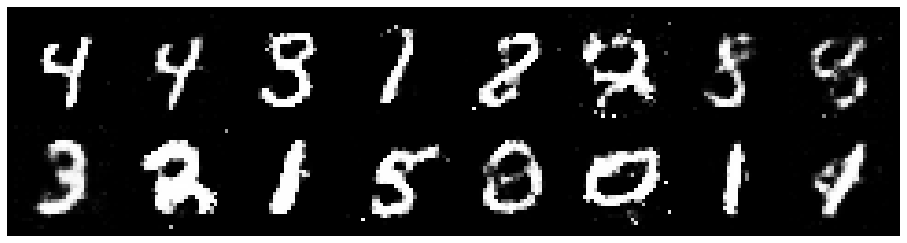

Epoch: [77/200], Batch Num: [400/600]
Discriminator Loss: 1.2725, Generator Loss: 0.8757
D(x): 0.5777, D(G(z)): 0.4500


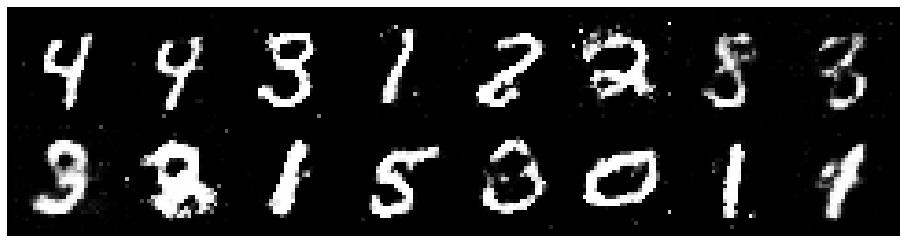

Epoch: [77/200], Batch Num: [500/600]
Discriminator Loss: 1.1779, Generator Loss: 1.0414
D(x): 0.6079, D(G(z)): 0.4070


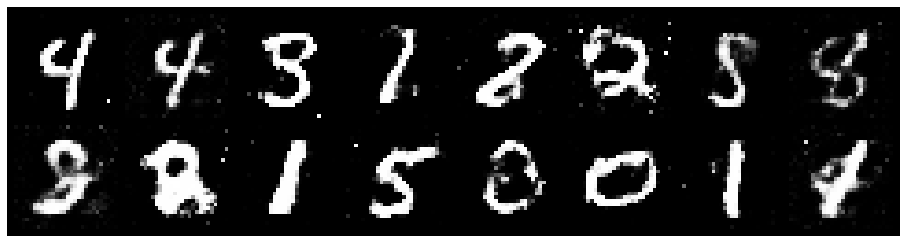

Epoch: [78/200], Batch Num: [0/600]
Discriminator Loss: 1.3152, Generator Loss: 0.9974
D(x): 0.5494, D(G(z)): 0.4204


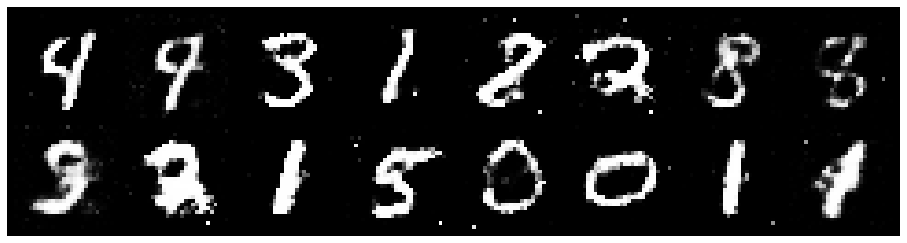

Epoch: [78/200], Batch Num: [100/600]
Discriminator Loss: 1.2435, Generator Loss: 1.3782
D(x): 0.5499, D(G(z)): 0.3693


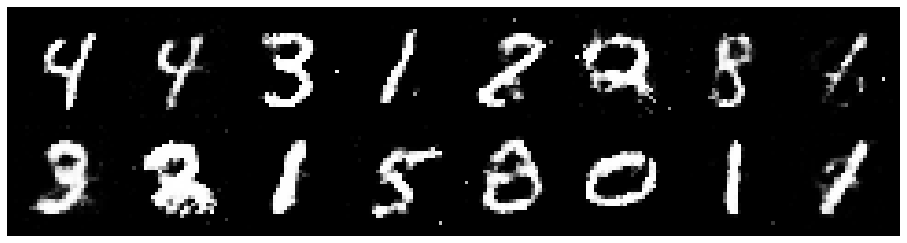

Epoch: [78/200], Batch Num: [200/600]
Discriminator Loss: 1.3049, Generator Loss: 0.9444
D(x): 0.5118, D(G(z)): 0.3894


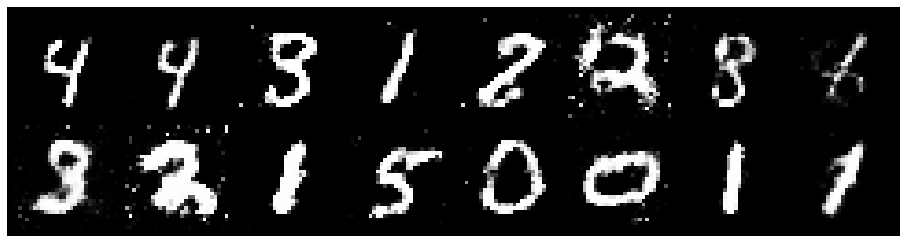

Epoch: [78/200], Batch Num: [300/600]
Discriminator Loss: 1.3299, Generator Loss: 0.8669
D(x): 0.5566, D(G(z)): 0.4496


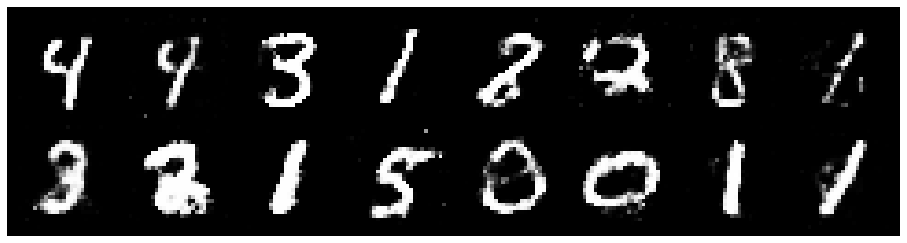

Epoch: [78/200], Batch Num: [400/600]
Discriminator Loss: 1.2025, Generator Loss: 1.0516
D(x): 0.6502, D(G(z)): 0.4540


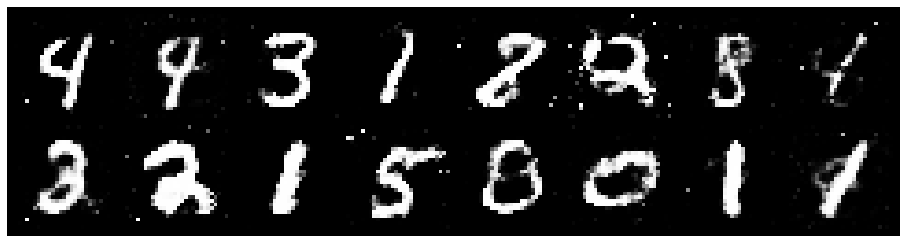

Epoch: [78/200], Batch Num: [500/600]
Discriminator Loss: 1.2569, Generator Loss: 0.9658
D(x): 0.6198, D(G(z)): 0.4557


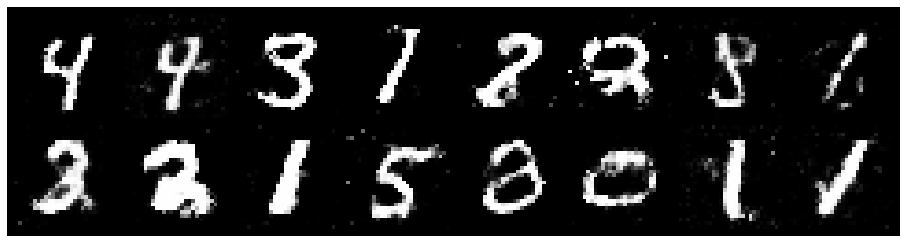

Epoch: [79/200], Batch Num: [0/600]
Discriminator Loss: 1.2365, Generator Loss: 0.9736
D(x): 0.5835, D(G(z)): 0.4148


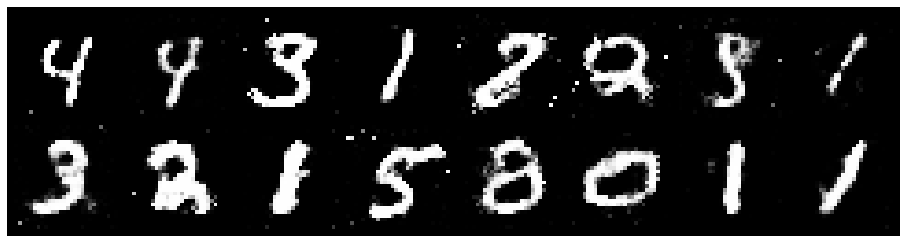

Epoch: [79/200], Batch Num: [100/600]
Discriminator Loss: 1.1823, Generator Loss: 1.3156
D(x): 0.5991, D(G(z)): 0.3859


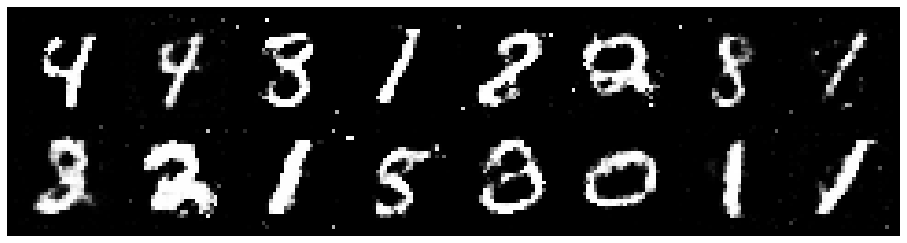

Epoch: [79/200], Batch Num: [200/600]
Discriminator Loss: 1.3078, Generator Loss: 1.0130
D(x): 0.5444, D(G(z)): 0.3986


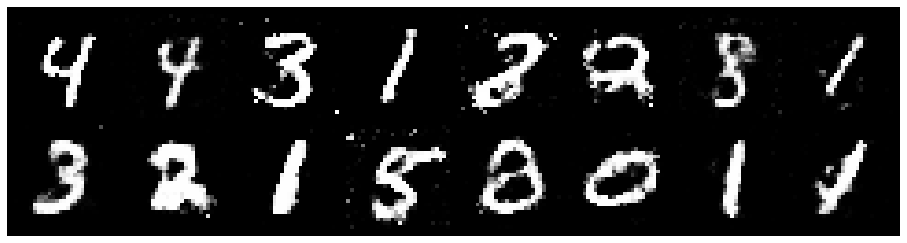

Epoch: [79/200], Batch Num: [300/600]
Discriminator Loss: 1.2300, Generator Loss: 1.0091
D(x): 0.5688, D(G(z)): 0.4036


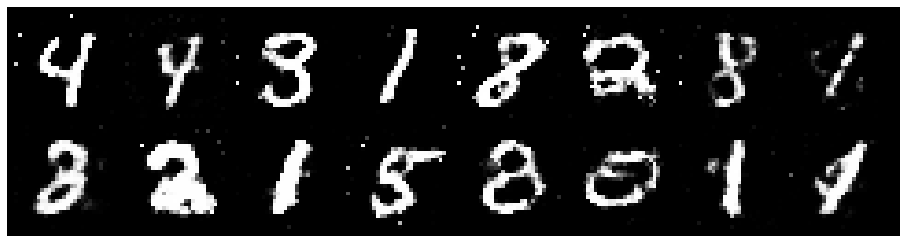

Epoch: [79/200], Batch Num: [400/600]
Discriminator Loss: 1.1316, Generator Loss: 1.0132
D(x): 0.5869, D(G(z)): 0.4003


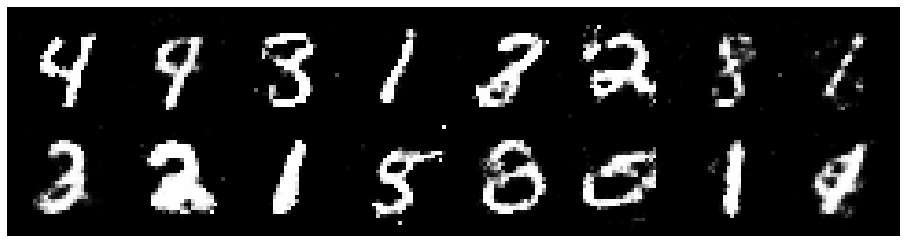

Epoch: [79/200], Batch Num: [500/600]
Discriminator Loss: 1.1234, Generator Loss: 0.9908
D(x): 0.5733, D(G(z)): 0.3877


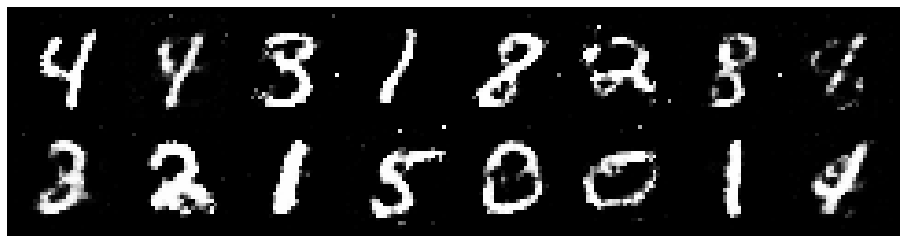

Epoch: [80/200], Batch Num: [0/600]
Discriminator Loss: 1.1109, Generator Loss: 1.0731
D(x): 0.5996, D(G(z)): 0.4013


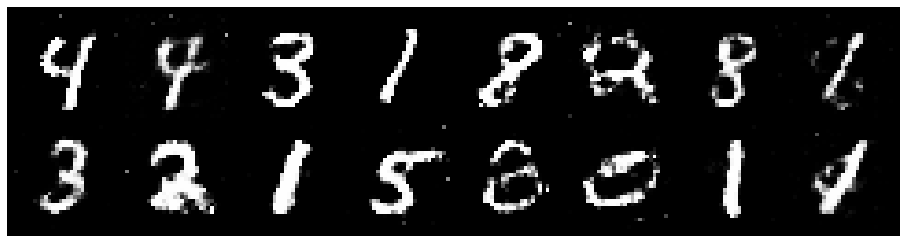

Epoch: [80/200], Batch Num: [100/600]
Discriminator Loss: 1.2103, Generator Loss: 0.9552
D(x): 0.5627, D(G(z)): 0.4259


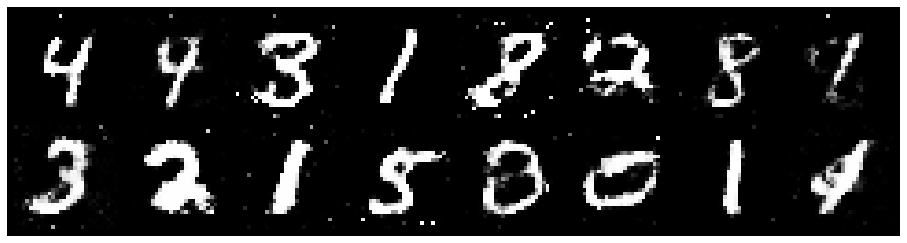

Epoch: [80/200], Batch Num: [200/600]
Discriminator Loss: 1.2073, Generator Loss: 0.8437
D(x): 0.5479, D(G(z)): 0.3953


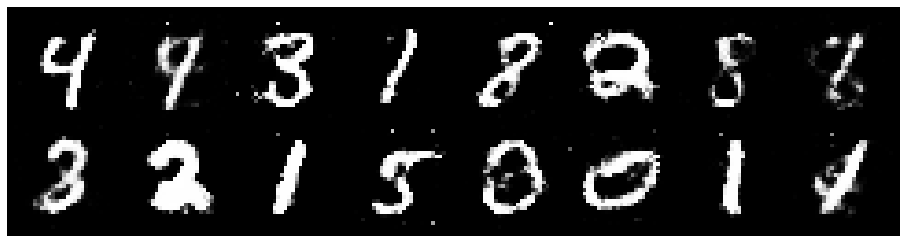

Epoch: [80/200], Batch Num: [300/600]
Discriminator Loss: 1.1775, Generator Loss: 0.8538
D(x): 0.5924, D(G(z)): 0.4329


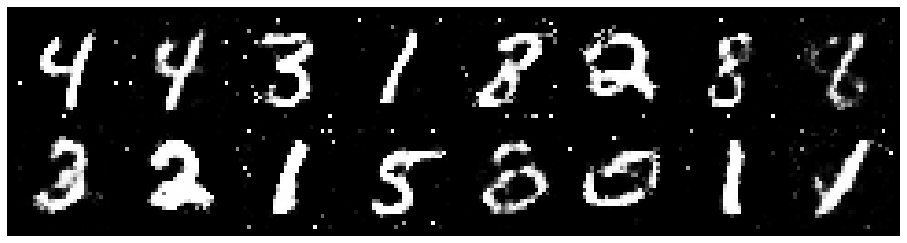

Epoch: [80/200], Batch Num: [400/600]
Discriminator Loss: 1.2673, Generator Loss: 0.8865
D(x): 0.5757, D(G(z)): 0.4624


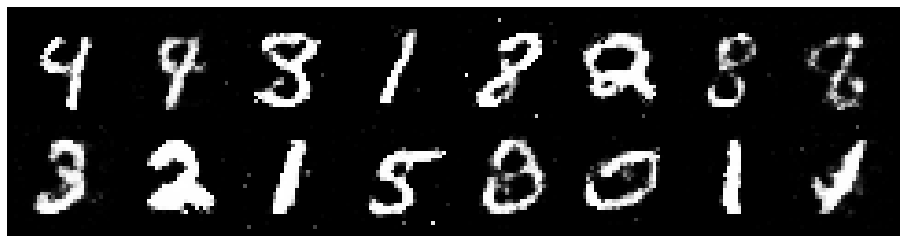

Epoch: [80/200], Batch Num: [500/600]
Discriminator Loss: 1.3117, Generator Loss: 0.8189
D(x): 0.5521, D(G(z)): 0.4724


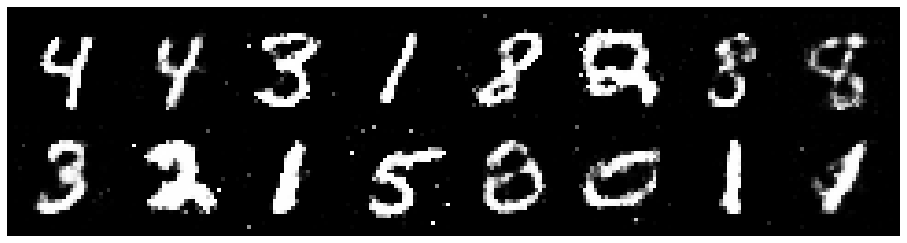

Epoch: [81/200], Batch Num: [0/600]
Discriminator Loss: 1.2360, Generator Loss: 0.8790
D(x): 0.5528, D(G(z)): 0.4187


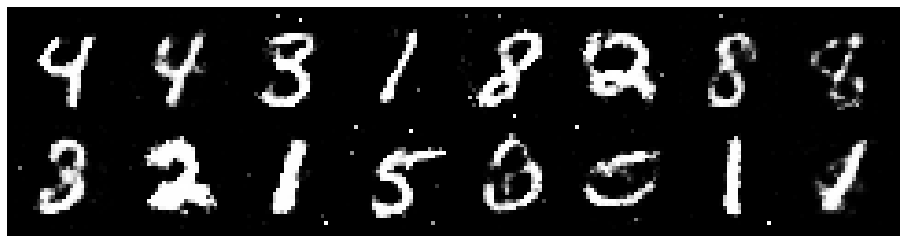

Epoch: [81/200], Batch Num: [100/600]
Discriminator Loss: 1.2939, Generator Loss: 0.9107
D(x): 0.5219, D(G(z)): 0.4205


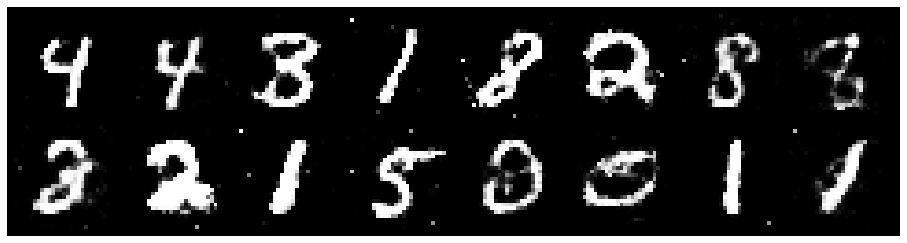

Epoch: [81/200], Batch Num: [200/600]
Discriminator Loss: 1.2060, Generator Loss: 1.0405
D(x): 0.6135, D(G(z)): 0.4362


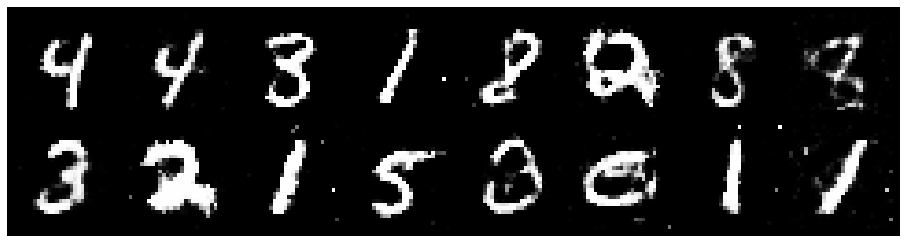

Epoch: [81/200], Batch Num: [300/600]
Discriminator Loss: 1.1539, Generator Loss: 0.9599
D(x): 0.5901, D(G(z)): 0.4046


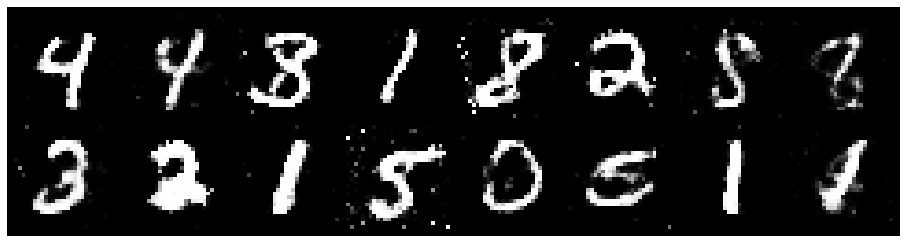

Epoch: [81/200], Batch Num: [400/600]
Discriminator Loss: 1.2622, Generator Loss: 0.9485
D(x): 0.5837, D(G(z)): 0.4676


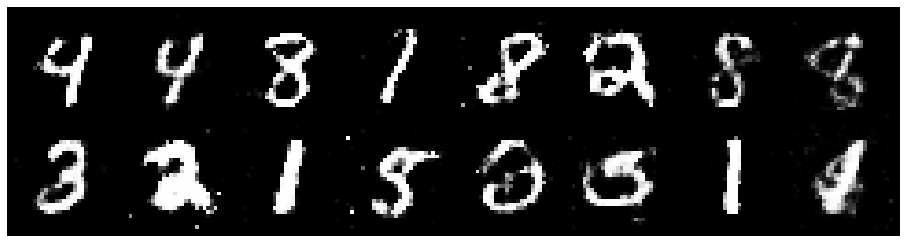

Epoch: [81/200], Batch Num: [500/600]
Discriminator Loss: 1.2642, Generator Loss: 1.0948
D(x): 0.5946, D(G(z)): 0.4372


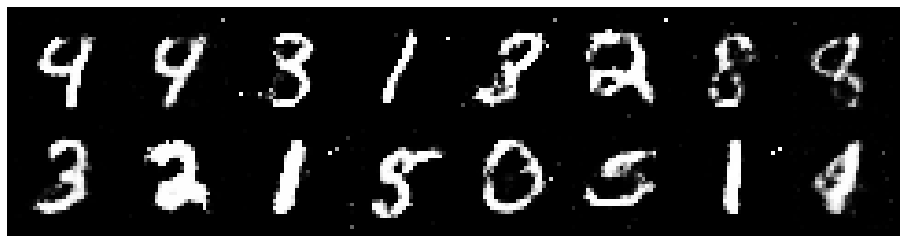

Epoch: [82/200], Batch Num: [0/600]
Discriminator Loss: 1.2459, Generator Loss: 0.8996
D(x): 0.5860, D(G(z)): 0.4623


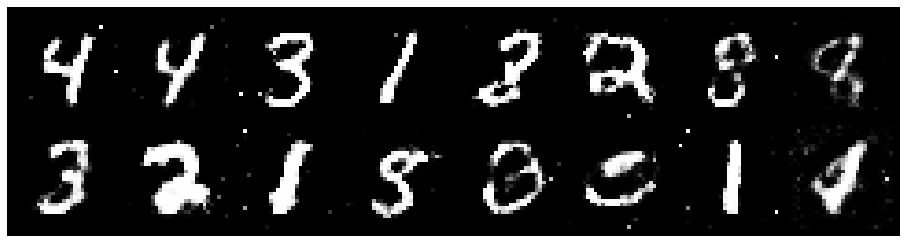

Epoch: [82/200], Batch Num: [100/600]
Discriminator Loss: 1.2503, Generator Loss: 0.9139
D(x): 0.5656, D(G(z)): 0.4393


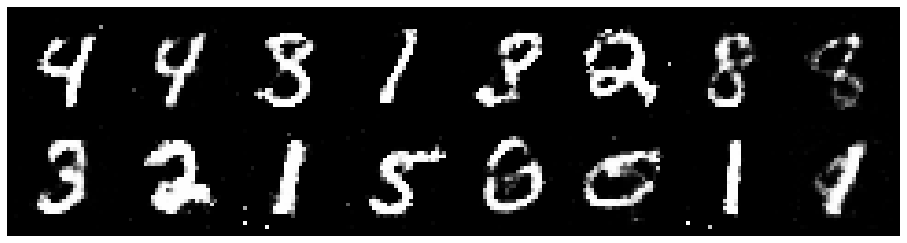

Epoch: [82/200], Batch Num: [200/600]
Discriminator Loss: 1.1910, Generator Loss: 0.8120
D(x): 0.5958, D(G(z)): 0.4502


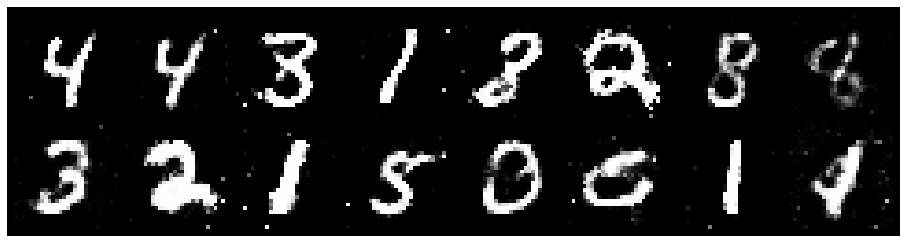

Epoch: [82/200], Batch Num: [300/600]
Discriminator Loss: 1.3111, Generator Loss: 0.9442
D(x): 0.5192, D(G(z)): 0.4284


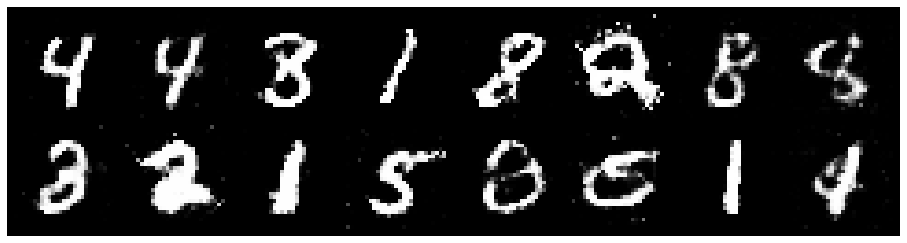

Epoch: [82/200], Batch Num: [400/600]
Discriminator Loss: 1.1806, Generator Loss: 0.9383
D(x): 0.5737, D(G(z)): 0.4184


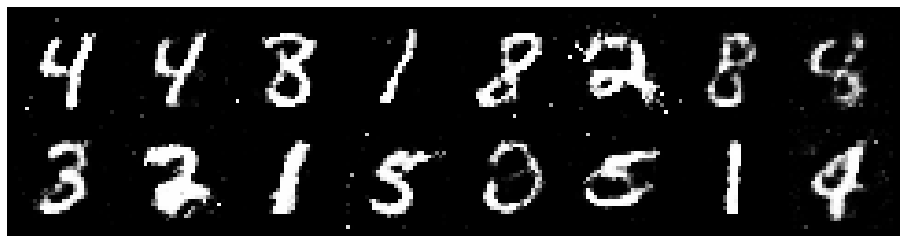

Epoch: [82/200], Batch Num: [500/600]
Discriminator Loss: 1.2817, Generator Loss: 0.8756
D(x): 0.5431, D(G(z)): 0.4367


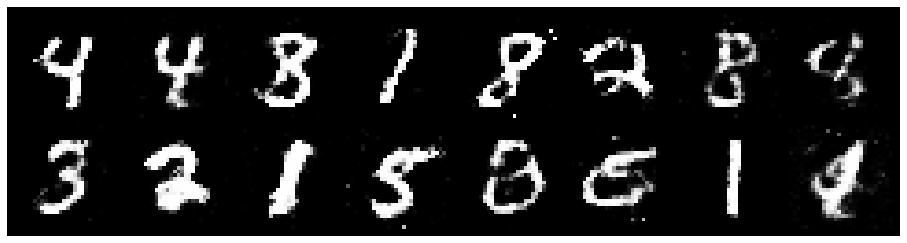

Epoch: [83/200], Batch Num: [0/600]
Discriminator Loss: 1.1916, Generator Loss: 0.8577
D(x): 0.6314, D(G(z)): 0.4706


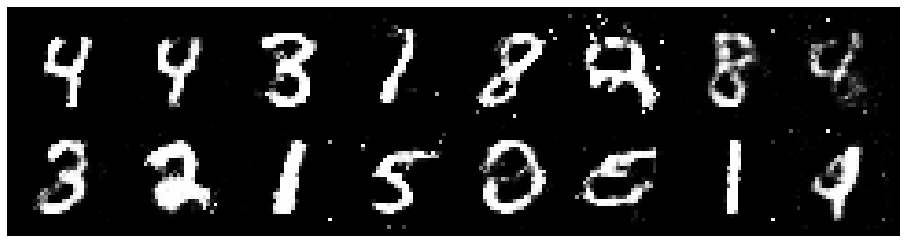

Epoch: [83/200], Batch Num: [100/600]
Discriminator Loss: 1.3421, Generator Loss: 0.9896
D(x): 0.5793, D(G(z)): 0.4600


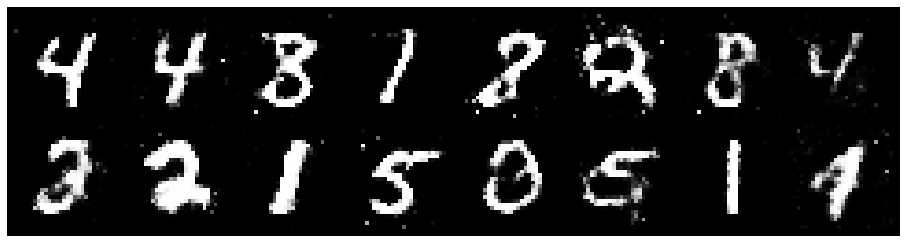

Epoch: [83/200], Batch Num: [200/600]
Discriminator Loss: 1.2418, Generator Loss: 0.8660
D(x): 0.5758, D(G(z)): 0.4243


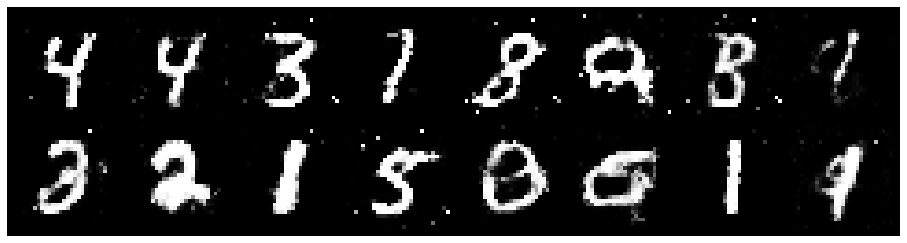

Epoch: [83/200], Batch Num: [300/600]
Discriminator Loss: 1.2696, Generator Loss: 1.0998
D(x): 0.5959, D(G(z)): 0.4297


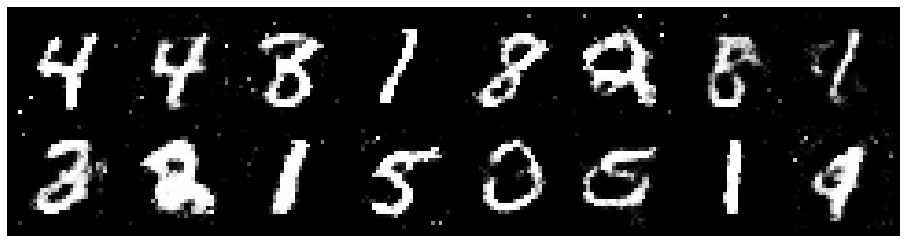

Epoch: [83/200], Batch Num: [400/600]
Discriminator Loss: 1.1482, Generator Loss: 0.8777
D(x): 0.6104, D(G(z)): 0.4257


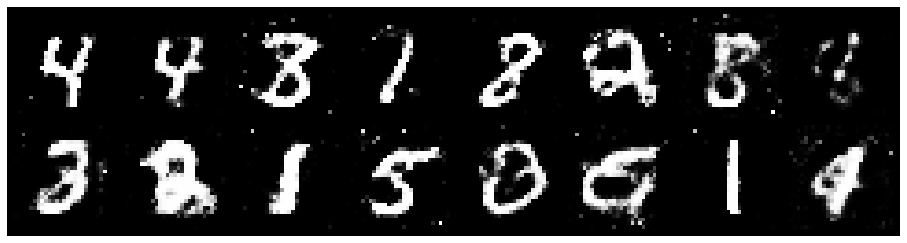

Epoch: [83/200], Batch Num: [500/600]
Discriminator Loss: 1.2560, Generator Loss: 0.9565
D(x): 0.5733, D(G(z)): 0.4386


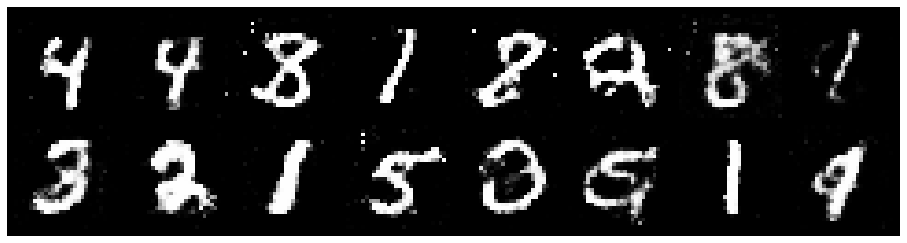

Epoch: [84/200], Batch Num: [0/600]
Discriminator Loss: 1.2442, Generator Loss: 1.0478
D(x): 0.5557, D(G(z)): 0.4187


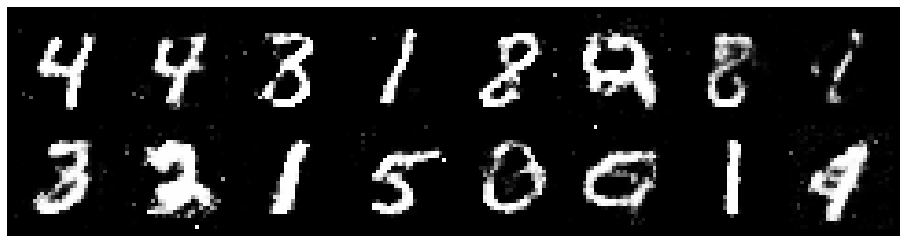

Epoch: [84/200], Batch Num: [100/600]
Discriminator Loss: 1.2463, Generator Loss: 1.1972
D(x): 0.6250, D(G(z)): 0.4445


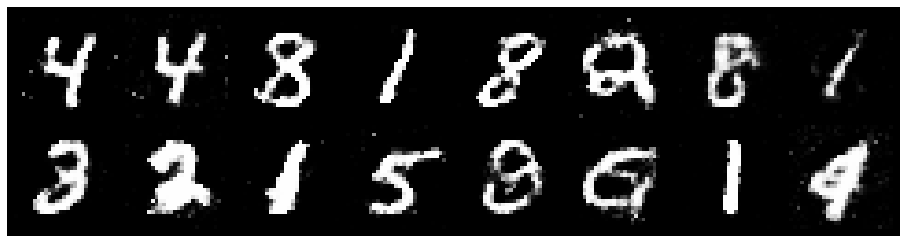

Epoch: [84/200], Batch Num: [200/600]
Discriminator Loss: 1.3213, Generator Loss: 0.8900
D(x): 0.5613, D(G(z)): 0.4530


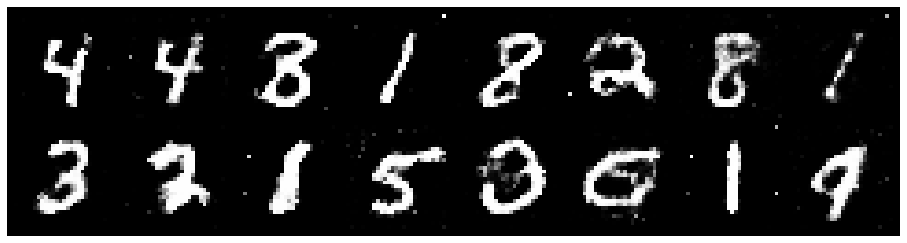

Epoch: [84/200], Batch Num: [300/600]
Discriminator Loss: 1.2495, Generator Loss: 1.0977
D(x): 0.5682, D(G(z)): 0.4328


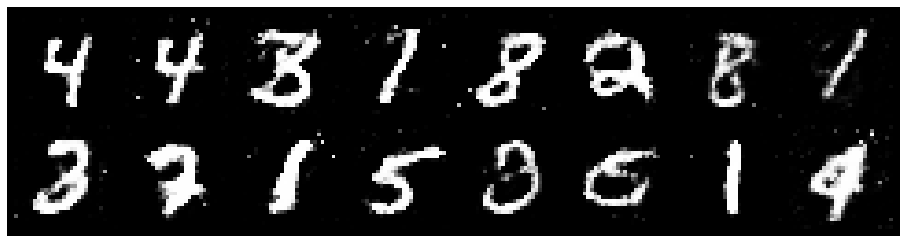

Epoch: [84/200], Batch Num: [400/600]
Discriminator Loss: 1.1174, Generator Loss: 1.0342
D(x): 0.5643, D(G(z)): 0.3720


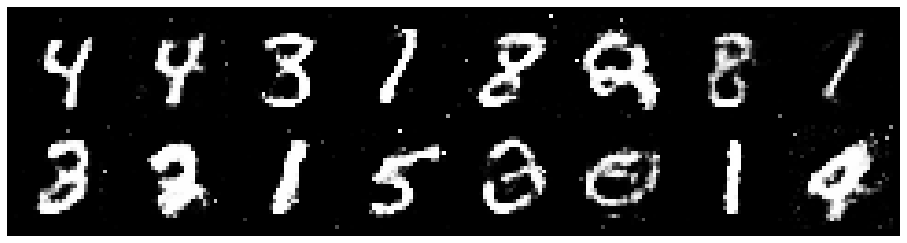

Epoch: [84/200], Batch Num: [500/600]
Discriminator Loss: 1.2885, Generator Loss: 0.7588
D(x): 0.5687, D(G(z)): 0.4552


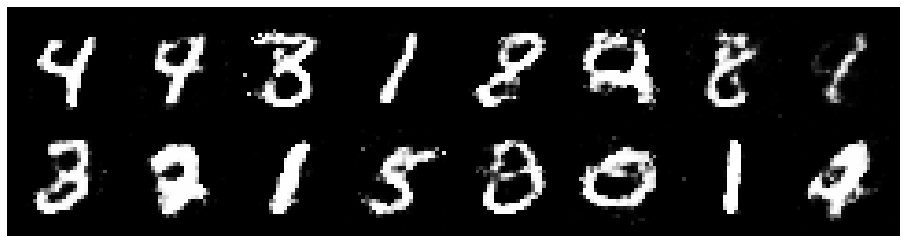

Epoch: [85/200], Batch Num: [0/600]
Discriminator Loss: 1.2507, Generator Loss: 0.7881
D(x): 0.6295, D(G(z)): 0.4863


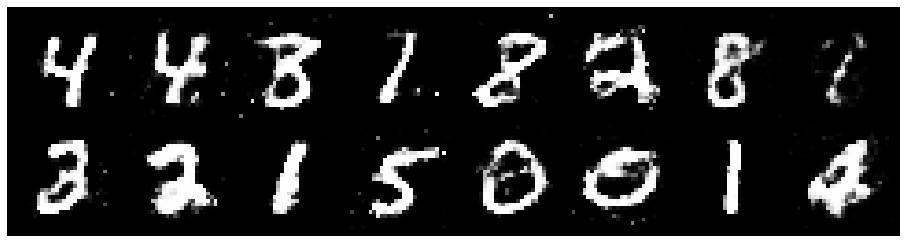

Epoch: [85/200], Batch Num: [100/600]
Discriminator Loss: 1.1871, Generator Loss: 0.9909
D(x): 0.5534, D(G(z)): 0.3817


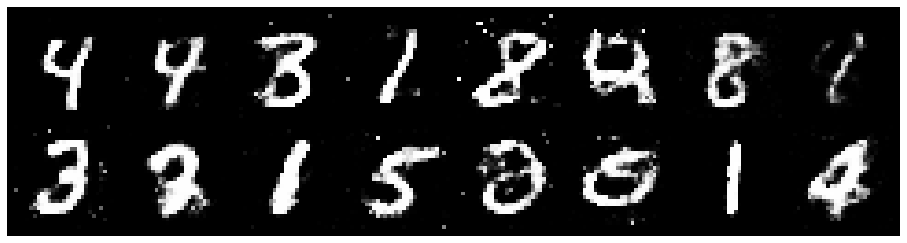

Epoch: [85/200], Batch Num: [200/600]
Discriminator Loss: 1.3271, Generator Loss: 0.9330
D(x): 0.5078, D(G(z)): 0.4341


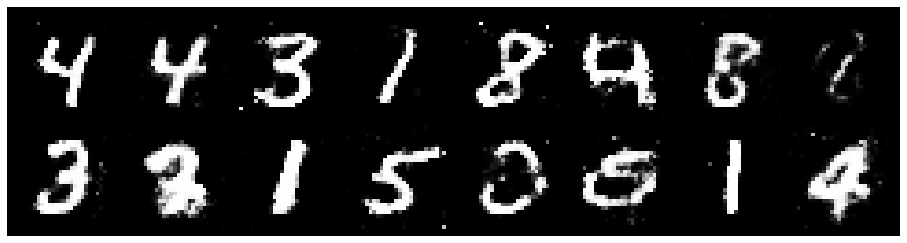

Epoch: [85/200], Batch Num: [300/600]
Discriminator Loss: 1.4633, Generator Loss: 0.8530
D(x): 0.5007, D(G(z)): 0.4807


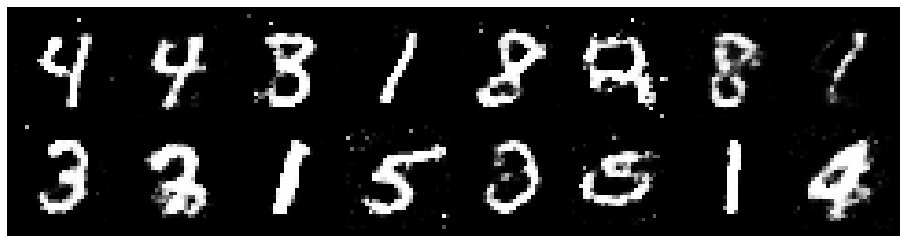

Epoch: [85/200], Batch Num: [400/600]
Discriminator Loss: 1.1913, Generator Loss: 1.0731
D(x): 0.6231, D(G(z)): 0.4293


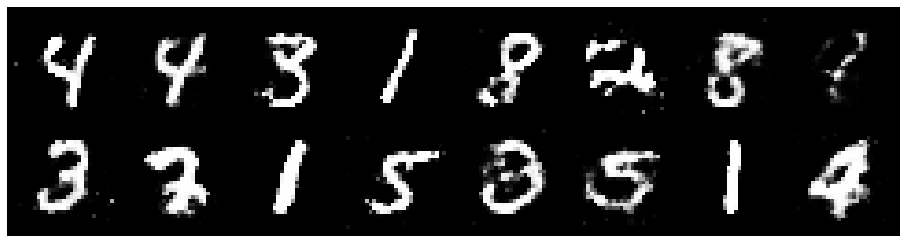

Epoch: [85/200], Batch Num: [500/600]
Discriminator Loss: 1.3182, Generator Loss: 0.9323
D(x): 0.5596, D(G(z)): 0.4300


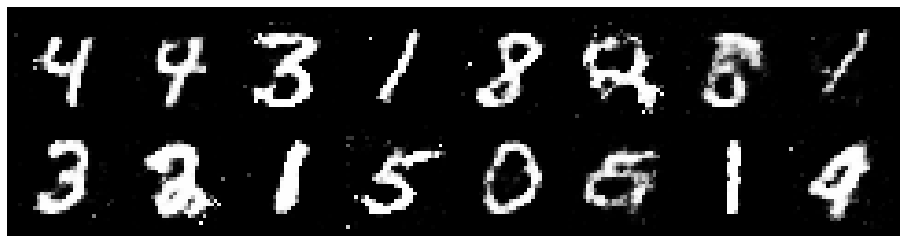

Epoch: [86/200], Batch Num: [0/600]
Discriminator Loss: 1.2339, Generator Loss: 0.8615
D(x): 0.5657, D(G(z)): 0.4389


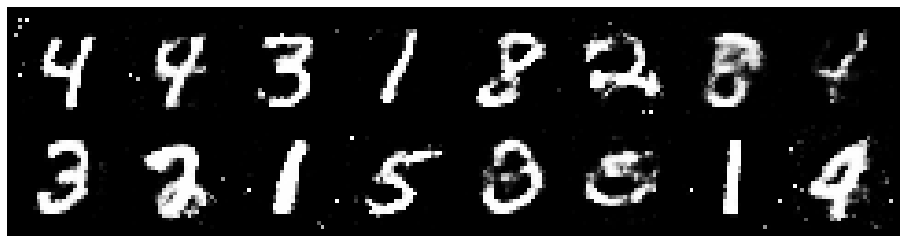

Epoch: [86/200], Batch Num: [100/600]
Discriminator Loss: 1.2677, Generator Loss: 1.0006
D(x): 0.5674, D(G(z)): 0.4199


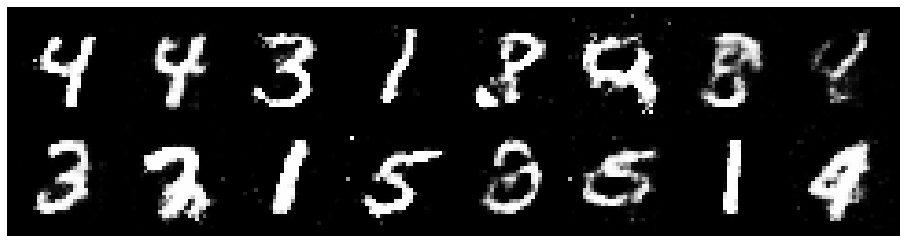

Epoch: [86/200], Batch Num: [200/600]
Discriminator Loss: 1.3580, Generator Loss: 0.8993
D(x): 0.5450, D(G(z)): 0.4451


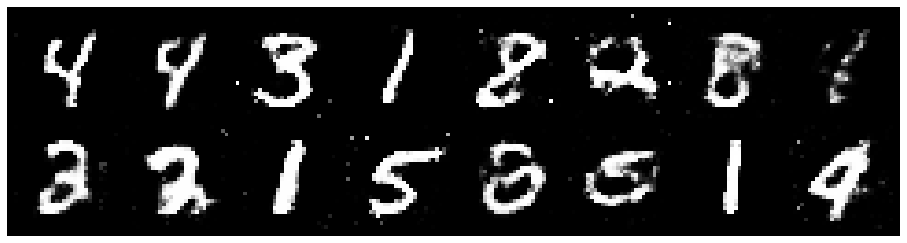

Epoch: [86/200], Batch Num: [300/600]
Discriminator Loss: 1.4048, Generator Loss: 1.0176
D(x): 0.5827, D(G(z)): 0.4994


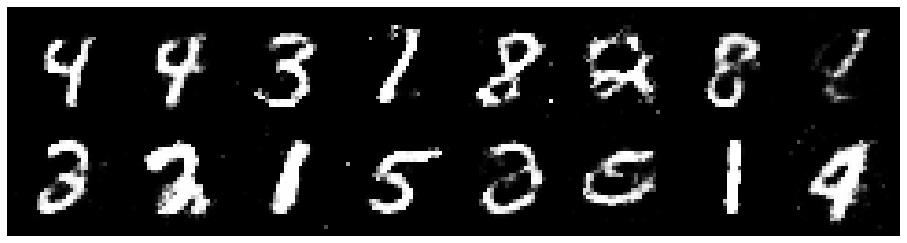

Epoch: [86/200], Batch Num: [400/600]
Discriminator Loss: 1.1291, Generator Loss: 1.1520
D(x): 0.6513, D(G(z)): 0.4418


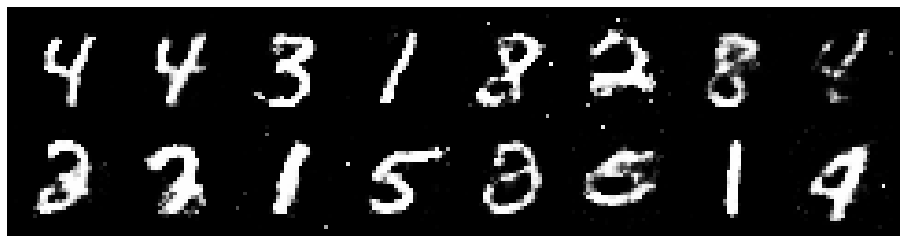

Epoch: [86/200], Batch Num: [500/600]
Discriminator Loss: 1.2674, Generator Loss: 0.8925
D(x): 0.5558, D(G(z)): 0.4187


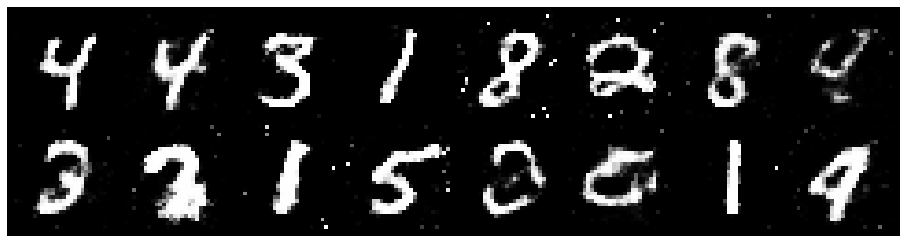

Epoch: [87/200], Batch Num: [0/600]
Discriminator Loss: 1.2907, Generator Loss: 0.9572
D(x): 0.5456, D(G(z)): 0.4387


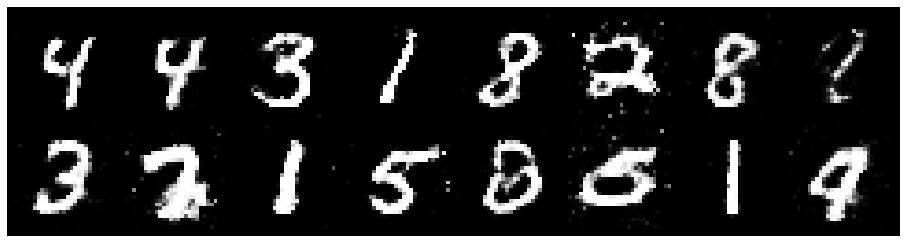

Epoch: [87/200], Batch Num: [100/600]
Discriminator Loss: 1.3115, Generator Loss: 0.8612
D(x): 0.5731, D(G(z)): 0.4774


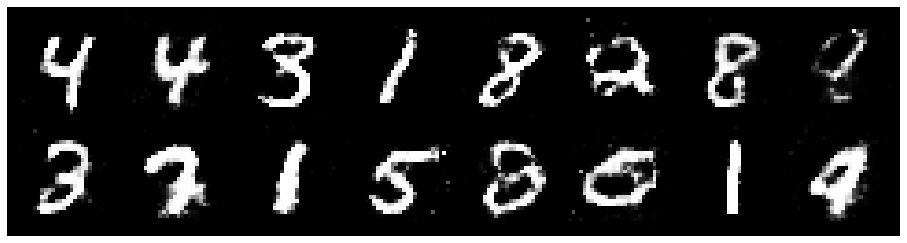

Epoch: [87/200], Batch Num: [200/600]
Discriminator Loss: 1.2706, Generator Loss: 0.8989
D(x): 0.5735, D(G(z)): 0.4369


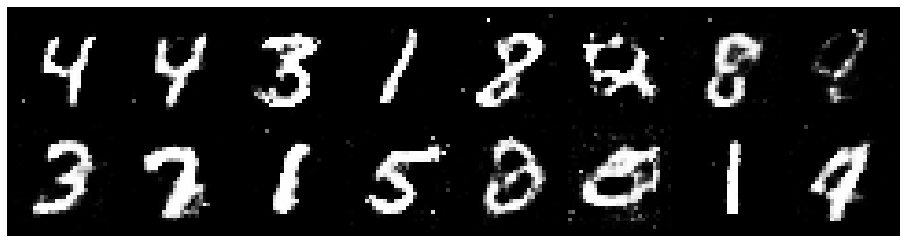

Epoch: [87/200], Batch Num: [300/600]
Discriminator Loss: 1.1851, Generator Loss: 1.2915
D(x): 0.5990, D(G(z)): 0.3908


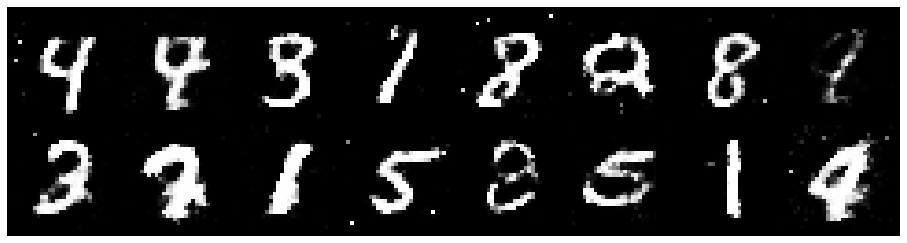

Epoch: [87/200], Batch Num: [400/600]
Discriminator Loss: 1.1908, Generator Loss: 0.9243
D(x): 0.5790, D(G(z)): 0.4093


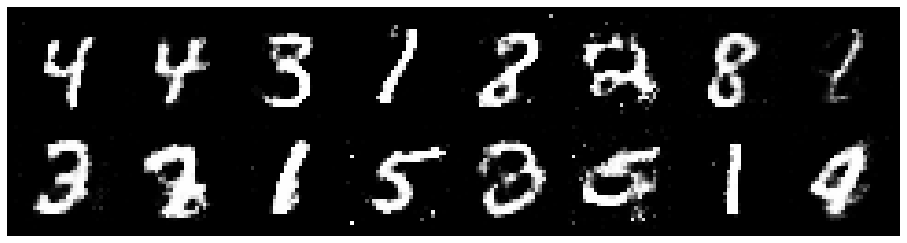

Epoch: [87/200], Batch Num: [500/600]
Discriminator Loss: 1.2508, Generator Loss: 0.8373
D(x): 0.5460, D(G(z)): 0.4489


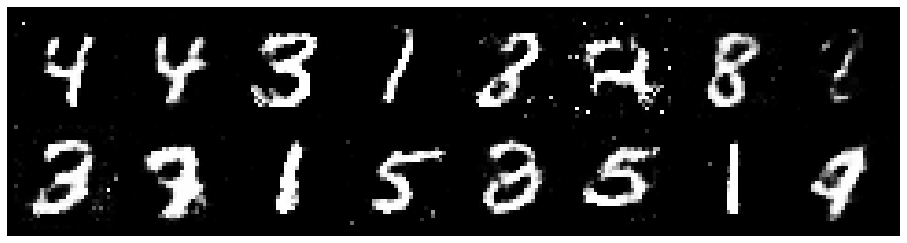

Epoch: [88/200], Batch Num: [0/600]
Discriminator Loss: 1.3217, Generator Loss: 0.9066
D(x): 0.5652, D(G(z)): 0.4731


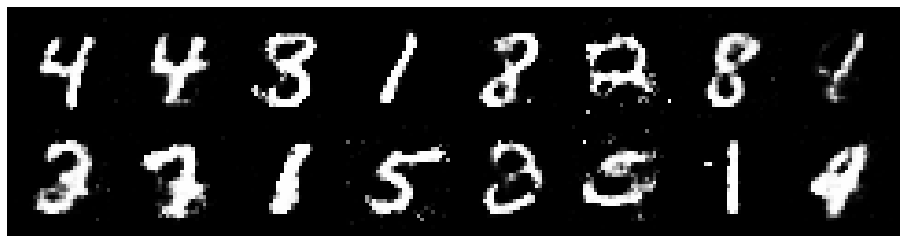

Epoch: [88/200], Batch Num: [100/600]
Discriminator Loss: 1.3419, Generator Loss: 0.8513
D(x): 0.5649, D(G(z)): 0.4834


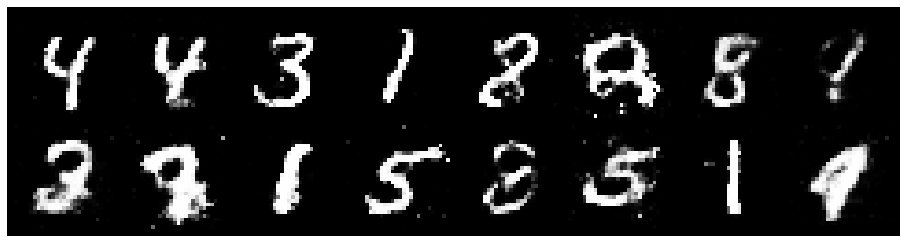

Epoch: [88/200], Batch Num: [200/600]
Discriminator Loss: 1.2412, Generator Loss: 0.8237
D(x): 0.5819, D(G(z)): 0.4609


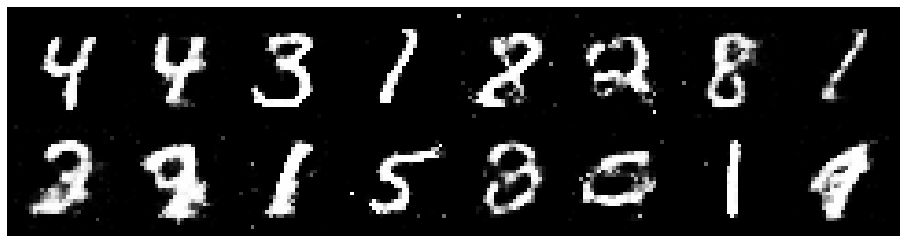

Epoch: [88/200], Batch Num: [300/600]
Discriminator Loss: 1.1944, Generator Loss: 1.0375
D(x): 0.5323, D(G(z)): 0.3804


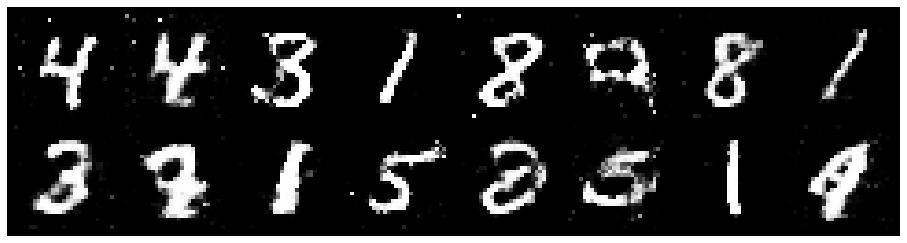

Epoch: [88/200], Batch Num: [400/600]
Discriminator Loss: 1.2499, Generator Loss: 0.8382
D(x): 0.5362, D(G(z)): 0.4133


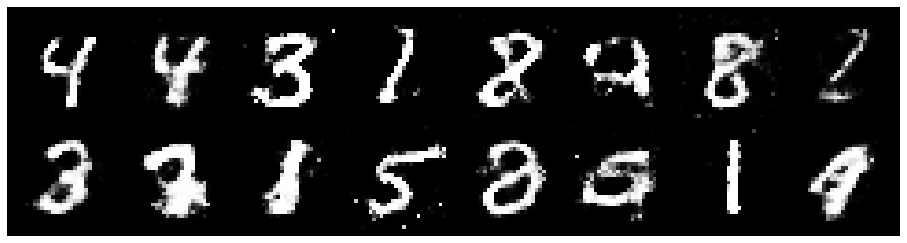

Epoch: [88/200], Batch Num: [500/600]
Discriminator Loss: 1.2323, Generator Loss: 0.8578
D(x): 0.5482, D(G(z)): 0.4172


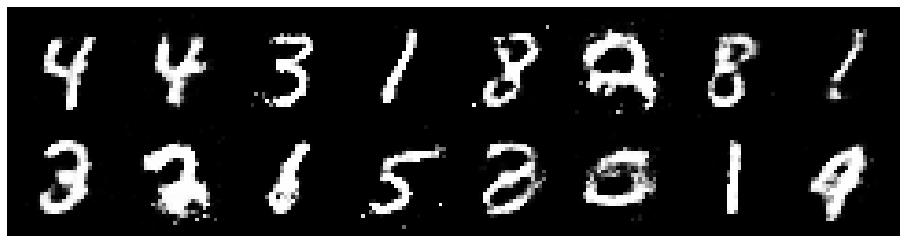

Epoch: [89/200], Batch Num: [0/600]
Discriminator Loss: 1.3133, Generator Loss: 0.7450
D(x): 0.5885, D(G(z)): 0.5112


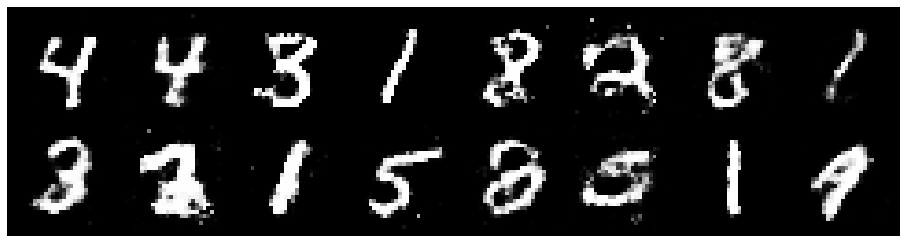

Epoch: [89/200], Batch Num: [100/600]
Discriminator Loss: 1.2130, Generator Loss: 0.8844
D(x): 0.5530, D(G(z)): 0.4295


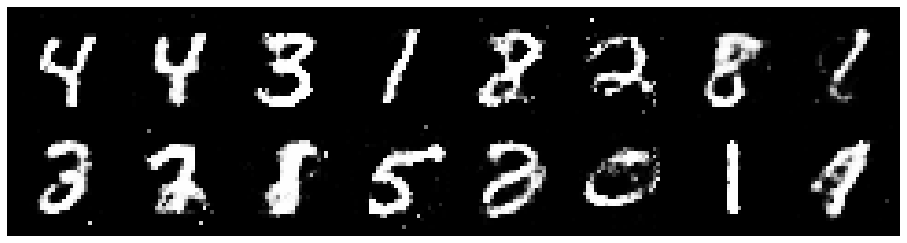

Epoch: [89/200], Batch Num: [200/600]
Discriminator Loss: 1.2372, Generator Loss: 0.8363
D(x): 0.5694, D(G(z)): 0.4539


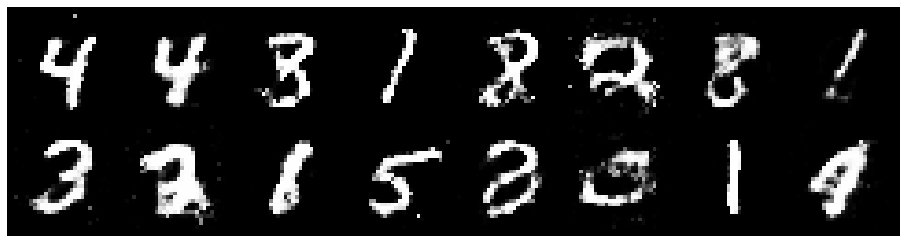

Epoch: [89/200], Batch Num: [300/600]
Discriminator Loss: 1.2559, Generator Loss: 0.8202
D(x): 0.5786, D(G(z)): 0.4678


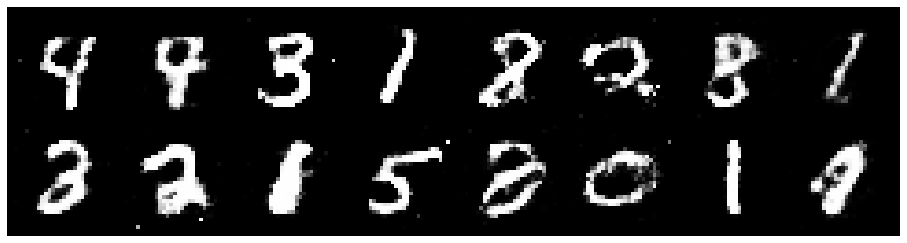

Epoch: [89/200], Batch Num: [400/600]
Discriminator Loss: 1.2093, Generator Loss: 0.8282
D(x): 0.5696, D(G(z)): 0.4294


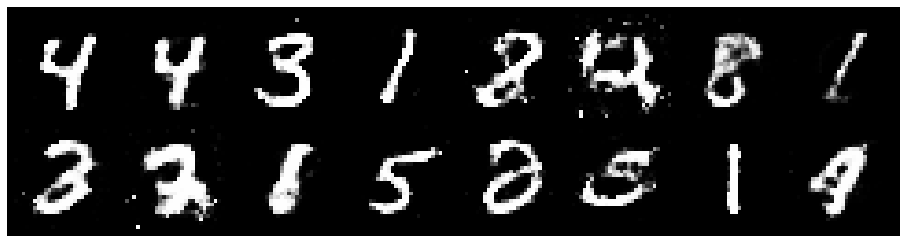

Epoch: [89/200], Batch Num: [500/600]
Discriminator Loss: 1.2846, Generator Loss: 0.7816
D(x): 0.6324, D(G(z)): 0.4916


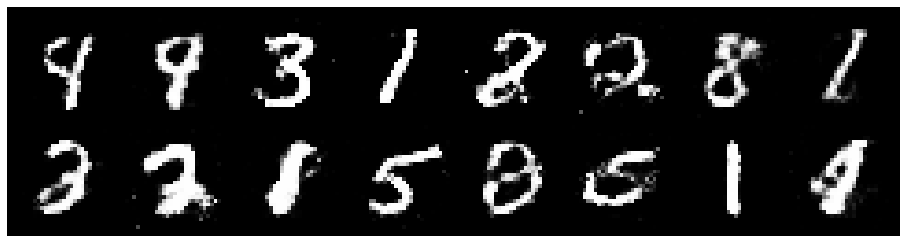

Epoch: [90/200], Batch Num: [0/600]
Discriminator Loss: 1.3714, Generator Loss: 0.8666
D(x): 0.5761, D(G(z)): 0.5084


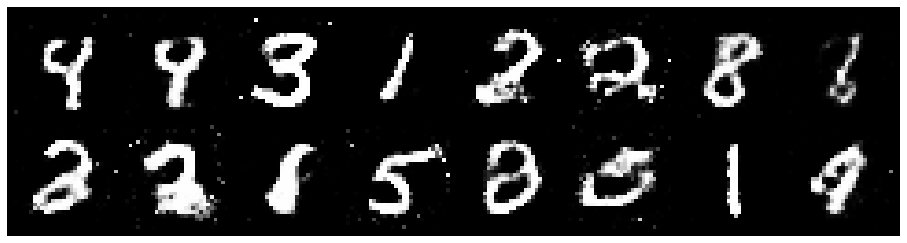

Epoch: [90/200], Batch Num: [100/600]
Discriminator Loss: 1.1630, Generator Loss: 1.1323
D(x): 0.6075, D(G(z)): 0.4084


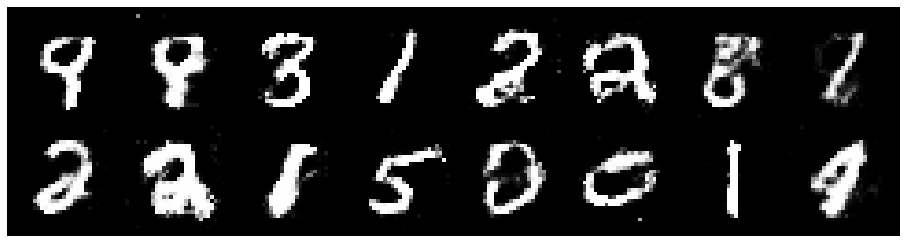

Epoch: [90/200], Batch Num: [200/600]
Discriminator Loss: 1.2242, Generator Loss: 0.9331
D(x): 0.5962, D(G(z)): 0.4517


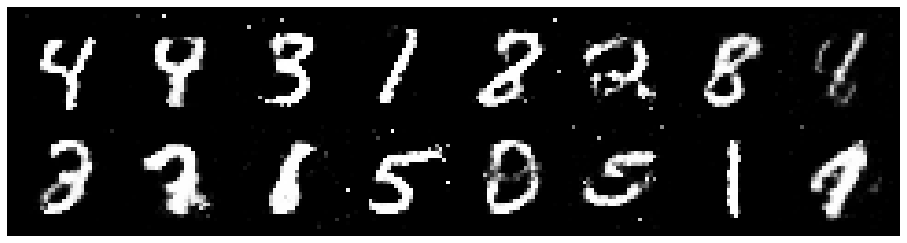

Epoch: [90/200], Batch Num: [300/600]
Discriminator Loss: 1.2328, Generator Loss: 0.9166
D(x): 0.5854, D(G(z)): 0.4565


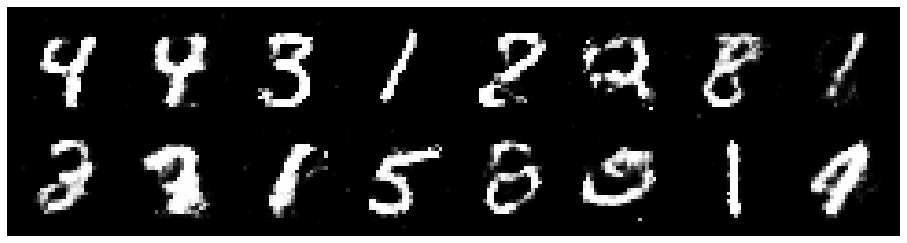

Epoch: [90/200], Batch Num: [400/600]
Discriminator Loss: 1.1701, Generator Loss: 0.8812
D(x): 0.6029, D(G(z)): 0.4323


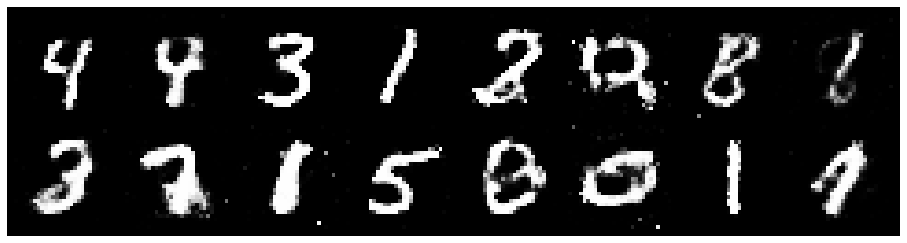

Epoch: [90/200], Batch Num: [500/600]
Discriminator Loss: 1.2420, Generator Loss: 0.8883
D(x): 0.5667, D(G(z)): 0.4289


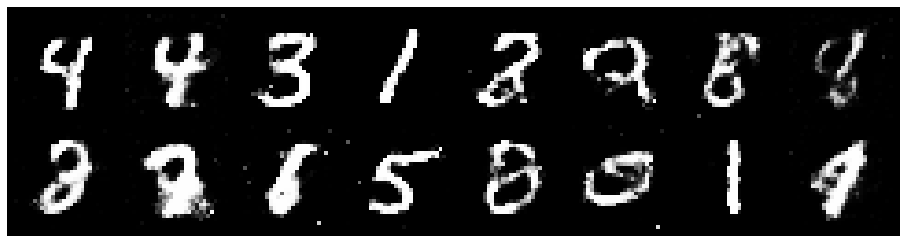

Epoch: [91/200], Batch Num: [0/600]
Discriminator Loss: 1.2380, Generator Loss: 0.9079
D(x): 0.5603, D(G(z)): 0.4314


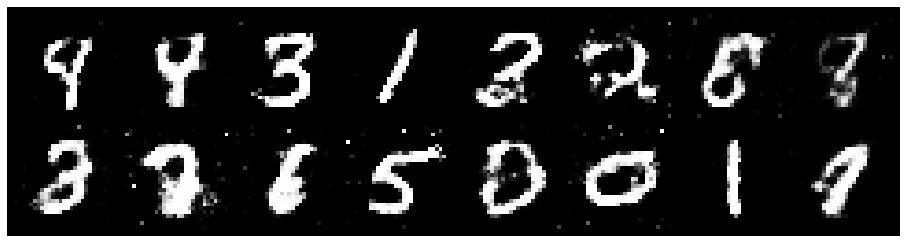

Epoch: [91/200], Batch Num: [100/600]
Discriminator Loss: 1.1878, Generator Loss: 1.0807
D(x): 0.6074, D(G(z)): 0.4396


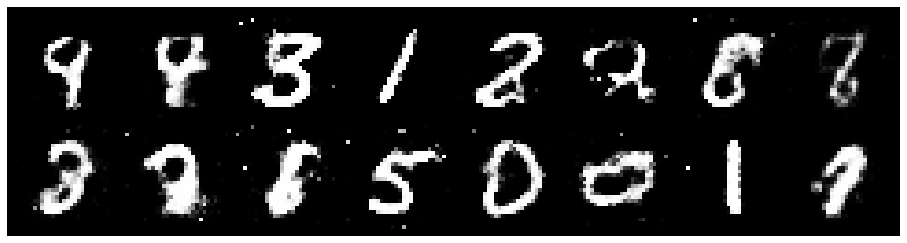

Epoch: [91/200], Batch Num: [200/600]
Discriminator Loss: 1.2488, Generator Loss: 0.7603
D(x): 0.5622, D(G(z)): 0.4521


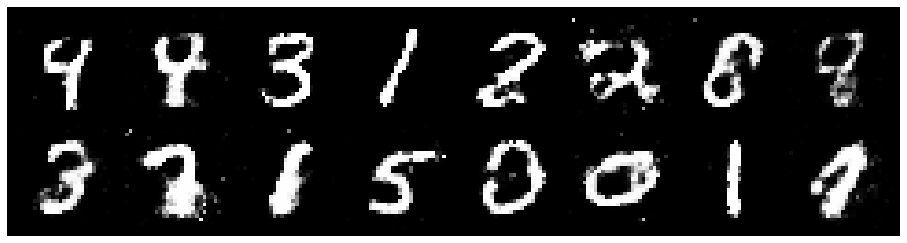

Epoch: [91/200], Batch Num: [300/600]
Discriminator Loss: 1.2593, Generator Loss: 0.7570
D(x): 0.5846, D(G(z)): 0.4819


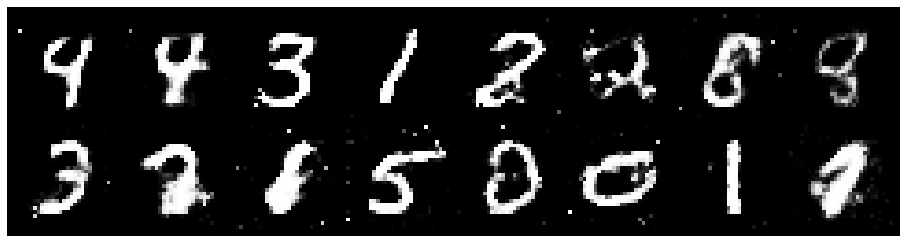

Epoch: [91/200], Batch Num: [400/600]
Discriminator Loss: 1.3772, Generator Loss: 0.8938
D(x): 0.5493, D(G(z)): 0.4822


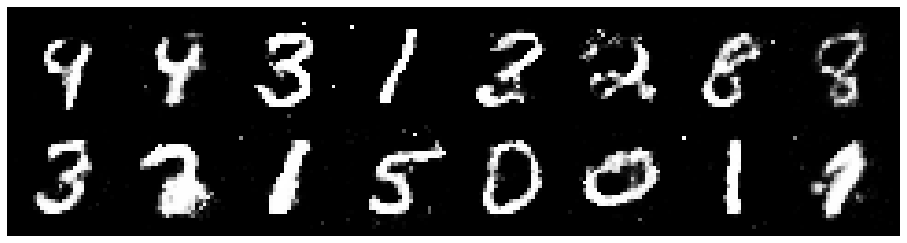

Epoch: [91/200], Batch Num: [500/600]
Discriminator Loss: 1.2813, Generator Loss: 0.8431
D(x): 0.5705, D(G(z)): 0.4748


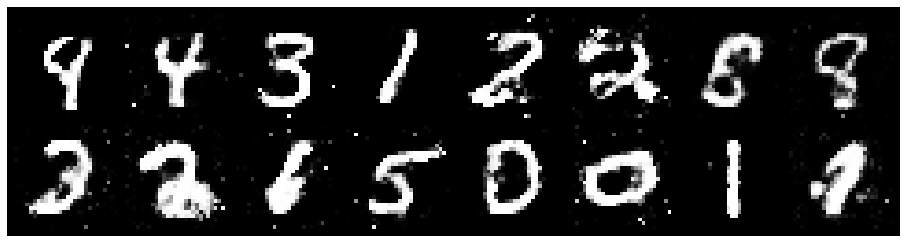

Epoch: [92/200], Batch Num: [0/600]
Discriminator Loss: 1.2363, Generator Loss: 1.0548
D(x): 0.5371, D(G(z)): 0.3954


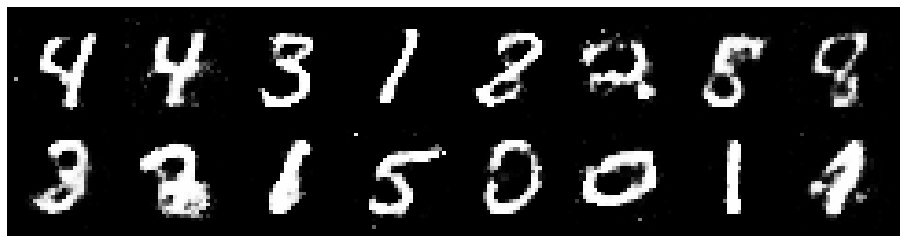

Epoch: [92/200], Batch Num: [100/600]
Discriminator Loss: 1.1948, Generator Loss: 0.9863
D(x): 0.5552, D(G(z)): 0.3764


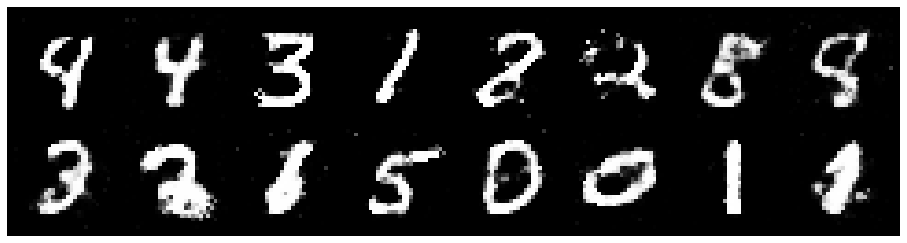

Epoch: [92/200], Batch Num: [200/600]
Discriminator Loss: 1.2657, Generator Loss: 0.8757
D(x): 0.5924, D(G(z)): 0.4439


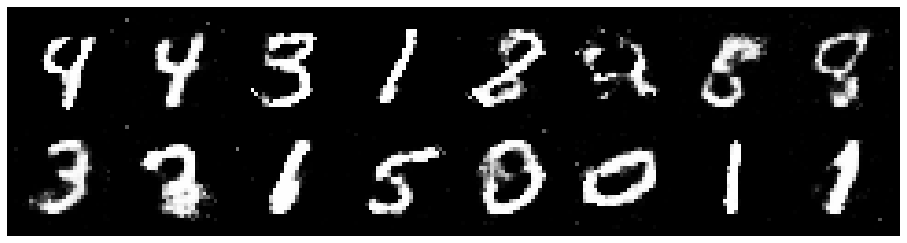

Epoch: [92/200], Batch Num: [300/600]
Discriminator Loss: 1.1914, Generator Loss: 0.8862
D(x): 0.6126, D(G(z)): 0.4428


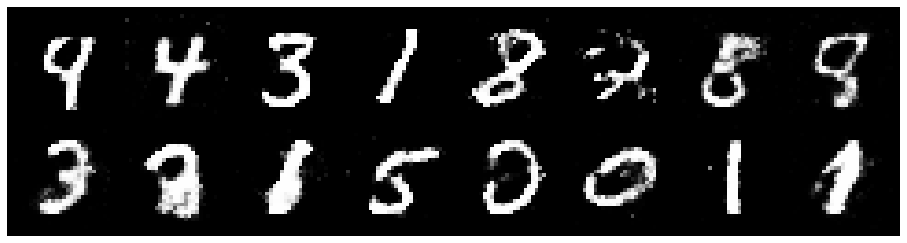

Epoch: [92/200], Batch Num: [400/600]
Discriminator Loss: 1.2572, Generator Loss: 0.9346
D(x): 0.5551, D(G(z)): 0.4406


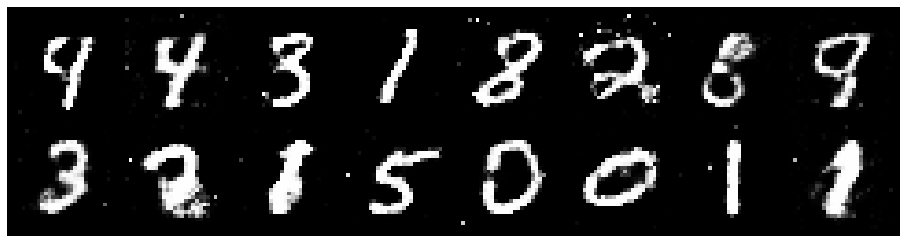

Epoch: [92/200], Batch Num: [500/600]
Discriminator Loss: 1.2278, Generator Loss: 0.9013
D(x): 0.5461, D(G(z)): 0.4250


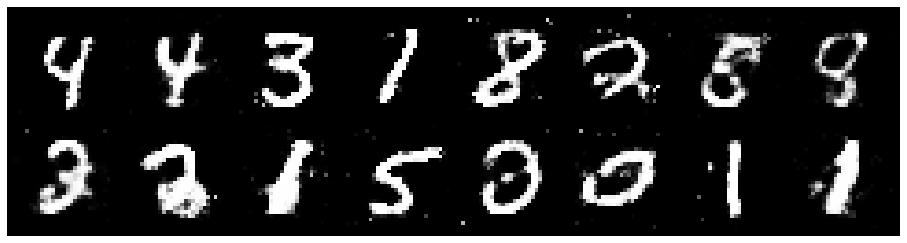

Epoch: [93/200], Batch Num: [0/600]
Discriminator Loss: 1.2118, Generator Loss: 1.0714
D(x): 0.5779, D(G(z)): 0.4201


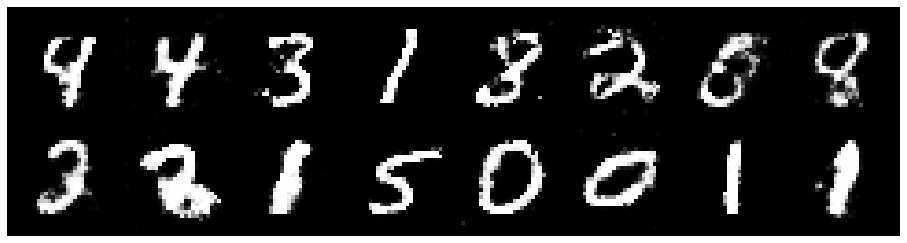

Epoch: [93/200], Batch Num: [100/600]
Discriminator Loss: 1.1954, Generator Loss: 0.9377
D(x): 0.5400, D(G(z)): 0.4010


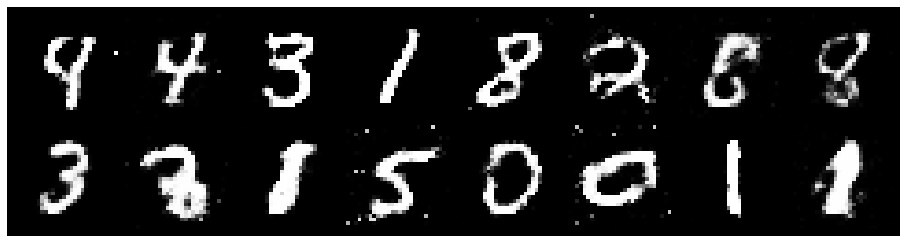

Epoch: [93/200], Batch Num: [200/600]
Discriminator Loss: 1.2176, Generator Loss: 1.0016
D(x): 0.5603, D(G(z)): 0.4223


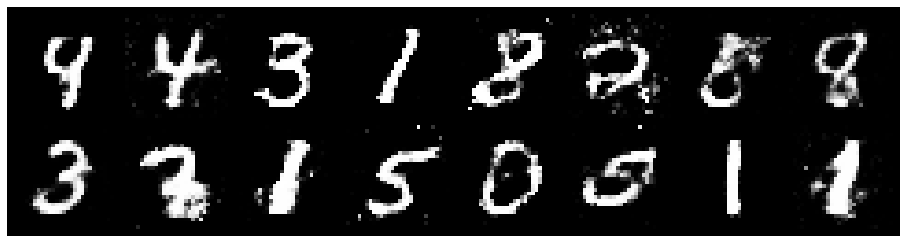

Epoch: [93/200], Batch Num: [300/600]
Discriminator Loss: 1.2281, Generator Loss: 0.9294
D(x): 0.5580, D(G(z)): 0.4296


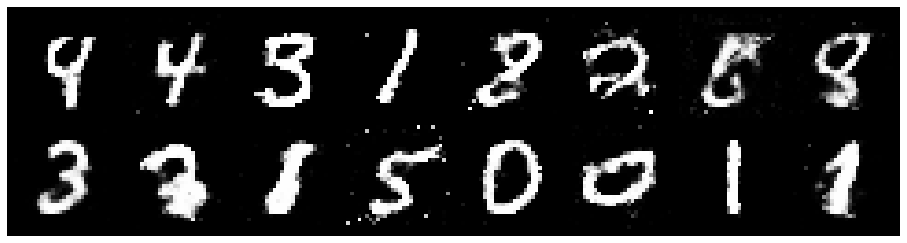

Epoch: [93/200], Batch Num: [400/600]
Discriminator Loss: 1.3483, Generator Loss: 0.8533
D(x): 0.5189, D(G(z)): 0.4586


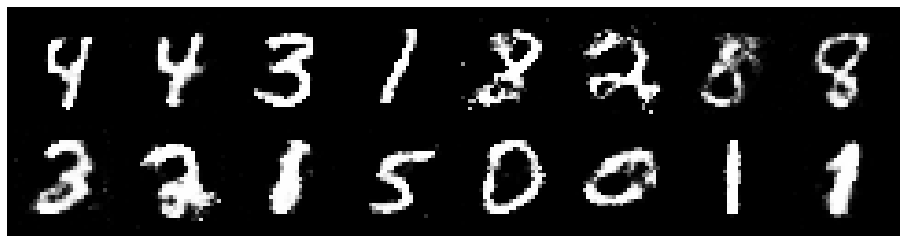

Epoch: [93/200], Batch Num: [500/600]
Discriminator Loss: 1.1623, Generator Loss: 0.9807
D(x): 0.5712, D(G(z)): 0.4109


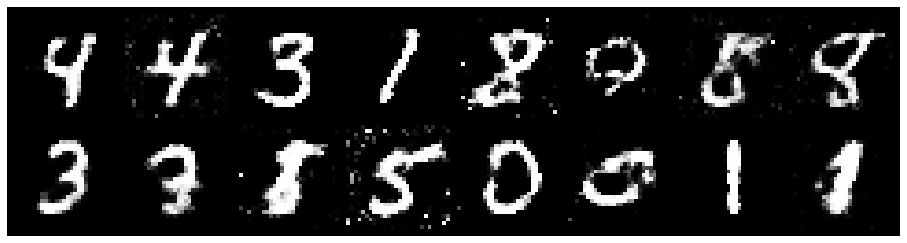

Epoch: [94/200], Batch Num: [0/600]
Discriminator Loss: 1.4338, Generator Loss: 0.9137
D(x): 0.5135, D(G(z)): 0.4778


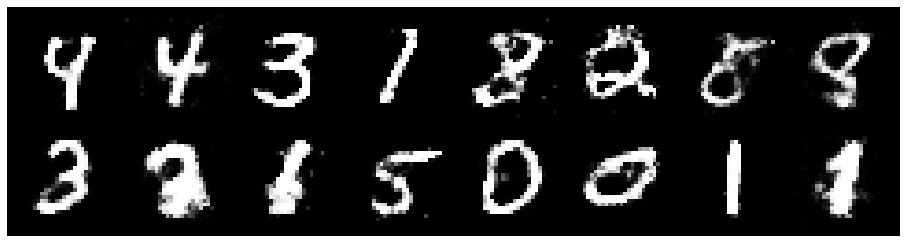

Epoch: [94/200], Batch Num: [100/600]
Discriminator Loss: 1.3273, Generator Loss: 0.7410
D(x): 0.5403, D(G(z)): 0.4836


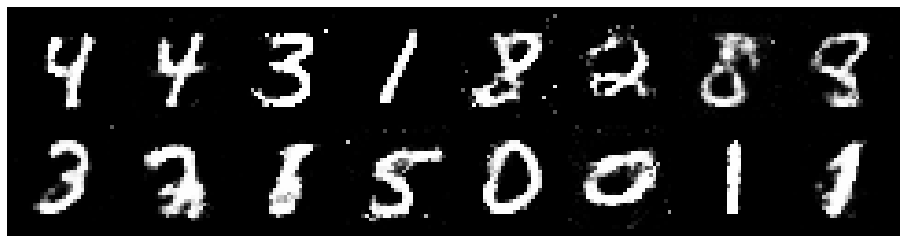

Epoch: [94/200], Batch Num: [200/600]
Discriminator Loss: 1.2516, Generator Loss: 0.8473
D(x): 0.5712, D(G(z)): 0.4465


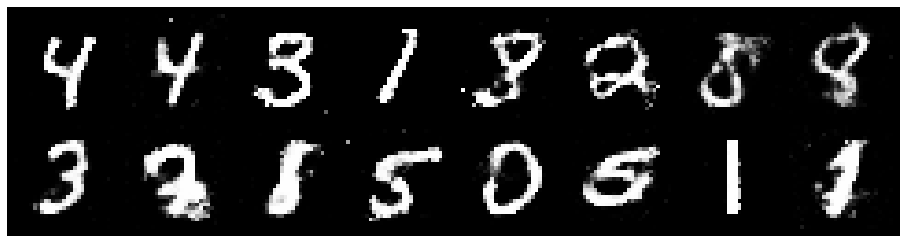

Epoch: [94/200], Batch Num: [300/600]
Discriminator Loss: 1.2553, Generator Loss: 0.9357
D(x): 0.5425, D(G(z)): 0.4203


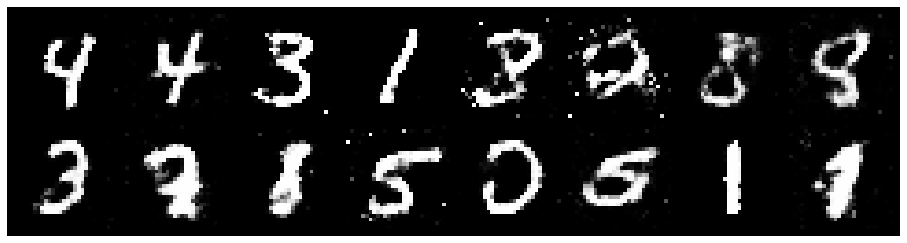

Epoch: [94/200], Batch Num: [400/600]
Discriminator Loss: 1.1863, Generator Loss: 0.9459
D(x): 0.5626, D(G(z)): 0.4168


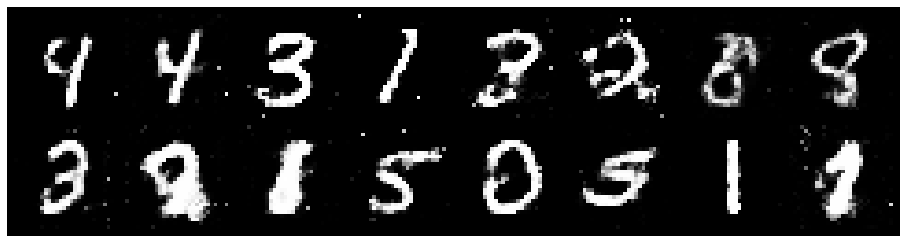

Epoch: [94/200], Batch Num: [500/600]
Discriminator Loss: 1.2182, Generator Loss: 0.7526
D(x): 0.5842, D(G(z)): 0.4505


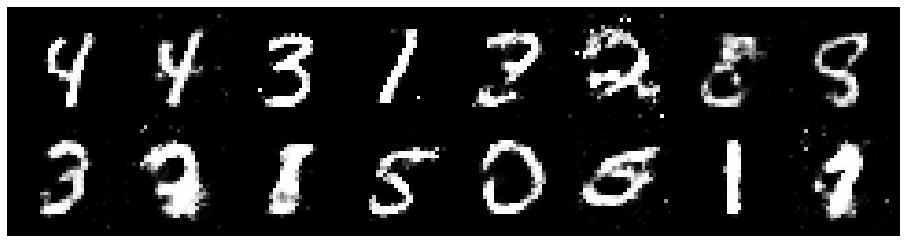

Epoch: [95/200], Batch Num: [0/600]
Discriminator Loss: 1.3509, Generator Loss: 1.0046
D(x): 0.5106, D(G(z)): 0.4092


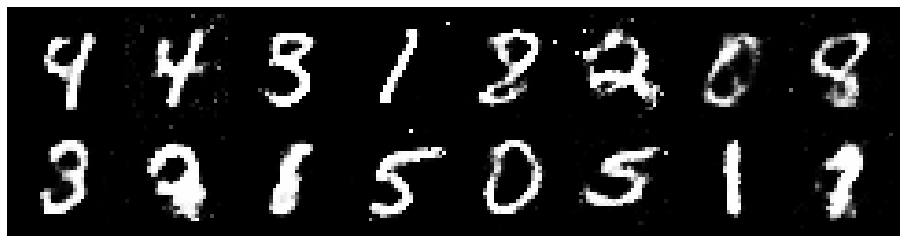

Epoch: [95/200], Batch Num: [100/600]
Discriminator Loss: 1.3372, Generator Loss: 0.7559
D(x): 0.5590, D(G(z)): 0.4916


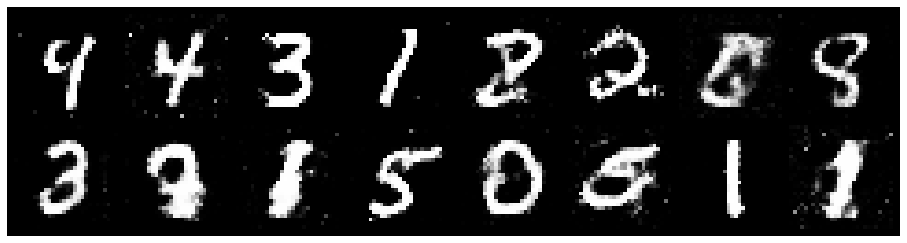

Epoch: [95/200], Batch Num: [200/600]
Discriminator Loss: 1.3389, Generator Loss: 1.0259
D(x): 0.5209, D(G(z)): 0.4274


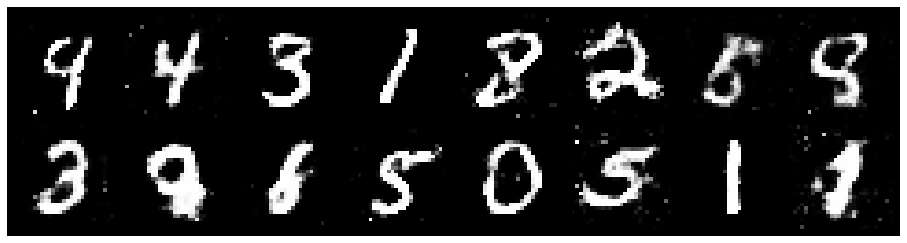

Epoch: [95/200], Batch Num: [300/600]
Discriminator Loss: 1.2084, Generator Loss: 0.8595
D(x): 0.5597, D(G(z)): 0.4277


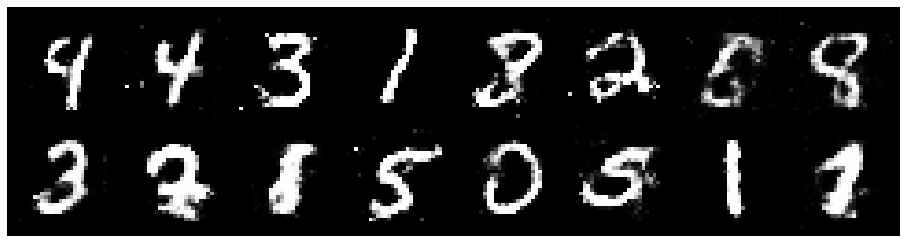

Epoch: [95/200], Batch Num: [400/600]
Discriminator Loss: 1.3021, Generator Loss: 0.8627
D(x): 0.5226, D(G(z)): 0.4380


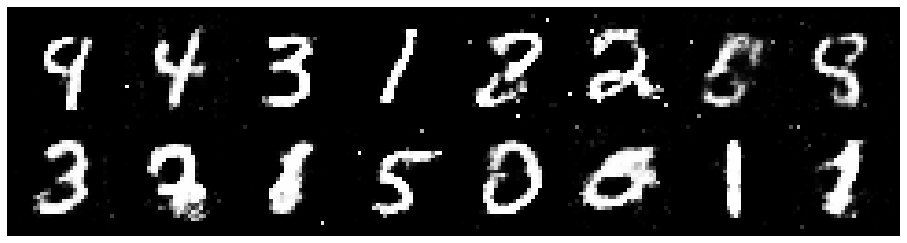

Epoch: [95/200], Batch Num: [500/600]
Discriminator Loss: 1.2741, Generator Loss: 0.8934
D(x): 0.5515, D(G(z)): 0.4317


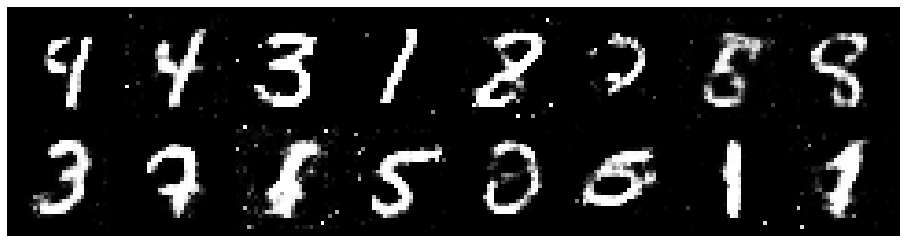

Epoch: [96/200], Batch Num: [0/600]
Discriminator Loss: 1.4183, Generator Loss: 0.7634
D(x): 0.5251, D(G(z)): 0.4875


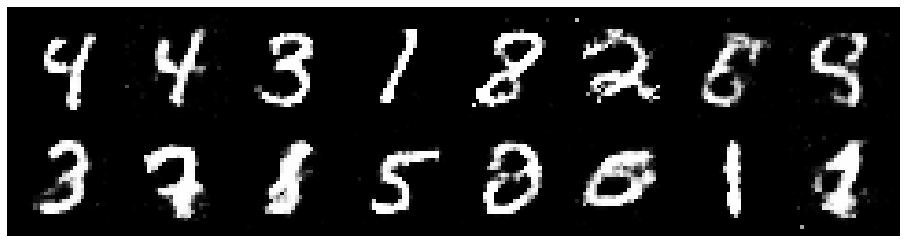

Epoch: [96/200], Batch Num: [100/600]
Discriminator Loss: 1.3947, Generator Loss: 1.0617
D(x): 0.4846, D(G(z)): 0.3898


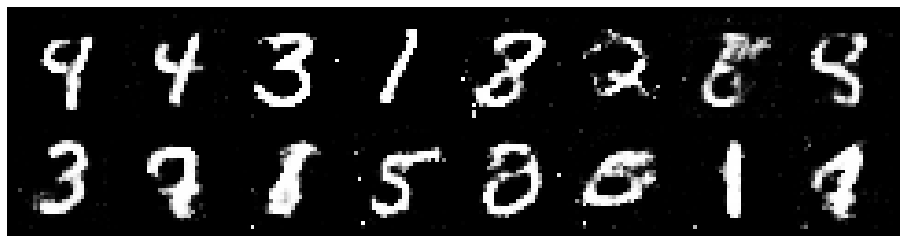

Epoch: [96/200], Batch Num: [200/600]
Discriminator Loss: 1.1512, Generator Loss: 0.8773
D(x): 0.5841, D(G(z)): 0.4101


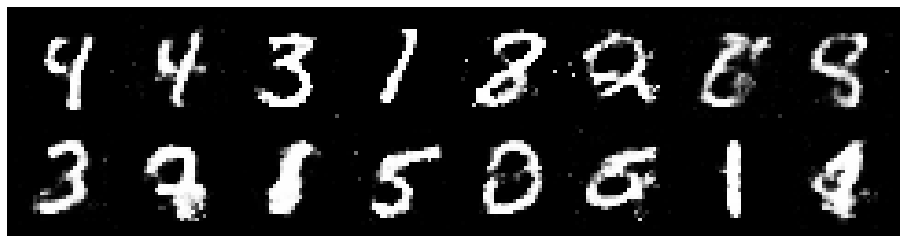

Epoch: [96/200], Batch Num: [300/600]
Discriminator Loss: 1.1886, Generator Loss: 1.0523
D(x): 0.5994, D(G(z)): 0.4263


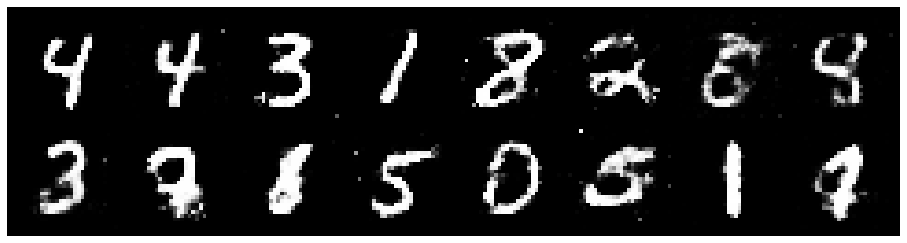

Epoch: [96/200], Batch Num: [400/600]
Discriminator Loss: 1.2230, Generator Loss: 0.8584
D(x): 0.5395, D(G(z)): 0.4213


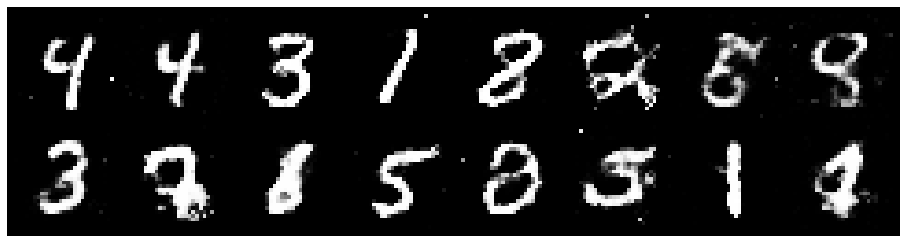

Epoch: [96/200], Batch Num: [500/600]
Discriminator Loss: 1.2398, Generator Loss: 0.7987
D(x): 0.5489, D(G(z)): 0.4410


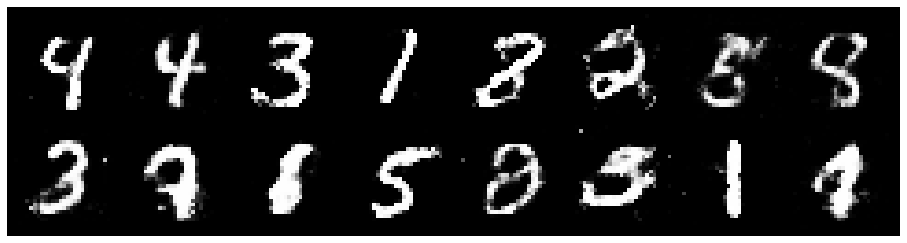

Epoch: [97/200], Batch Num: [0/600]
Discriminator Loss: 1.2845, Generator Loss: 0.8126
D(x): 0.5169, D(G(z)): 0.4394


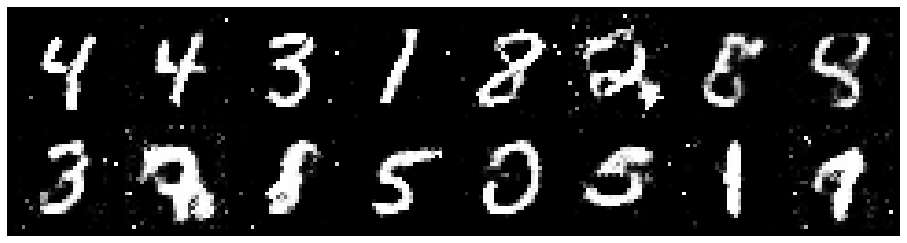

Epoch: [97/200], Batch Num: [100/600]
Discriminator Loss: 1.3066, Generator Loss: 0.9138
D(x): 0.5245, D(G(z)): 0.4232


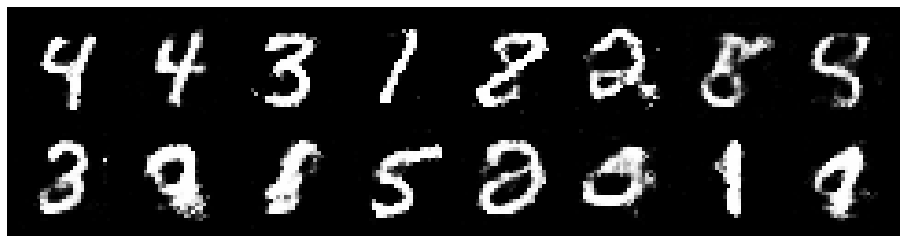

Epoch: [97/200], Batch Num: [200/600]
Discriminator Loss: 1.2118, Generator Loss: 0.9462
D(x): 0.5469, D(G(z)): 0.3892


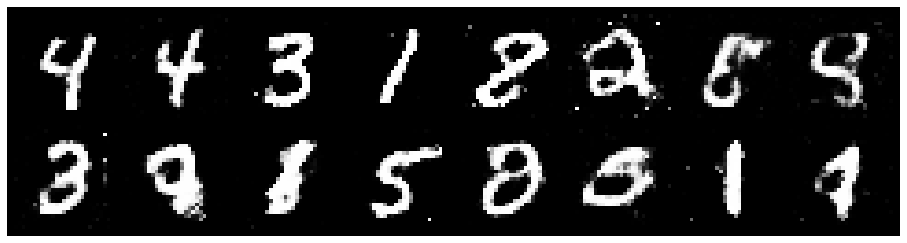

Epoch: [97/200], Batch Num: [300/600]
Discriminator Loss: 1.2861, Generator Loss: 0.9720
D(x): 0.5423, D(G(z)): 0.4231


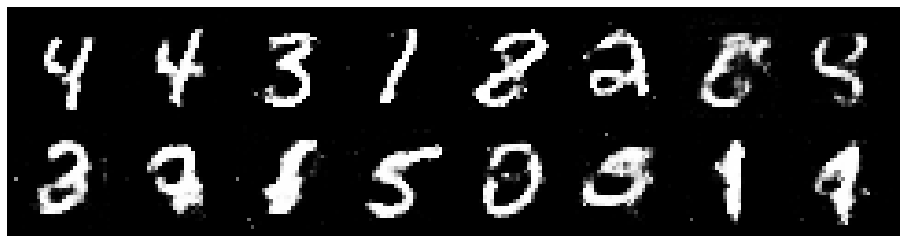

Epoch: [97/200], Batch Num: [400/600]
Discriminator Loss: 1.2680, Generator Loss: 0.8292
D(x): 0.5686, D(G(z)): 0.4574


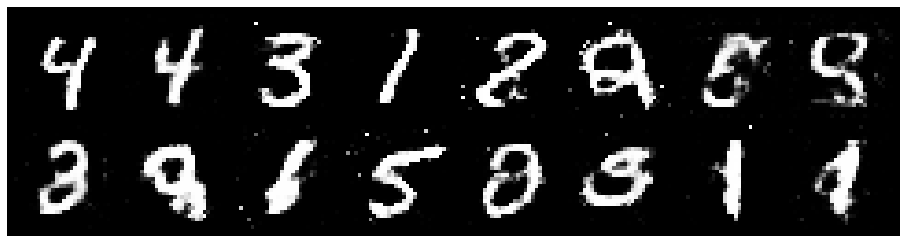

Epoch: [97/200], Batch Num: [500/600]
Discriminator Loss: 1.2699, Generator Loss: 0.8568
D(x): 0.5528, D(G(z)): 0.4224


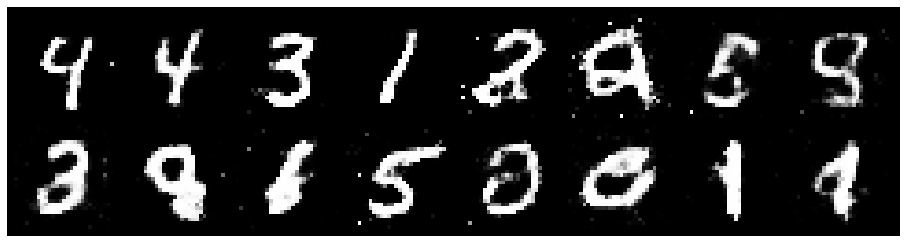

Epoch: [98/200], Batch Num: [0/600]
Discriminator Loss: 1.2324, Generator Loss: 1.0201
D(x): 0.5567, D(G(z)): 0.4049


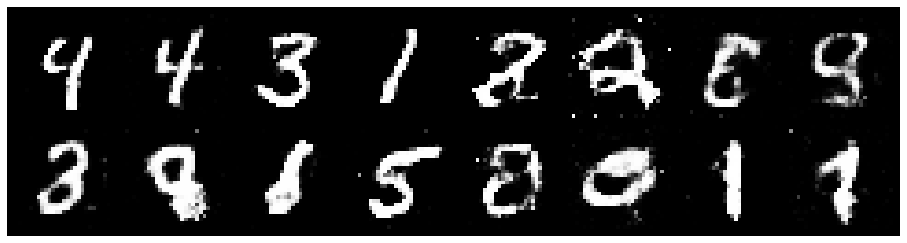

Epoch: [98/200], Batch Num: [100/600]
Discriminator Loss: 1.1882, Generator Loss: 1.0172
D(x): 0.5601, D(G(z)): 0.4067


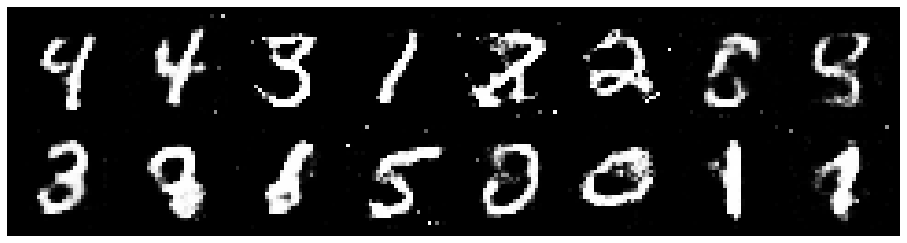

Epoch: [98/200], Batch Num: [200/600]
Discriminator Loss: 1.2619, Generator Loss: 0.9832
D(x): 0.5282, D(G(z)): 0.4081


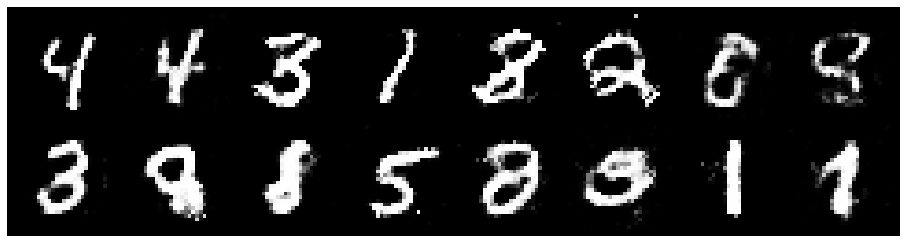

Epoch: [98/200], Batch Num: [300/600]
Discriminator Loss: 1.2620, Generator Loss: 0.7951
D(x): 0.5475, D(G(z)): 0.4550


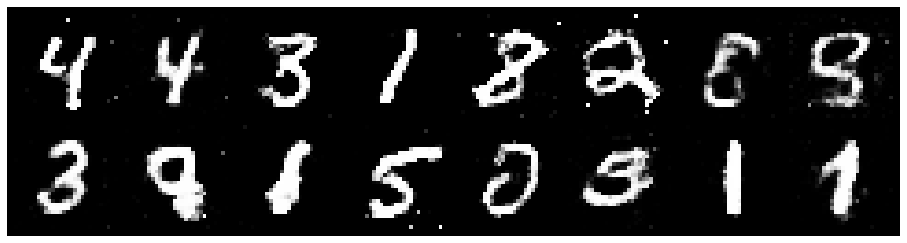

Epoch: [98/200], Batch Num: [400/600]
Discriminator Loss: 1.3464, Generator Loss: 0.8368
D(x): 0.5767, D(G(z)): 0.4865


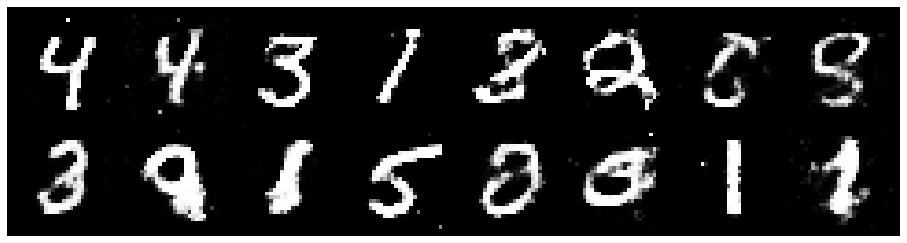

Epoch: [98/200], Batch Num: [500/600]
Discriminator Loss: 1.3281, Generator Loss: 0.7774
D(x): 0.6019, D(G(z)): 0.4815


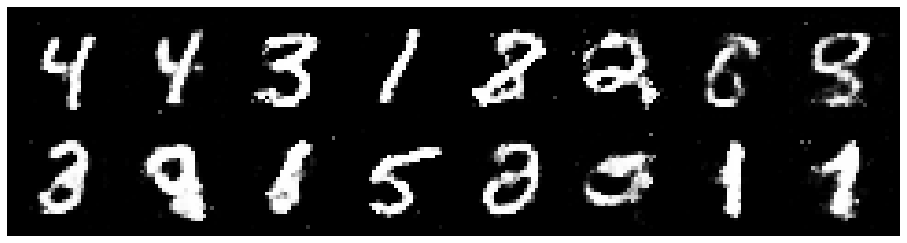

Epoch: [99/200], Batch Num: [0/600]
Discriminator Loss: 1.3156, Generator Loss: 0.7623
D(x): 0.5767, D(G(z)): 0.4829


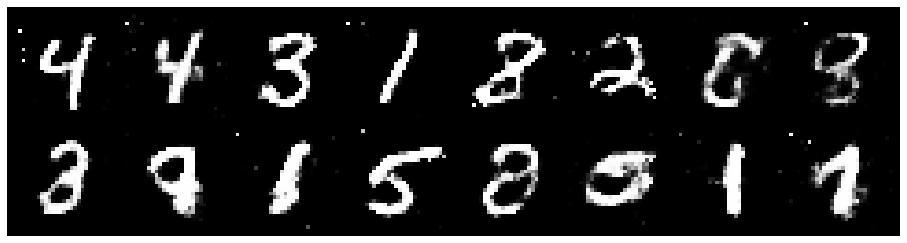

Epoch: [99/200], Batch Num: [100/600]
Discriminator Loss: 1.1841, Generator Loss: 0.8787
D(x): 0.5955, D(G(z)): 0.4168


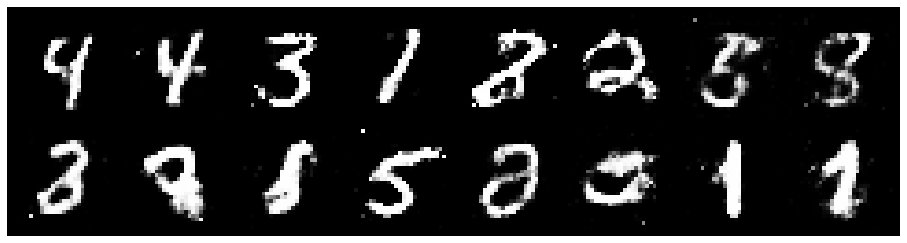

Epoch: [99/200], Batch Num: [200/600]
Discriminator Loss: 1.2410, Generator Loss: 0.8853
D(x): 0.5494, D(G(z)): 0.4138


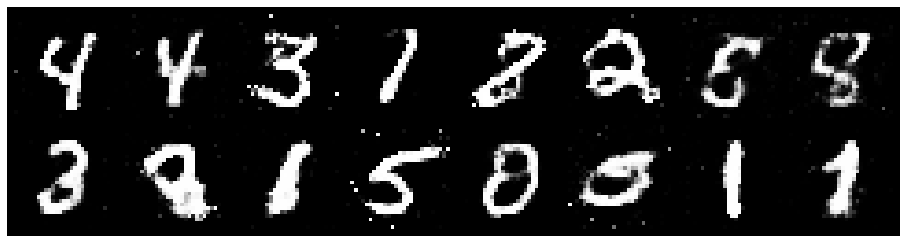

Epoch: [99/200], Batch Num: [300/600]
Discriminator Loss: 1.3980, Generator Loss: 0.8847
D(x): 0.5057, D(G(z)): 0.4509


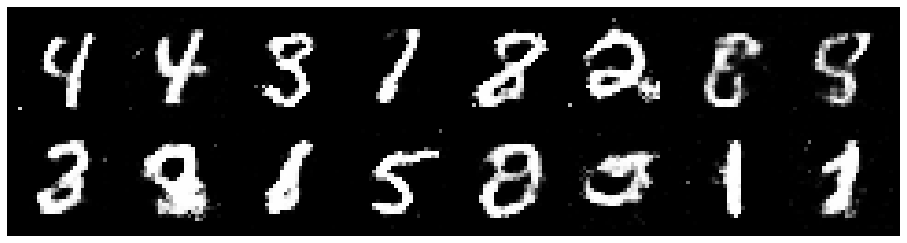

Epoch: [99/200], Batch Num: [400/600]
Discriminator Loss: 1.2947, Generator Loss: 0.9210
D(x): 0.5109, D(G(z)): 0.4036


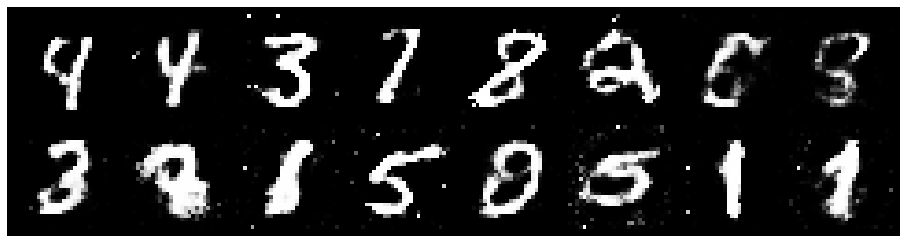

Epoch: [99/200], Batch Num: [500/600]
Discriminator Loss: 1.2822, Generator Loss: 0.7938
D(x): 0.5997, D(G(z)): 0.4814


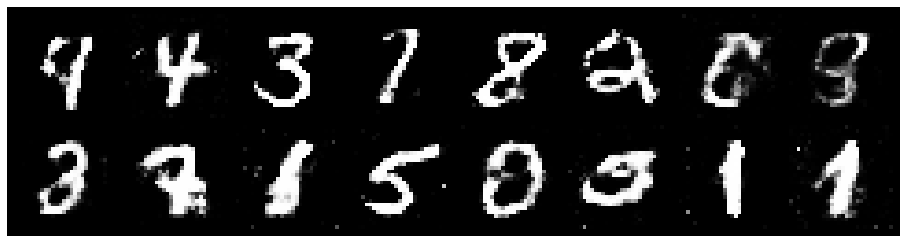

Epoch: [100/200], Batch Num: [0/600]
Discriminator Loss: 1.3527, Generator Loss: 0.7670
D(x): 0.5677, D(G(z)): 0.4815


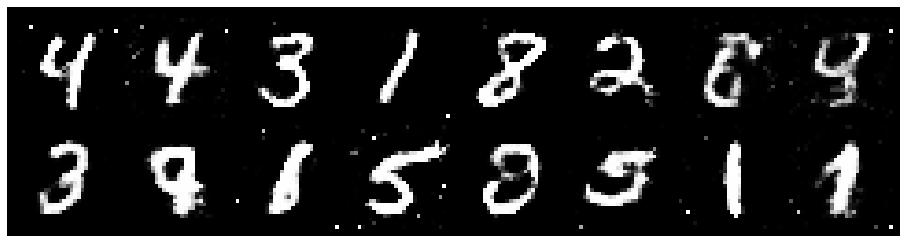

Epoch: [100/200], Batch Num: [100/600]
Discriminator Loss: 1.3677, Generator Loss: 0.8374
D(x): 0.5531, D(G(z)): 0.4824


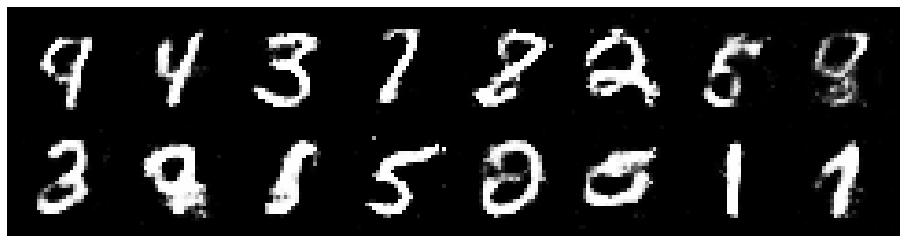

Epoch: [100/200], Batch Num: [200/600]
Discriminator Loss: 1.2961, Generator Loss: 0.9474
D(x): 0.5496, D(G(z)): 0.4118


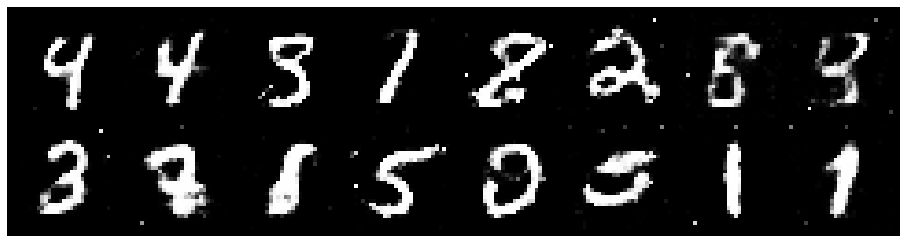

Epoch: [100/200], Batch Num: [300/600]
Discriminator Loss: 1.2884, Generator Loss: 0.9879
D(x): 0.6364, D(G(z)): 0.4837


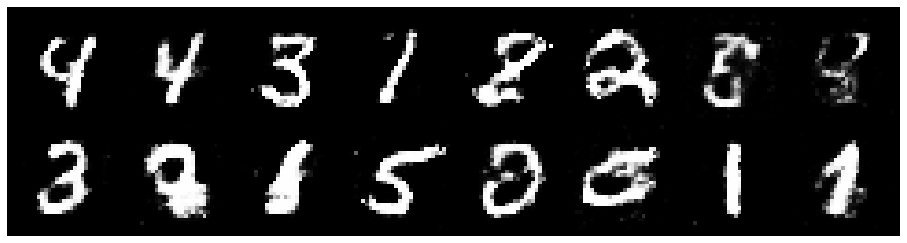

Epoch: [100/200], Batch Num: [400/600]
Discriminator Loss: 1.1658, Generator Loss: 1.0127
D(x): 0.5828, D(G(z)): 0.4129


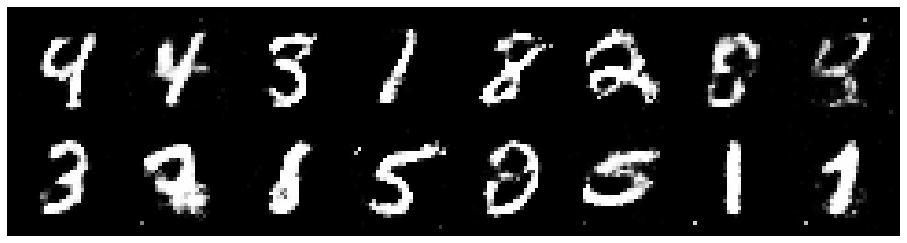

Epoch: [100/200], Batch Num: [500/600]
Discriminator Loss: 1.1395, Generator Loss: 0.8740
D(x): 0.5909, D(G(z)): 0.4187


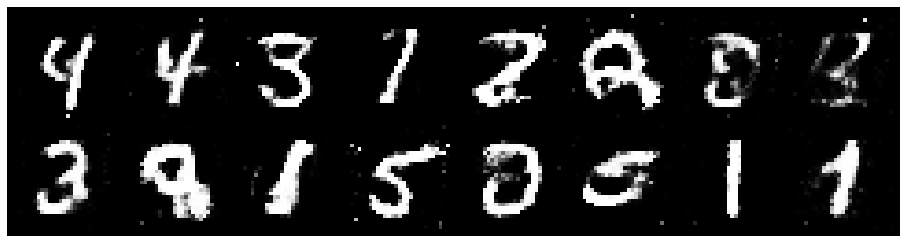

Epoch: [101/200], Batch Num: [0/600]
Discriminator Loss: 1.1091, Generator Loss: 0.9989
D(x): 0.5764, D(G(z)): 0.3699


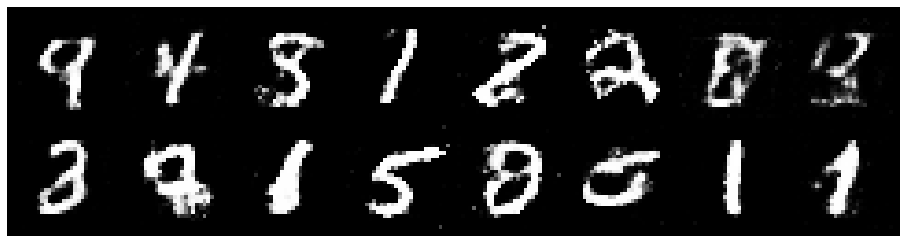

Epoch: [101/200], Batch Num: [100/600]
Discriminator Loss: 1.2209, Generator Loss: 0.9454
D(x): 0.5561, D(G(z)): 0.4146


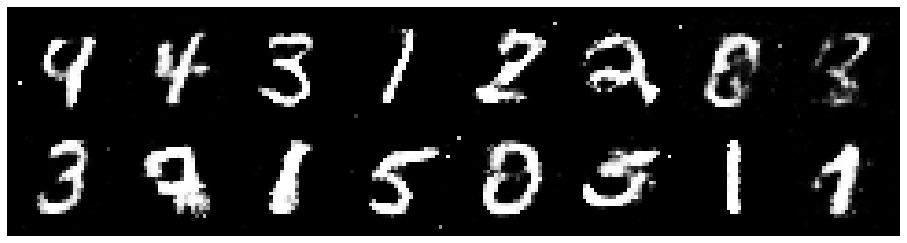

Epoch: [101/200], Batch Num: [200/600]
Discriminator Loss: 1.2023, Generator Loss: 0.8733
D(x): 0.5616, D(G(z)): 0.4308


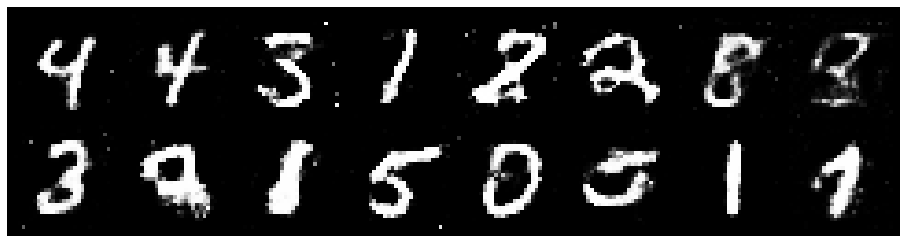

Epoch: [101/200], Batch Num: [300/600]
Discriminator Loss: 1.2723, Generator Loss: 0.8754
D(x): 0.5451, D(G(z)): 0.4380


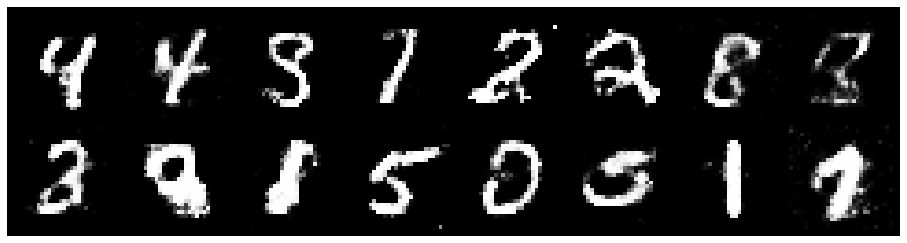

Epoch: [101/200], Batch Num: [400/600]
Discriminator Loss: 1.2508, Generator Loss: 0.9026
D(x): 0.5733, D(G(z)): 0.4589


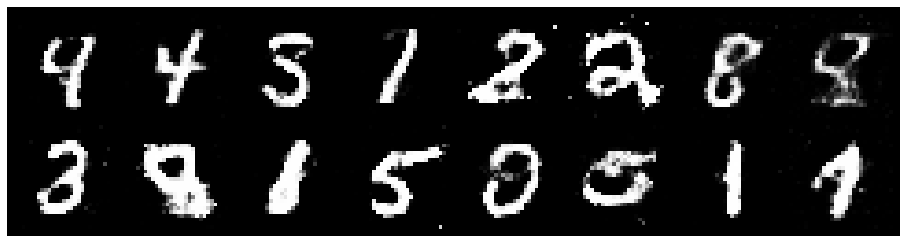

Epoch: [101/200], Batch Num: [500/600]
Discriminator Loss: 1.2393, Generator Loss: 0.8852
D(x): 0.5785, D(G(z)): 0.4661


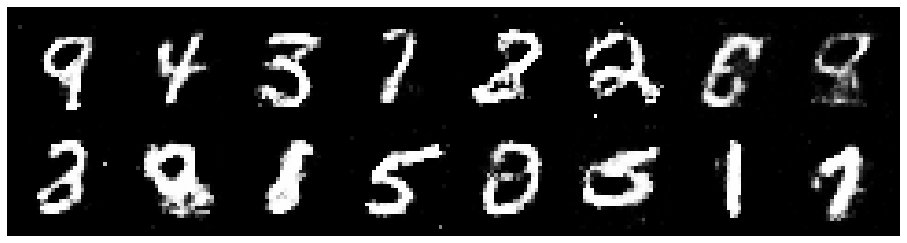

Epoch: [102/200], Batch Num: [0/600]
Discriminator Loss: 1.3218, Generator Loss: 0.9005
D(x): 0.5735, D(G(z)): 0.4806


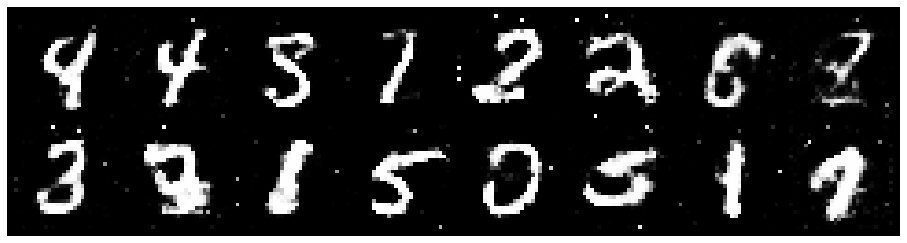

Epoch: [102/200], Batch Num: [100/600]
Discriminator Loss: 1.3232, Generator Loss: 0.8619
D(x): 0.5026, D(G(z)): 0.4153


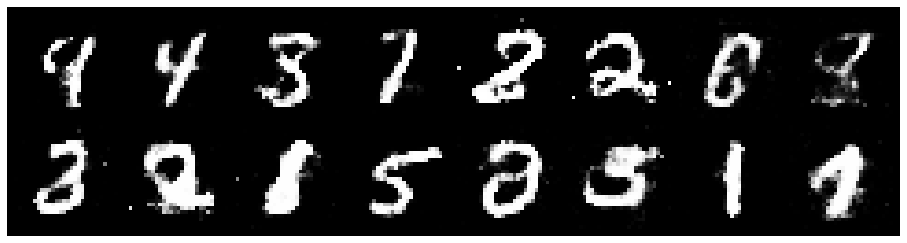

Epoch: [102/200], Batch Num: [200/600]
Discriminator Loss: 1.2257, Generator Loss: 1.0031
D(x): 0.5486, D(G(z)): 0.4227


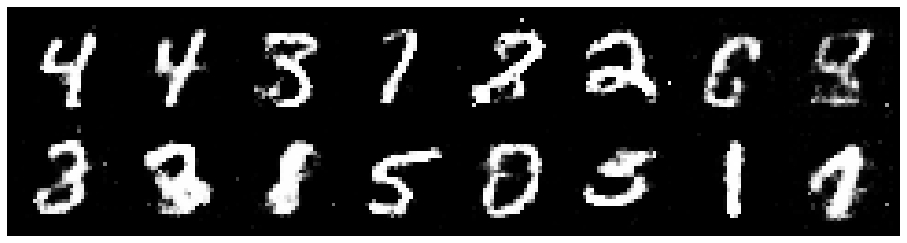

Epoch: [102/200], Batch Num: [300/600]
Discriminator Loss: 1.1705, Generator Loss: 0.8765
D(x): 0.5676, D(G(z)): 0.4176


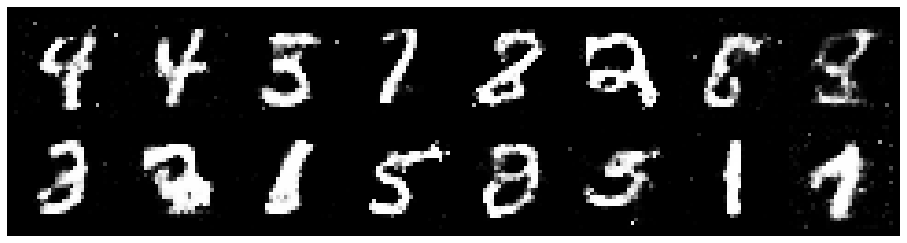

Epoch: [102/200], Batch Num: [400/600]
Discriminator Loss: 1.1659, Generator Loss: 0.9623
D(x): 0.5949, D(G(z)): 0.4324


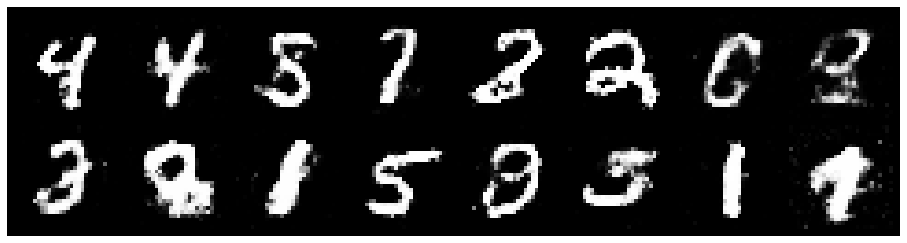

Epoch: [102/200], Batch Num: [500/600]
Discriminator Loss: 1.2023, Generator Loss: 0.8963
D(x): 0.5761, D(G(z)): 0.4435


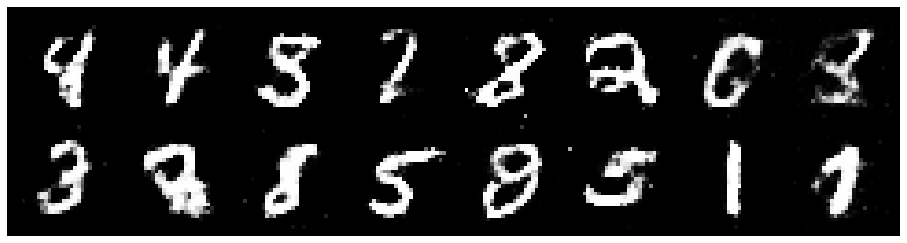

Epoch: [103/200], Batch Num: [0/600]
Discriminator Loss: 1.3880, Generator Loss: 0.9478
D(x): 0.5535, D(G(z)): 0.4812


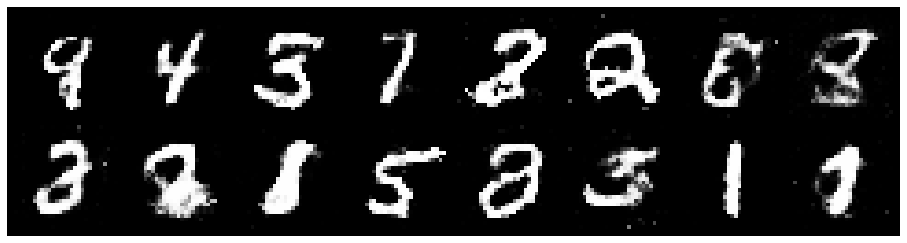

Epoch: [103/200], Batch Num: [100/600]
Discriminator Loss: 1.3678, Generator Loss: 0.9215
D(x): 0.5459, D(G(z)): 0.4628


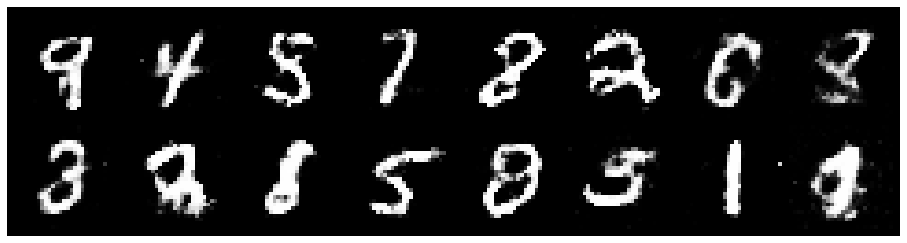

Epoch: [103/200], Batch Num: [200/600]
Discriminator Loss: 1.2911, Generator Loss: 0.8278
D(x): 0.5746, D(G(z)): 0.4319


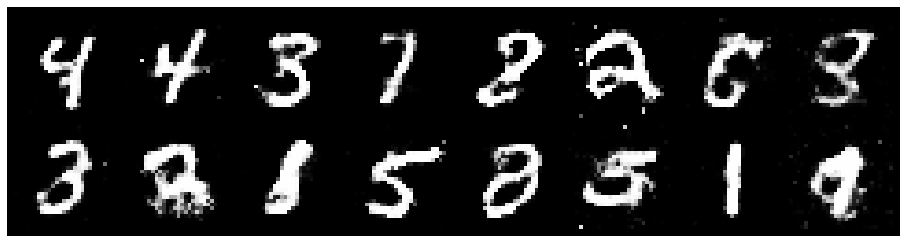

Epoch: [103/200], Batch Num: [300/600]
Discriminator Loss: 1.2835, Generator Loss: 0.9930
D(x): 0.5321, D(G(z)): 0.4135


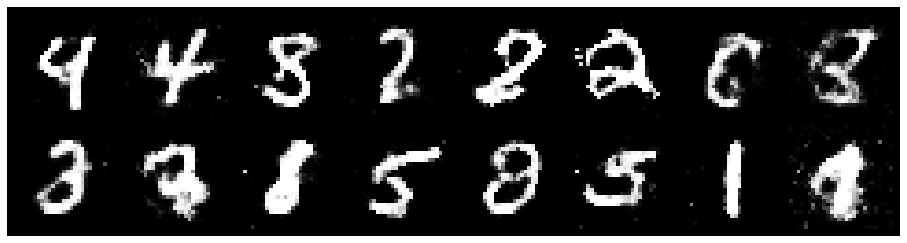

Epoch: [103/200], Batch Num: [400/600]
Discriminator Loss: 1.3700, Generator Loss: 0.8778
D(x): 0.5473, D(G(z)): 0.4809


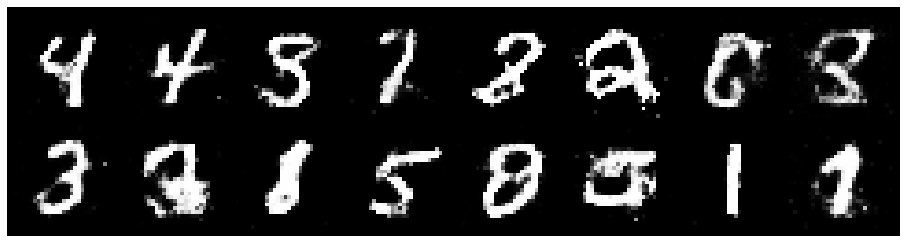

Epoch: [103/200], Batch Num: [500/600]
Discriminator Loss: 1.1617, Generator Loss: 1.0266
D(x): 0.5700, D(G(z)): 0.4000


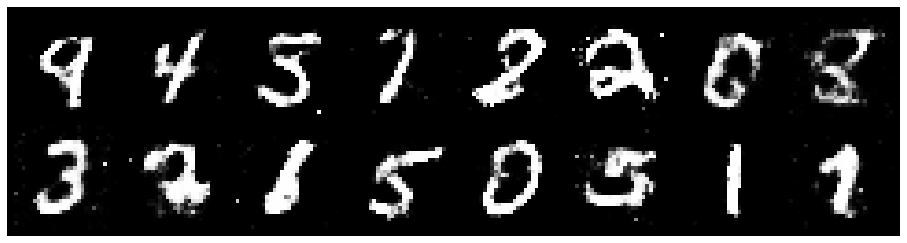

Epoch: [104/200], Batch Num: [0/600]
Discriminator Loss: 1.1874, Generator Loss: 0.9527
D(x): 0.5550, D(G(z)): 0.4029


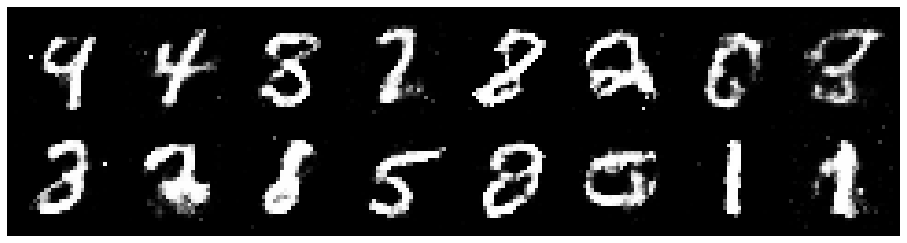

Epoch: [104/200], Batch Num: [100/600]
Discriminator Loss: 1.1048, Generator Loss: 0.9453
D(x): 0.5933, D(G(z)): 0.3853


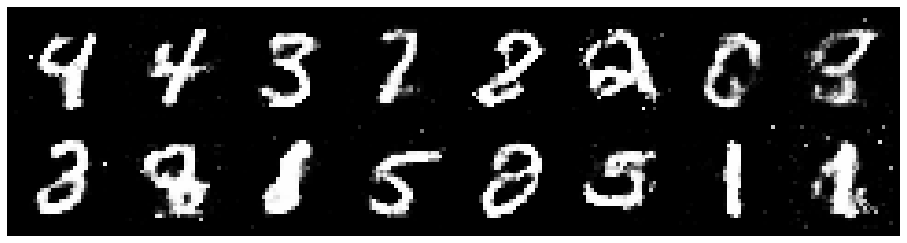

Epoch: [104/200], Batch Num: [200/600]
Discriminator Loss: 1.2052, Generator Loss: 0.9262
D(x): 0.5470, D(G(z)): 0.4004


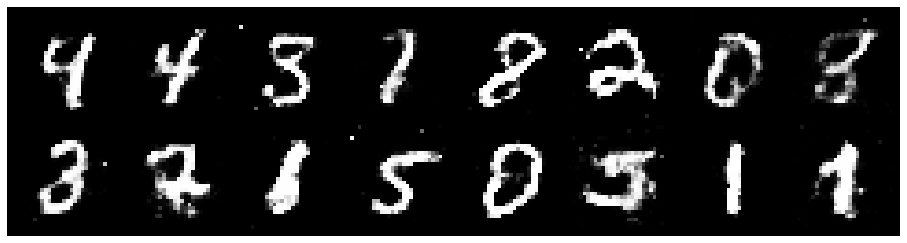

Epoch: [104/200], Batch Num: [300/600]
Discriminator Loss: 1.1503, Generator Loss: 0.9543
D(x): 0.6105, D(G(z)): 0.4262


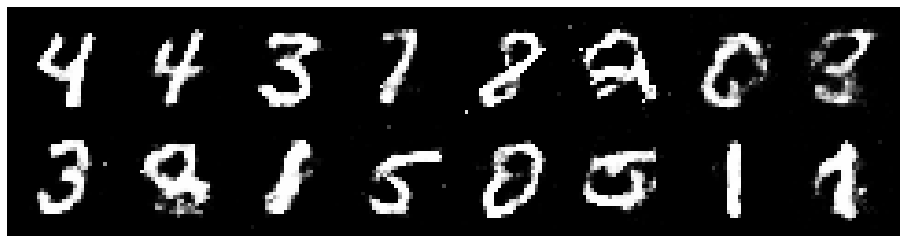

Epoch: [104/200], Batch Num: [400/600]
Discriminator Loss: 1.1795, Generator Loss: 0.9587
D(x): 0.5577, D(G(z)): 0.4137


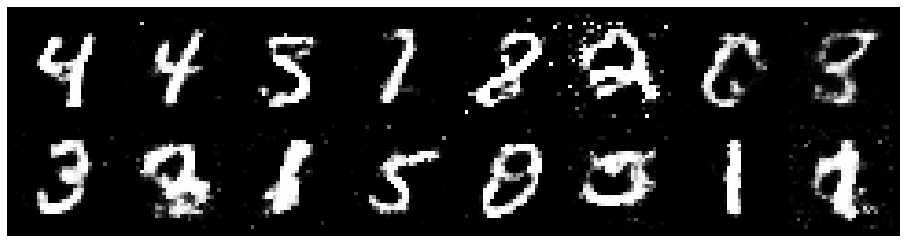

Epoch: [104/200], Batch Num: [500/600]
Discriminator Loss: 1.1653, Generator Loss: 1.0506
D(x): 0.6017, D(G(z)): 0.3828


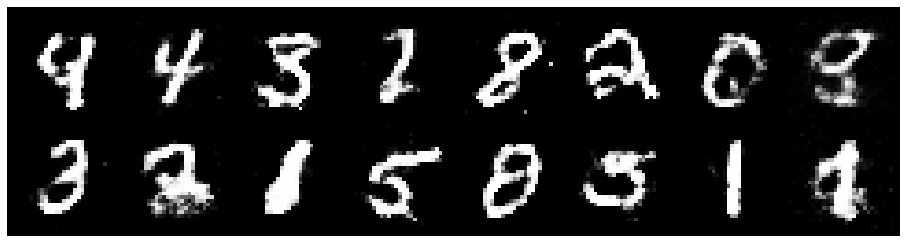

Epoch: [105/200], Batch Num: [0/600]
Discriminator Loss: 1.2299, Generator Loss: 0.9466
D(x): 0.5836, D(G(z)): 0.4512


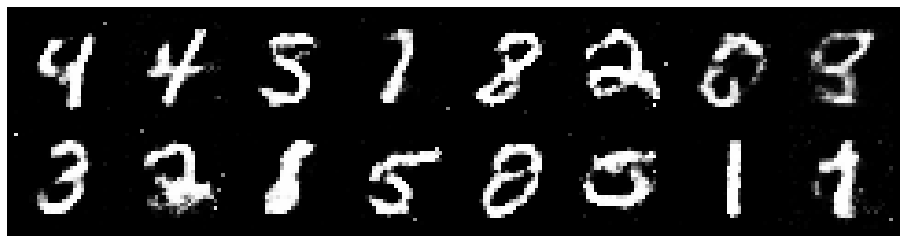

Epoch: [105/200], Batch Num: [100/600]
Discriminator Loss: 1.2099, Generator Loss: 0.9988
D(x): 0.5992, D(G(z)): 0.4266


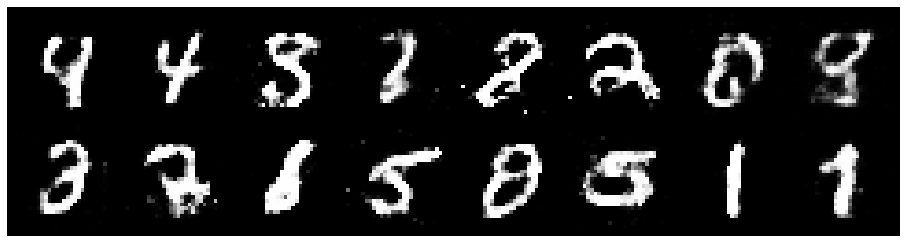

Epoch: [105/200], Batch Num: [200/600]
Discriminator Loss: 1.2794, Generator Loss: 0.8953
D(x): 0.5493, D(G(z)): 0.4466


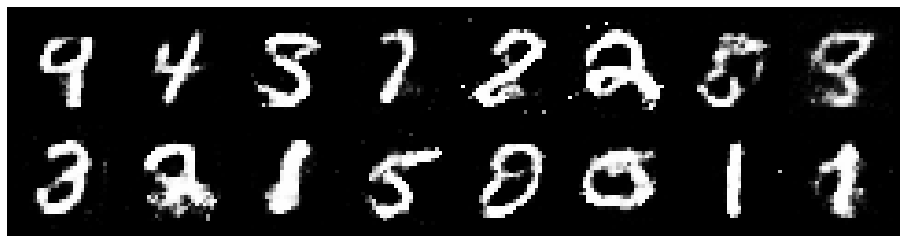

Epoch: [105/200], Batch Num: [300/600]
Discriminator Loss: 1.1594, Generator Loss: 0.9968
D(x): 0.6081, D(G(z)): 0.4148


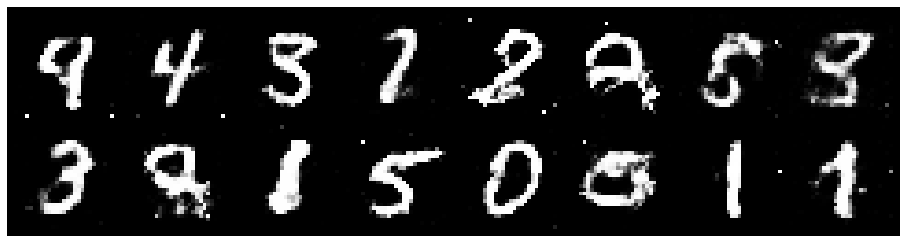

Epoch: [105/200], Batch Num: [400/600]
Discriminator Loss: 1.1955, Generator Loss: 1.0345
D(x): 0.5580, D(G(z)): 0.3867


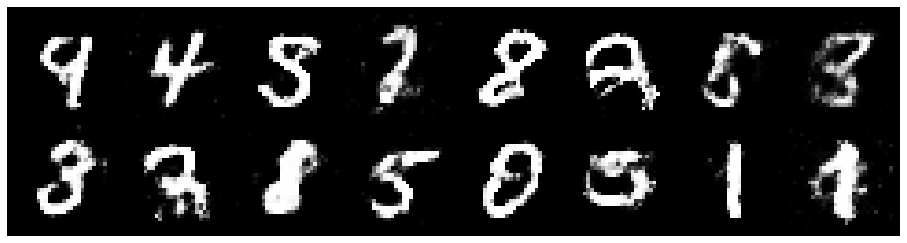

Epoch: [105/200], Batch Num: [500/600]
Discriminator Loss: 1.0912, Generator Loss: 1.1251
D(x): 0.5719, D(G(z)): 0.3498


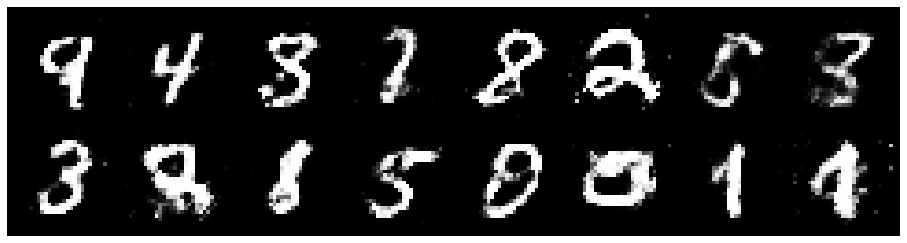

Epoch: [106/200], Batch Num: [0/600]
Discriminator Loss: 1.1885, Generator Loss: 0.9554
D(x): 0.5674, D(G(z)): 0.4202


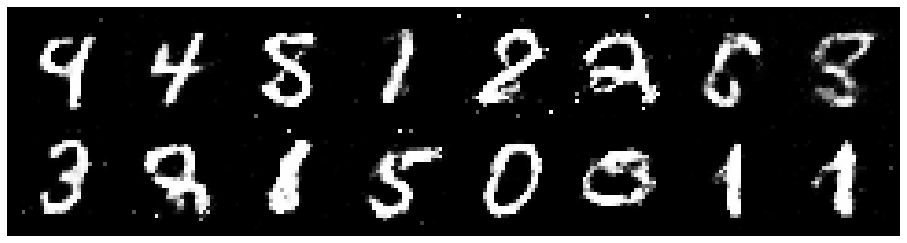

Epoch: [106/200], Batch Num: [100/600]
Discriminator Loss: 1.2185, Generator Loss: 0.8893
D(x): 0.5654, D(G(z)): 0.4345


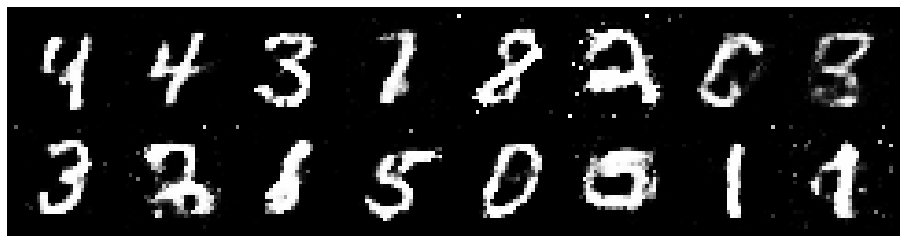

Epoch: [106/200], Batch Num: [200/600]
Discriminator Loss: 1.1655, Generator Loss: 0.9726
D(x): 0.6286, D(G(z)): 0.4424


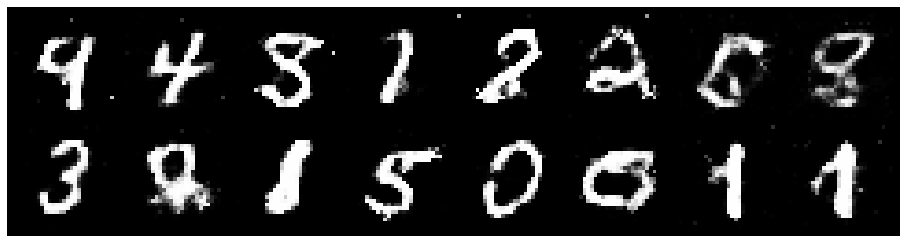

Epoch: [106/200], Batch Num: [300/600]
Discriminator Loss: 1.2210, Generator Loss: 0.9315
D(x): 0.5617, D(G(z)): 0.4091


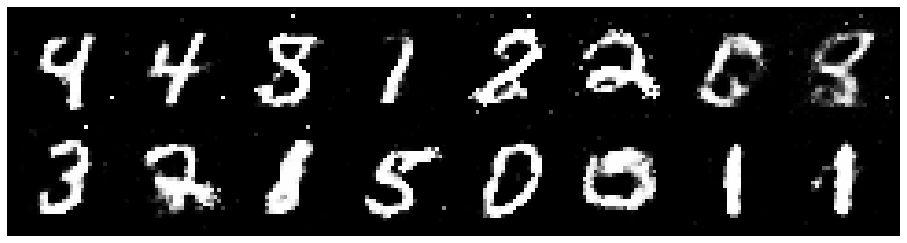

Epoch: [106/200], Batch Num: [400/600]
Discriminator Loss: 1.1702, Generator Loss: 0.9631
D(x): 0.5595, D(G(z)): 0.3982


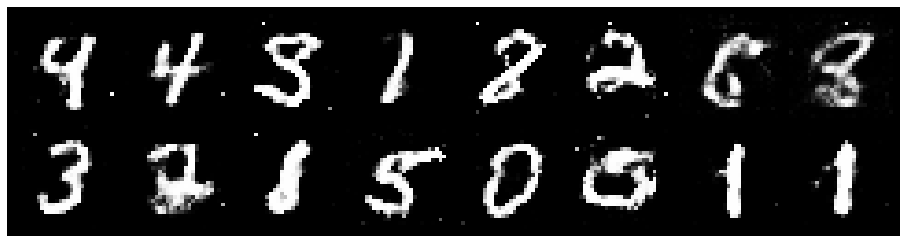

Epoch: [106/200], Batch Num: [500/600]
Discriminator Loss: 1.2473, Generator Loss: 0.9065
D(x): 0.5570, D(G(z)): 0.4452


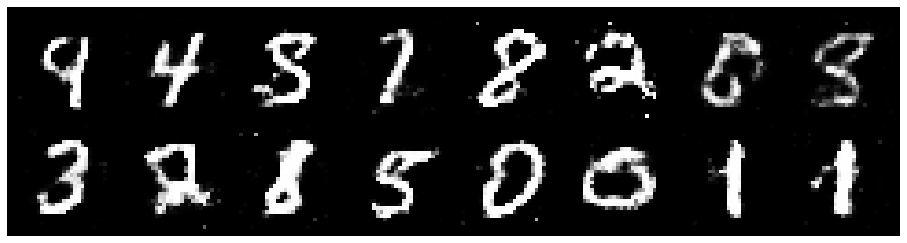

Epoch: [107/200], Batch Num: [0/600]
Discriminator Loss: 1.1965, Generator Loss: 1.0154
D(x): 0.5719, D(G(z)): 0.4012


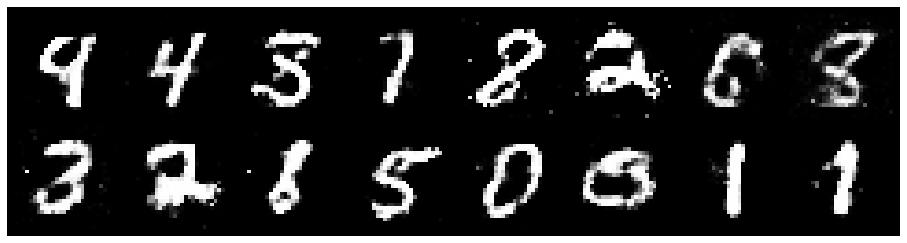

Epoch: [107/200], Batch Num: [100/600]
Discriminator Loss: 1.2008, Generator Loss: 1.0574
D(x): 0.5707, D(G(z)): 0.4011


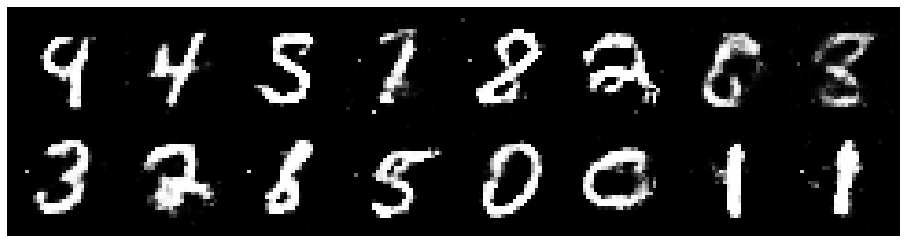

Epoch: [107/200], Batch Num: [200/600]
Discriminator Loss: 1.2031, Generator Loss: 1.0208
D(x): 0.5998, D(G(z)): 0.4290


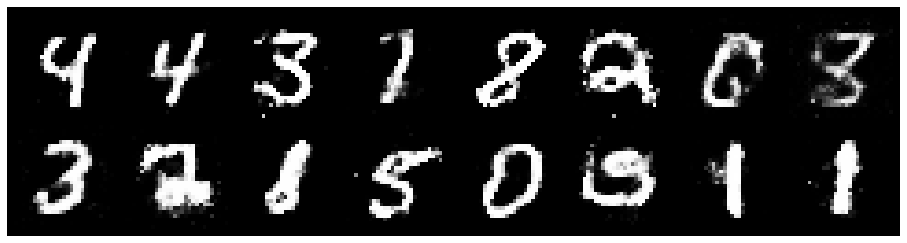

Epoch: [107/200], Batch Num: [300/600]
Discriminator Loss: 1.1852, Generator Loss: 1.0987
D(x): 0.5765, D(G(z)): 0.4143


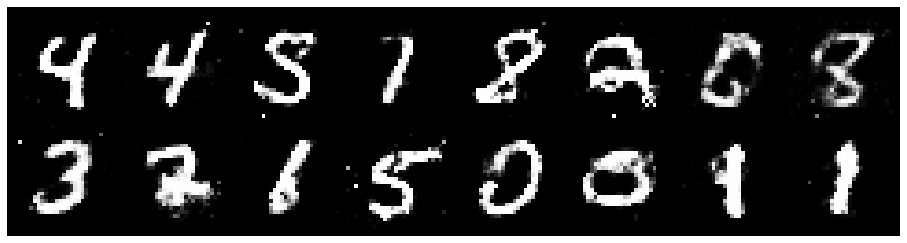

Epoch: [107/200], Batch Num: [400/600]
Discriminator Loss: 1.0843, Generator Loss: 1.0454
D(x): 0.5923, D(G(z)): 0.3555


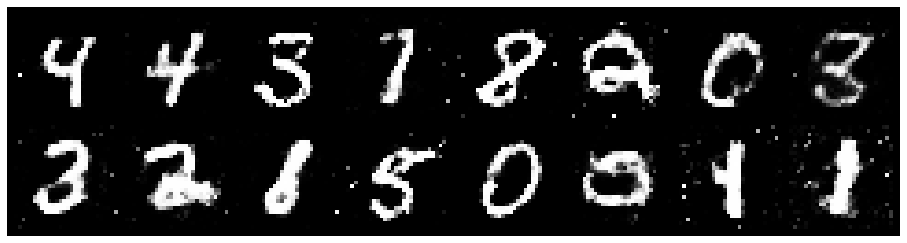

Epoch: [107/200], Batch Num: [500/600]
Discriminator Loss: 1.2288, Generator Loss: 0.8727
D(x): 0.5569, D(G(z)): 0.4195


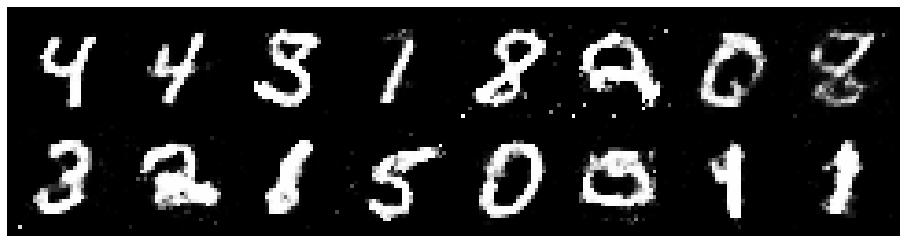

Epoch: [108/200], Batch Num: [0/600]
Discriminator Loss: 1.3005, Generator Loss: 0.7109
D(x): 0.6231, D(G(z)): 0.5205


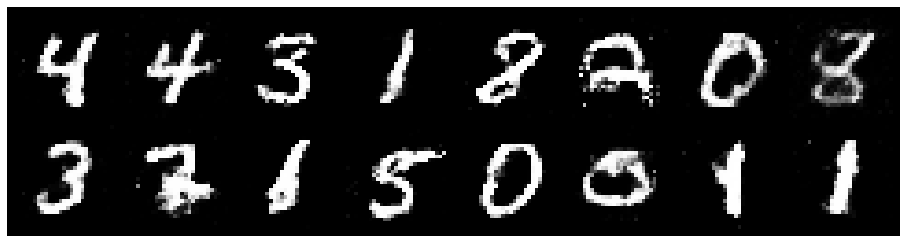

Epoch: [108/200], Batch Num: [100/600]
Discriminator Loss: 1.2862, Generator Loss: 0.9003
D(x): 0.5525, D(G(z)): 0.4464


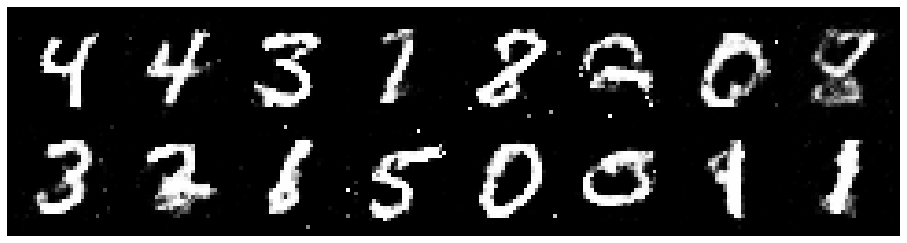

Epoch: [108/200], Batch Num: [200/600]
Discriminator Loss: 1.3406, Generator Loss: 0.8746
D(x): 0.5294, D(G(z)): 0.4518


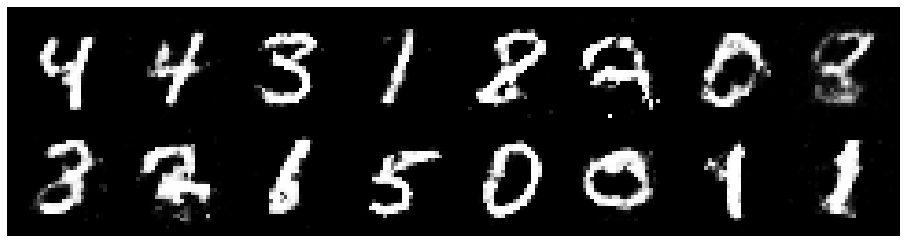

Epoch: [108/200], Batch Num: [300/600]
Discriminator Loss: 1.1840, Generator Loss: 0.8302
D(x): 0.5918, D(G(z)): 0.4342


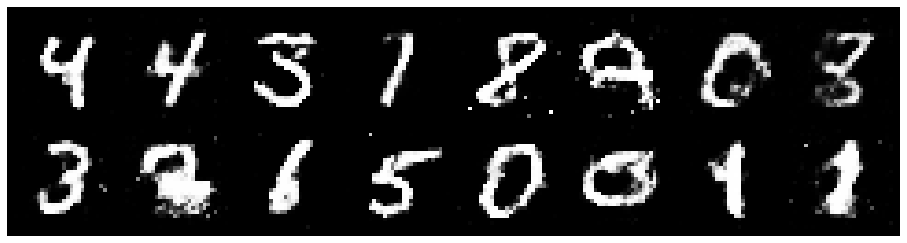

Epoch: [108/200], Batch Num: [400/600]
Discriminator Loss: 1.2426, Generator Loss: 0.8220
D(x): 0.5728, D(G(z)): 0.4451


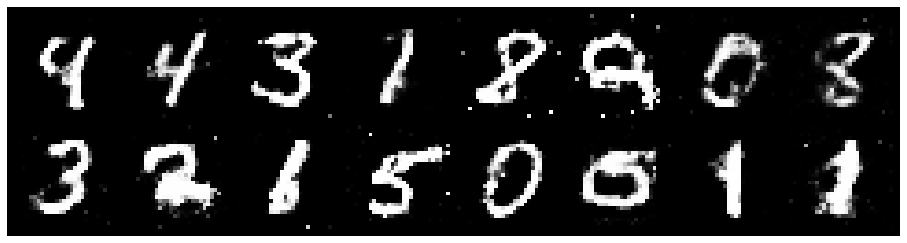

Epoch: [108/200], Batch Num: [500/600]
Discriminator Loss: 1.3636, Generator Loss: 0.8228
D(x): 0.5563, D(G(z)): 0.4861


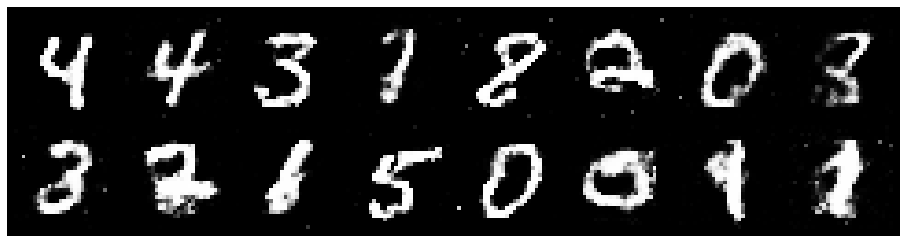

Epoch: [109/200], Batch Num: [0/600]
Discriminator Loss: 1.2594, Generator Loss: 0.8944
D(x): 0.5606, D(G(z)): 0.4239


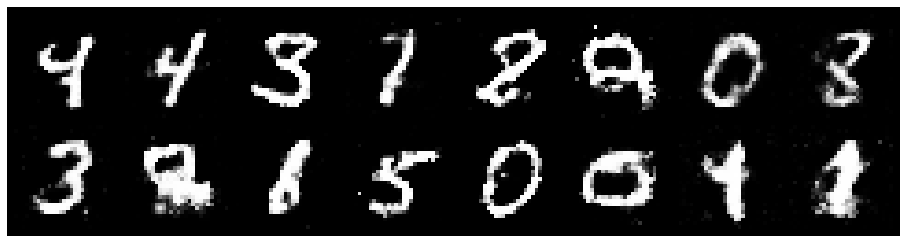

Epoch: [109/200], Batch Num: [100/600]
Discriminator Loss: 1.2613, Generator Loss: 0.7685
D(x): 0.5649, D(G(z)): 0.4571


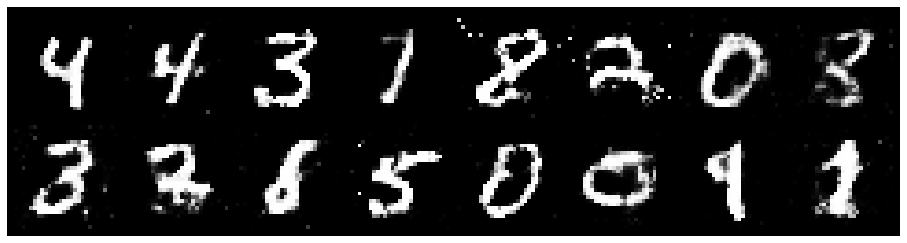

Epoch: [109/200], Batch Num: [200/600]
Discriminator Loss: 1.4400, Generator Loss: 0.7294
D(x): 0.5427, D(G(z)): 0.4732


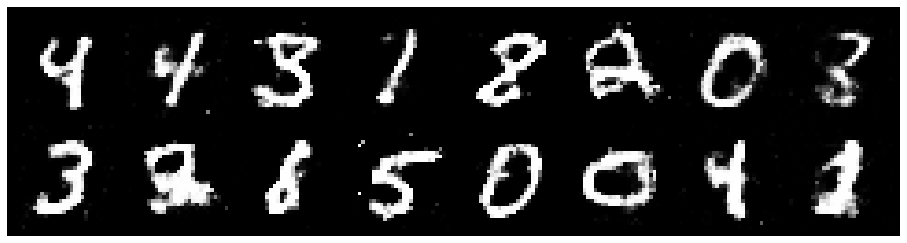

Epoch: [109/200], Batch Num: [300/600]
Discriminator Loss: 1.2358, Generator Loss: 0.9865
D(x): 0.5647, D(G(z)): 0.4119


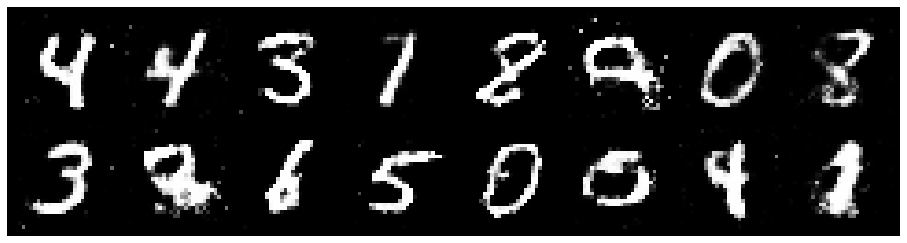

Epoch: [109/200], Batch Num: [400/600]
Discriminator Loss: 1.1833, Generator Loss: 1.1940
D(x): 0.5831, D(G(z)): 0.3965


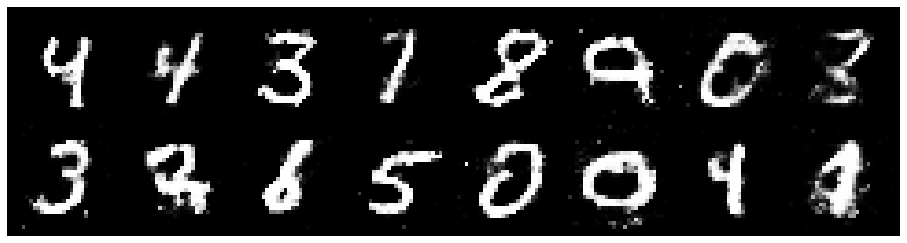

Epoch: [109/200], Batch Num: [500/600]
Discriminator Loss: 1.2426, Generator Loss: 0.9029
D(x): 0.5716, D(G(z)): 0.4490


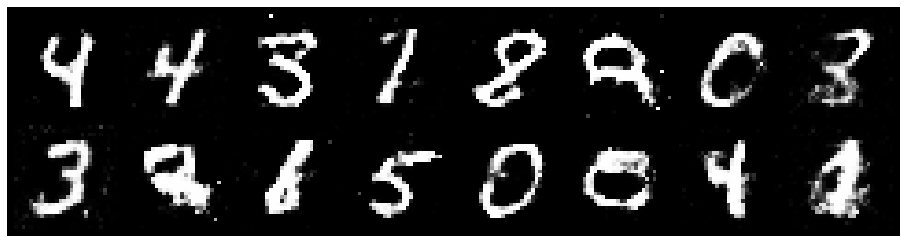

Epoch: [110/200], Batch Num: [0/600]
Discriminator Loss: 1.1996, Generator Loss: 0.9475
D(x): 0.5690, D(G(z)): 0.4232


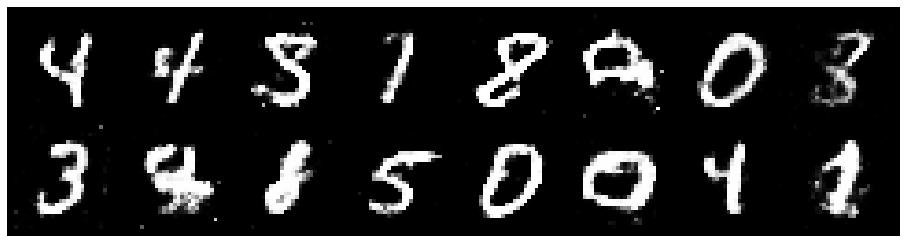

Epoch: [110/200], Batch Num: [100/600]
Discriminator Loss: 1.2669, Generator Loss: 0.9530
D(x): 0.5289, D(G(z)): 0.4274


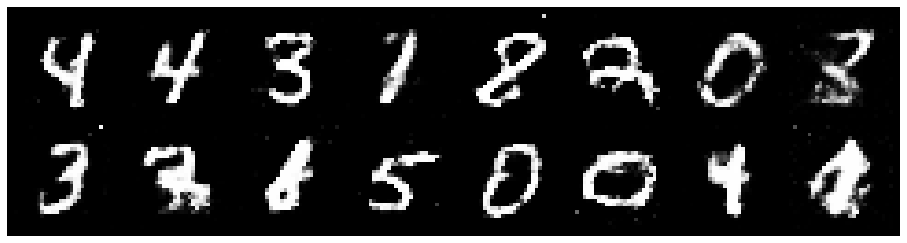

Epoch: [110/200], Batch Num: [200/600]
Discriminator Loss: 1.2601, Generator Loss: 0.8751
D(x): 0.5802, D(G(z)): 0.4668


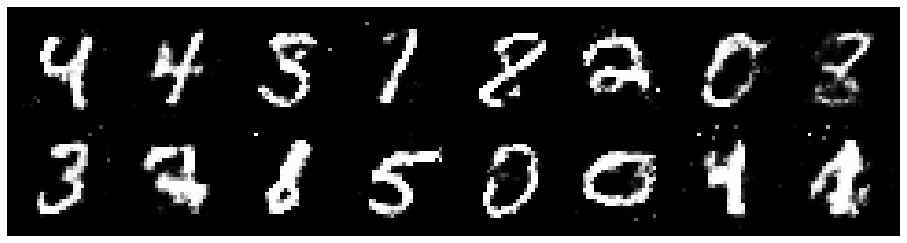

Epoch: [110/200], Batch Num: [300/600]
Discriminator Loss: 1.2172, Generator Loss: 1.0199
D(x): 0.5361, D(G(z)): 0.3969


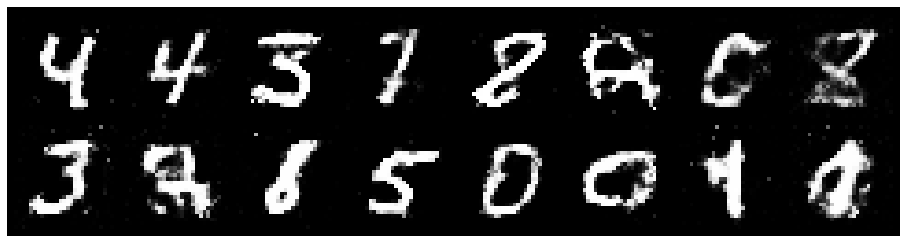

Epoch: [110/200], Batch Num: [400/600]
Discriminator Loss: 1.1845, Generator Loss: 0.8264
D(x): 0.5813, D(G(z)): 0.4334


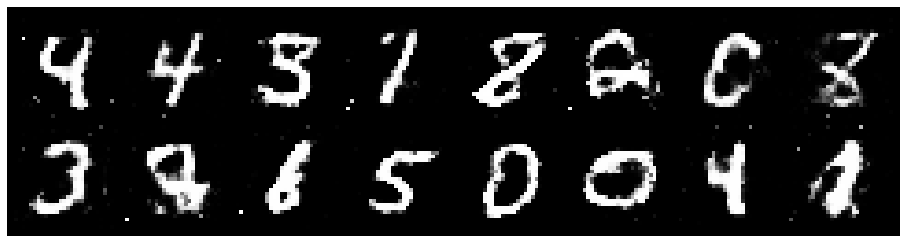

Epoch: [110/200], Batch Num: [500/600]
Discriminator Loss: 1.2560, Generator Loss: 1.0326
D(x): 0.5417, D(G(z)): 0.4183


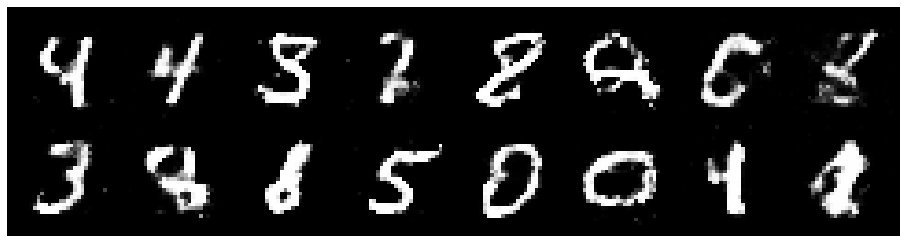

Epoch: [111/200], Batch Num: [0/600]
Discriminator Loss: 1.2510, Generator Loss: 0.9746
D(x): 0.5814, D(G(z)): 0.4379


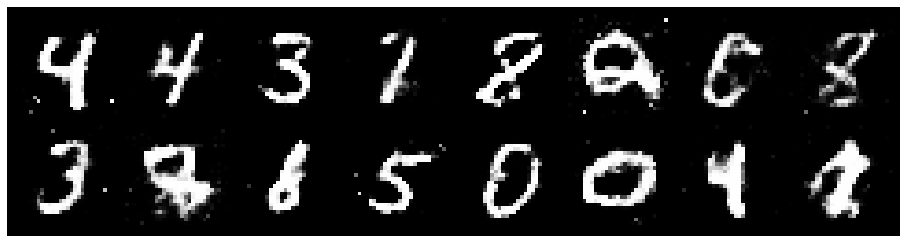

Epoch: [111/200], Batch Num: [100/600]
Discriminator Loss: 1.2330, Generator Loss: 1.0310
D(x): 0.5503, D(G(z)): 0.4105


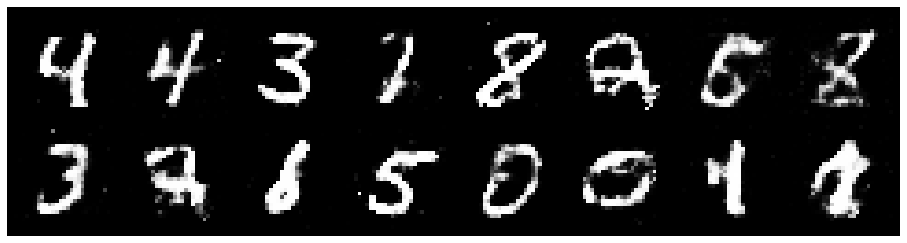

Epoch: [111/200], Batch Num: [200/600]
Discriminator Loss: 1.2238, Generator Loss: 0.9438
D(x): 0.5490, D(G(z)): 0.4135


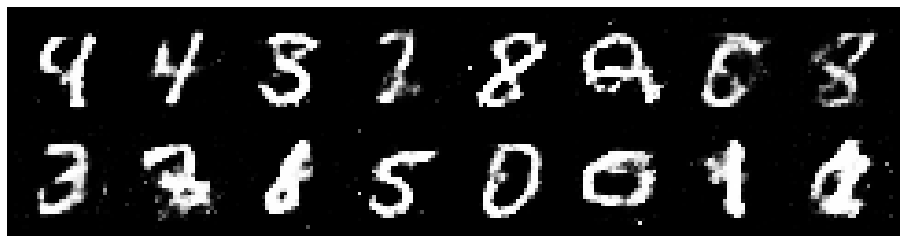

Epoch: [111/200], Batch Num: [300/600]
Discriminator Loss: 1.3476, Generator Loss: 0.9142
D(x): 0.5909, D(G(z)): 0.4822


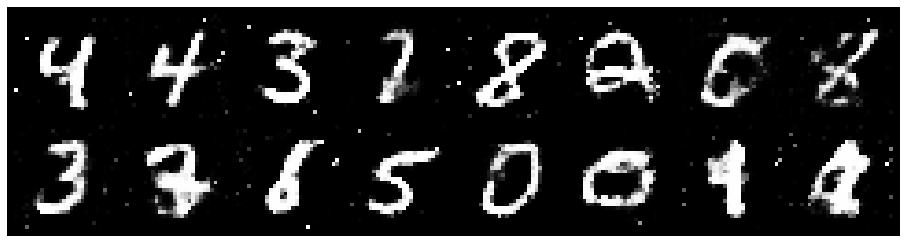

Epoch: [111/200], Batch Num: [400/600]
Discriminator Loss: 1.2204, Generator Loss: 0.8694
D(x): 0.5823, D(G(z)): 0.4485


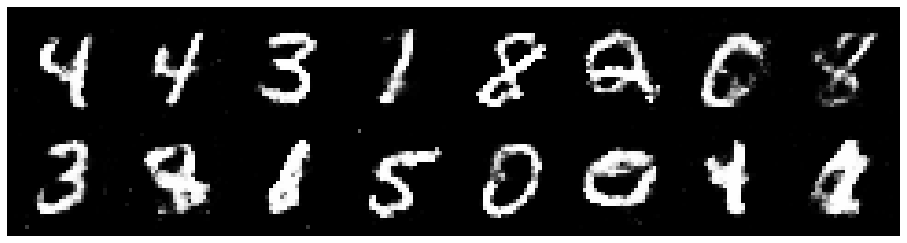

Epoch: [111/200], Batch Num: [500/600]
Discriminator Loss: 1.2496, Generator Loss: 0.8613
D(x): 0.5671, D(G(z)): 0.4500


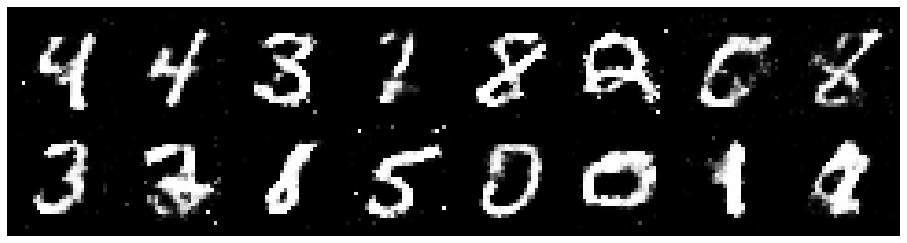

Epoch: [112/200], Batch Num: [0/600]
Discriminator Loss: 1.2565, Generator Loss: 0.8793
D(x): 0.5189, D(G(z)): 0.4245


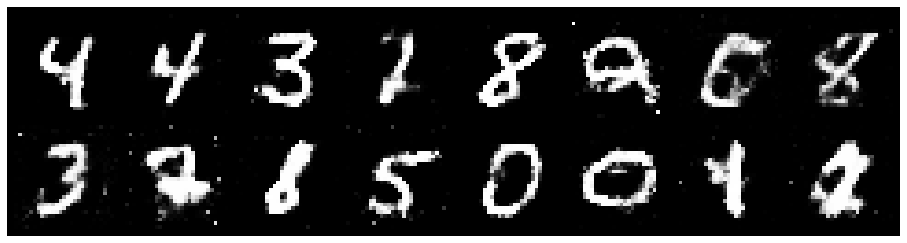

Epoch: [112/200], Batch Num: [100/600]
Discriminator Loss: 1.2716, Generator Loss: 0.9256
D(x): 0.5387, D(G(z)): 0.4284


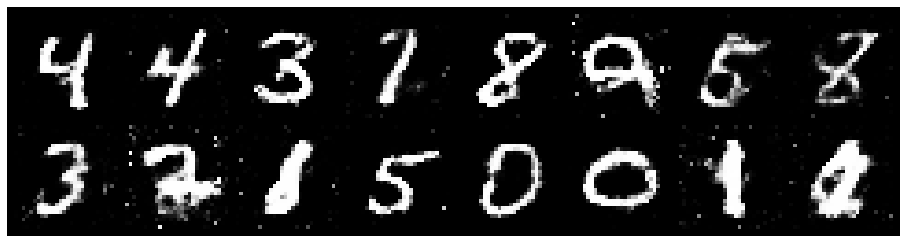

Epoch: [112/200], Batch Num: [200/600]
Discriminator Loss: 1.2252, Generator Loss: 0.9134
D(x): 0.5735, D(G(z)): 0.4370


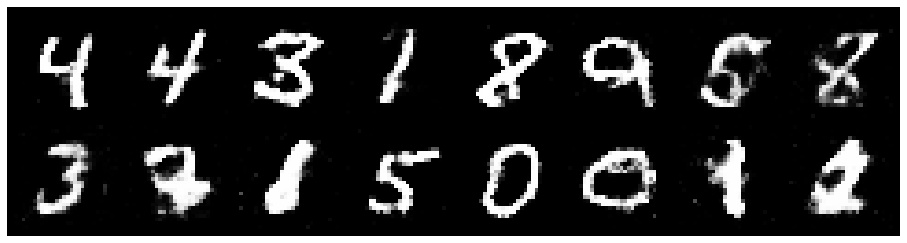

Epoch: [112/200], Batch Num: [300/600]
Discriminator Loss: 1.2035, Generator Loss: 0.9546
D(x): 0.5904, D(G(z)): 0.4312


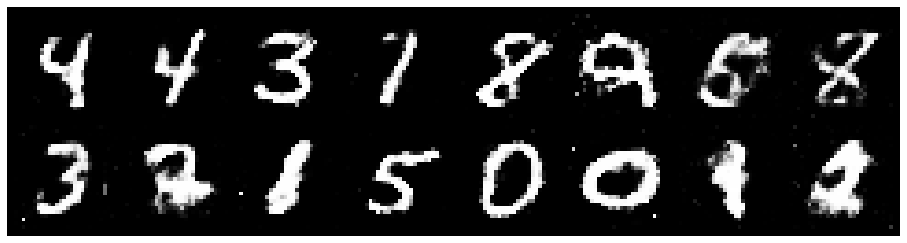

Epoch: [112/200], Batch Num: [400/600]
Discriminator Loss: 1.2286, Generator Loss: 0.8498
D(x): 0.5789, D(G(z)): 0.4460


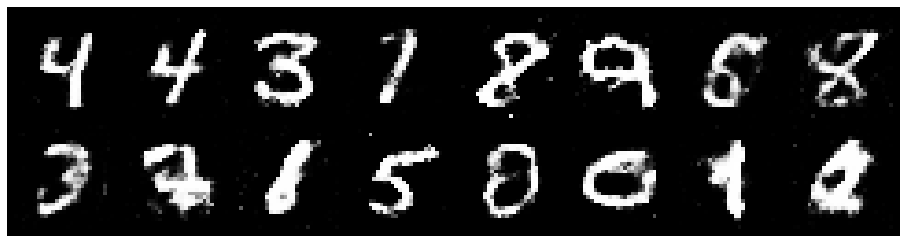

Epoch: [112/200], Batch Num: [500/600]
Discriminator Loss: 1.2225, Generator Loss: 0.8648
D(x): 0.5833, D(G(z)): 0.4430


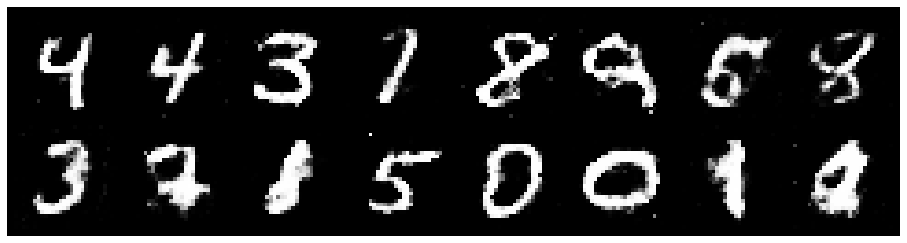

Epoch: [113/200], Batch Num: [0/600]
Discriminator Loss: 1.3258, Generator Loss: 0.7786
D(x): 0.5250, D(G(z)): 0.4584


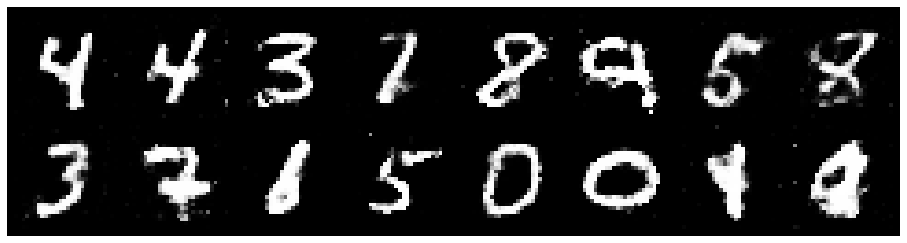

Epoch: [113/200], Batch Num: [100/600]
Discriminator Loss: 1.2764, Generator Loss: 0.8582
D(x): 0.5301, D(G(z)): 0.4307


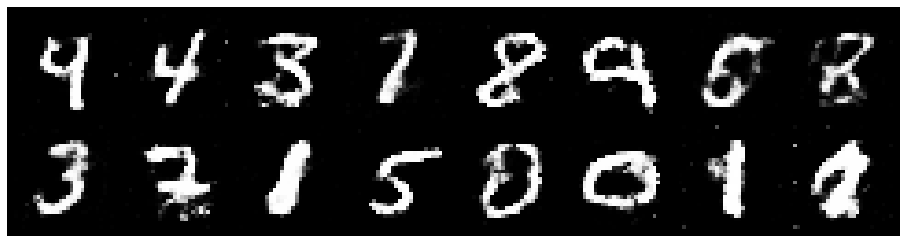

Epoch: [113/200], Batch Num: [200/600]
Discriminator Loss: 1.1938, Generator Loss: 0.8497
D(x): 0.5449, D(G(z)): 0.4159


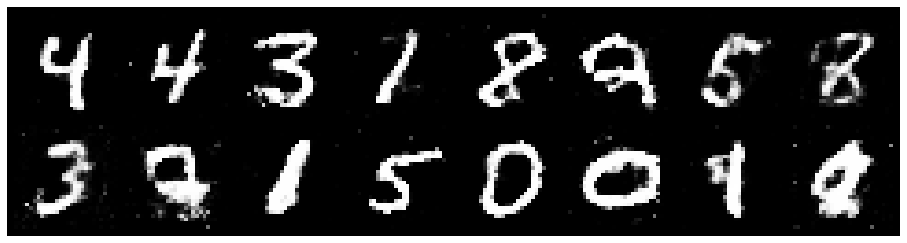

Epoch: [113/200], Batch Num: [300/600]
Discriminator Loss: 1.1602, Generator Loss: 0.9701
D(x): 0.6176, D(G(z)): 0.4227


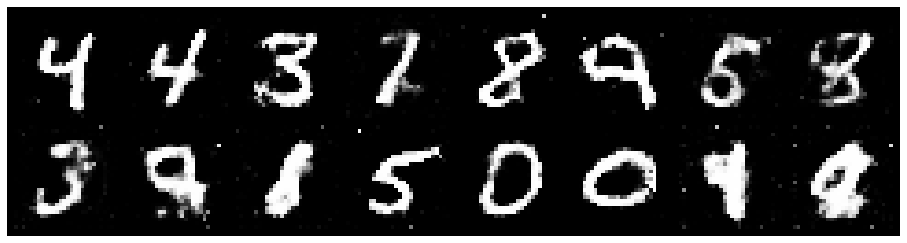

Epoch: [113/200], Batch Num: [400/600]
Discriminator Loss: 1.3620, Generator Loss: 0.8614
D(x): 0.5610, D(G(z)): 0.4798


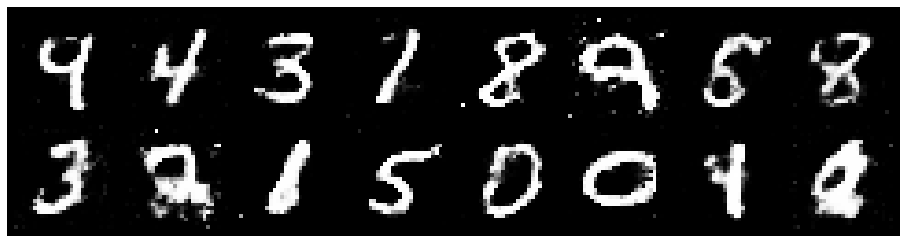

Epoch: [113/200], Batch Num: [500/600]
Discriminator Loss: 1.3742, Generator Loss: 0.8136
D(x): 0.5462, D(G(z)): 0.4441


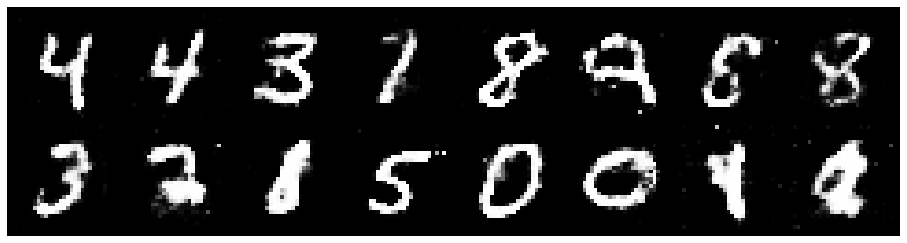

Epoch: [114/200], Batch Num: [0/600]
Discriminator Loss: 1.3769, Generator Loss: 0.9003
D(x): 0.5196, D(G(z)): 0.4548


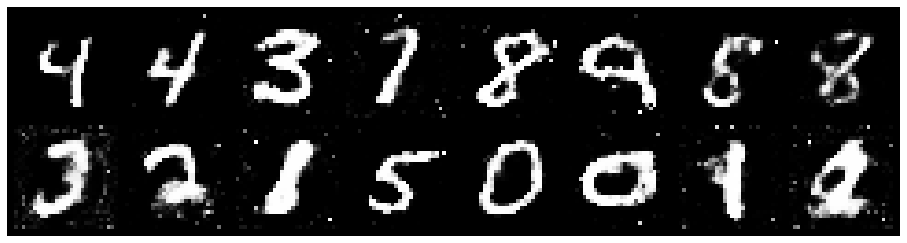

Epoch: [114/200], Batch Num: [100/600]
Discriminator Loss: 1.4354, Generator Loss: 0.8589
D(x): 0.4764, D(G(z)): 0.4490


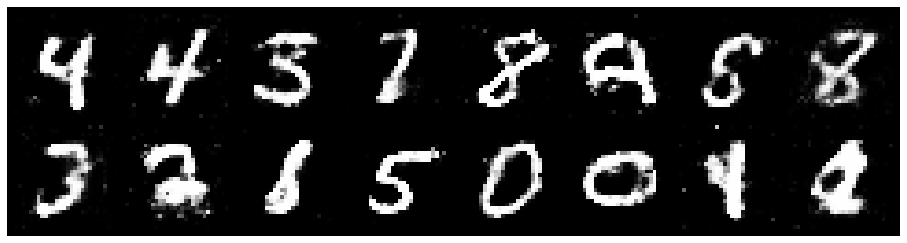

Epoch: [114/200], Batch Num: [200/600]
Discriminator Loss: 1.3304, Generator Loss: 0.9527
D(x): 0.5294, D(G(z)): 0.4420


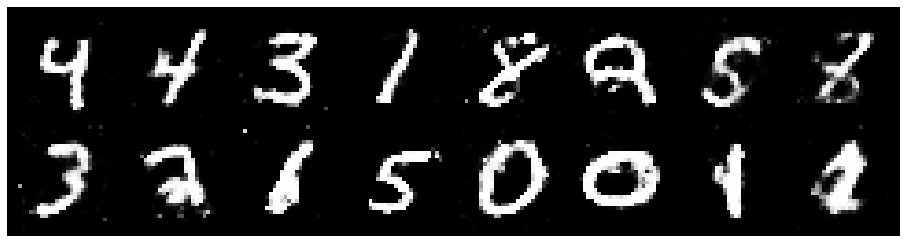

Epoch: [114/200], Batch Num: [300/600]
Discriminator Loss: 1.2772, Generator Loss: 1.0040
D(x): 0.5397, D(G(z)): 0.4109


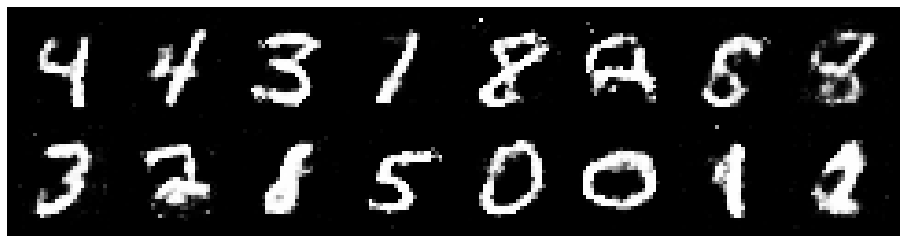

Epoch: [114/200], Batch Num: [400/600]
Discriminator Loss: 1.1646, Generator Loss: 0.9286
D(x): 0.6051, D(G(z)): 0.4275


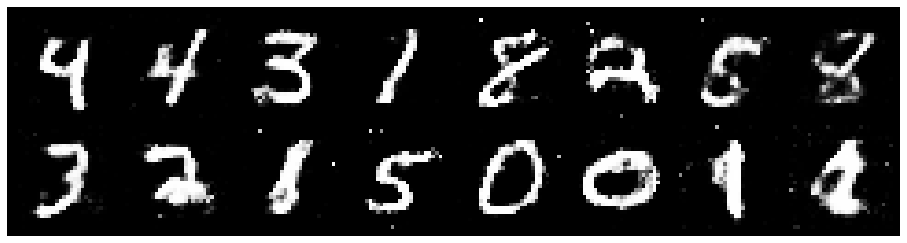

Epoch: [114/200], Batch Num: [500/600]
Discriminator Loss: 1.2864, Generator Loss: 1.0232
D(x): 0.5615, D(G(z)): 0.4367


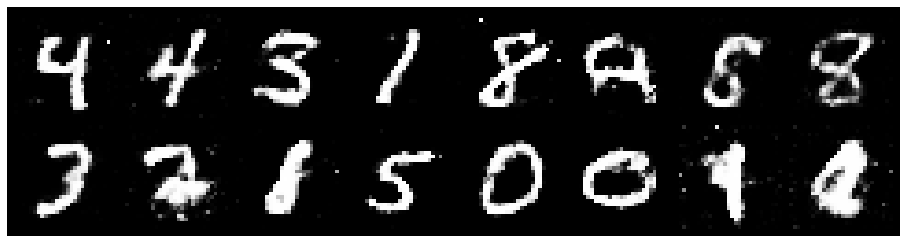

Epoch: [115/200], Batch Num: [0/600]
Discriminator Loss: 1.3373, Generator Loss: 0.9776
D(x): 0.5423, D(G(z)): 0.4558


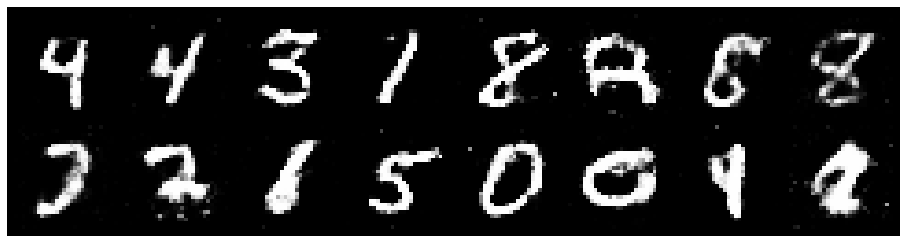

Epoch: [115/200], Batch Num: [100/600]
Discriminator Loss: 1.2184, Generator Loss: 0.8211
D(x): 0.5532, D(G(z)): 0.4154


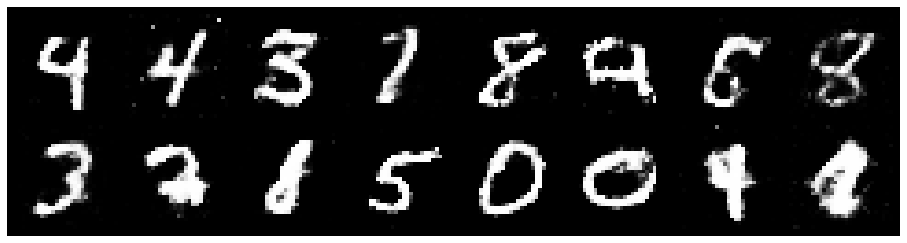

Epoch: [115/200], Batch Num: [200/600]
Discriminator Loss: 1.3263, Generator Loss: 0.8570
D(x): 0.5739, D(G(z)): 0.4711


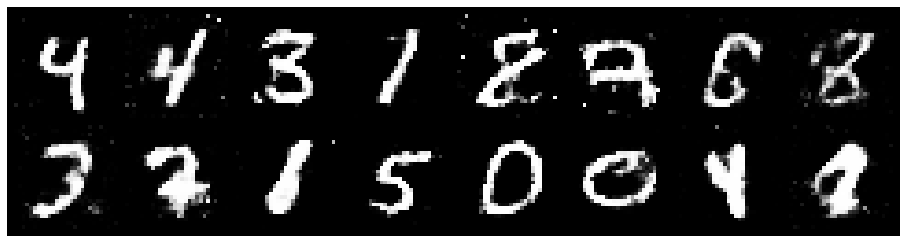

Epoch: [115/200], Batch Num: [300/600]
Discriminator Loss: 1.1991, Generator Loss: 1.0088
D(x): 0.5605, D(G(z)): 0.3996


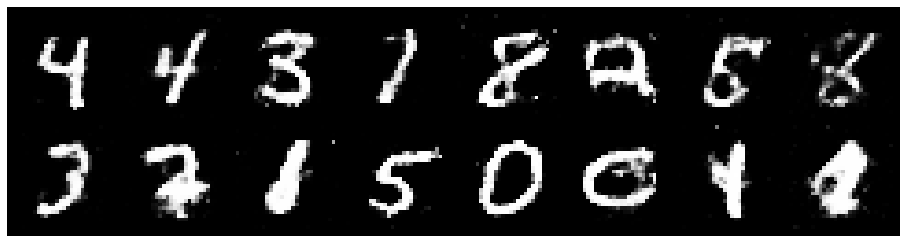

Epoch: [115/200], Batch Num: [400/600]
Discriminator Loss: 1.3582, Generator Loss: 0.9130
D(x): 0.5333, D(G(z)): 0.4407


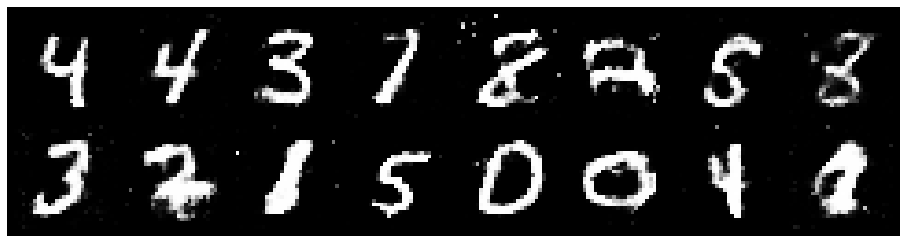

Epoch: [115/200], Batch Num: [500/600]
Discriminator Loss: 1.2138, Generator Loss: 0.9037
D(x): 0.5745, D(G(z)): 0.4384


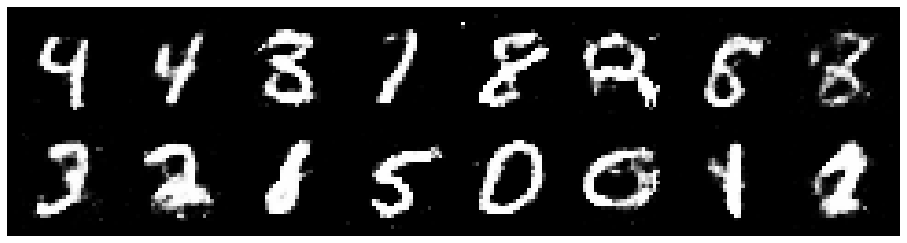

Epoch: [116/200], Batch Num: [0/600]
Discriminator Loss: 1.2968, Generator Loss: 0.9405
D(x): 0.5807, D(G(z)): 0.4441


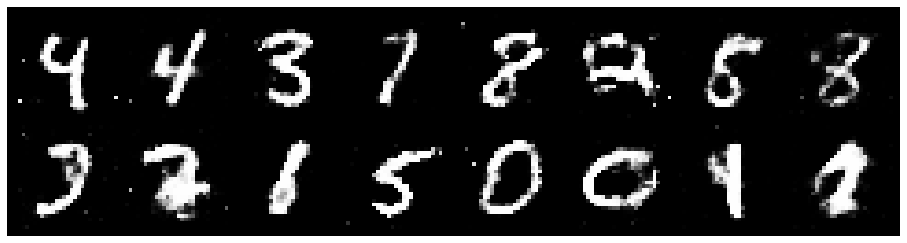

Epoch: [116/200], Batch Num: [100/600]
Discriminator Loss: 1.3043, Generator Loss: 1.0575
D(x): 0.5438, D(G(z)): 0.4243


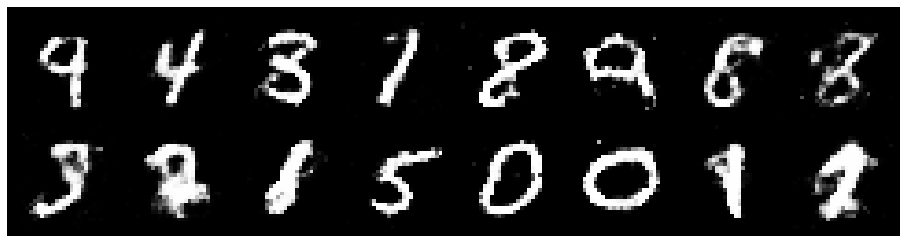

Epoch: [116/200], Batch Num: [200/600]
Discriminator Loss: 1.1385, Generator Loss: 1.1459
D(x): 0.6036, D(G(z)): 0.4050


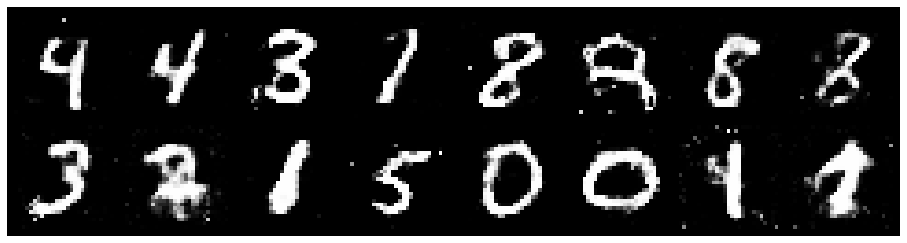

Epoch: [116/200], Batch Num: [300/600]
Discriminator Loss: 1.1819, Generator Loss: 1.0086
D(x): 0.5545, D(G(z)): 0.3953


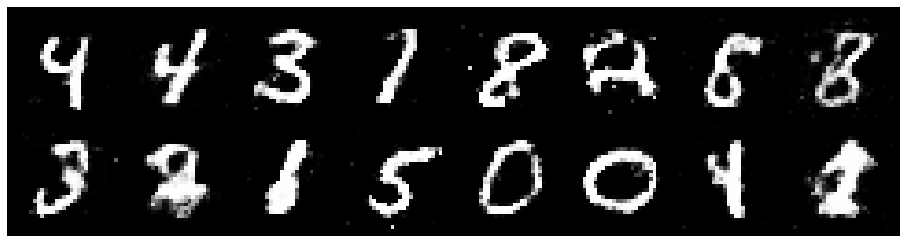

Epoch: [116/200], Batch Num: [400/600]
Discriminator Loss: 1.2575, Generator Loss: 0.8859
D(x): 0.5457, D(G(z)): 0.4217


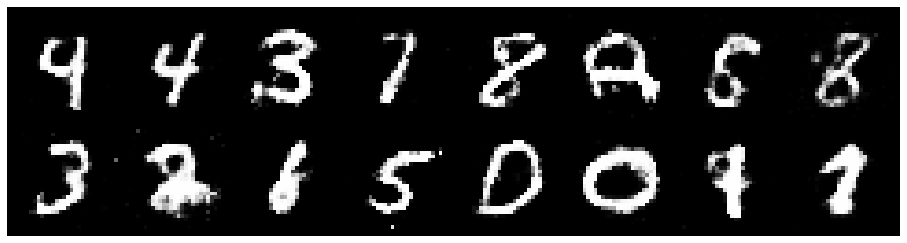

Epoch: [116/200], Batch Num: [500/600]
Discriminator Loss: 1.2230, Generator Loss: 0.9326
D(x): 0.5691, D(G(z)): 0.4239


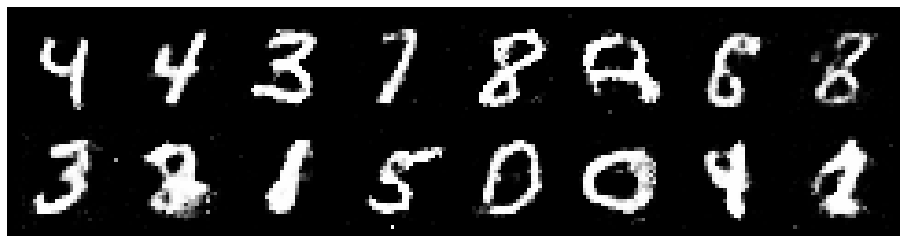

Epoch: [117/200], Batch Num: [0/600]
Discriminator Loss: 1.3248, Generator Loss: 0.9628
D(x): 0.5761, D(G(z)): 0.4706


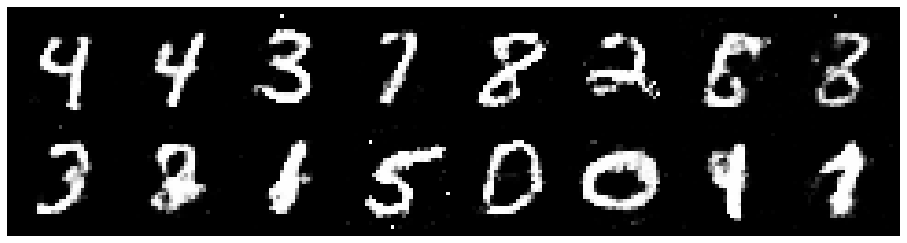

Epoch: [117/200], Batch Num: [100/600]
Discriminator Loss: 1.2588, Generator Loss: 0.8927
D(x): 0.5612, D(G(z)): 0.4494


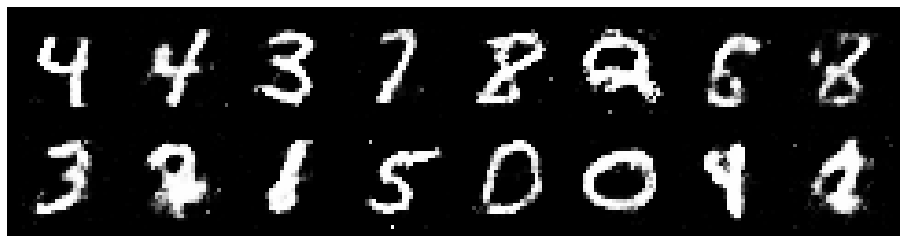

Epoch: [117/200], Batch Num: [200/600]
Discriminator Loss: 1.2368, Generator Loss: 0.9573
D(x): 0.5531, D(G(z)): 0.4245


KeyboardInterrupt: ignored

In [ ]:
# Create manager instance
manager = Manager(model_name='VGAN', data_name='MNIST')
# Total number of epochs to train
num_epochs = 200

for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        manager.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            manager.snapshot(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            manager.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )